In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (12,7)
import scipy
from scipy import stats
from scipy.stats import ttest_ind
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [2]:
data = pd.read_csv("D:/Machine Learning/Project/HousePrices.csv")

In [3]:
data.sample(10)

,Id,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
1439,1440,60,RL,80.0,11584,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2007,WD,Normal,197000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
223,224,20,RL,70.0,10500,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2009,WD,Abnorml,97000
370,371,60,RL,NaN,8121,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2006,WD,Normal,172400
410,411,20,RL,68.0,9571,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,COD,Abnorml,60000
1902,948,20,RL,85.0,14536,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2007,WD,Normal,270000
2050,924,120,RL,63.0,8012,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,193000
1446,1447,20,RL,NaN,26142,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,157900
1656,1657,70,RL,104.0,9021,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,191000
1873,919,60,RL,103.0,13125,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,11,2007,WD,Normal,238000


In [4]:
data.drop(['Id'],axis = 1,inplace = True)

In [5]:
data.shape

(2073, 80)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          1753 non-null   float64
 3   LotArea              2073 non-null   int64  
 4   Road_Type            2073 non-null   object 
 5   Alley                129 non-null    object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

In [7]:
data = data.rename(columns = {'1stFlrSF' : 'FirstFlrSF', '2ndFlrSF' : 'SecondFlrSF', '3SsnPorch' : 'ThrSsnPorch'})

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          1753 non-null   float64
 3   LotArea              2073 non-null   int64  
 4   Road_Type            2073 non-null   object 
 5   Alley                129 non-null    object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

In [9]:
data.describe()

,Dwell_Type,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,ThrSsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Property_Sale_Price
count,2073.000000,1753.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2059.000000,2073.000000,2073.000000,...,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000
mean,60.556199,72.056475,10717.853353,6.233478,5.835022,1969.445731,1986.617463,101.875668,437.949349,49.219489,...,94.168837,46.035697,21.029908,2.979257,14.552340,2.299083,39.736614,6.287506,2007.851905,180967.284129
std,159.924810,27.987475,9215.982306,1.517115,1.360214,30.222647,20.432694,179.169217,448.051119,165.621465,...,129.072113,64.768713,59.569928,26.817218,54.099626,37.411031,429.819512,2.690130,1.329705,78666.411112
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7620.000000,5.000000,5.000000,1950.000000,1970.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,50.000000,70.000000,9492.000000,6.000000,5.000000,1971.000000,1995.000000,0.000000,381.000000,0.000000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163990.000000
75%,70.000000,83.000000,11601.000000,7.000000,7.000000,1999.000000,2004.000000,161.500000,708.000000,0.000000,...,168.000000,67.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,7080.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2023.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [10]:
data.describe(include='O')

,Zone_Class,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,2073,2073,129,2073,2073,2073,2073,2073,2073,2073,...,1960,1960,1960,1960,2073,8,404,80,2073,2073
unique,5,2,2,4,4,2,5,3,25,9,...,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1611,2063,72,1300,1854,2070,1481,1958,317,1794,...,1252,857,1870,1885,1913,4,233,74,1797,1695


In [11]:
# Check which variables have missing values

data.isnull().sum()

Dwell_Type               0
Zone_Class               0
LotFrontage            320
LotArea                  0
Road_Type                0
                      ... 
MoSold                   0
YrSold                   0
SaleType                 0
SaleCondition            0
Property_Sale_Price      0
Length: 80, dtype: int64

Text(0.5, 1.0, 'Heat Map of Nulls')

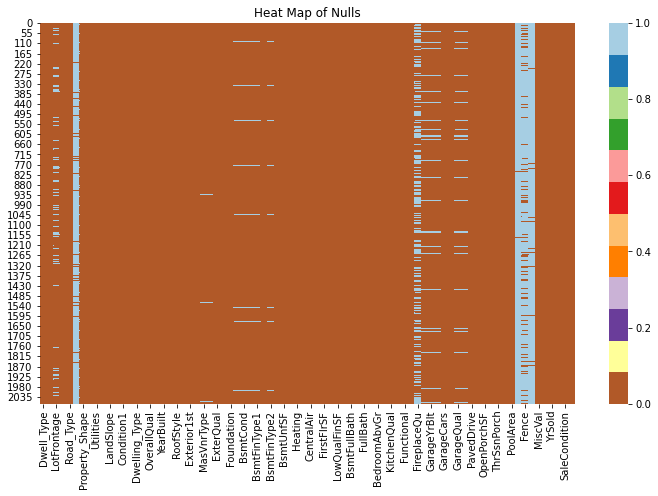

In [12]:
sns.heatmap(data.isnull(), cmap = 'Paired_r')
plt.title('Heat Map of Nulls')

# 

# 

# 

# Response / Target Variable

# Property_Sale_Price

In [13]:
data.Property_Sale_Price.isnull().sum()

0

In [14]:
data.Property_Sale_Price.describe()

count      2073.000000
mean     180967.284129
std       78666.411112
min       34900.000000
25%      130000.000000
50%      163990.000000
75%      214000.000000
max      755000.000000
Name: Property_Sale_Price, dtype: float64

In [15]:
data.Property_Sale_Price.value_counts()

140000    31
135000    28
110000    23
160000    22
155000    20
          ..
412500     1
306000     1
195400     1
283463     1
250580     1
Name: Property_Sale_Price, Length: 663, dtype: int64

In [16]:
data.Property_Sale_Price.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of Property_Sale_Price')

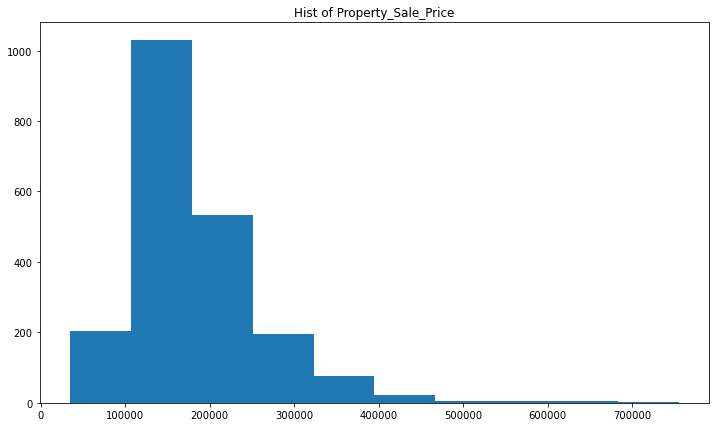

In [17]:
plt.hist(data.Property_Sale_Price)
plt.title('Hist of Property_Sale_Price')

Text(0.5, 1.0, 'Normality of Property_Sale_Price')

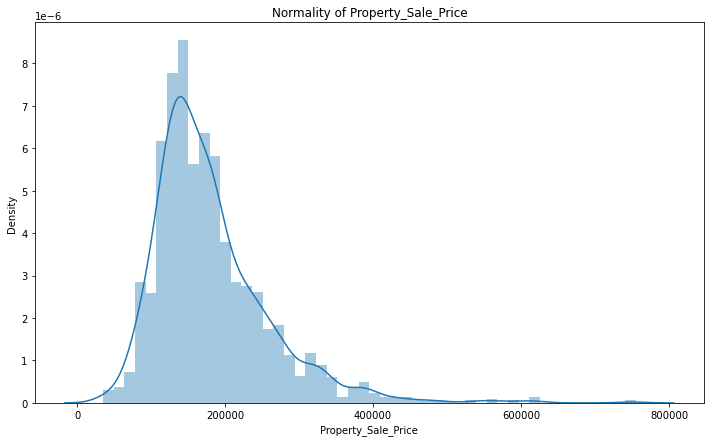

In [18]:
sns.distplot(data.Property_Sale_Price)
plt.title('Normality of Property_Sale_Price')

Text(0.5, 1.0, 'Count plot of Property_Sale_Price')

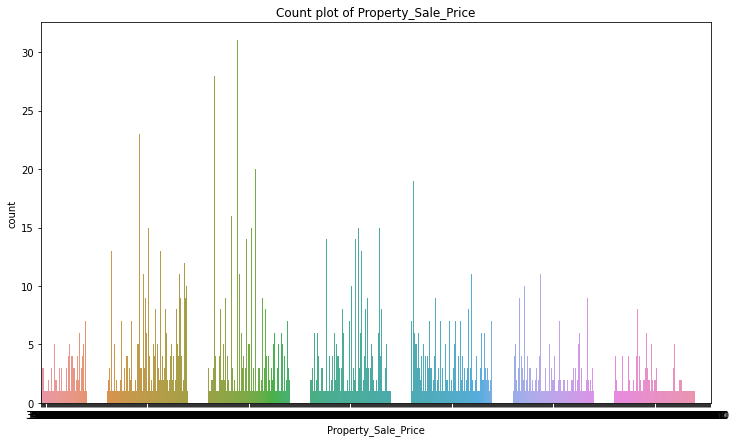

In [19]:
sns.countplot(data.Property_Sale_Price)
plt.title('Count plot of Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of Property_Sale_Price')

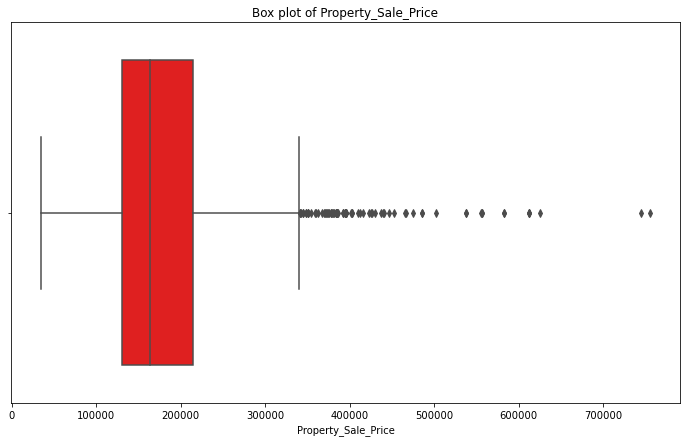

In [20]:
sns.boxplot(x = data.Property_Sale_Price, data =data, color = 'r')
plt.title('Box plot of Property_Sale_Price')

In [21]:
IQR = data.Property_Sale_Price.quantile(.75) - data.Property_Sale_Price.quantile(.25)
IQR

84000.0

In [22]:
upper_limit = data.Property_Sale_Price.quantile(.75) + (1.5*IQR)
upper_limit

340000.0

In [23]:
lower_limit = data.Property_Sale_Price.quantile(.25) - (1.5*IQR)
lower_limit

4000.0

In [24]:
len(data.Property_Sale_Price[data.Property_Sale_Price > upper_limit])

78

In [25]:
len(data.Property_Sale_Price[data.Property_Sale_Price < lower_limit])

0

In [26]:
for i in np.arange(upper_limit,800000,100000):
    outliers = len(data.Property_Sale_Price[data.Property_Sale_Price > i])
    print('At a limit of :', i, 'There are', outliers, 'outliers')

At a limit of : 340000.0 There are 78 outliers
At a limit of : 440000.0 There are 21 outliers
At a limit of : 540000.0 There are 11 outliers
At a limit of : 640000.0 There are 2 outliers
At a limit of : 740000.0 There are 2 outliers


In [27]:
data['Property_Sale_Price'] = np.where(data['Property_Sale_Price'] > upper_limit, upper_limit, data['Property_Sale_Price'])

Text(0.5, 1.0, 'Box plot of Property_Sale_Price')

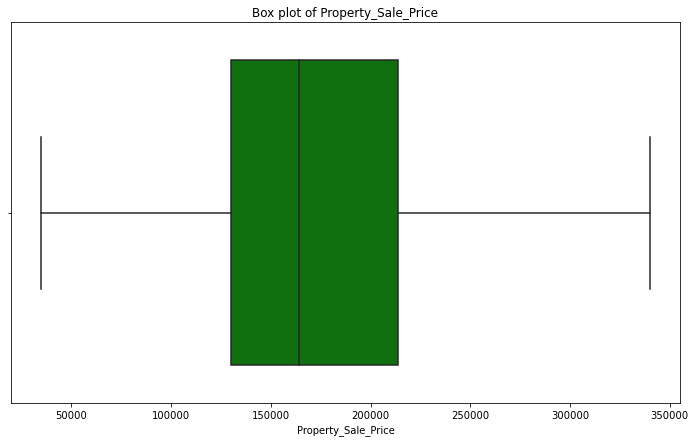

In [28]:
sns.boxplot(x = data.Property_Sale_Price, data =data, color = 'g')
plt.title('Box plot of Property_Sale_Price')

Text(0.5, 1.0, 'Normality of Property_Sale_Price')

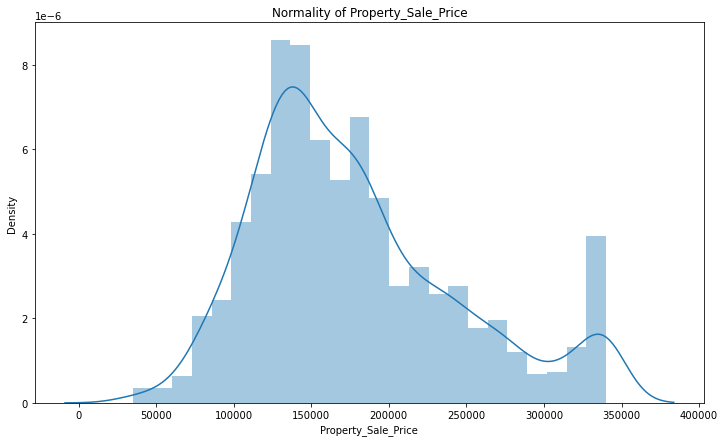

In [29]:
sns.distplot(data.Property_Sale_Price)
plt.title('Normality of Property_Sale_Price')

Text(0.5, 1.0, 'Violinplot Of Property_Sale_Price')

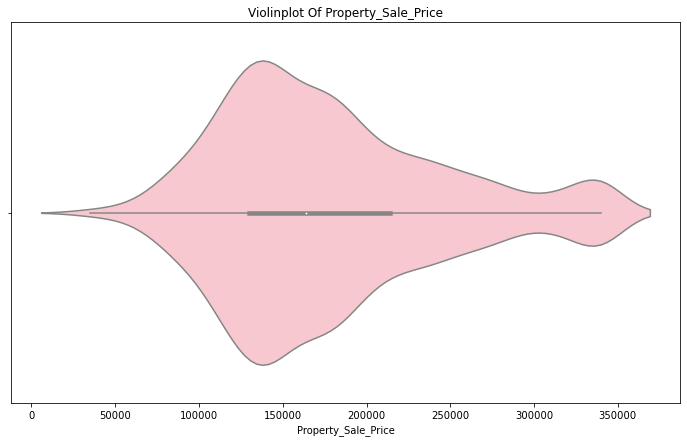

In [30]:
sns.violinplot(data.Property_Sale_Price, color = 'pink')
plt.title('Violinplot Of Property_Sale_Price')

# 

# 

# 0) Dwell_Type

In [31]:
data.Dwell_Type.isnull().sum()

0

In [32]:
data.Dwell_Type.describe()

count    2073.000000
mean       60.556199
std       159.924810
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max      7080.000000
Name: Dwell_Type, dtype: float64

In [33]:
data.Dwell_Type.value_counts()

20      722
60      431
50      205
30      133
120     114
90       91
80       78
160      78
70       77
190      42
85       34
75       19
180      14
150      13
45       13
40        7
303       1
7080      1
Name: Dwell_Type, dtype: int64

In [34]:
data["Dwell_Type"]=data["Dwell_Type"].replace([303,7080],[30,70])

In [35]:
data["Dwell_Type"].value_counts()

20     722
60     431
50     205
30     134
120    114
90      91
70      78
80      78
160     78
190     42
85      34
75      19
180     14
150     13
45      13
40       7
Name: Dwell_Type, dtype: int64

In [36]:
data["Dwell_Type"].value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Dwell_Type')

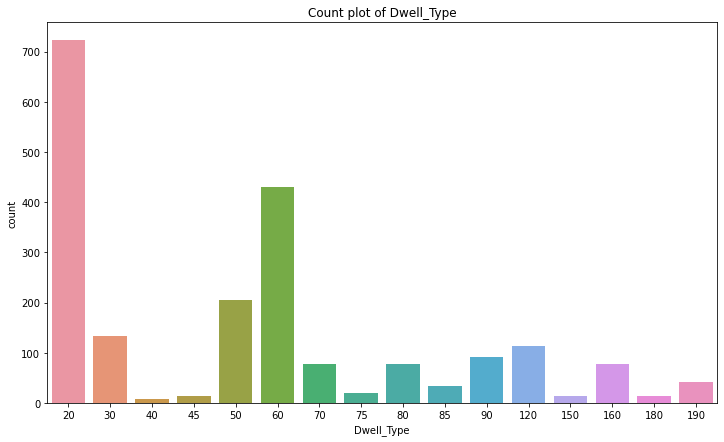

In [37]:
sns.countplot(data.Dwell_Type)
plt.title('Count plot of Dwell_Type')

In [38]:
data.groupby("Dwell_Type")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Dwell_Type,,,,,,,,
20,722.0,180192.246537,66834.894527,35311.0,132000.0,159250.0,217875.0,340000.0
30,134.0,124344.089552,59968.092222,34900.0,86000.0,109700.0,136825.0,340000.0
40,7.0,177600.000000,70304.125057,79500.0,133000.0,152000.0,242850.0,260000.0
45,13.0,110961.538462,21171.306780,76000.0,96500.0,109500.0,132000.0,139400.0
50,205.0,147919.863415,57580.464374,37900.0,114500.0,135000.0,164000.0,340000.0
60,431.0,226878.104408,60349.414027,35311.0,180500.0,214000.0,267500.0,340000.0
70,78.0,170636.205128,55594.426663,40000.0,130500.0,161000.0,195500.0,340000.0
75,19.0,180131.578947,73441.178675,101000.0,123250.0,163000.0,205750.0,340000.0
80,78.0,170040.769231,41372.951945,107000.0,145000.0,165250.0,180000.0,340000.0


In [39]:
mod = ols('Property_Sale_Price ~ Dwell_Type', data = data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq          F    PR(>F)
Dwell_Type     1.0  5.534241e+10  5.534241e+10  12.386042  0.000442
Residual    2071.0  9.253492e+12  4.468127e+09        NaN       NaN


In [40]:
tukey_Dwell_Type = pairwise_tukeyhsd(data.Property_Sale_Price, data.Dwell_Type, alpha = 0.05)
print(tukey_Dwell_Type)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
    20     30   -55848.157  0.001  -74810.1603 -36886.1536   True
    20     40   -2592.2465    0.9  -79154.4599  73969.9668  False
    20     45  -69230.7081 0.0028 -125642.7382 -12818.6779   True
    20     50  -32272.3831  0.001  -48226.1291 -16318.6372   True
    20     60   46685.8579  0.001   34414.9766  58956.7392   True
    20     70   -9556.0414    0.9  -33582.9241  14470.8413  False
    20     75     -60.6676    0.9  -46913.0888  46791.7537  False
    20     80  -10151.4773    0.9    -34178.36  13875.4054  False
    20     85  -33624.5995 0.0844  -69001.6136   1752.4147  False
    20     90  -43019.4224  0.001  -65444.0021 -20594.8426   True
    20    120   20274.0166 0.0512     -42.5562  40590.5894  False
    20    150   10580.8304    0.9  -45831.1998  66992.8605  False
    20    

In [41]:
data['Dwell_Type'].replace(40, 20, inplace = True)
data['Dwell_Type'].replace(70, 20, inplace = True)
data['Dwell_Type'].replace(75, 20, inplace = True)
data['Dwell_Type'].replace(80, 20, inplace = True)
data['Dwell_Type'].replace(150, 20, inplace = True)
data['Dwell_Type'].replace(45, 30, inplace = True)
data['Dwell_Type'].replace(180, 30, inplace = True)
data['Dwell_Type'].replace(190, 30, inplace = True)
data['Dwell_Type'].replace(85, 50, inplace = True)
data['Dwell_Type'].replace(90, 50, inplace = True)
data['Dwell_Type'].replace(160, 50, inplace = True)

In [42]:
data["Dwell_Type"].value_counts()

20     917
60     431
50     408
30     203
120    114
Name: Dwell_Type, dtype: int64

In [43]:
data["Dwell_Type"].value_counts().sum()

2073

In [44]:
mod = ols('Property_Sale_Price ~ Dwell_Type', data = data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq          F        PR(>F)
Dwell_Type     1.0  2.588866e+11  2.588866e+11  59.243897  2.140789e-14
Residual    2071.0  9.049948e+12  4.369844e+09        NaN           NaN


In [45]:
tukey_Dwell_Type = pairwise_tukeyhsd(data.Property_Sale_Price, data.Dwell_Type, alpha = 0.05)
print(tukey_Dwell_Type)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
    20     30 -55371.9353  0.001 -67812.1704 -42931.7002   True
    20     50 -34845.8199  0.001   -44390.15 -25301.4897   True
    20     60  48233.2233  0.001  38866.7973  57599.6493   True
    20    120   21821.382 0.0018   5893.9961  37748.7679   True
    30     50  20526.1155  0.001   6751.0152  34301.2157   True
    30     60 103605.1586  0.001  89952.7198 117257.5974   True
    30    120  77193.3173  0.001  58422.5749  95964.0598   True
    50     60  83079.0431  0.001  72000.9624  94157.1239   True
    50    120  56667.2019  0.001  39676.7469  73657.6568   True
    60    120 -26411.8413  0.001 -43303.0004  -9520.6821   True
---------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Dwell_Type')

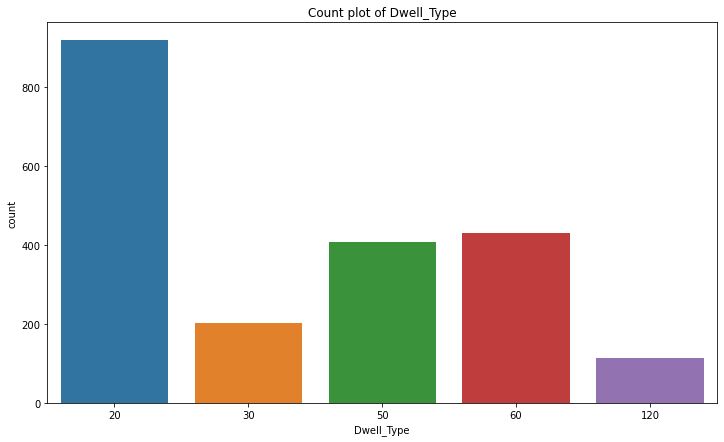

In [46]:
sns.countplot(data.Dwell_Type)
plt.title('Count plot of Dwell_Type')

Text(0.5, 1.0, 'Cat plot of Dwell_Type vs Property_Sale_Price')

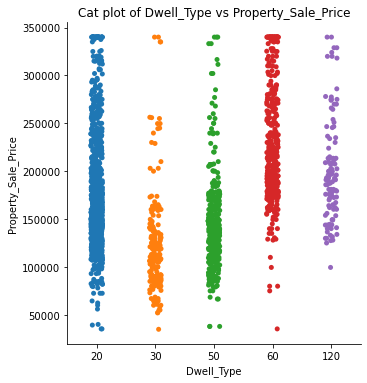

In [47]:
sns.catplot(x = data.Dwell_Type , y = data.Property_Sale_Price, data = data)
plt.title('Cat plot of Dwell_Type vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot of Dwell_Type vs Property_Sale_Price')

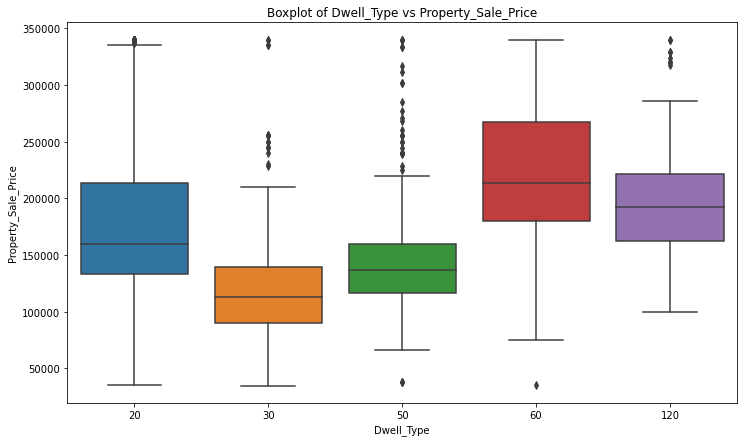

In [48]:
sns.boxplot(x = data.Dwell_Type , y = data.Property_Sale_Price, data = data)
plt.title('Boxplot of Dwell_Type vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 1) Zone_Class

In [49]:
data.Zone_Class.isnull().sum()

0

In [50]:
data.Zone_Class.value_counts()

RL         1611
RM          324
FV          102
RH           22
C (all)      14
Name: Zone_Class, dtype: int64

In [51]:
data.Zone_Class.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Zone_Class')

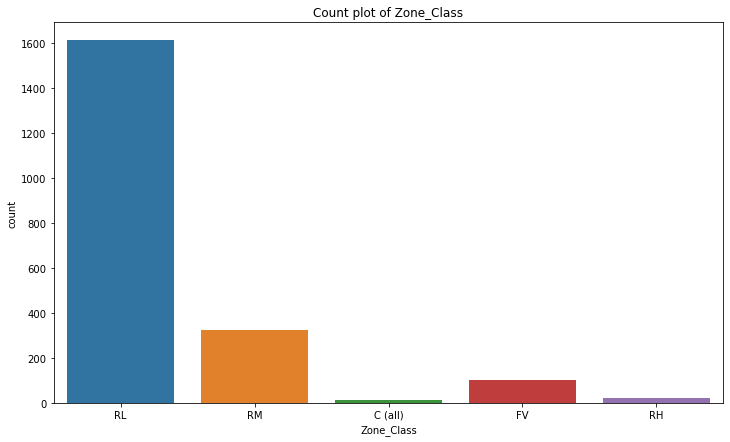

In [52]:
sns.countplot(data.Zone_Class)
plt.title('Count plot of Zone_Class')

In [53]:
data.groupby("Zone_Class")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Zone_Class,,,,,,,,
C (all),14.0,70135.857143,31906.068856,34900.0,36483.25,74700.0,85000.0,133900.0
FV,102.0,214299.794118,55465.164430,130000.0,173733.00,199900.0,250000.0,340000.0
RH,22.0,134719.727273,31285.377837,76000.0,119900.00,144000.0,145000.0,200000.0
RL,1611.0,186499.616387,65906.057970,39300.0,138000.00,174000.0,224250.0,340000.0
RM,324.0,129303.089506,48130.787063,37900.0,102750.00,122000.0,143000.0,340000.0


In [54]:
mod = ols('Property_Sale_Price ~ Zone_Class', data = data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq          F        PR(>F)
Zone_Class     4.0  1.222868e+12  3.057171e+11  78.187693  7.820516e-62
Residual    2068.0  8.085966e+12  3.910041e+09        NaN           NaN


In [55]:
t_Zone_Class = pairwise_tukeyhsd(data.Property_Sale_Price, data.Zone_Class)
print(t_Zone_Class)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1 group2   meandiff  p-adj     lower        upper    reject
-----------------------------------------------------------------
C (all)     FV  144163.937  0.001   95506.9159 192820.9581   True
C (all)     RH  64583.8701 0.0215    6218.3288 122949.4115   True
C (all)     RL 116363.7592  0.001   70539.4929 162188.0256   True
C (all)     RM  59167.2324 0.0049    12565.458 105769.0068   True
     FV     RH -79580.0668  0.001 -119711.0724 -39449.0613   True
     FV     RL -27800.1777  0.001  -45230.7422 -10369.6133   True
     FV     RM -84996.7046  0.001 -104379.3404 -65614.0689   True
     RH     RL  51779.8891 0.0011   15134.8991  88424.8791   True
     RH     RM  -5416.6378    0.9  -43029.3654  32196.0899  False
     RL     RM -57196.5269  0.001  -67590.9606 -46802.0931   True
-----------------------------------------------------------------


In [56]:
data['Zone_Class'].replace('RH', 'RM', inplace = True)

In [57]:
data.Zone_Class.value_counts()

RL         1611
RM          346
FV          102
C (all)      14
Name: Zone_Class, dtype: int64

In [58]:
data.Zone_Class.value_counts().sum()

2073

In [59]:
mod = ols('Property_Sale_Price ~ Zone_Class', data = data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F        PR(>F)
Zone_Class     3.0  1.222264e+12  4.074213e+11  104.241323  7.595204e-63
Residual    2069.0  8.086570e+12  3.908444e+09         NaN           NaN


In [60]:
t_Zone_Class = pairwise_tukeyhsd(data.Property_Sale_Price, data.Zone_Class)
print(t_Zone_Class)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1 group2   meandiff  p-adj     lower        upper    reject
-----------------------------------------------------------------
C (all)     FV  144163.937  0.001   98350.8216 189977.0523   True
C (all)     RL 116363.7592  0.001   73217.8298 159509.6887   True
C (all)     RM  59511.6429 0.0028   15691.4668 103331.8189   True
     FV     RL -27800.1777  0.001  -44211.9605  -11388.395   True
     FV     RM -84652.2941  0.001 -102762.6009 -66541.9874   True
     RL     RM -56852.1164  0.001  -66376.4484 -47327.7843   True
-----------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Zone_Class')

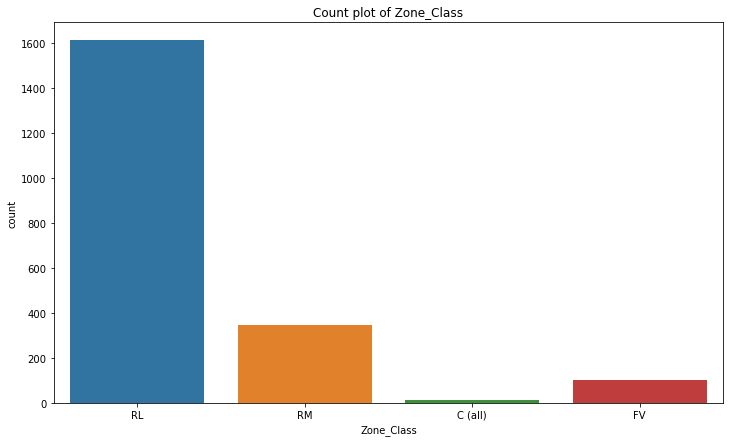

In [61]:
sns.countplot(data.Zone_Class)
plt.title('Count plot of Zone_Class')

Text(0.5, 1.0, 'Cat plot of Zone_Class vs Property_Sale_Price')

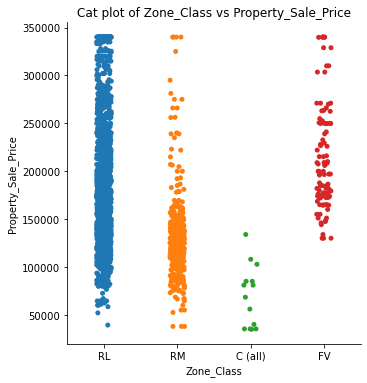

In [62]:
sns.catplot('Zone_Class', 'Property_Sale_Price', data = data)
plt.title('Cat plot of Zone_Class vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot of Zone_Class vs Property_Sale_Price')

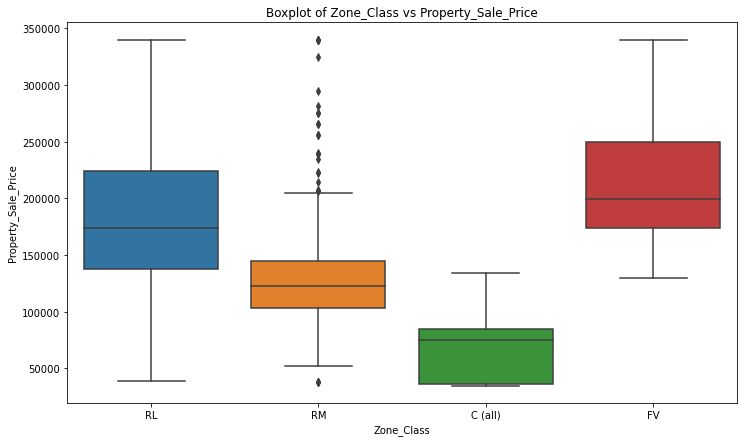

In [63]:
sns.boxplot('Zone_Class', 'Property_Sale_Price', data = data)
plt.title('Boxplot of Zone_Class vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 2) LotFrontage

In [64]:
data.LotFrontage.isnull().sum()

320

In [65]:
data.LotFrontage.dtype

dtype('float64')

In [66]:
data.LotFrontage.sample(10)

1787     32.0
1304     32.0
1106    114.0
1361    124.0
1194     80.0
1274     53.0
1662     90.0
1336     87.0
10       70.0
1070     72.0
Name: LotFrontage, dtype: float64

In [67]:
data['LotFrontage'] = data["LotFrontage"].fillna(data['LotFrontage'].median())

In [68]:
data.LotFrontage.isnull().sum()

0

In [69]:
data.LotFrontage.describe()

count    2073.000000
mean       71.739026
std        25.746423
min        21.000000
25%        60.000000
50%        70.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [70]:
data.LotFrontage.value_counts()

70.0     411
60.0     181
80.0      89
75.0      73
50.0      72
        ... 
138.0      1
137.0      1
150.0      1
112.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64

In [71]:
data.LotFrontage.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of LotFrontage')

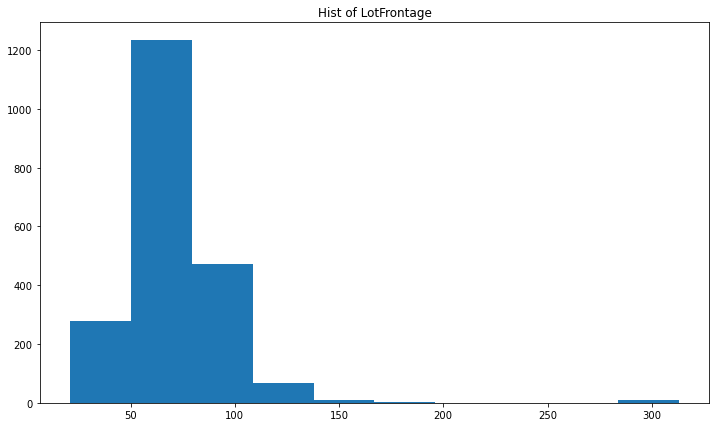

In [72]:
plt.hist(data.LotFrontage)
plt.title('Hist of LotFrontage')

Text(0.5, 1.0, 'Normality of LotFrontage')

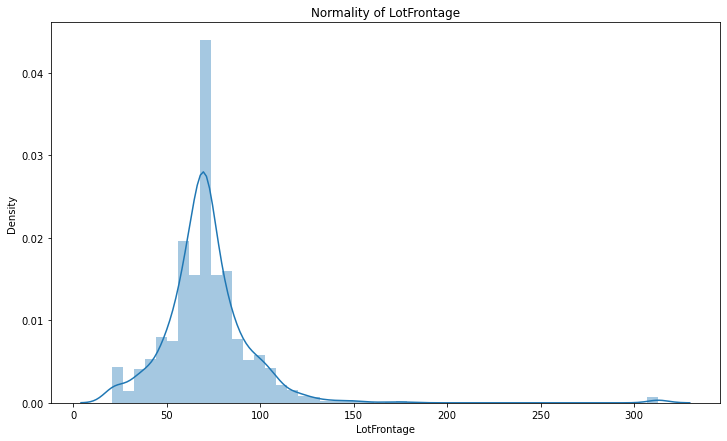

In [73]:
sns.distplot(data.LotFrontage)
plt.title('Normality of LotFrontage')

Text(0.5, 1.0, 'Count plot of LotFrontage')

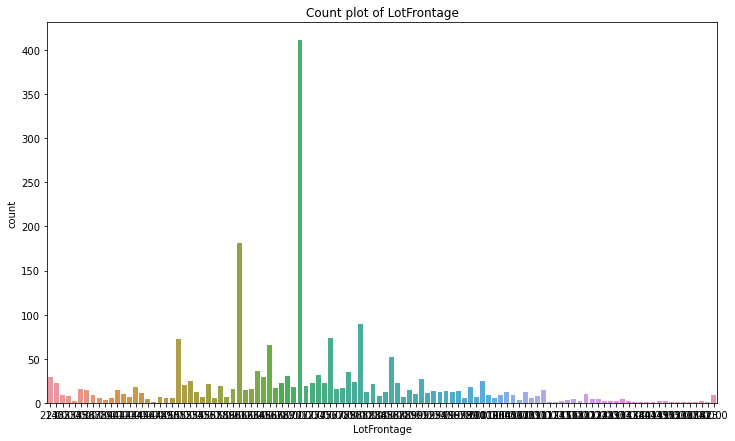

In [74]:
sns.countplot(data.LotFrontage)
plt.title('Count plot of LotFrontage')

Text(0.5, 1.0, 'Box plot of LotFrontage')

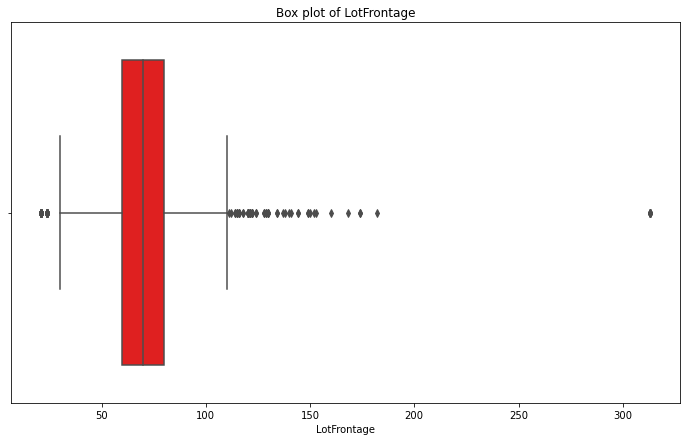

In [75]:
sns.boxplot(x = data.LotFrontage, data =data, color = 'r')
plt.title('Box plot of LotFrontage')

In [76]:
IQR = data.LotFrontage.quantile(.75) - data.LotFrontage.quantile(.25)
IQR

20.0

In [77]:
IQR = data.LotFrontage.quantile(.75) - data.LotFrontage.quantile(.25)
IQR

110.0

In [78]:
lower_limit = data.LotFrontage.quantile(.25) - (1.5*IQR)
lower_limit

30.0

In [79]:
len(data.LotFrontage[data.LotFrontage > upper_limit])

68

In [80]:
len(data.LotFrontage[data.LotFrontage < lower_limit])

52

In [81]:
for i in np.arange(upper_limit,200,40):
    outliers = len(data.LotFrontage[data.LotFrontage > i])
    print('At a limit of :', i, 'There are', outliers, 'outliers')

At a limit of : 110.0 There are 68 outliers
At a limit of : 150.0 There are 16 outliers
At a limit of : 190.0 There are 9 outliers


In [82]:
for i in np.arange(lower_limit,10,-10):
    outliers = len(data.LotFrontage[data.LotFrontage < i])
    print('At a limit of :', i, 'There are', outliers, 'outliers')

At a limit of : 30.0 There are 52 outliers
At a limit of : 20.0 There are 0 outliers


In [83]:
data['LotFrontage'] = np.where(data['LotFrontage'] > upper_limit, upper_limit, data['LotFrontage'])

In [84]:
data['LotFrontage'] = np.where(data['LotFrontage'] < lower_limit, lower_limit, data['LotFrontage'])

Text(0.5, 1.0, 'Box plot of LotFrontage')

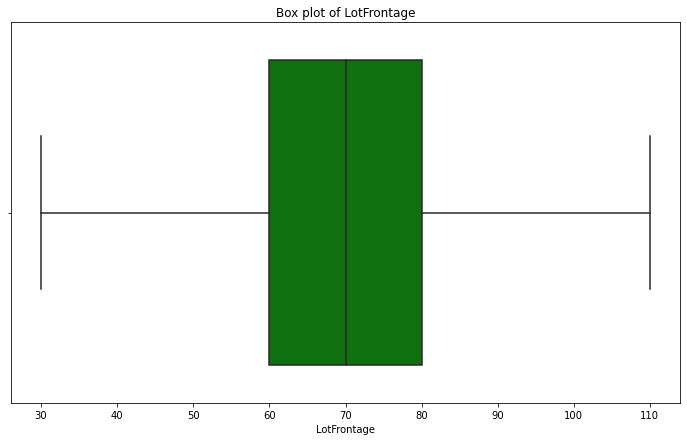

In [85]:
sns.boxplot(x = data.LotFrontage, data =data, color = 'g')
plt.title('Box plot of LotFrontage')

Text(0.5, 1.0, 'Dist plot of LotFrontage')

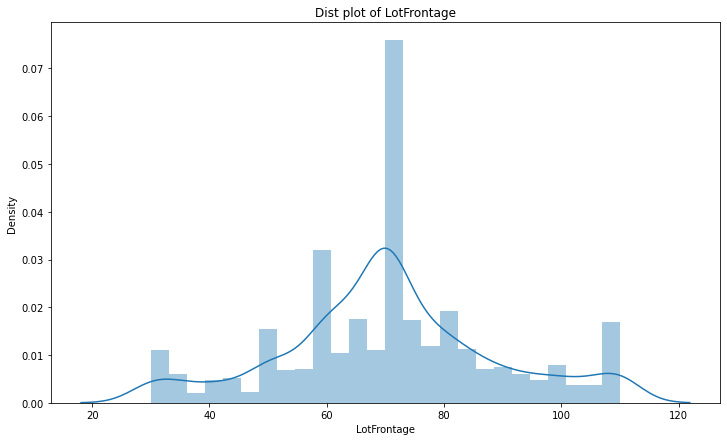

In [86]:
sns.distplot(data.LotFrontage)
plt.title('Dist plot of LotFrontage')

In [87]:
np.corrcoef(data.LotFrontage, data.Property_Sale_Price)

array([[1.        , 0.32062379],
       [0.32062379, 1.        ]])

Text(0.5, 1.0, 'Scatter plot of LotFrontage vs Property_Sale_Price')

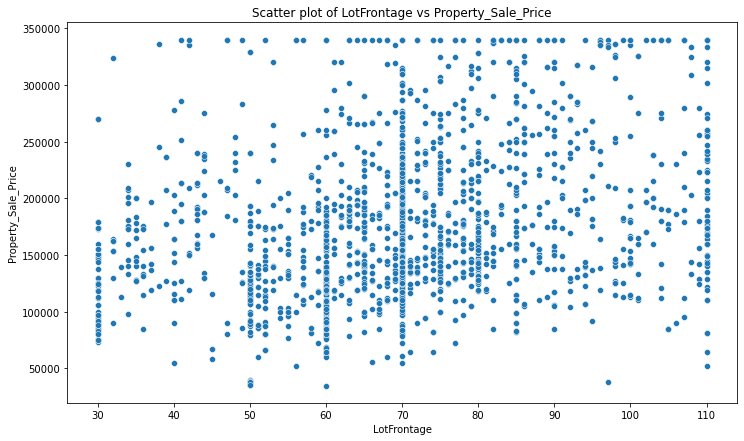

In [88]:
sns.scatterplot(x = data['LotFrontage'], y = data.Property_Sale_Price, data = data )
plt.xlabel('LotFrontage')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter plot of LotFrontage vs Property_Sale_Price')

**Not good predictor**

# 

# 

# 3) LotArea

In [89]:
data.LotArea.isnull().sum()

0

In [90]:
data.LotArea.describe()

count      2073.000000
mean      10717.853353
std        9215.982306
min        1300.000000
25%        7620.000000
50%        9492.000000
75%       11601.000000
max      215245.000000
Name: LotArea, dtype: float64

In [91]:
data.LotArea.value_counts()

7200     28
9600     25
9000     20
6000     19
8400     15
         ..
7685      1
11777     1
17920     1
14720     1
8190      1
Name: LotArea, Length: 1367, dtype: int64

In [92]:
data.LotArea.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of LotArea')

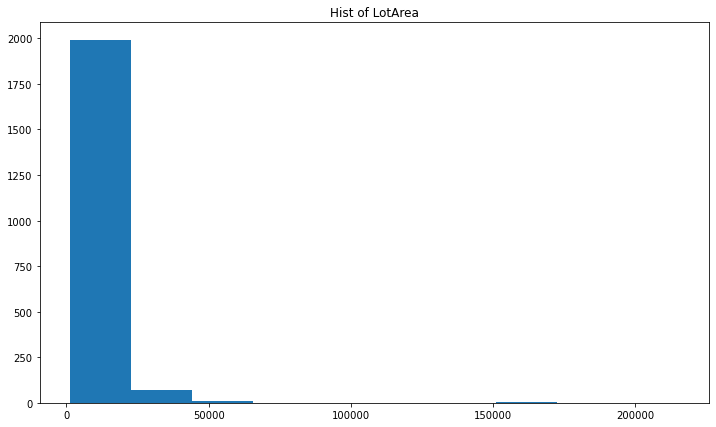

In [93]:
plt.hist(data.LotArea)
plt.title('Hist of LotArea')

Text(0.5, 1.0, 'Normality of LotArea')

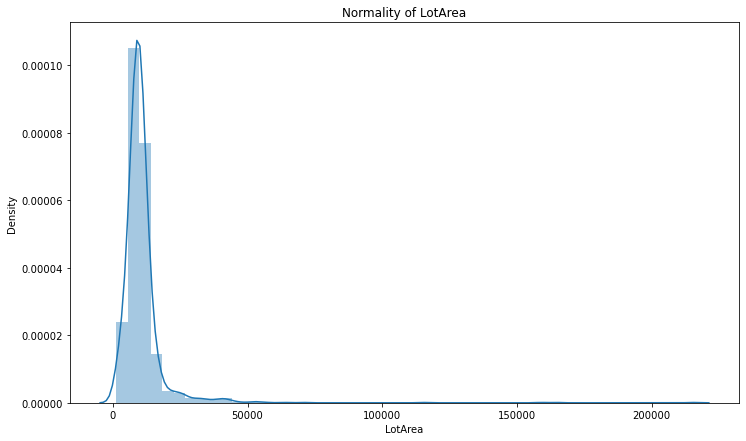

In [94]:
sns.distplot(data.LotArea)
plt.title('Normality of LotArea')

Text(0.5, 1.0, 'Count plot of LotArea')

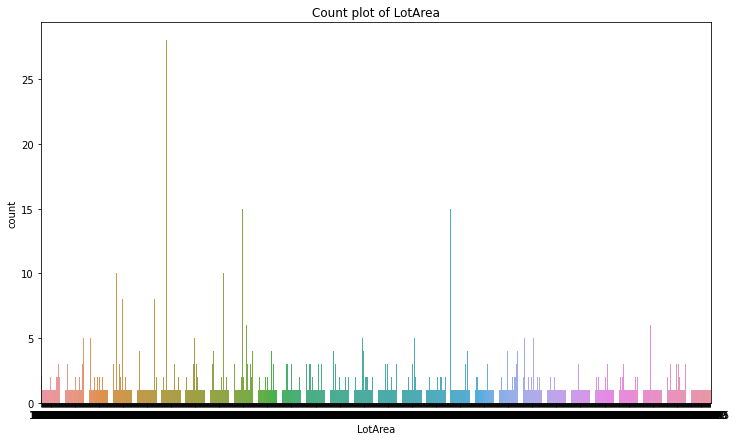

In [95]:
sns.countplot(data.LotArea)
plt.title('Count plot of LotArea')

Text(0.5, 1.0, 'Box plot of LotArea')

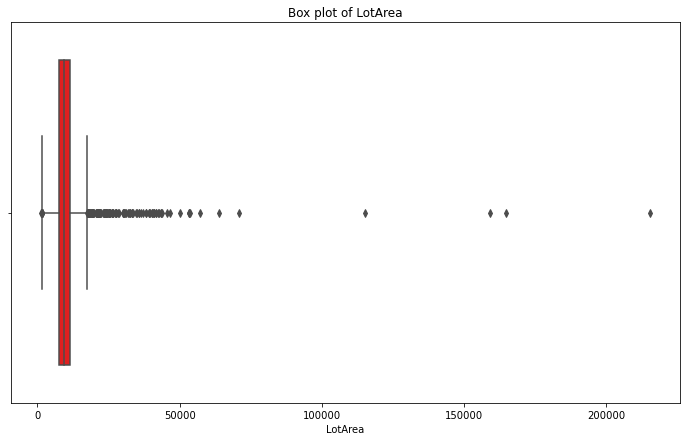

In [96]:
sns.boxplot(x = data.LotArea, data =data, color = 'r')
plt.title('Box plot of LotArea')

In [97]:
IQR = data.LotArea.quantile(.75) - data.LotArea.quantile(.25)
IQR

3981.0

In [98]:
upper_limit = data.LotArea.quantile(.75) + (1.5*IQR)
upper_limit

17572.5

In [99]:
lower_limit = data.LotArea.quantile(.25) - (1.5*IQR)
lower_limit

1648.5

In [100]:
len(data.LotArea[data.LotArea > upper_limit])

127

In [101]:
len(data.LotArea[data.LotArea < lower_limit])

9

In [102]:
for i in np.arange(upper_limit,50000,10000):
    outliers = len(data.LotArea[data.LotArea > i])
    print('At a limit of :', i, 'There are', outliers, 'outliers')

At a limit of : 17572.5 There are 127 outliers
At a limit of : 27572.5 There are 56 outliers
At a limit of : 37572.5 There are 30 outliers
At a limit of : 47572.5 There are 11 outliers


In [103]:
for i in np.arange(lower_limit,1300,-1000):
    outliers = len(data.LotArea[data.LotArea < i])
    print('At a limit of :', i, 'There are', outliers, 'outliers')

At a limit of : 1648.5 There are 9 outliers


In [104]:
data['LotArea'] = np.where(data['LotArea'] > upper_limit, upper_limit, data['LotArea'])

In [105]:
data['LotArea'] = np.where(data['LotArea'] < lower_limit, lower_limit, data['LotArea'])

Text(0.5, 1.0, 'Box plot of LotArea')

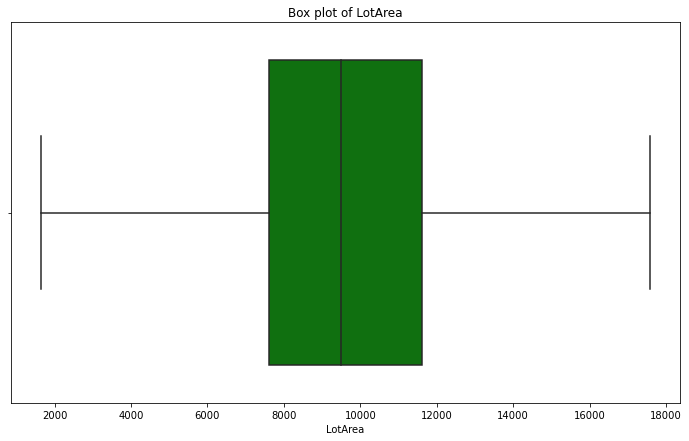

In [106]:
sns.boxplot(x = data.LotArea, data =data, color = 'g')
plt.title('Box plot of LotArea')

Text(0.5, 1.0, 'Normality of LotArea')

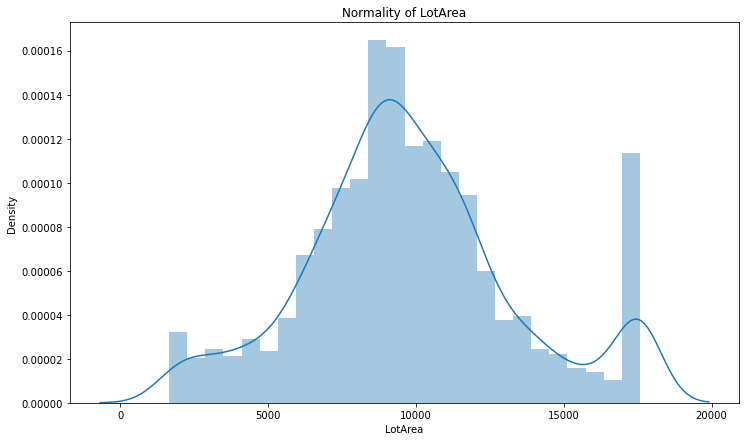

In [107]:
sns.distplot(data.LotArea)
plt.title('Normality of LotArea')

In [108]:
np.corrcoef(data.LotArea, data.Property_Sale_Price)

array([[1.        , 0.35178959],
       [0.35178959, 1.        ]])

Text(0.5, 1.0, 'Scatter plot of LotArea vs Property_Sale_Price')

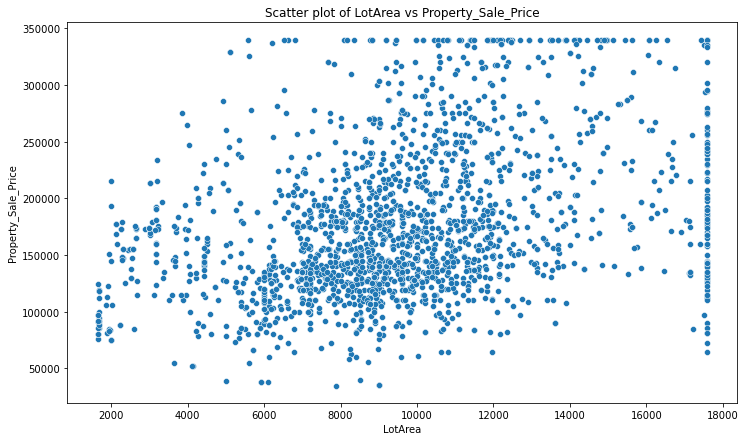

In [109]:
sns.scatterplot(x = data['LotArea'], y = data.Property_Sale_Price, data = data )
plt.xlabel('LotArea')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter plot of LotArea vs Property_Sale_Price')

**Not a good Predictor**

# 

# 

# 4) Road_Type

In [110]:
data.Road_Type.isnull().sum()

0

In [111]:
data.Road_Type.value_counts()

Pave    2063
Grvl      10
Name: Road_Type, dtype: int64

Text(0.5, 1.0, 'Count plot of Road_Type')

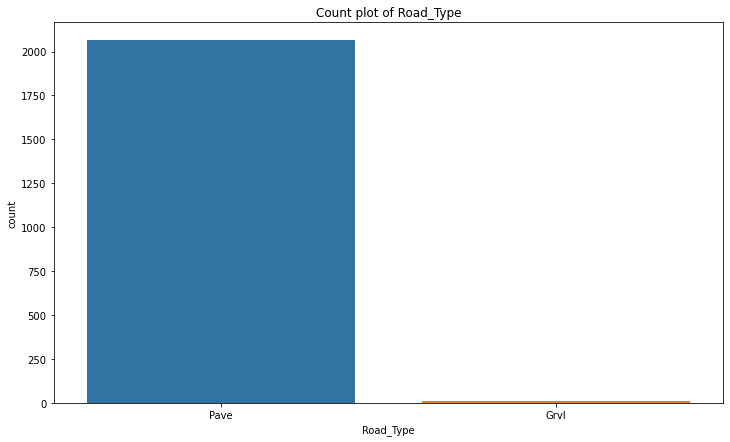

In [112]:
sns.countplot(data.Road_Type)
plt.title('Count plot of Road_Type')

In [113]:
data.groupby('Road_Type')['Property_Sale_Price'].describe()

,count,mean,std,min,25%,50%,75%,max
Road_Type,,,,,,,,
Grvl,10.0,119214.300000,51482.429909,55993.0,88250.0,110000.0,116375.0,228950.0
Pave,2063.0,177875.547746,66979.790438,34900.0,130000.0,164000.0,214000.0,340000.0


In [114]:
df1 = data[data.Road_Type == 'Pave']

df2 = data[data.Road_Type == 'Grvl']

ttest_ind(df1.Property_Sale_Price, df2.Property_Sale_Price)

Ttest_indResult(statistic=2.765310980668061, pvalue=0.005737285634853254)

**Good Predictor**

# 

# 

# 5) Alley

In [115]:
data.Alley.isnull().sum()

1944

In [116]:
data.Alley.value_counts()

Grvl    72
Pave    57
Name: Alley, dtype: int64

In [117]:
data['Alley'] = data['Alley'].fillna('No alley access')

In [118]:
data.Alley.isnull().sum()

0

In [119]:
data.Alley.value_counts()

No alley access    1944
Grvl                 72
Pave                 57
Name: Alley, dtype: int64

In [120]:
data.Alley.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Alley')

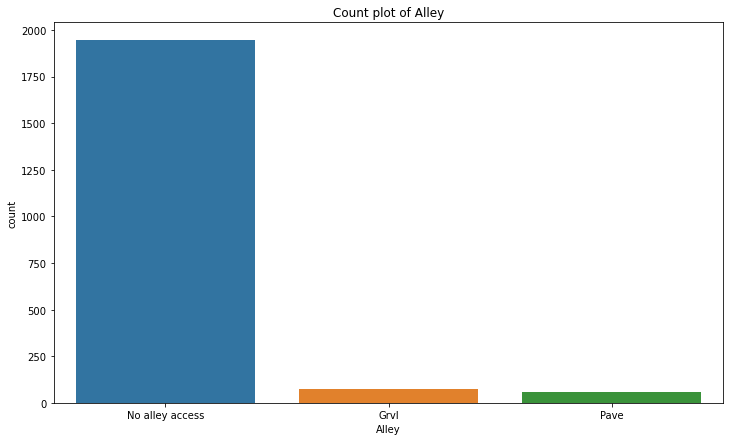

In [121]:
sns.countplot(data.Alley)
plt.title('Count plot of Alley')

In [122]:
data.groupby('Alley')['Property_Sale_Price'].describe()

,count,mean,std,min,25%,50%,75%,max
Alley,,,,,,,,
Grvl,72.0,119956.305556,34111.276285,52500.0,102250.0,118000.0,139550.0,256000.0
No alley access,1944.0,179800.450103,67683.672106,34900.0,131000.0,165075.0,217125.0,340000.0
Pave,57.0,175095.947368,36880.902953,40000.0,159434.0,174000.0,199900.0,265979.0


In [123]:
mod = ols('Property_Sale_Price ~ Alley', data = data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq          F        PR(>F)
Alley        2.0  2.490114e+11  1.245057e+11  28.447221  6.490283e-13
Residual  2070.0  9.059823e+12  4.376726e+09        NaN           NaN


In [124]:
t_Alley = pairwise_tukeyhsd(data.Property_Sale_Price, data.Alley)
print(t_Alley)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
     group1          group2      meandiff  p-adj    lower      upper    reject
------------------------------------------------------------------------------
           Grvl No alley access 59844.1445  0.001 41222.1851  78466.104   True
           Grvl            Pave 55139.6418  0.001 27629.9535 82649.3301   True
No alley access            Pave -4704.5027 0.8409 -25555.771 16146.7656  False
------------------------------------------------------------------------------


In [125]:
data['Alley'].replace('Pave', 'No alley access', inplace = True)

In [126]:
data.Alley.value_counts()

No alley access    2001
Grvl                 72
Name: Alley, dtype: int64

In [127]:
data.Alley.value_counts().sum()

2073

In [128]:
df1=data[data.Alley=='No alley access']

df2=data[data.Alley=='Grvl']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=7.52556317937485, pvalue=7.781545291319476e-14)

Text(0.5, 1.0, 'Count plot of Alley')

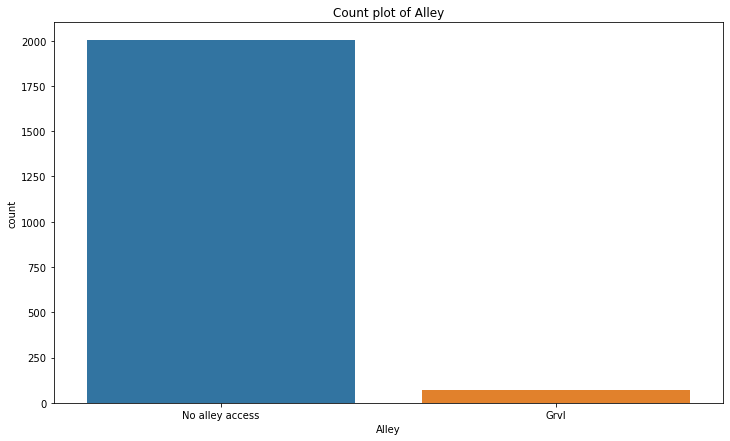

In [129]:
sns.countplot(data.Alley)
plt.title('Count plot of Alley')

Text(0.5, 1.0, 'Cat Plot of Alley vs Property_Sale_Price')

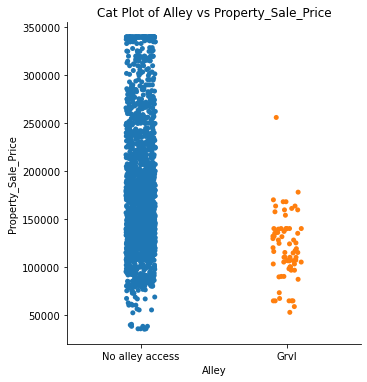

In [130]:
sns.catplot(x = 'Alley', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Alley vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Alley vs Property_Sale_Price')

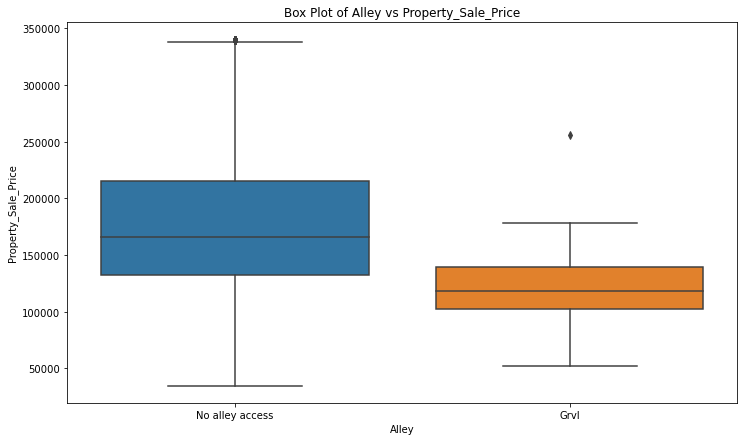

In [131]:
sns.boxplot(x = 'Alley', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Alley vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 6) Property_Shape

In [132]:
data.Property_Shape.isnull().sum()

0

In [133]:
data.Property_Shape.value_counts()

Reg    1300
IR1     698
IR2      60
IR3      15
Name: Property_Shape, dtype: int64

In [134]:
data.Property_Shape.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Property_Shape')

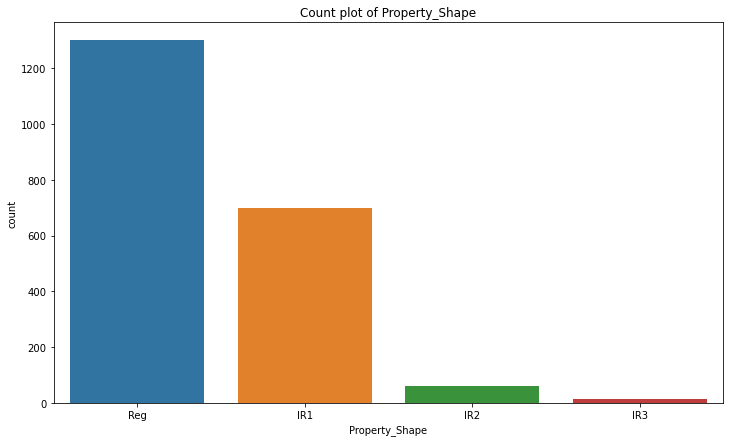

In [135]:
sns.countplot(data.Property_Shape)
plt.title('Count plot of Property_Shape')

In [136]:
data.groupby("Property_Shape")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Property_Shape,,,,,,,,
IR1,698.0,200990.607450,67559.667207,52000.0,148500.0,189500.0,239900.0,340000.0
IR2,60.0,214172.233333,64213.328055,110000.0,174000.0,191250.0,248000.0,340000.0
IR3,15.0,203828.333333,62233.650511,73000.0,172250.0,192140.0,237000.0,340000.0
Reg,1300.0,163038.611538,62547.325274,34900.0,120500.0,146750.0,189000.0,340000.0


In [137]:
mod= ols("Property_Sale_Price~Property_Shape",data =data).fit()
sm.stats.anova_lm(mod,type = 2)

,df,sum_sq,mean_sq,F,PR(>F)
Property_Shape,3.0,7.481048e+11,2.493683e+11,60.268576,2.371909e-37
Residual,2069.0,8.560729e+12,4.137617e+09,NaN,NaN


In [138]:
t_Property_Shape = pairwise_tukeyhsd(data.Property_Sale_Price, data.Property_Shape, alpha = 0.05)
print(t_Property_Shape)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
   IR1    IR2  13181.6259 0.4252  -9068.3429  35431.5947  False
   IR1    IR3   2837.7259    0.9 -40321.0942   45996.546  False
   IR1    Reg -37951.9959  0.001 -45712.6173 -30191.3746   True
   IR2    IR3    -10343.9    0.9 -58086.6594  37398.8594  False
   IR2    Reg -51133.6218  0.001 -72971.9954 -29295.2482   True
   IR3    Reg -40789.7218 0.0698 -83737.7975   2158.3539  False
---------------------------------------------------------------


In [139]:
data["Property_Shape"].replace("IR3","IR1",inplace = True)

In [140]:
data.Property_Shape.value_counts()

Reg    1300
IR1     713
IR2      60
Name: Property_Shape, dtype: int64

In [141]:
data.Property_Shape.value_counts().sum()

2073

In [142]:
mod= ols("Property_Sale_Price~Property_Shape",data =data).fit()
sm.stats.anova_lm(mod,type = 2)

,df,sum_sq,mean_sq,F,PR(>F)
Property_Shape,2.0,7.479866e+11,3.739933e+11,90.431012,2.229580e-38
Residual,2070.0,8.560848e+12,4.135675e+09,NaN,NaN


In [143]:
t_Property_Shape = pairwise_tukeyhsd(data.Property_Sale_Price, data.Property_Shape, alpha = 0.05)
print(t_Property_Shape)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
   IR1    IR2  13121.9262 0.2831  -7153.1446  33396.9969  False
   IR1    Reg -38011.6956  0.001 -45040.7753 -30982.6159   True
   IR2    Reg -51133.6218  0.001 -71050.2206  -31217.023   True
---------------------------------------------------------------


In [144]:
data["Property_Shape"].replace("IR2","IR1",inplace = True)

In [145]:
data.Property_Shape.value_counts()

Reg    1300
IR1     773
Name: Property_Shape, dtype: int64

In [146]:
data.Property_Shape.value_counts().sum()

2073

In [147]:
df1=data[data.Property_Shape=='Reg']

df2=data[data.Property_Shape=='IR1']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=-13.358349704280727, pvalue=4.188132301676014e-39)

Text(0.5, 1.0, 'Count plot of Property_Shape')

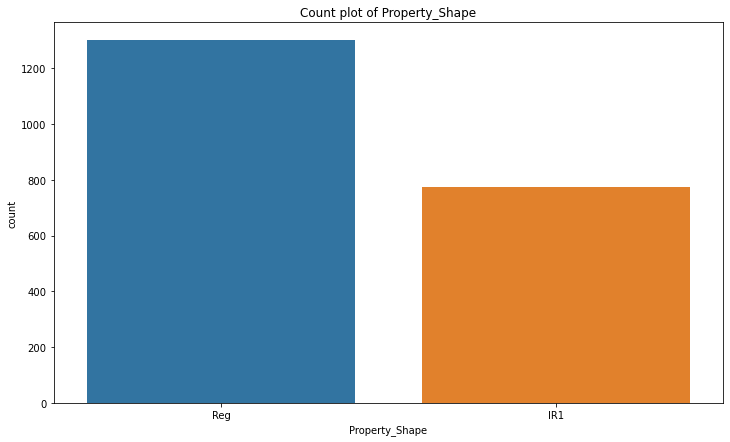

In [148]:
sns.countplot(data.Property_Shape)
plt.title('Count plot of Property_Shape')

Text(0.5, 1.0, 'Cat Plot of Property_Shape vs Property_Sale_Price')

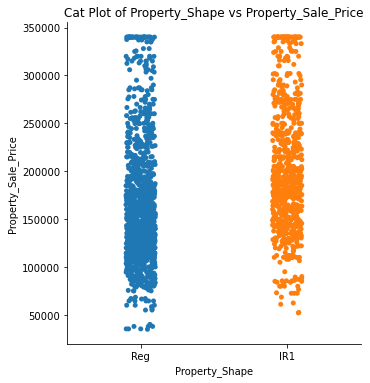

In [149]:
sns.catplot(x = 'Property_Shape', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Property_Shape vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Property_Shape vs Property_Sale_Price')

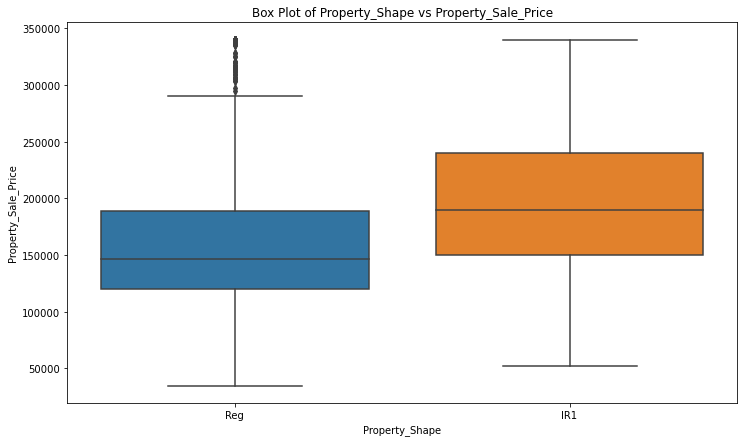

In [150]:
sns.boxplot(x = 'Property_Shape', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Property_Shape vs Property_Sale_Price')

**Good Predict**

# 

# 

# 7) LandContour

In [151]:
data.LandContour.isnull().sum()

0

In [152]:
data.LandContour.value_counts()

Lvl    1854
Bnk      92
HLS      76
Low      51
Name: LandContour, dtype: int64

In [153]:
data.LandContour.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of LandContour')

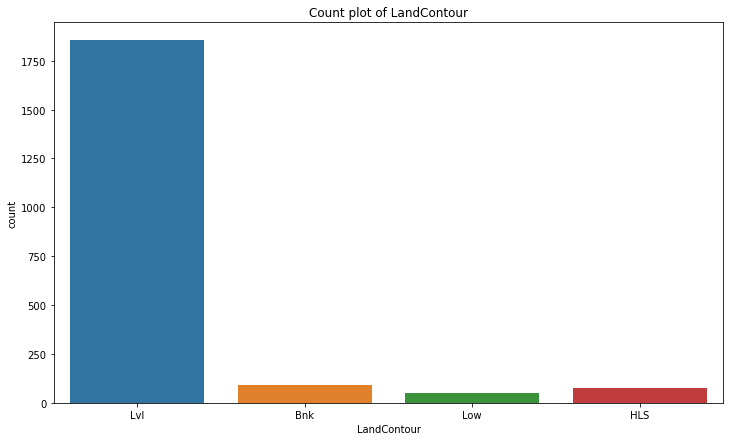

In [154]:
sns.countplot(data.LandContour)
plt.title('Count plot of LandContour')

In [155]:
data.groupby("LandContour")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
LandContour,,,,,,,,
Bnk,92.0,141210.728261,45566.770113,52500.0,111000.0,134950.0,161000.00,315000.0
HLS,76.0,214719.315789,74459.079139,82500.0,157250.0,201000.0,268106.25,340000.0
Low,51.0,197807.843137,81924.079105,39300.0,143000.0,185000.0,267500.00,340000.0
Lvl,1854.0,177319.926106,66201.326059,34900.0,130000.0,164800.0,213187.50,340000.0


In [156]:
mod= ols("Property_Sale_Price~LandContour",data =data).fit()
aov_table_LandContour = sm.stats.anova_lm(mod)
print(aov_table_LandContour)

                 df        sum_sq       mean_sq          F        PR(>F)
LandContour     3.0  2.475121e+11  8.250404e+10  18.838405  4.702250e-12
Residual     2069.0  9.061322e+12  4.379566e+09        NaN           NaN


In [157]:
t_LandContour = pairwise_tukeyhsd(data.Property_Sale_Price, data.LandContour, alpha = 0.05)
print(t_LandContour)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
   Bnk    HLS  73508.5875  0.001  47133.5874  99883.5877   True
   Bnk    Low  56597.1149  0.001  26892.2517  86301.9781   True
   Bnk    Lvl  36109.1978  0.001   17934.752  54283.6437   True
   HLS    Low -16911.4727 0.4924 -47711.3166  13888.3713  False
   HLS    Lvl -37399.3897  0.001 -57313.2535 -17485.5259   True
   Low    Lvl  -20487.917 0.1286 -44639.5264   3663.6924  False
---------------------------------------------------------------


In [158]:
data["LandContour"].replace("Low","HLS",inplace = True)

In [159]:
data.LandContour.value_counts()

Lvl    1854
HLS     127
Bnk      92
Name: LandContour, dtype: int64

In [160]:
data.LandContour.value_counts().sum()

2073

In [161]:
mod= ols("Property_Sale_Price~LandContour",data =data).fit()
aov_table_LandContour = sm.stats.anova_lm(mod)
print(aov_table_LandContour)

                 df        sum_sq       mean_sq          F        PR(>F)
LandContour     2.0  2.387835e+11  1.193918e+11  27.248025  2.086517e-12
Residual     2070.0  9.070051e+12  4.381667e+09        NaN           NaN


In [162]:
t_LandContour = pairwise_tukeyhsd(data.Property_Sale_Price, data.LandContour, alpha = 0.05)
print(t_LandContour)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2   meandiff  p-adj    lower      upper    reject
-------------------------------------------------------------
   Bnk    HLS  66717.3662 0.001  45462.1378 87972.5947   True
   Bnk    Lvl  36109.1978 0.001  19526.2348 52692.1609   True
   HLS    Lvl -30608.1684 0.001 -44848.6608 -16367.676   True
-------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of LandContour')

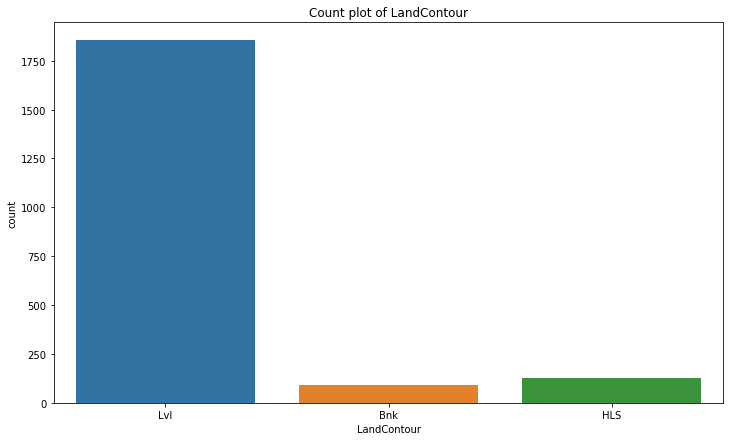

In [163]:
sns.countplot(data.LandContour)
plt.title('Count plot of LandContour')

Text(0.5, 1.0, 'Cat Plot of Property_Sale_Price vs LandContour')

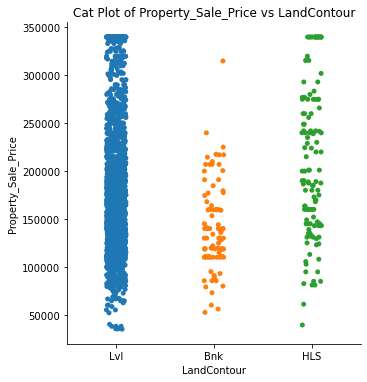

In [164]:
sns.catplot(x = 'LandContour', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Property_Sale_Price vs LandContour')

Text(0.5, 1.0, 'Box Plot of Property_Sale_Price vs LandContour')

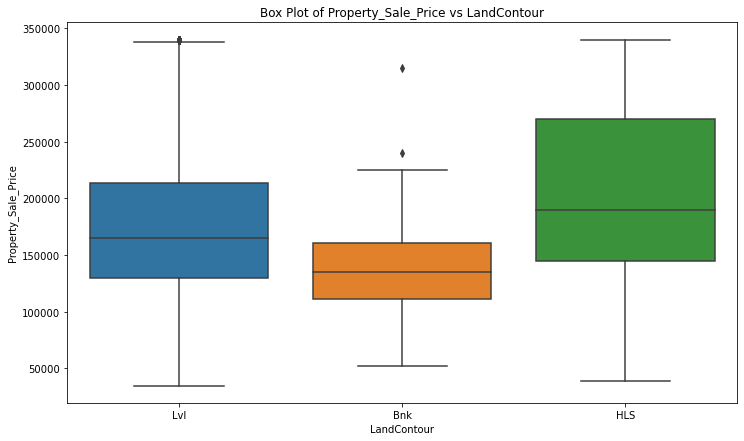

In [165]:
sns.boxplot(x = 'LandContour', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Property_Sale_Price vs LandContour')

**Good Predictor**

# 

# 

# 8) Utilities

In [166]:
data.Utilities.isnull().sum()

0

In [167]:
data.Utilities.value_counts()

AllPub    2070
NoSeWa       3
Name: Utilities, dtype: int64

In [168]:
data.Utilities.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Utilities')

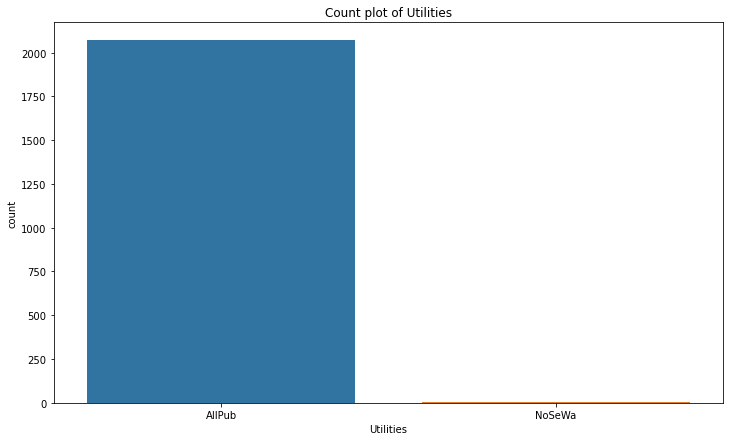

In [169]:
sns.countplot(data.Utilities)
plt.title('Count plot of Utilities')

In [170]:
data.groupby("Utilities")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Utilities,,,,,,,,
AllPub,2070.0,177650.675362,67058.636808,34900.0,130000.0,164000.0,214000.0,340000.0
NoSeWa,3.0,137500.000000,0.000000,137500.0,137500.0,137500.0,137500.0,137500.0


In [171]:
df1=data[data.Utilities=='AllPub']

df2=data[data.Utilities=='NoSeWa']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=1.036797848433364, pvalue=0.29995111758233073)

**Not Good Predictor**

# 

# 

# 9) LotConfig

In [172]:
data.LotConfig.isnull().sum()

0

In [173]:
data.LotConfig.value_counts()

Inside     1481
Corner      386
CulDSac     137
FR2          65
FR3           4
Name: LotConfig, dtype: int64

In [174]:
data.LotConfig.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of LotConfig')

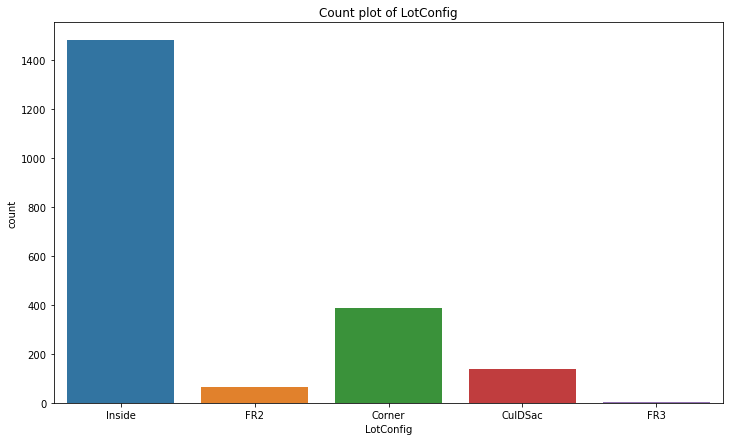

In [175]:
sns.countplot(data.LotConfig)
plt.title('Count plot of LotConfig')

In [176]:
data.groupby("LotConfig")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
LotConfig,,,,,,,,
Corner,386.0,178871.183938,66358.387741,52500.0,129000.0,167250.0,221500.0,340000.0
CulDSac,137.0,207646.766423,64797.175752,84000.0,149350.0,197500.0,262500.0,340000.0
FR2,65.0,181016.738462,60624.202569,81000.0,148500.0,165000.0,214000.0,340000.0
FR3,4.0,208475.000000,78379.222374,128000.0,169925.0,195450.0,234000.0,315000.0
Inside,1481.0,174245.459824,66997.868261,34900.0,128000.0,160000.0,206900.0,340000.0


In [177]:
mod = ols("Property_Sale_Price~LotConfig", data =data).fit()
aov_table_LotConfig = sm.stats.anova_lm(mod)
print(aov_table_LotConfig)

               df        sum_sq       mean_sq         F    PR(>F)
LotConfig     4.0  1.455458e+11  3.638646e+10  8.211811  0.000001
Residual   2068.0  9.163288e+12  4.430990e+09       NaN       NaN


In [178]:
t_LotConfig = pairwise_tukeyhsd(data.Property_Sale_Price, data.LotConfig, alpha = 0.05)
print(t_LotConfig)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff  p-adj     lower        upper    reject
------------------------------------------------------------------
 Corner CulDSac  28775.5825  0.001   10702.2906  46848.8744   True
 Corner     FR2   2145.5545    0.9   -22220.112   26511.221  False
 Corner     FR3  29603.8161    0.9  -61733.6609  120941.293  False
 Corner  Inside  -4625.7241 0.7153  -15011.5571   5760.1088  False
CulDSac     FR2  -26630.028 0.0611  -54001.5582    741.5023  False
CulDSac     FR3    828.2336    0.9  -91356.6331  93013.1003  False
CulDSac  Inside -33401.3066  0.001  -49630.3081 -17172.3051   True
    FR2     FR3  27458.2615    0.9  -66163.8057 121080.3288  False
    FR2  Inside  -6771.2786    0.9  -29802.1777  16259.6204  False
    FR3  Inside -34229.5402 0.8224 -125220.0413   56760.961  False
------------------------------------------------------------------


In [179]:
data["LotConfig"].replace("FR2","Corner",inplace = True)
data["LotConfig"].replace("FR3","Corner",inplace = True)

In [180]:
data.LotConfig.value_counts()

Inside     1481
Corner      455
CulDSac     137
Name: LotConfig, dtype: int64

In [181]:
data.LotConfig.value_counts().sum()

2073

In [182]:
mod = ols("Property_Sale_Price~LotConfig", data =data).fit()
aov_table_LotConfig = sm.stats.anova_lm(mod)
print(aov_table_LotConfig)

               df        sum_sq       mean_sq          F        PR(>F)
LotConfig     2.0  1.418872e+11  7.094361e+10  16.019867  1.247252e-07
Residual   2070.0  9.166947e+12  4.428477e+09        NaN           NaN


In [183]:
t_LotConfig = pairwise_tukeyhsd(data.Property_Sale_Price, data.LotConfig, alpha = 0.05)
print(t_LotConfig)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1  group2   meandiff  p-adj     lower       upper    reject
-----------------------------------------------------------------
 Corner CulDSac  28208.8214  0.001  12998.3781  43419.2646   True
 Corner  Inside  -5192.4852 0.3132  -13558.458   3173.4875  False
CulDSac  Inside -33401.3066  0.001 -47339.2419 -19463.3713   True
-----------------------------------------------------------------


In [184]:
data["LotConfig"].replace("CulDSac","Corner",inplace = True)

In [185]:
data.LotConfig.value_counts()

Inside    1481
Corner     592
Name: LotConfig, dtype: int64

In [186]:
data.LotConfig.value_counts().sum()

2073

In [187]:
df1=data[data.LotConfig=='Inside']

df2=data[data.LotConfig=='Corner']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=-3.6065196077561565, pvalue=0.00031767711757648353)

Text(0.5, 1.0, 'Count plot of LotConfig')

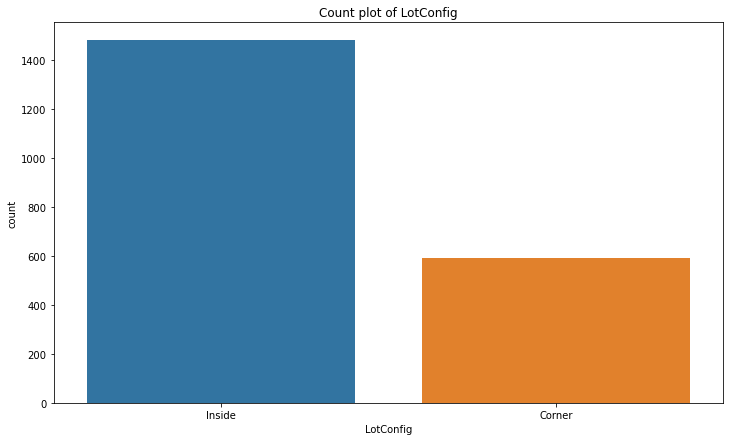

In [188]:
sns.countplot(data.LotConfig)
plt.title('Count plot of LotConfig')

Text(0.5, 1.0, 'LotConfig vs Property_Sale_Price')

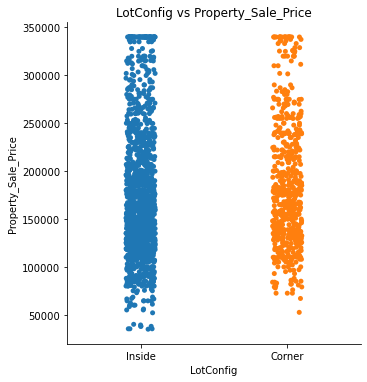

In [189]:
sns.catplot(x = 'LotConfig', y = 'Property_Sale_Price', data = data)
plt.title('LotConfig vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of LotConfig vs Property_Sale_Price')

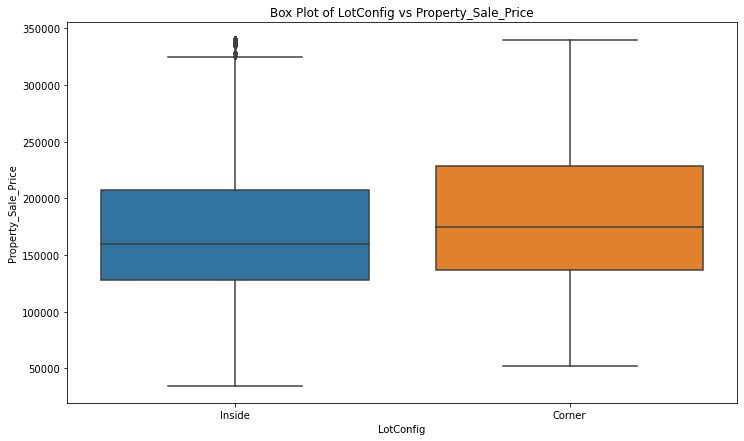

In [190]:
sns.boxplot(x = 'LotConfig', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of LotConfig vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 10) LandSlope

In [191]:
data.LandSlope.isnull().sum()

0

In [192]:
data.LandSlope.value_counts()

Gtl    1958
Mod     101
Sev      14
Name: LandSlope, dtype: int64

In [193]:
data.LandSlope.value_counts().sum()

2073

Text(0.5, 1.0, 'Count Plot of LandSlope')

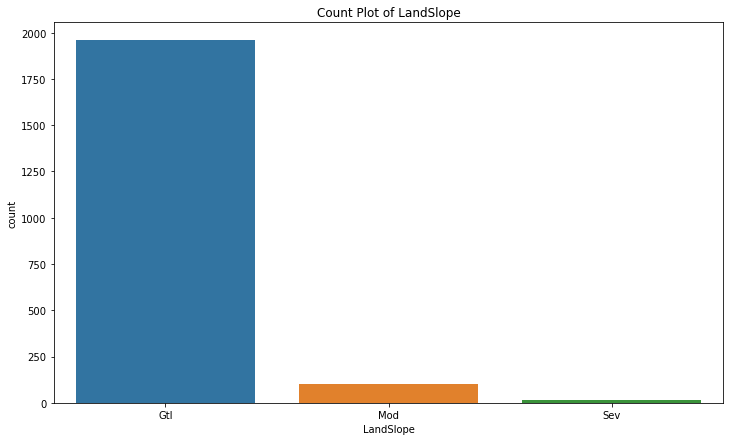

In [194]:
sns.countplot(data.LandSlope)
plt.title('Count Plot of LandSlope')

In [195]:
data.groupby("LandSlope")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
LandSlope,,,,,,,,
Gtl,1958.0,176946.424413,66471.654792,34900.0,130000.0,163000.0,213000.0,340000.0
Mod,101.0,187191.772277,75128.837126,39300.0,130000.0,172000.0,242000.0,340000.0
Sev,14.0,198709.285714,78967.344611,61000.0,147250.0,182500.0,255375.0,340000.0


In [196]:
mod = ols("Property_Sale_Price~LandSlope",data =data).fit()
aov_table_LandSlope = sm.stats.anova_lm(mod)
print(aov_table_LandSlope)

               df        sum_sq       mean_sq         F    PR(>F)
LandSlope     2.0  1.636691e+10  8.183453e+09  1.822955  0.161807
Residual   2070.0  9.292467e+12  4.489115e+09       NaN       NaN


**Not Good Predictor**

# 

# 

# 11) Neighborhood

In [197]:
data.Neighborhood.isnull().sum()

0

In [198]:
data.Neighborhood.value_counts()

NAmes      317
CollgCr    217
OldTown    156
Edwards    138
Somerst    123
Gilbert    119
Sawyer     108
NWAmes     105
NridgHt     99
SawyerW     93
BrkSide     80
Mitchel     78
Crawfor     72
NoRidge     65
Timber      53
IDOTRR      51
ClearCr     33
StoneBr     32
SWISU       31
Blmngtn     27
MeadowV     24
BrDale      17
NPkVill     17
Veenker     15
Blueste      3
Name: Neighborhood, dtype: int64

In [199]:
data.Neighborhood.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Neighborhood')

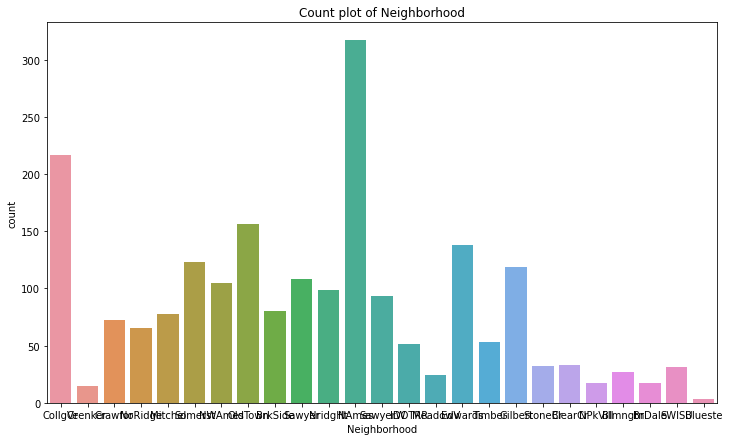

In [200]:
sns.countplot(data.Neighborhood)
plt.title('Count plot of Neighborhood')

In [201]:
data.groupby("Neighborhood")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Neighborhood,,,,,,,,
Blmngtn,27.0,190835.666667,29284.016787,159895.0,173250.0,181000.0,203845.5,264561.0
Blueste,3.0,133000.000000,15588.457268,124000.0,124000.0,124000.0,137500.0,151000.0
BrDale,17.0,105288.235294,14256.572272,83000.0,91500.0,106000.0,118000.0,125000.0
BrkSide,80.0,125134.687500,42537.203280,39300.0,88750.0,120000.0,142125.0,223500.0
ClearCr,33.0,216852.484848,51130.435689,130000.0,187500.0,200500.0,244400.0,328000.0
CollgCr,217.0,198702.612903,49612.254693,110000.0,150500.0,200000.0,230000.0,340000.0
Crawfor,72.0,210319.597222,62955.783040,90350.0,160000.0,217000.0,250000.0,340000.0
Edwards,138.0,130126.014493,44063.138003,58500.0,103925.0,125000.0,145900.0,320000.0
Gilbert,119.0,190821.268908,29959.671152,141000.0,174500.0,180500.0,193000.0,340000.0


In [202]:
mod = ols("Property_Sale_Price~Neighborhood",data =data).fit()
aov_table_Neighborhood = sm.stats.anova_lm(mod)
print(aov_table_Neighborhood)

                  df        sum_sq       mean_sq           F  PR(>F)
Neighborhood    24.0  5.406891e+12  2.252871e+11  118.245708     0.0
Residual      2048.0  3.901943e+12  1.905246e+09         NaN     NaN


In [203]:
t_Neighborhood = pairwise_tukeyhsd(data.Property_Sale_Price, data.Neighborhood, alpha = 0.05)
print(t_Neighborhood)

        Multiple Comparison of Means - Tukey HSD, FWER=0.05         
 group1  group2   meandiff   p-adj     lower        upper     reject
--------------------------------------------------------------------
Blmngtn Blueste  -57835.6667 0.8804 -155142.6019   39471.2686  False
Blmngtn  BrDale  -85547.4314  0.001 -135052.0446  -36042.8181   True
Blmngtn BrkSide  -65700.9792  0.001 -101287.9227  -30114.0356   True
Blmngtn ClearCr   26016.8182 0.8004  -15474.9984   67508.6348  False
Blmngtn CollgCr    7866.9462    0.9  -24762.4352   40496.3276  False
Blmngtn Crawfor   19483.9306    0.9  -16598.4467   55566.3078  False
Blmngtn Edwards  -60709.6522  0.001  -94356.6425  -27062.6619   True
Blmngtn Gilbert     -14.3978    0.9  -34098.0983   34069.3028  False
Blmngtn  IDOTRR   -90894.451  0.001 -128948.9499  -52839.9521   True
Blmngtn MeadowV  -94473.1667  0.001 -139329.4474  -49616.8859   True
Blmngtn Mitchel  -35033.8205 0.0629  -70735.7052     668.0641  False
Blmngtn   NAmes  -46015.8149  0.00

In [204]:
data["Neighborhood"].replace("Blueste","Blmngtn",inplace = True)
data["Neighborhood"].replace("Blmngtn","CollgCr",inplace = True)
data["Neighborhood"].replace("BrDale","BrkSide",inplace = True)
data["Neighborhood"].replace("BrkSide","Edwards",inplace = True)
data["Neighborhood"].replace("ClearCr","Crawfor",inplace = True)
data["Neighborhood"].replace("Gilbert","CollgCr",inplace = True)
data["Neighborhood"].replace("NWAmes","CollgCr",inplace = True)
data["Neighborhood"].replace("SawyerW","CollgCr",inplace = True)
data["Neighborhood"].replace("NPkVill","Edwards",inplace = True)
data["Neighborhood"].replace("OldTown","Edwards",inplace = True)
data["Neighborhood"].replace("MeadowV","IDOTRR",inplace = True)
data["Neighborhood"].replace("SWISU","Mitchel",inplace = True)
data["Neighborhood"].replace("Mitchel","NAmes",inplace = True)
data["Neighborhood"].replace("Sawyer","NAmes",inplace = True)
data["Neighborhood"].replace("NoRidge","NridgHt",inplace = True)
data["Neighborhood"].replace("Timber","Somerst",inplace = True)
data["Neighborhood"].replace("Veenker","StoneBr",inplace = True)
data["Neighborhood"].replace("Crawfor","Somerst",inplace = True)

In [205]:
data.Neighborhood.value_counts()

CollgCr    564
NAmes      534
Edwards    408
Somerst    281
NridgHt    164
IDOTRR      75
StoneBr     47
Name: Neighborhood, dtype: int64

In [206]:
mod = ols("Property_Sale_Price~Neighborhood",data =data).fit()
aov_table_Neighborhood = sm.stats.anova_lm(mod)
print(aov_table_Neighborhood)

                  df        sum_sq       mean_sq           F  PR(>F)
Neighborhood     6.0  5.331338e+12  8.885564e+11  461.536006     0.0
Residual      2066.0  3.977496e+12  1.925216e+09         NaN     NaN


In [207]:
t_Neighborhood = pairwise_tukeyhsd(data.Property_Sale_Price, data.Neighborhood, alpha = 0.05)
print(t_Neighborhood)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff  p-adj     lower        upper    reject
------------------------------------------------------------------
CollgCr Edwards -66982.7862  0.001  -75398.7161 -58566.8563   True
CollgCr  IDOTRR -93969.5389  0.001 -109884.9865 -78054.0914   True
CollgCr   NAmes -47063.2398  0.001  -54881.8507 -39244.6289   True
CollgCr NridgHt   99918.032  0.001   88430.0743 111405.9896   True
CollgCr Somerst  29164.6515  0.001   19709.3745  38619.9284   True
CollgCr StoneBr  73894.0089  0.001   54234.5873  93553.4304   True
Edwards  IDOTRR -26986.7527  0.001  -43255.4008 -10718.1047   True
Edwards   NAmes  19919.5464  0.001    11404.964  28434.1288   True
Edwards NridgHt 166900.8181  0.001  154928.3244 178873.3119   True
Edwards Somerst  96147.4377  0.001   86109.0265 106185.8489   True
Edwards StoneBr 140876.7951  0.001  120930.3595 160823.2307   True
 IDOTRR   NAmes  46906.2992  0.001   30938.4656  62874.1327   

Text(0.5, 1.0, 'Count plot of Neighborhood')

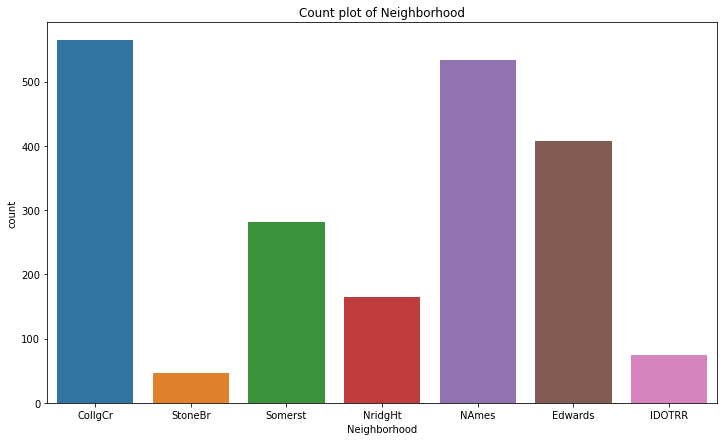

In [208]:
sns.countplot(data.Neighborhood)
plt.title('Count plot of Neighborhood')

Text(0.5, 1.0, 'Cat Plot of Neighborhood vs Property_Sale_Price')

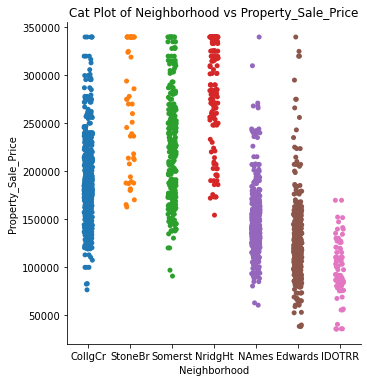

In [209]:
sns.catplot(x = 'Neighborhood', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Neighborhood vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Neighborhood vs Property_Sale_Price')

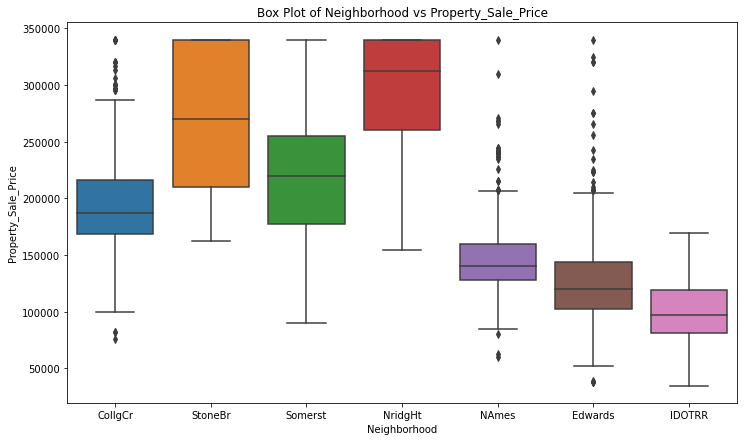

In [210]:
sns.boxplot(x = 'Neighborhood', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Neighborhood vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 12) Condition1

In [211]:
data.Condition1.isnull().sum()

0

In [212]:
data.Condition1.value_counts()

Norm      1794
Feedr      112
Artery      62
RRAn        39
PosN        24
RRAe        15
PosA        13
RRNn        12
RRNe         2
Name: Condition1, dtype: int64

In [213]:
data.Condition1.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Condition1')

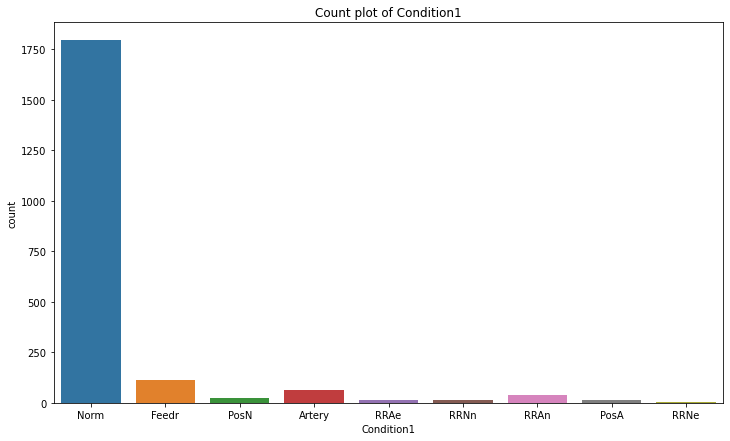

In [214]:
sns.countplot(data.Condition1)
plt.title('Count plot of Condition1')

In [215]:
data.groupby('Condition1')['Property_Sale_Price'].describe()

,count,mean,std,min,25%,50%,75%,max
Condition1,,,,,,,,
Artery,62.0,131616.129032,48191.170518,66500.0,105000.0,121450.0,142500.0,340000.0
Feedr,112.0,141863.616071,39016.050482,40000.0,121900.0,141000.0,163000.0,244600.0
Norm,1794.0,180415.495541,67958.906586,34900.0,131000.0,167370.0,219500.0,340000.0
PosA,13.0,242000.000000,59026.830058,180000.0,190000.0,242000.0,250000.0,335000.0
PosN,24.0,209645.833333,61215.803083,109500.0,164625.0,198750.0,264875.0,340000.0
RRAe,15.0,148433.333333,36689.696231,87000.0,132650.0,143900.0,158500.0,256300.0
RRAn,39.0,184348.051282,48809.506292,79500.0,159500.0,178900.0,192140.0,340000.0
RRNe,2.0,190750.000000,5303.300859,187000.0,188875.0,190750.0,192625.0,194500.0
RRNn,12.0,205000.000000,90036.356293,110000.0,110000.0,214000.0,297500.0,320000.0


In [216]:
mod_Condition1= ols("Property_Sale_Price~Condition1",data =data).fit()
aov_table_Condition1 = sm.stats.anova_lm(mod_Condition1,type = 2)
print(aov_table_Condition1)

                df        sum_sq       mean_sq          F        PR(>F)
Condition1     8.0  3.908084e+11  4.885105e+10  11.306153  8.731315e-16
Residual    2064.0  8.918026e+12  4.320749e+09        NaN           NaN


In [217]:
tukey_Condition1 = pairwise_tukeyhsd(data.Property_Sale_Price, data.Condition1, alpha = 0.05)
print(tukey_Condition1)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
Artery  Feedr   10247.487    0.9  -22061.0574  42556.0314  False
Artery   Norm  48799.3665  0.001    22434.259   75164.474   True
Artery   PosA  110383.871  0.001   48123.6389  172644.103   True
Artery   PosN  78029.7043  0.001   28962.0401 127097.3685   True
Artery   RRAe  16817.2043    0.9  -41911.6478  75546.0564  False
Artery   RRAn  52731.9222 0.0029    11018.083  94445.7615   True
Artery   RRNe   59133.871    0.9  -87497.4573 205765.1992  False
Artery   RRNn   73383.871 0.0122    9014.8333 137752.9086   True
 Feedr   Norm  38551.8795  0.001     18673.14  58430.6189   True
 Feedr   PosA 100136.3839  0.001   40333.5254 159939.2424   True
 Feedr   PosN  67782.2173  0.001   21872.7296 113691.7049   True
 Feedr   RRAe   6569.7173    0.9  -49547.3342  62686.7687  False
 Feedr   RRAn  42484.4352

In [218]:
data['Condition1'].replace('Artery', 'Feedr', inplace = True)
data['Condition1'].replace('RRAe', 'Feedr', inplace = True)
data['Condition1'].replace('RRNe', 'Feedr', inplace = True)
data['Condition1'].replace('RRAn', 'Norm', inplace = True)
data['Condition1'].replace('RRNn', 'PosN', inplace = True)
data['Condition1'].replace('PosA', 'PosN', inplace = True)

In [219]:
data.Condition1.value_counts()

Norm     1833
Feedr     191
PosN       49
Name: Condition1, dtype: int64

In [220]:
mod_Condition1= ols("Property_Sale_Price~Condition1",data =data).fit()
aov_table_Condition1 = sm.stats.anova_lm(mod_Condition1,type = 2)
print(aov_table_Condition1)

                df        sum_sq       mean_sq          F        PR(>F)
Condition1     2.0  3.681387e+11  1.840694e+11  42.616775  7.288981e-19
Residual    2070.0  8.940695e+12  4.319177e+09        NaN           NaN


In [221]:
tukey_Condition1 = pairwise_tukeyhsd(data.Property_Sale_Price, data.Condition1, alpha = 0.05)
print(tukey_Condition1)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj   lower      upper    reject
-----------------------------------------------------------
 Feedr   Norm 40934.1146 0.001 29214.1142  52654.115   True
 Feedr   PosN 77526.7844 0.001 52843.0317 102210.537   True
  Norm   PosN 36592.6698 0.001 14280.0366  58905.303   True
-----------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Condition1')

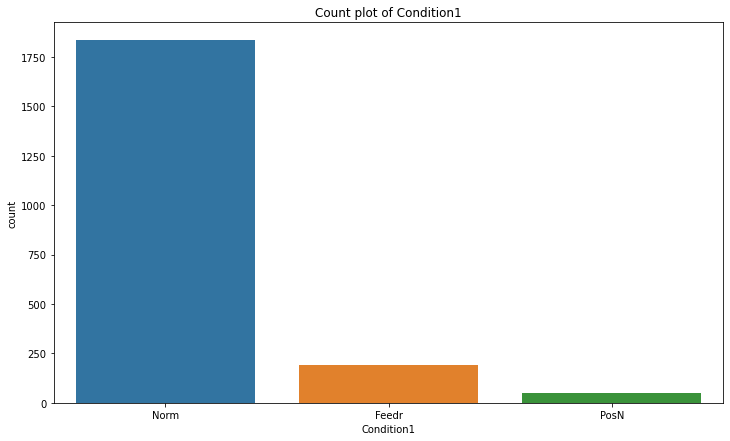

In [222]:
sns.countplot(data.Condition1)
plt.title('Count plot of Condition1')

Text(0.5, 1.0, 'Cat Plot of Condition1 vs Property_Sale_Price')

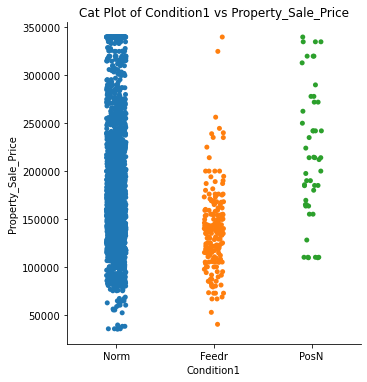

In [223]:
sns.catplot(x = 'Condition1', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Condition1 vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of Condition1 vs Property_Sale_Price')

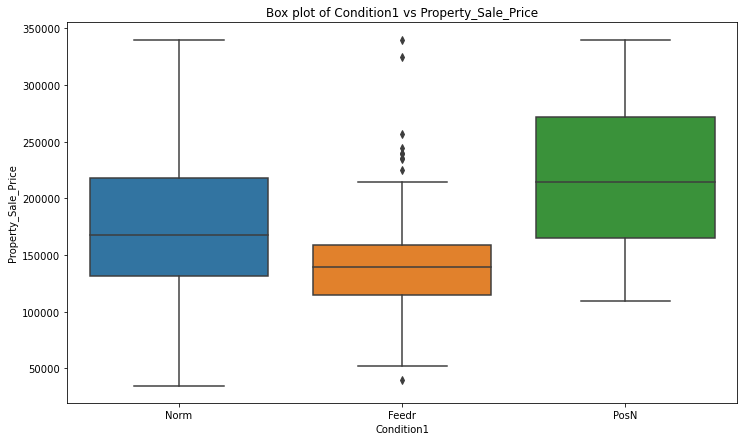

In [224]:
sns.boxplot(x = 'Condition1', y = 'Property_Sale_Price', data = data)
plt.title('Box plot of Condition1 vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 13) Condition2

In [225]:
data.Condition2.isnull().sum()

0

In [226]:
data.Condition2.value_counts()

Norm      2054
Feedr        9
RRAn         2
PosN         2
Artery       2
RRNn         2
PosA         1
RRAe         1
Name: Condition2, dtype: int64

In [227]:
data.Condition2.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Condition2')

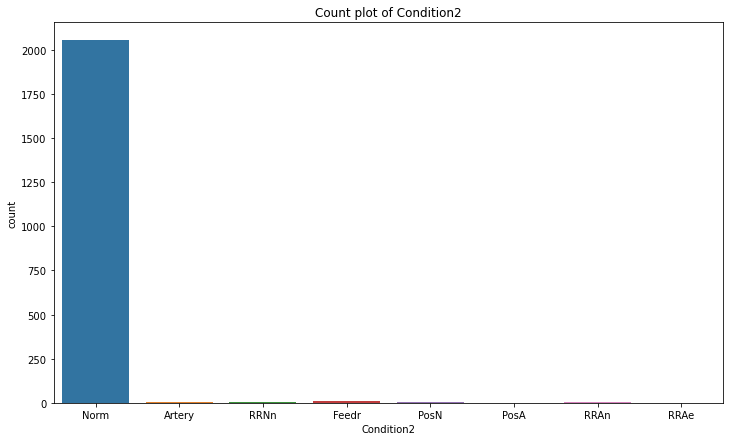

In [228]:
sns.countplot(data.Condition2)
plt.title('Count plot of Condition2')

In [229]:
data.groupby('Condition2')['Property_Sale_Price'].describe()

,count,mean,std,min,25%,50%,75%,max
Condition2,,,,,,,,
Artery,2.0,106500.000000,16263.455967,95000.0,100750.0,106500.0,112250.0,118000.0
Feedr,9.0,127444.444444,36866.689271,79500.0,85000.0,128000.0,167500.0,167500.0
Norm,2054.0,177839.502434,66936.808031,34900.0,130000.0,164000.0,214000.0,340000.0
PosA,1.0,325000.000000,NaN,325000.0,325000.0,325000.0,325000.0,325000.0
PosN,2.0,262375.000000,109778.327779,184750.0,223562.5,262375.0,301187.5,340000.0
RRAe,1.0,190000.000000,NaN,190000.0,190000.0,190000.0,190000.0,190000.0
RRAn,2.0,136905.000000,0.000000,136905.0,136905.0,136905.0,136905.0,136905.0
RRNn,2.0,96750.000000,39951.533137,68500.0,82625.0,96750.0,110875.0,125000.0


In [230]:
mod = ols('Property_Sale_Price~Condition2', data = data).fit()
anova_Cond2 = sm.stats.anova_lm(mod)
print(anova_Cond2)

                df        sum_sq       mean_sq         F    PR(>F)
Condition2     7.0  8.550808e+10  1.221544e+10  2.734901  0.007943
Residual    2065.0  9.223326e+12  4.466502e+09       NaN       NaN


In [231]:
tukey_Cond2 = pairwise_tukeyhsd(data.Property_Sale_Price, data.Condition2)
print(tukey_Cond2)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
Artery  Feedr  20944.4444    0.9 -137565.6618 179454.5507  False
Artery   Norm  71339.5024 0.7772  -72108.0705 214787.0754  False
Artery   PosA    218500.0 0.1321  -29837.6097 466837.6097  False
Artery   PosN    155875.0 0.2765  -46891.8092 358641.8092  False
Artery   RRAe     83500.0    0.9 -164837.6097 331837.6097  False
Artery   RRAn     30405.0    0.9 -172361.8092 233171.8092  False
Artery   RRNn     -9750.0    0.9 -212516.8092 193016.8092  False
 Feedr   Norm   50395.058  0.318  -17341.7936 118131.9096  False
 Feedr   PosA 197555.5556 0.0942  -16179.4281 411290.5392  False
 Feedr   PosN 134930.5556 0.1629  -23579.5507 293440.6618  False
 Feedr   RRAe  62555.5556    0.9 -151179.4281 276290.5392  False
 Feedr   RRAn   9460.5556    0.9 -149049.5507 167970.6618  False
 Feedr   RRNn -30694.4444

In [232]:
data['Condition2'].replace('Artery', 'Feedr', inplace = True)
data['Condition2'].replace('RRAe', 'Feedr', inplace = True)
data['Condition2'].replace('RRAn', 'Feedr', inplace = True)
data['Condition2'].replace('RRNn', 'Feedr', inplace = True)
data['Condition2'].replace('PosA', 'PosN', inplace = True)

In [233]:
data.Condition2.value_counts()

Norm     2054
Feedr      16
PosN        3
Name: Condition2, dtype: int64

In [234]:
mod = ols('Property_Sale_Price~Condition2', data = data).fit()
anova_Cond2 = sm.stats.anova_lm(mod)
print(anova_Cond2)

                df        sum_sq       mean_sq         F    PR(>F)
Condition2     2.0  7.606935e+10  3.803467e+10  8.527432  0.000205
Residual    2070.0  9.232765e+12  4.460273e+09       NaN       NaN


In [235]:
tukey_Cond2 = pairwise_tukeyhsd(data.Property_Sale_Price, data.Condition2)
print(tukey_Cond2)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj    lower       upper    reject
--------------------------------------------------------------
 Feedr   Norm  51757.6274 0.0058 12445.5959  91069.6589   True
 Feedr   PosN  157168.125  0.001 58618.1072 255718.1428   True
  Norm   PosN 105410.4976 0.0175 14908.7794 195912.2157   True
--------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Condition2')

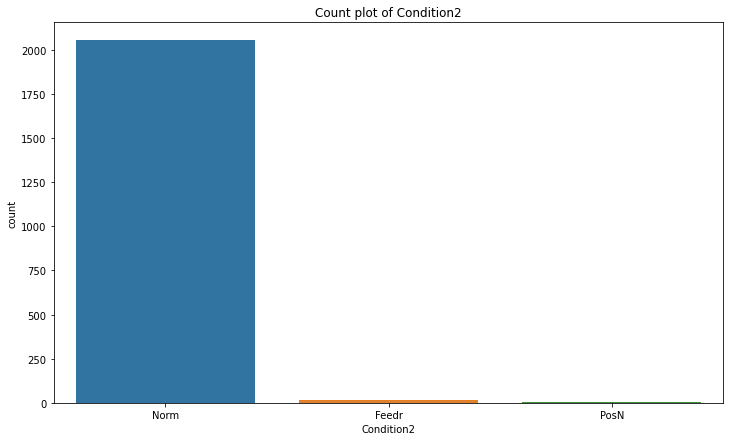

In [236]:
sns.countplot(data.Condition2)
plt.title('Count plot of Condition2')

Text(0.5, 1.0, 'Cat Plot of Condition2 vs Property_Sale_Price')

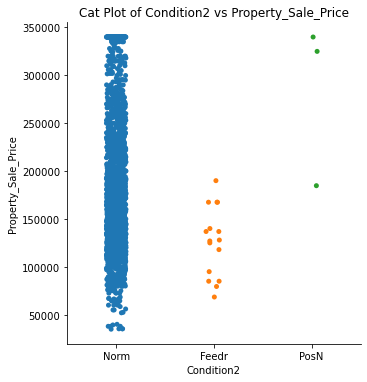

In [237]:
sns.catplot(x = 'Condition2', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Condition2 vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Condition2 vs Property_Sale_Price')

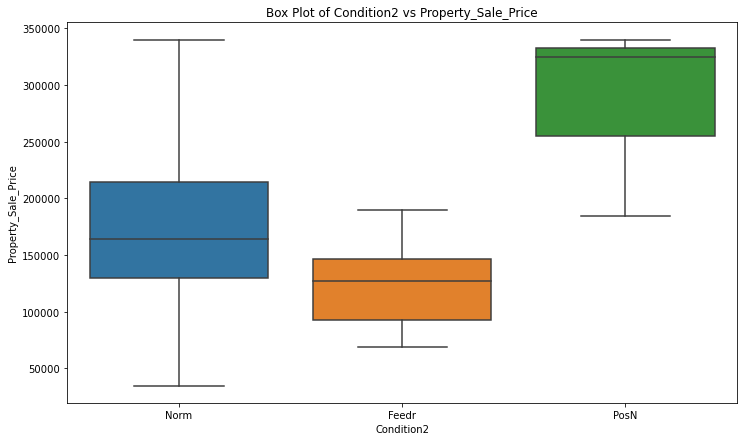

In [238]:
sns.boxplot(x = 'Condition2', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Condition2 vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 14) Dwelling_Type

In [239]:
data.Dwelling_Type.isnull().sum()

0

In [240]:
data.Dwelling_Type.value_counts()

1Fam      1719
TwnhsE     168
Duplex      87
Twnhs       55
2fmCon      44
Name: Dwelling_Type, dtype: int64

In [241]:
data.Dwelling_Type.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Dwelling_Type')

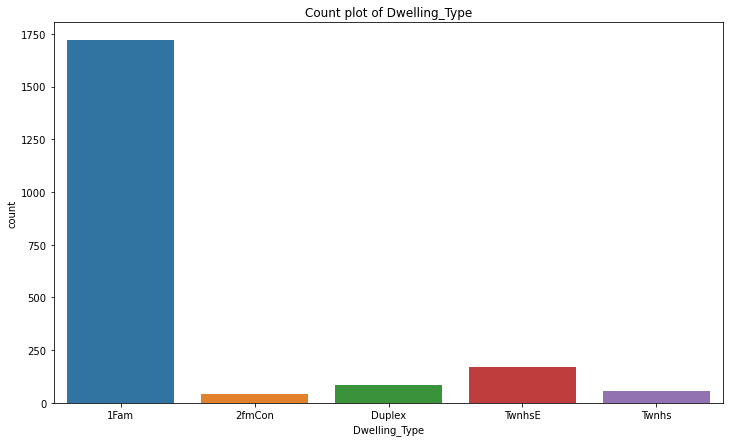

In [242]:
sns.countplot(data.Dwelling_Type)
plt.title('Count plot of Dwelling_Type')

In [243]:
data.groupby('Dwelling_Type')['Property_Sale_Price'].describe()

,count,mean,std,min,25%,50%,75%,max
Dwelling_Type,,,,,,,,
1Fam,1719.0,181941.322862,68783.487306,34900.0,132000.0,169900.0,222500.0,340000.0
2fmCon,44.0,128177.272727,31443.645519,55000.0,113000.0,125000.0,140000.0,228950.0
Duplex,87.0,132676.172414,25563.912932,82000.0,118250.0,136500.0,145000.0,206300.0
Twnhs,55.0,136501.818182,41303.212551,75000.0,95750.0,146000.0,172750.0,230000.0
TwnhsE,168.0,182750.220238,58782.206749,75500.0,143750.0,173733.0,208900.0,340000.0


In [244]:
mod_Dwelling_Type = ols('Property_Sale_Price~Dwelling_Type', data = data).fit()
anova_Dwelling_Type = sm.stats.anova_lm(mod)
print(anova_Dwelling_Type)

                df        sum_sq       mean_sq         F    PR(>F)
Condition2     2.0  7.606935e+10  3.803467e+10  8.527432  0.000205
Residual    2070.0  9.232765e+12  4.460273e+09       NaN       NaN


In [245]:
tukey_Dwelling_Type = pairwise_tukeyhsd(data.Property_Sale_Price, data.Dwelling_Type)
print(tukey_Dwelling_Type)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj    lower       upper    reject
--------------------------------------------------------------
  1Fam 2fmCon -53764.0501 0.001 -81102.5467 -26425.5536   True
  1Fam Duplex -49265.1504 0.001 -68942.8378 -29587.4631   True
  1Fam  Twnhs -45439.5047 0.001 -69967.9641 -20911.0453   True
  1Fam TwnhsE    808.8974   0.9 -13665.6875  15283.4823  False
2fmCon Duplex   4498.8997   0.9 -28626.5994  37624.3988  False
2fmCon  Twnhs   8324.5455   0.9 -27893.3042  44542.3951  False
2fmCon TwnhsE  54572.9475 0.001  24248.0251  84897.8699   True
Duplex  Twnhs   3825.6458   0.9 -27021.5684  34672.8599  False
Duplex TwnhsE  50074.0478 0.001  26422.0097  73726.0859   True
 Twnhs TwnhsE  46248.4021 0.001  18430.1913  74066.6128   True
--------------------------------------------------------------


In [246]:
data['Dwelling_Type'].replace('1Fam', 'TwnhsE', inplace = True)
data['Dwelling_Type'].replace('2fmCon', 'Duplex', inplace = True)
data['Dwelling_Type'].replace('Twnhs', 'Duplex', inplace = True)

In [247]:
data.Dwelling_Type.value_counts()

TwnhsE    1887
Duplex     186
Name: Dwelling_Type, dtype: int64

In [248]:
data.Dwelling_Type.value_counts().sum()

2073

In [249]:
df1=data[data.Dwelling_Type=='TwnhsE']

df2=data[data.Dwelling_Type=='Duplex']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=9.780816776783727, pvalue=4.0657590717491367e-22)

Text(0.5, 1.0, 'Count plot of Dwelling_Type')

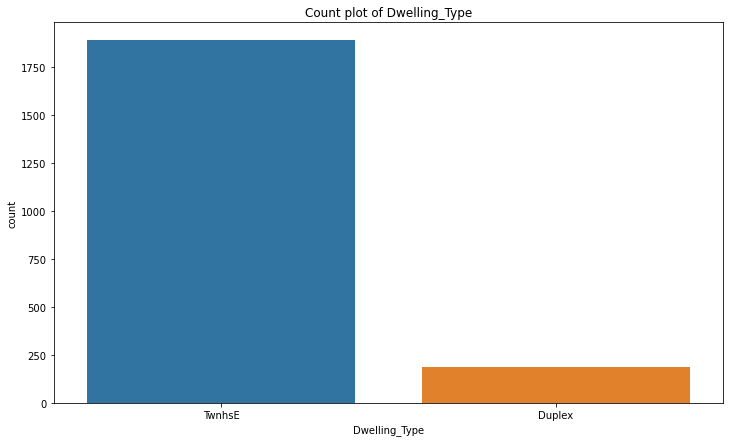

In [250]:
sns.countplot(data.Dwelling_Type)
plt.title('Count plot of Dwelling_Type')

Text(0.5, 1.0, 'Cat Plot of Dwelling_Type vs Property_Sale_Price')

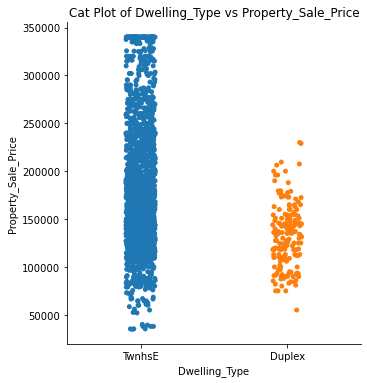

In [251]:
sns.catplot(x = 'Dwelling_Type', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of Dwelling_Type vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Dwelling_Type vs Property_Sale_Price')

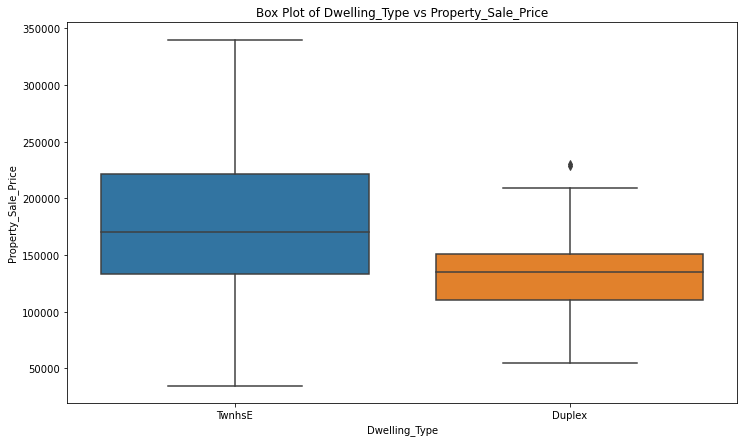

In [252]:
sns.boxplot(x = 'Dwelling_Type', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Dwelling_Type vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 15) HouseStyle

In [253]:
data.HouseStyle.isnull().sum()

0

In [254]:
data.HouseStyle.value_counts()

1Story    1036
2Story     638
1.5Fin     214
SLvl        89
SFoyer      54
1.5Unf      16
2.5Unf      16
2.5Fin      10
Name: HouseStyle, dtype: int64

In [255]:
data.HouseStyle.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of HouseStyle')

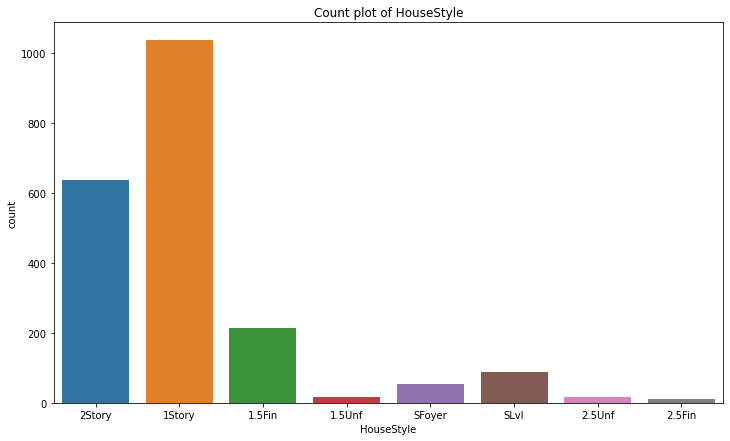

In [256]:
sns.countplot(data.HouseStyle)
plt.title('Count plot of HouseStyle')

In [257]:
data.groupby("HouseStyle")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
HouseStyle,,,,,,,,
1.5Fin,214.0,143526.939252,50472.360301,37900.0,115000.00,135000.0,160000.0,340000.0
1.5Unf,16.0,126343.750000,60112.017309,76000.0,101525.00,115500.0,132750.0,340000.0
1Story,1036.0,172477.168919,67414.299476,34900.0,126131.25,154750.0,208900.0,340000.0
2.5Fin,10.0,194050.000000,75491.519023,104000.0,133750.00,194000.0,199250.0,340000.0
2.5Unf,16.0,155609.375000,54983.379970,101000.0,128000.00,133900.0,163250.0,325000.0
2Story,638.0,204188.871473,66991.000845,35311.0,160000.00,190000.0,244400.0,340000.0
SFoyer,54.0,136689.925926,29355.435667,75500.0,129000.00,135480.0,148000.0,206300.0
SLvl,89.0,164525.617978,37307.939380,91000.0,142500.00,160000.0,178000.0,340000.0


In [258]:
mod_HouseStyle= ols("Property_Sale_Price~HouseStyle",data =data).fit()
aov_table_HouseStyle = sm.stats.anova_lm(mod_HouseStyle,type = 2)
print(aov_table_HouseStyle)

                df        sum_sq       mean_sq          F        PR(>F)
HouseStyle     7.0  8.847505e+11  1.263929e+11  30.982766  4.870702e-41
Residual    2065.0  8.424084e+12  4.079459e+09        NaN           NaN


In [259]:
tukey_HouseStyle = pairwise_tukeyhsd(data.Property_Sale_Price, data.HouseStyle, alpha = 0.05)
print(tukey_HouseStyle)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
1.5Fin 1.5Unf -17183.1893    0.9  -67407.2079  33040.8294  False
1.5Fin 1Story  28950.2297  0.001   14399.5707  43500.8886   True
1.5Fin 2.5Fin  50523.0607 0.2203  -12171.7423 113217.8638  False
1.5Fin 2.5Unf  12082.4357    0.9  -38141.5829  62306.4544  False
1.5Fin 2Story  60661.9322  0.001   45353.9838  75969.8807   True
1.5Fin SFoyer  -6837.0133    0.9  -36347.6141  22673.5874  False
1.5Fin   SLvl  20998.6787  0.154   -3443.1583  45440.5158  False
1.5Unf 1Story  46133.4189 0.0802   -2684.8551   94951.693  False
1.5Unf 2.5Fin    67706.25 0.1457  -10409.9489 145822.4489  False
1.5Unf 2.5Unf   29265.625    0.9  -39246.8137  97778.0637  False
1.5Unf 2Story  77845.1215  0.001   28795.8046 126894.4384   True
1.5Unf SFoyer  10346.1759    0.9  -44811.5775  65503.9293  False
1.5Unf   SLvl   38181.868

In [260]:
data["HouseStyle"].replace("1.5Unf","1.5Fin",inplace = True)
data["HouseStyle"].replace("2.5Unf","1.5Fin",inplace = True)
data["HouseStyle"].replace("SFoyer","1.5Fin",inplace = True)
data["HouseStyle"].replace("2.5Fin","1.2Story",inplace = True)
data["HouseStyle"].replace('1.2Story','2Story',inplace = True)
data["HouseStyle"].replace('SLvl','1Story',inplace = True)

In [261]:
data.HouseStyle.value_counts()

1Story    1125
2Story     648
1.5Fin     300
Name: HouseStyle, dtype: int64

In [262]:
data.HouseStyle.value_counts().sum()

2073

In [263]:
mod_HouseStyle= ols("Property_Sale_Price~HouseStyle",data =data).fit()
aov_table_HouseStyle = sm.stats.anova_lm(mod_HouseStyle,type = 2)
print(aov_table_HouseStyle)

                df        sum_sq       mean_sq           F        PR(>F)
HouseStyle     2.0  8.696497e+11  4.348248e+11  106.655731  8.210510e-45
Residual    2070.0  8.439185e+12  4.076901e+09         NaN           NaN


In [264]:
tukey_HouseStyle = pairwise_tukeyhsd(data.Property_Sale_Price, data.HouseStyle, alpha = 0.05)
print(tukey_HouseStyle)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj   lower      upper    reject
-----------------------------------------------------------
1.5Fin 1Story 29823.8762 0.001 20092.9221 39554.8303   True
1.5Fin 2Story 62008.1707 0.001 51550.3566 72465.9849   True
1Story 2Story 32184.2945 0.001 24798.8697 39569.7194   True
-----------------------------------------------------------


Text(0.5, 1.0, 'Count plot of HouseStyle')

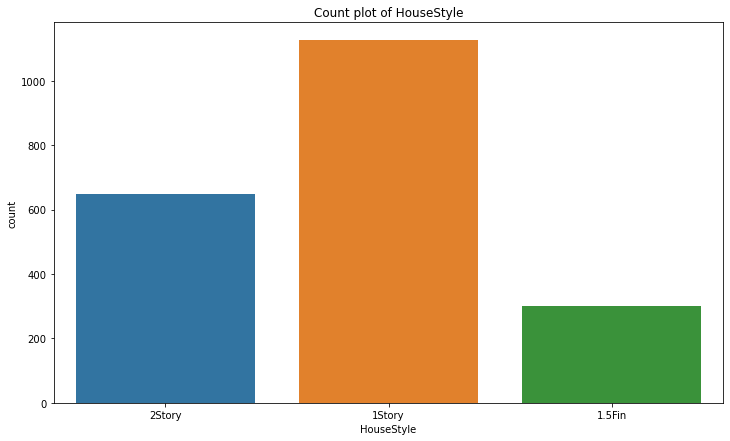

In [265]:
sns.countplot(data.HouseStyle)
plt.title('Count plot of HouseStyle')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs HouseStyle')

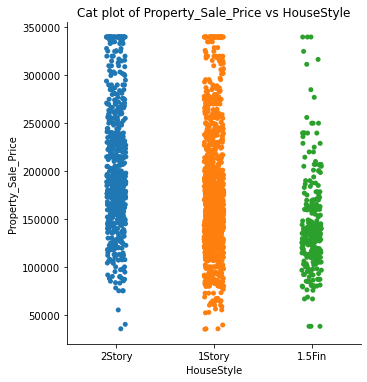

In [266]:
sns.catplot(x = 'HouseStyle', y = 'Property_Sale_Price', data = data)
plt.title('Cat plot of Property_Sale_Price vs HouseStyle')

Text(0.5, 1.0, 'Box Plot of Property_Sale_Price vs HouseStyle')

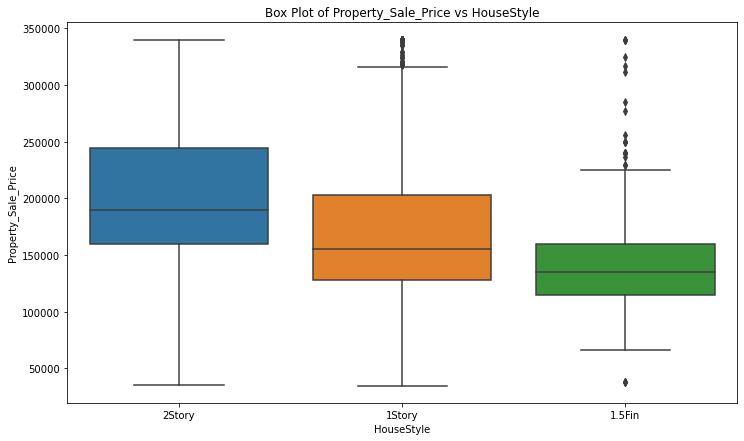

In [267]:
sns.boxplot(x = 'HouseStyle', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Property_Sale_Price vs HouseStyle')

**Good Predictor**

# 

# 

# 16) OverallQual

In [268]:
data.OverallQual.isnull().sum()

0

In [269]:
data.OverallQual.describe()

count    2073.000000
mean        6.233478
std         1.517115
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: OverallQual, dtype: float64

In [270]:
data.OverallQual.value_counts()

5     508
6     463
7     416
8     265
4     214
9     164
3      20
10     17
2       4
1       2
Name: OverallQual, dtype: int64

In [271]:
data.OverallQual.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of OverallQual')

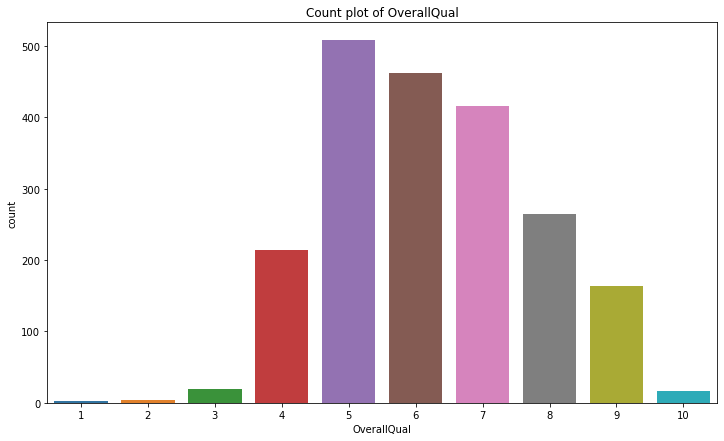

In [272]:
sns.countplot(data.OverallQual)
plt.title('Count plot of OverallQual')

In [273]:
data.groupby("OverallQual")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
OverallQual,,,,,,,,
1,2.0,50150.000000,15344.217152,39300.0,44725.0,50150.0,55575.00,61000.0
2,4.0,47655.500000,14254.200796,35311.0,35311.0,47655.5,60000.00,60000.0
3,20.0,87473.750000,24688.567399,37900.0,75500.0,86250.0,97500.00,139600.0
4,214.0,136667.672897,58078.734600,34900.0,101850.0,124250.0,153750.00,340000.0
5,508.0,142626.137795,43095.950014,55993.0,119500.0,135250.0,154925.00,340000.0
6,463.0,166339.904968,43392.607283,75000.0,139750.0,163000.0,185000.00,340000.0
7,416.0,202321.163462,51486.310520,64500.0,172350.0,197000.0,230000.00,340000.0
8,265.0,237304.981132,69148.120764,64500.0,184100.0,245000.0,287000.00,340000.0
9,164.0,212890.189024,89622.432861,37900.0,137875.0,187500.0,316140.25,340000.0


In [274]:
mod_OverallQual= ols("Property_Sale_Price~OverallQual",data =data).fit()
aov_table_OverallQual = sm.stats.anova_lm(mod_OverallQual,type = 2)
print(aov_table_OverallQual)

                 df        sum_sq       mean_sq           F         PR(>F)
OverallQual     1.0  2.676231e+12  2.676231e+12  835.640689  1.193209e-154
Residual     2071.0  6.632604e+12  3.202609e+09         NaN            NaN


In [275]:
tukey_OverallQual = pairwise_tukeyhsd(data.Property_Sale_Price, data.OverallQual, alpha = 0.05)
print(tukey_OverallQual)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
     1      2     -2494.5    0.9 -153629.5891 148640.5891  False
     1      3    37323.75    0.9   -92100.608  166748.108  False
     1      4  86517.6729  0.453  -37458.9111 210494.2569  False
     1      5  92476.1378 0.3459   -31167.823 216120.0986  False
     1      6  116189.905  0.087   -7477.6168 239857.4267  False
     1      7 152171.1635  0.004   28473.5979  275868.729   True
     1      8 187154.9811  0.001   63288.9077 311021.0546   True
     1      9  162740.189 0.0014   38588.7388 286891.6392   True
     1     10    269100.0  0.001  138641.6094 399558.3906   True
     2      3    39818.25    0.9  -55767.9732 135404.4732  False
     2      4  89012.1729 0.0452     942.5698  177081.776   True
     2      5  94970.6378 0.0214     7369.892 182571.3836   True
     2      6  118684.405

In [276]:
data["OverallQual"].replace(1, 3,inplace = True)
data["OverallQual"].replace(2, 3 ,inplace = True)
data["OverallQual"].replace(4, 5,inplace = True)
data["OverallQual"].replace(9, 7,inplace = True)

In [277]:
data.OverallQual.value_counts()

5     722
7     580
6     463
8     265
3      26
10     17
Name: OverallQual, dtype: int64

In [278]:
data.OverallQual.value_counts().sum()

2073

In [279]:
mod_OverallQual= ols("Property_Sale_Price~OverallQual",data =data).fit()
aov_table_OverallQual = sm.stats.anova_lm(mod_OverallQual,type = 2)
print(aov_table_OverallQual)

                 df        sum_sq       mean_sq           F         PR(>F)
OverallQual     1.0  2.998150e+12  2.998150e+12  983.913616  4.758552e-177
Residual     2071.0  6.310684e+12  3.047168e+09         NaN            NaN


In [280]:
tukey_OverallQual = pairwise_tukeyhsd(data.Property_Sale_Price, data.OverallQual, alpha = 0.05)
print(tukey_OverallQual)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj    lower       upper    reject
--------------------------------------------------------------
     3      5  62383.2477 0.001  30976.7078  93789.7876   True
     3      6  87863.0973 0.001  56152.6895  119573.505   True
     3      7 126832.8389 0.001  95292.9464 158372.7313   True
     3      8 158828.1734 0.001 126494.0234 191162.3235   True
     3     10 240773.1923 0.001 191699.6216  289846.763   True
     5      6  25479.8496 0.001  16112.3292    34847.37   True
     5      7  64449.5912 0.001  55676.6046  73222.5777   True
     5      8  96444.9257 0.001  85144.5832 107745.2682   True
     5     10 178389.9446 0.001 139784.0406 216995.8486   True
     6      7  38969.7416 0.001  29164.4113  48775.0719   True
     6      8  70965.0762 0.001  58845.7961  83084.3563   True
     6     10  152910.095 0.001 114056.5877 191763.6023   True
     7      8  31995.3346 0.001  20329.4954  43661.1738

Text(0.5, 1.0, 'Count plot of OverallQual')

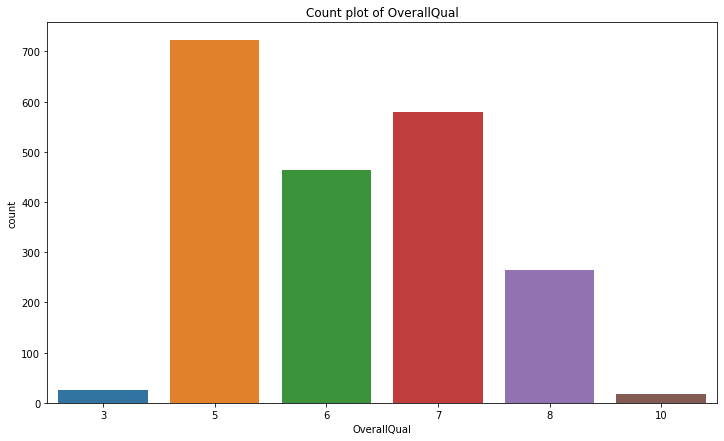

In [281]:
sns.countplot(data.OverallQual)
plt.title('Count plot of OverallQual')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs OverallQual')

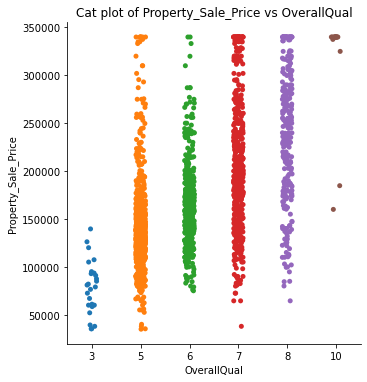

In [282]:
sns.catplot(x = 'OverallQual', y = 'Property_Sale_Price', data = data)
plt.title('Cat plot of Property_Sale_Price vs OverallQual')

Text(0.5, 1.0, 'Box plot of Property_Sale_Price vs OverallQual')

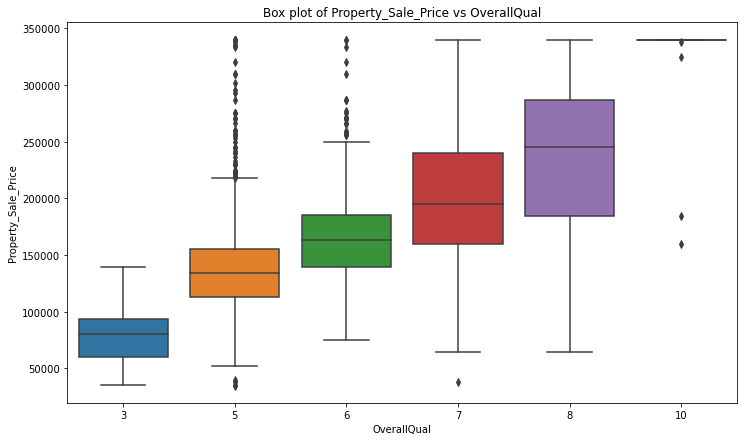

In [283]:
sns.boxplot(x = 'OverallQual', y = 'Property_Sale_Price', data = data)
plt.title('Box plot of Property_Sale_Price vs OverallQual')

**Good Predictor**

# 

# 

# 17) OverallCond

In [284]:
data.OverallCond.isnull().sum()

0

In [285]:
data.OverallCond.describe()

count    2073.000000
mean        5.835022
std         1.360214
min         1.000000
25%         5.000000
50%         5.000000
75%         7.000000
max         9.000000
Name: OverallCond, dtype: float64

In [286]:
data.OverallCond.value_counts()

5    943
6    351
7    315
8    172
4    147
9    113
3     26
2      5
1      1
Name: OverallCond, dtype: int64

In [287]:
data.OverallCond.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of OverallCond')

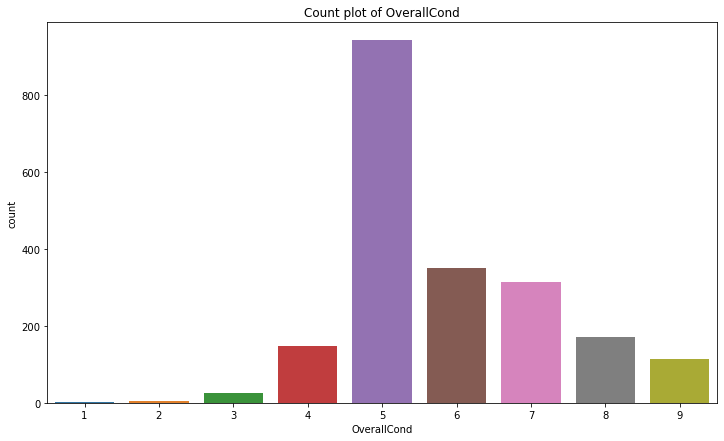

In [288]:
sns.countplot(data.OverallCond)
plt.title('Count plot of OverallCond')

In [289]:
data.groupby("OverallCond")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
OverallCond,,,,,,,,
1,1.0,61000.000000,NaN,61000.0,61000.0,61000.0,61000.0,61000.0
2,5.0,131100.000000,117046.144746,67000.0,76500.0,85000.0,87000.0,340000.0
3,26.0,99367.153846,45847.233272,35311.0,69250.0,87250.0,129250.0,200624.0
4,147.0,163496.204082,68911.443393,37900.0,117500.0,150000.0,192140.0,340000.0
5,943.0,194661.337222,69026.850613,34900.0,142976.5,182900.0,236750.0,340000.0
6,351.0,158068.615385,51991.534275,37900.0,127000.0,144000.0,176000.0,340000.0
7,315.0,168894.031746,61511.613169,79900.0,125250.0,149700.0,199950.0,340000.0
8,172.0,164482.674419,59277.603926,35311.0,125375.0,152700.0,189237.5,340000.0
9,113.0,179425.176991,73785.301835,75000.0,125500.0,160000.0,215000.0,340000.0


In [290]:
mod_OverallCond= ols("Property_Sale_Price~OverallCond",data =data).fit()
aov_table_OverallCond = sm.stats.anova_lm(mod_OverallCond,type = 2)
print(aov_table_OverallCond)

                 df        sum_sq       mean_sq         F    PR(>F)
OverallCond     1.0  3.136673e+10  3.136673e+10  7.001964  0.008204
Residual     2071.0  9.277467e+12  4.479704e+09       NaN       NaN


In [291]:
tukey_OverallCond = pairwise_tukeyhsd(data.Property_Sale_Price, data.OverallCond, alpha = 0.05)
print(tukey_OverallCond)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
     1      2     70100.0    0.9 -149891.1778 290091.1778  False
     1      3  38367.1538    0.9 -166281.9513  243016.259  False
     1      4 102496.2041 0.7921  -99009.2624 304001.6705  False
     1      5 133661.3372 0.4974  -67268.6667 334591.3411  False
     1      6  97068.6154  0.841 -104040.8055 298178.0363  False
     1      7 107894.0317 0.7399  -93248.0341 309036.0976  False
     1      8 103482.6744 0.7824  -97923.8198 304889.1686  False
     1      9  118425.177 0.6445  -83285.0164 320135.3704  False
     2      3 -31732.8462    0.9 -129800.0545  66334.3622  False
     2      4  32396.2041    0.9  -58929.4447 123721.8529  False
     2      5  63561.3372 0.4143  -26487.4695 153610.1439  False
     2      6  26968.6154    0.9  -63479.8245 117417.0553  False
     2      7  37794.0317

In [292]:
data["OverallCond"].replace(1, 3,inplace = True)
data["OverallCond"].replace(2, 3,inplace = True)
data["OverallCond"].replace(4, 6,inplace = True)
data["OverallCond"].replace(7, 6,inplace = True)
data["OverallCond"].replace(8, 6,inplace = True)
data["OverallCond"].replace(9, 5,inplace = True)

In [293]:
data.OverallCond.value_counts()

5    1056
6     985
3      32
Name: OverallCond, dtype: int64

In [294]:
mod_OverallCond= ols("Property_Sale_Price~OverallCond",data =data).fit()
aov_table_OverallCond = sm.stats.anova_lm(mod_OverallCond,type = 2)
print(aov_table_OverallCond)

                 df        sum_sq       mean_sq        F        PR(>F)
OverallCond     1.0  1.190641e+11  1.190641e+11  26.8322  2.434174e-07
Residual     2071.0  9.189770e+12  4.437359e+09      NaN           NaN


In [295]:
tukey_OverallCond = pairwise_tukeyhsd(data.Property_Sale_Price, data.OverallCond, alpha = 0.05)
print(tukey_OverallCond)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj    lower       upper    reject
-------------------------------------------------------------
     3      5 89904.5152 0.001  62647.6117 117161.4186   True
     3      6 60334.1371 0.001  33048.3561  87619.9181   True
     5      6 -29570.378 0.001 -36299.2218 -22841.5343   True
-------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of OverallCond')

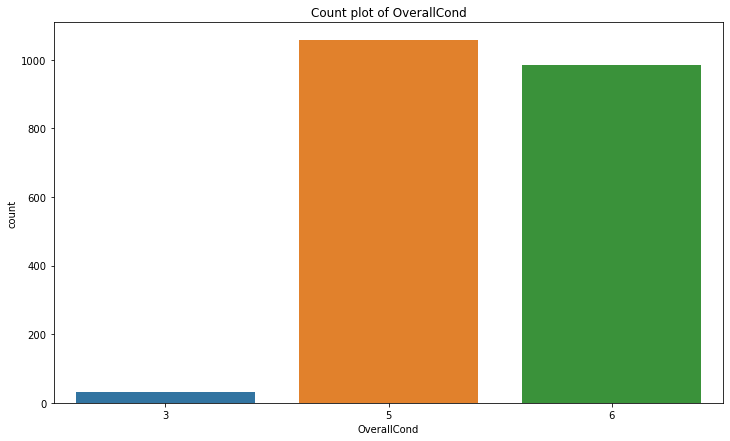

In [296]:
sns.countplot(data.OverallCond)
plt.title('Count plot of OverallCond')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs OverallCond')

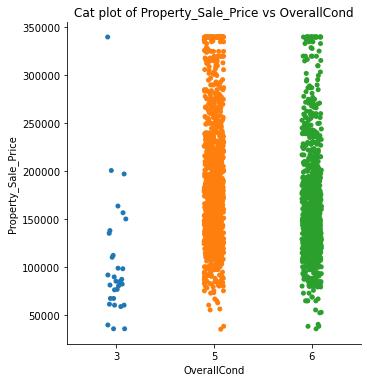

In [297]:
sns.catplot(x = 'OverallCond', y = 'Property_Sale_Price', data = data)
plt.title('Cat plot of Property_Sale_Price vs OverallCond')

Text(0.5, 1.0, 'Box plot of Property_Sale_Price vs OverallCond')

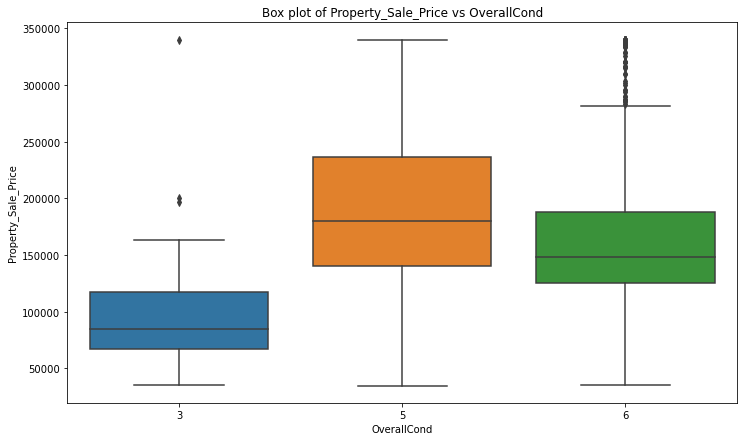

In [298]:
sns.boxplot(x = 'OverallCond', y = 'Property_Sale_Price', data = data)
plt.title('Box plot of Property_Sale_Price vs OverallCond')

**Good Predictor**

# 

# 

# 18) YearBuilt

In [299]:
data.YearBuilt.isnull().sum()

0

In [300]:
data.YearBuilt.value_counts()

2005    100
2006     86
2004     63
2007     58
1977     56
       ... 
1898      1
1903      1
1913      1
1911      1
1872      1
Name: YearBuilt, Length: 117, dtype: int64

In [301]:
data.YearBuilt.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of YearBuilt')

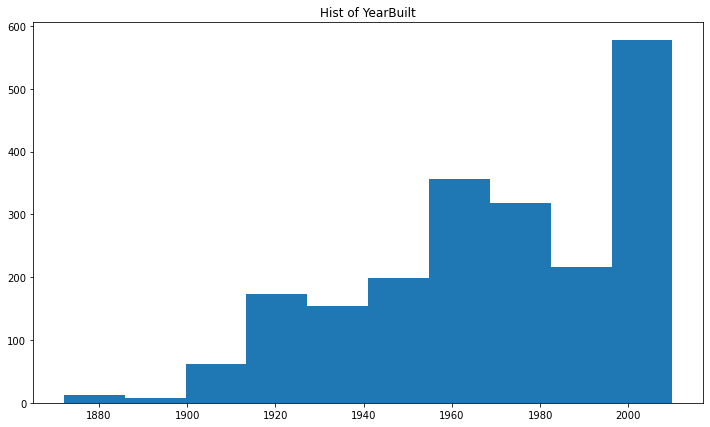

In [302]:
plt.hist(data.YearBuilt)
plt.title('Hist of YearBuilt')

Text(0.5, 1.0, 'Mormality of YearBuilt')

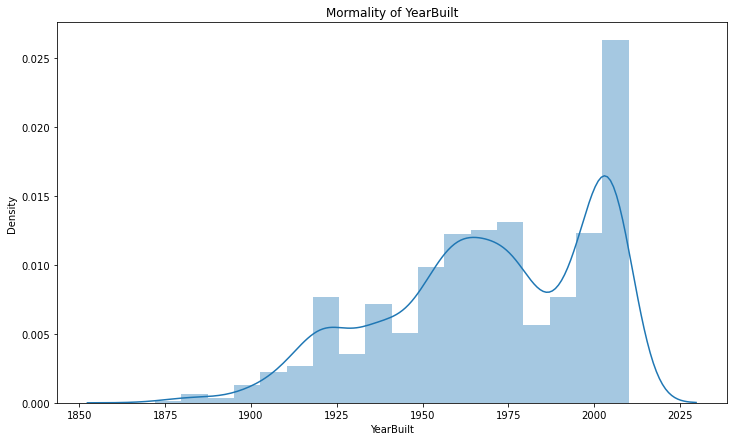

In [303]:
sns.distplot(data.YearBuilt)
plt.title('Mormality of YearBuilt')

Text(0.5, 1.0, 'Count plot of YearBuilt')

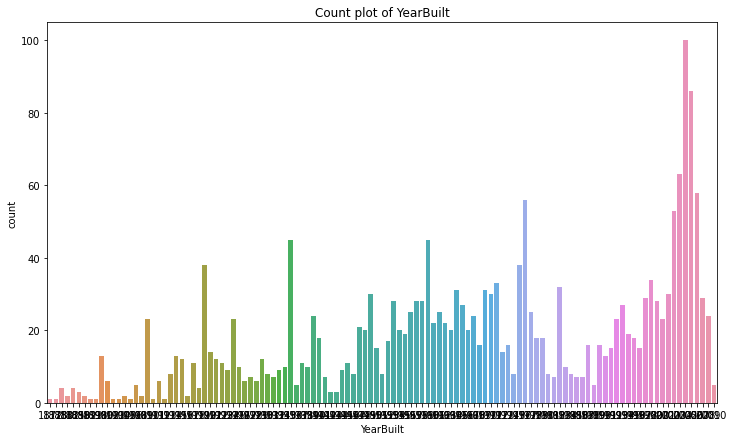

In [304]:
sns.countplot(data.YearBuilt)
plt.title('Count plot of YearBuilt')

Text(0.5, 1.0, 'Box plot of YearBuilt')

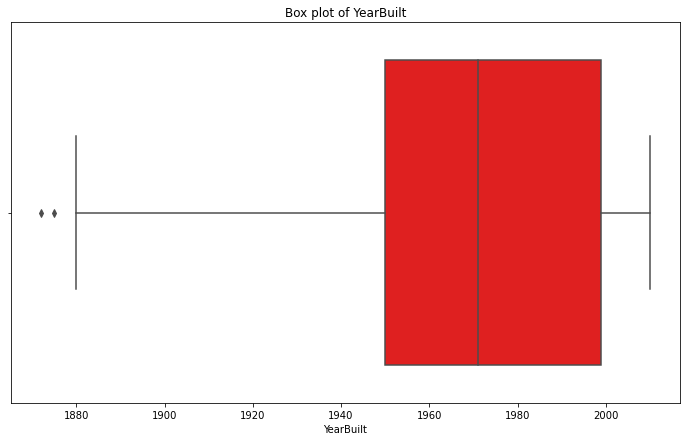

In [305]:
sns.boxplot(x = data.YearBuilt, data =data, color = 'r')
plt.title('Box plot of YearBuilt')

In [306]:
IQR = data.YearBuilt.quantile(.75) - data.YearBuilt.quantile(.25)
IQR

49.0

In [307]:
upper_limit = data.YearBuilt.quantile(.75) + (1.5*IQR)
upper_limit

2072.5

In [308]:
lower_limit = data.YearBuilt.quantile(.25) - (1.5*IQR)
lower_limit

1876.5

In [309]:
len(data.YearBuilt[data.YearBuilt > upper_limit])

0

In [310]:
len(data.YearBuilt[data.YearBuilt < lower_limit])

2

In [311]:
data['YearBuilt'] = np.where(data['YearBuilt'] < lower_limit, lower_limit, data['YearBuilt'])

Text(0.5, 1.0, 'Box plot of YearBuilt')

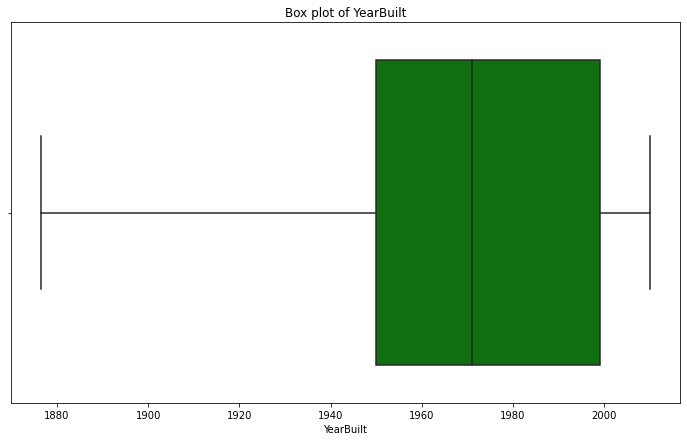

In [312]:
sns.boxplot(x = data.YearBuilt, data =data, color = 'g')
plt.title('Box plot of YearBuilt')

Text(0.5, 1.0, 'Normality of YearBuilt')

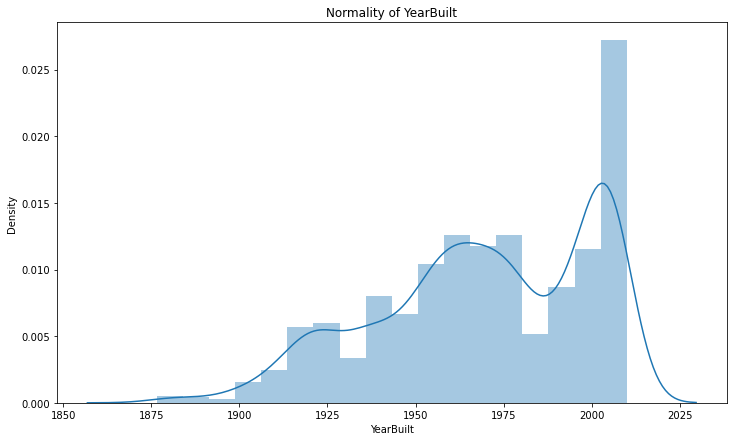

In [313]:
sns.distplot(data.YearBuilt)
plt.title('Normality of YearBuilt')

In [314]:
np.corrcoef(data.YearBuilt, data.Property_Sale_Price)

array([[1.        , 0.47415594],
       [0.47415594, 1.        ]])

Text(0.5, 1.0, 'Scatter plot of YearBuilt vs Property_Sale_Price')

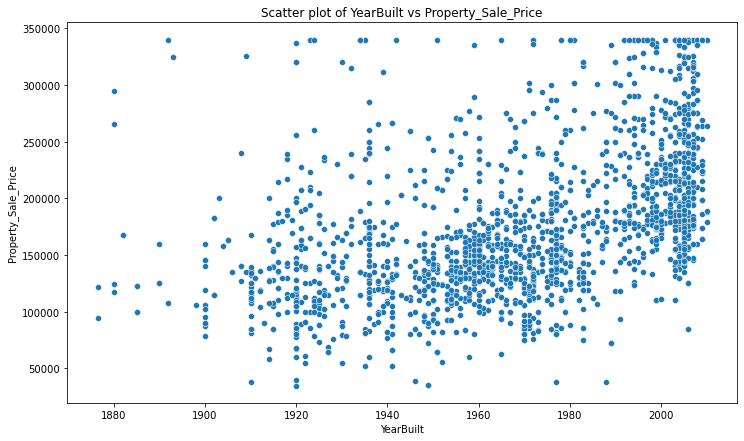

In [315]:
sns.scatterplot(x = data['YearBuilt'], y = data.Property_Sale_Price, data = data )
plt.xlabel('YearBuilt')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter plot of YearBuilt vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 19) YearRemodAdd

In [316]:
data.YearRemodAdd.isnull().sum()

0

In [317]:
data.YearRemodAdd.value_counts()

1950    223
2006    138
2007    121
2005    107
2000     79
       ... 
2014      3
2019      2
2022      2
2012      2
2023      2
Name: YearRemodAdd, Length: 72, dtype: int64

In [318]:
data.YearRemodAdd.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of YearRemodAdd')

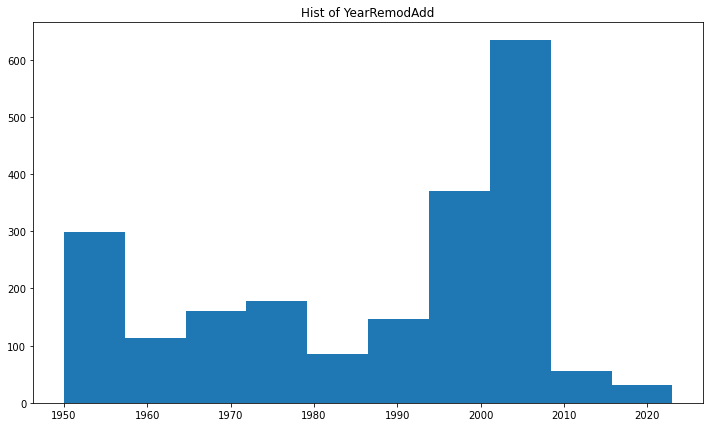

In [319]:
plt.hist(data.YearRemodAdd)
plt.title('Hist of YearRemodAdd')

Text(0.5, 1.0, 'Normality of YearRemodAdd')

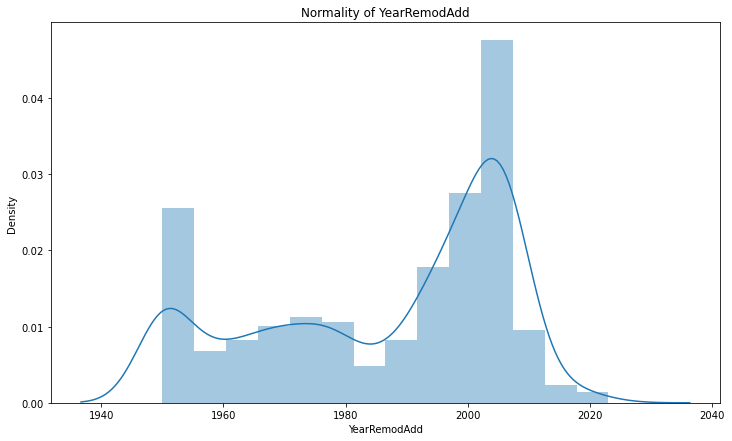

In [320]:
sns.distplot(data.YearRemodAdd)
plt.title('Normality of YearRemodAdd')

Text(0.5, 1.0, 'Dist plot of YearRemodAdd')

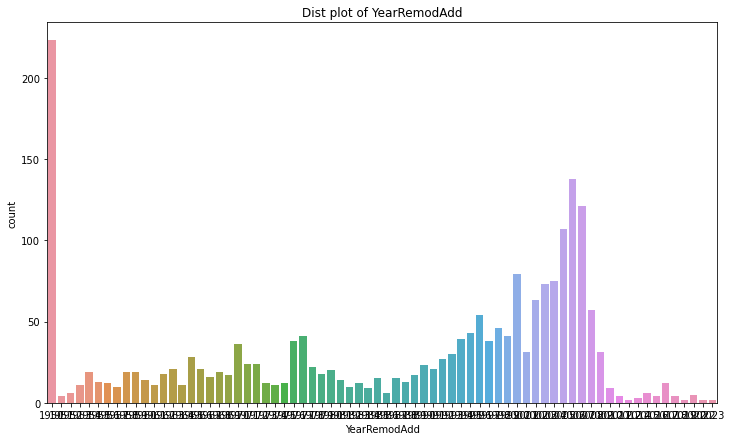

In [321]:
sns.countplot(data.YearRemodAdd)
plt.title('Dist plot of YearRemodAdd')

Text(0.5, 1.0, 'Box plot of YearRemodAdd')

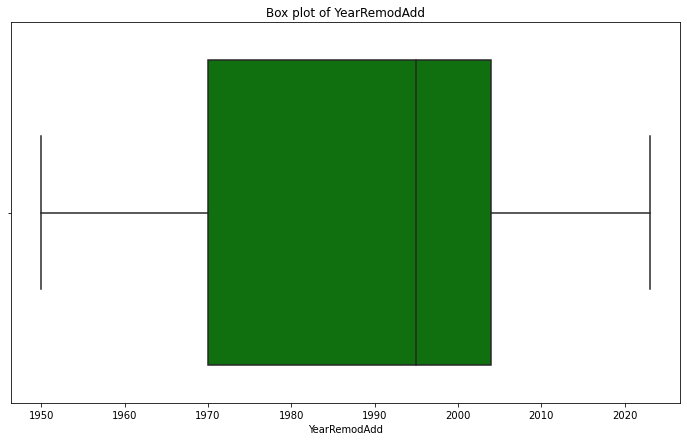

In [322]:
sns.boxplot(x = data.YearRemodAdd, data =data, color = 'g')
plt.title('Box plot of YearRemodAdd')

In [323]:
np.corrcoef(data.YearRemodAdd, data.Property_Sale_Price)

array([[1.        , 0.51542146],
       [0.51542146, 1.        ]])

Text(0.5, 1.0, 'Scatter plot of YearRemodAdd vs Property_Sale_Price')

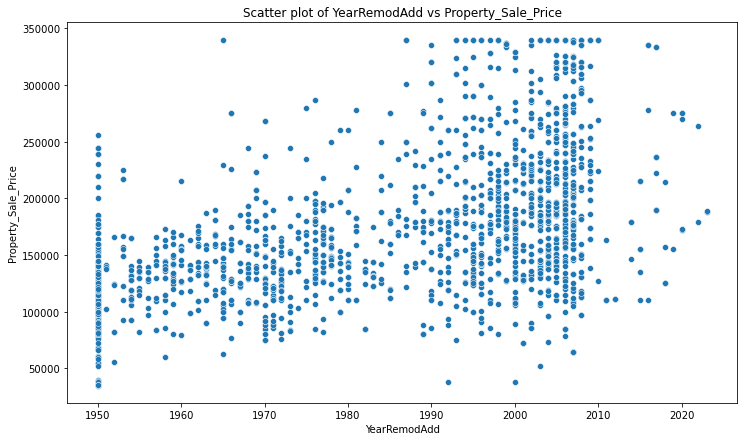

In [324]:
sns.scatterplot(x = data['YearRemodAdd'], y = data.Property_Sale_Price, data = data )
plt.xlabel('YearRemodAdd')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter plot of YearRemodAdd vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 20) RoofStyle

In [325]:
data.RoofStyle.isnull().sum()

0

In [326]:
data.RoofStyle.value_counts()

Gable      1606
Hip         420
Flat         19
Gambrel      15
Mansard      11
Shed          2
Name: RoofStyle, dtype: int64

In [327]:
data.RoofStyle.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of RoofStyle')

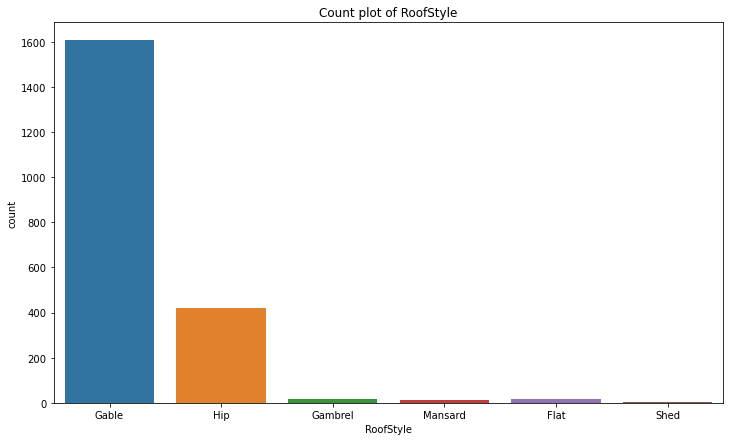

In [328]:
sns.countplot(data.RoofStyle)
plt.title('Count plot of RoofStyle')

In [329]:
data.groupby("RoofStyle")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
RoofStyle,,,,,,,,
Flat,19.0,198286.315789,66738.692027,82000.0,136000.0,235000.0,249000.0,274970.0
Gable,1606.0,170659.143836,60971.965331,34900.0,128000.0,160000.0,202500.0,340000.0
Gambrel,15.0,167900.000000,66468.209372,40000.0,116200.0,180500.0,207000.0,259500.0
Hip,420.0,203536.702381,81441.325754,55000.0,139825.0,175700.0,275000.0,340000.0
Mansard,11.0,168132.545455,66041.521508,84500.0,117500.0,152000.0,216000.0,265979.0
Shed,2.0,225000.000000,49497.474683,190000.0,207500.0,225000.0,242500.0,260000.0


In [330]:
mod = ols('Property_Sale_Price ~ RoofStyle', data=data).fit()
print(sm.stats.anova_lm(mod))

               df        sum_sq       mean_sq          F        PR(>F)
RoofStyle     5.0  3.749304e+11  7.498607e+10  17.349214  7.395804e-17
Residual   2067.0  8.933904e+12  4.322160e+09        NaN           NaN


In [331]:
t_Roof_Style = pairwise_tukeyhsd(data.Property_Sale_Price, data.RoofStyle)
print(t_Roof_Style)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff  p-adj     lower        upper    reject
------------------------------------------------------------------
   Flat   Gable  -27627.172 0.4541  -70901.5578  15647.2139  False
   Flat Gambrel -30386.3158 0.7361  -95155.8583  34383.2267  False
   Flat     Hip   5250.3866    0.9  -38732.5898   49233.363  False
   Flat Mansard -30153.7703 0.8097 -101200.0409  40892.5002  False
   Flat    Shed  26713.6842    0.9  -112689.165 166116.5334  False
  Gable Gambrel  -2759.1438    0.9  -51402.8782  45884.5906  False
  Gable     Hip  32877.5585  0.001   22600.3278  43154.7893   True
  Gable Mansard  -2526.5984    0.9  -59260.1142  54206.9174  False
  Gable    Shed  54340.8562 0.8342  -78340.2413 187021.9536  False
Gambrel     Hip  35636.7024 0.3074  -13638.4703  84911.8751  False
Gambrel Mansard    232.5455    0.9  -74206.1071   74671.198  False
Gambrel    Shed     57100.0 0.8425  -84061.9453 198261.9453  F

In [332]:
data["RoofStyle"].replace('Flat', 'Hip',inplace = True)
data["RoofStyle"].replace('Shed', 'Hip',inplace = True)
data["RoofStyle"].replace('Gambrel', 'Gable',inplace = True)
data["RoofStyle"].replace('Mansard', 'Gable',inplace = True)

In [333]:
data.RoofStyle.value_counts()

Gable    1632
Hip       441
Name: RoofStyle, dtype: int64

In [334]:
df1=data[data.RoofStyle=='Gable']

df2=data[data.RoofStyle=='Hip']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=-9.301767992439983, pvalue=3.396220835555546e-20)

Text(0.5, 1.0, 'Count plot of RoofStyle')

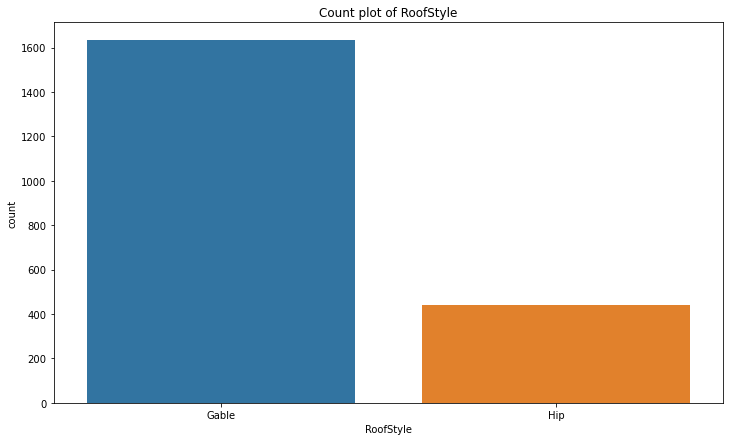

In [335]:
sns.countplot(data.RoofStyle)
plt.title('Count plot of RoofStyle')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs RoofStyle')

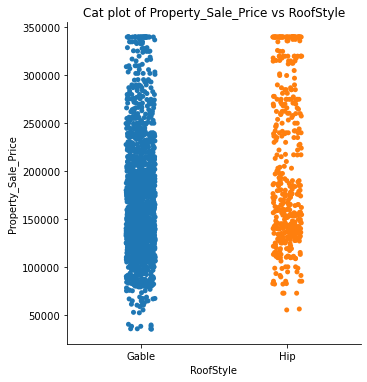

In [336]:
sns.catplot(x = 'RoofStyle', y = 'Property_Sale_Price', data = data)
plt.title('Cat plot of Property_Sale_Price vs RoofStyle')

Text(0.5, 1.0, 'Box Plot of Property_Sale_Price vs RoofStyle')

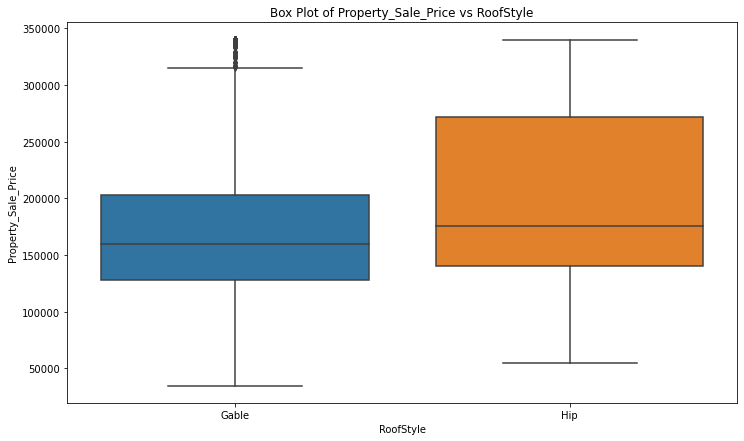

In [337]:
sns.boxplot(x = 'RoofStyle', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of Property_Sale_Price vs RoofStyle')

**Good Predictor**

# 

# 

# 21) RoofMatl

In [338]:
data.RoofMatl.isnull().sum()

0

In [339]:
data.RoofMatl.value_counts()

CompShg    2036
Tar&Grv      17
WdShngl      10
WdShake       6
ClyTile       1
Metal         1
Membran       1
Roll          1
Name: RoofMatl, dtype: int64

In [340]:
data.RoofMatl.value_counts().sum()

2073

Text(0.5, 1.0, 'Count Plot of RoofMatl')

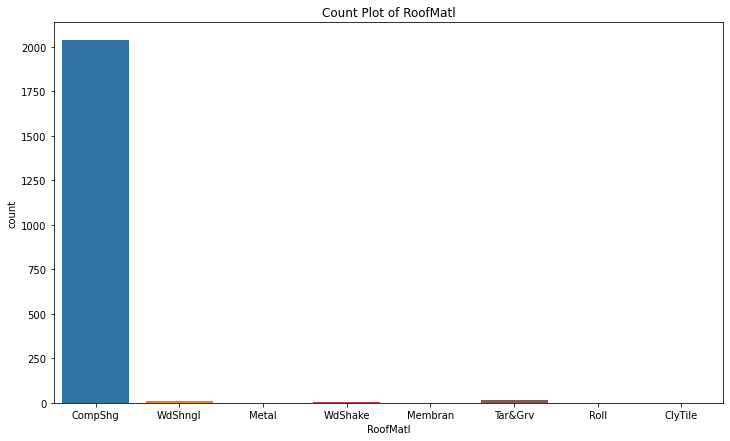

In [341]:
sns.countplot(data.RoofMatl)
plt.title('Count Plot of RoofMatl')

In [342]:
data.groupby("RoofMatl")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
RoofMatl,,,,,,,,
ClyTile,1.0,160000.000000,NaN,160000.0,160000.0,160000.0,160000.0,160000.0
CompShg,2036.0,176628.908644,66477.719608,34900.0,130000.0,163000.0,212925.0,340000.0
Membran,1.0,241500.000000,NaN,241500.0,241500.0,241500.0,241500.0,241500.0
Metal,1.0,180000.000000,NaN,180000.0,180000.0,180000.0,180000.0,180000.0
Roll,1.0,137000.000000,NaN,137000.0,137000.0,137000.0,137000.0,137000.0
Tar&Grv,17.0,192702.352941,69462.739880,82000.0,129000.0,185000.0,256000.0,274970.0
WdShake,6.0,249000.000000,37363.083385,190000.0,231500.0,251000.0,280250.0,287000.0
WdShngl,10.0,304450.000000,55839.278290,168500.0,278500.0,340000.0,340000.0,340000.0


In [343]:
mod = ols('Property_Sale_Price ~ RoofMatl', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq         F        PR(>F)
RoofMatl     7.0  2.033413e+11  2.904876e+10  6.587858  1.016746e-07
Residual  2065.0  9.105493e+12  4.409440e+09       NaN           NaN


In [344]:
t_RoofMatl = pairwise_tukeyhsd(data.Property_Sale_Price, data.RoofMatl)
print(t_RoofMatl)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff  p-adj     lower        upper    reject
------------------------------------------------------------------
ClyTile CompShg  16628.9086    0.9 -184887.9765 218145.7938  False
ClyTile Membran     81500.0    0.9 -203417.9506 366417.9506  False
ClyTile   Metal     20000.0    0.9 -264917.9506 304917.9506  False
ClyTile    Roll    -23000.0    0.9 -307917.9506 261917.9506  False
ClyTile Tar&Grv  32702.3529    0.9 -174605.9068 240010.6126  False
ClyTile WdShake     89000.0    0.9 -128609.6792 306609.6792  False
ClyTile WdShngl    144450.0 0.4349  -66850.8074 355750.8074  False
CompShg Membran  64871.0914    0.9 -136645.7938 266387.9765  False
CompShg   Metal   3371.0914    0.9 -198145.7938 204887.9765  False
CompShg    Roll -39628.9086    0.9 -241145.7938 161887.9765  False
CompShg Tar&Grv  16073.4443    0.9   -32993.153  65140.0416  False
CompShg WdShake  72371.0914 0.1334   -9998.7389 154740.9216  F

In [345]:
data["RoofMatl"].replace('ClyTile', 'CompShg',inplace = True)
data["RoofMatl"].replace('Membran', 'CompShg',inplace = True)
data["RoofMatl"].replace('Metal', 'CompShg',inplace = True)
data["RoofMatl"].replace('Roll', 'CompShg',inplace = True)
data["RoofMatl"].replace('Tar&Grv', 'CompShg',inplace = True)
data["RoofMatl"].replace('WdShake', 'WdShngl',inplace = True)

In [346]:
data.RoofMatl.value_counts()

CompShg    2057
WdShngl      16
Name: RoofMatl, dtype: int64

In [347]:
data.RoofMatl.value_counts().sum()

2073

In [348]:
df1=data[data.RoofMatl =='CompShg']

df2=data[data.RoofMatl =='WdShngl']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=-6.415414097229135, pvalue=1.7352766367863425e-10)

Text(0.5, 1.0, 'Count Plot of RoofMatl')

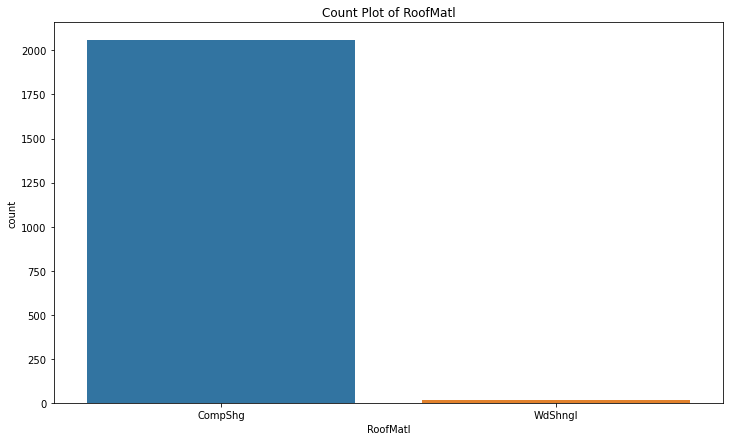

In [349]:
sns.countplot(data.RoofMatl)
plt.title('Count Plot of RoofMatl')

Text(0.5, 1.0, 'Cat Plot of RoofMatl vs Property_Sale_Price')

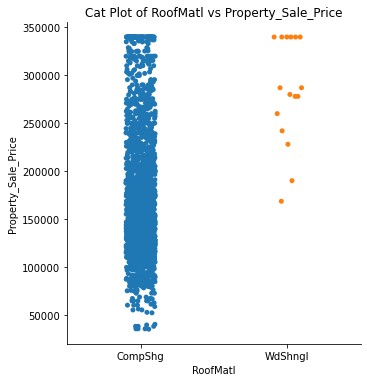

In [350]:
sns.catplot(x = 'RoofMatl', y = 'Property_Sale_Price', data = data)
plt.title('Cat Plot of RoofMatl vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of RoofMatl vs Property_Sale_Price')

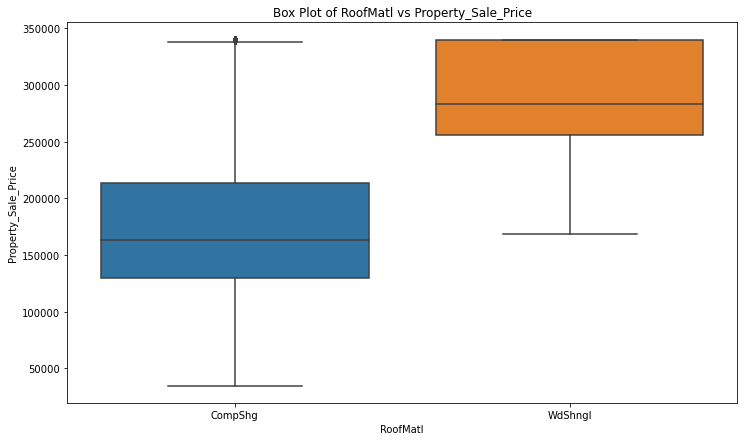

In [351]:
sns.boxplot(x = 'RoofMatl', y = 'Property_Sale_Price', data = data)
plt.title('Box Plot of RoofMatl vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 22) Exterior1st

In [352]:
data.Exterior1st.isnull().sum()

0

In [353]:
data.Exterior1st.value_counts()

VinylSd    750
HdBoard    316
MetalSd    308
Wd Sdng    285
Plywood    156
CemntBd     87
BrkFace     72
WdShing     37
Stucco      28
AsbShng     24
BrkComm      3
Stone        3
AsphShn      2
CBlock       1
ImStucc      1
Name: Exterior1st, dtype: int64

In [354]:
data.Exterior1st.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Exterior1st')

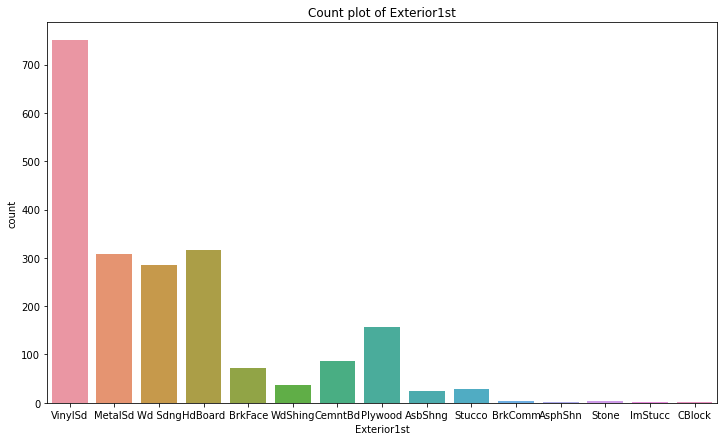

In [355]:
sns.countplot(data.Exterior1st)
plt.title('Count plot of Exterior1st')

In [356]:
data.groupby("Exterior1st")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Exterior1st,,,,,,,,
AsbShng,24.0,103680.541667,38013.525554,35311.0,81625.0,108000.0,135000.0,165500.0
AsphShn,2.0,100000.000000,0.000000,100000.0,100000.0,100000.0,100000.0,100000.0
BrkComm,3.0,74666.666667,12701.705922,60000.0,71000.0,82000.0,82000.0,82000.0
BrkFace,72.0,187479.861111,75316.777333,40000.0,138500.0,160000.0,246625.0,340000.0
CBlock,1.0,105000.000000,NaN,105000.0,105000.0,105000.0,105000.0,105000.0
CemntBd,87.0,214235.344828,93453.373330,75000.0,117250.0,229456.0,291045.0,340000.0
HdBoard,316.0,158908.348101,44061.480945,83000.0,130000.0,147750.0,179200.0,340000.0
ImStucc,1.0,262000.000000,NaN,262000.0,262000.0,262000.0,262000.0,262000.0
MetalSd,308.0,150353.814935,53640.877044,62383.0,119000.0,140000.0,167125.0,340000.0


In [357]:
mod = ols('Property_Sale_Price ~ Exterior1st', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq          F        PR(>F)
Exterior1st    14.0  1.658449e+12  1.184607e+11  31.866638  1.146734e-77
Residual     2058.0  7.650385e+12  3.717388e+09        NaN           NaN


In [358]:
t_Exterior1st = pairwise_tukeyhsd(data.Property_Sale_Price, data.Exterior1st)
print(t_Exterior1st)

        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff   p-adj     lower        upper    reject
-------------------------------------------------------------------
AsbShng AsphShn   -3680.5417    0.9 -156049.3745 148688.2912  False
AsbShng BrkComm   -29013.875    0.9 -155792.4072  97764.6572  False
AsbShng BrkFace   83799.3194  0.001   35002.2396 132596.3992   True
AsbShng  CBlock    1319.4583    0.9 -209978.0954  212617.012  False
AsbShng CemntBd  110554.8032  0.001   62820.9681 158288.6382   True
AsbShng HdBoard   55227.8064 0.0018   11392.8699  99062.7429   True
AsbShng ImStucc  158319.4583 0.4134  -52978.0954  369617.012  False
AsbShng MetalSd   46673.2733 0.0245    2798.1703  90548.3762   True
AsbShng Plywood   69131.1186  0.001   23737.1223 114525.1149   True
AsbShng   Stone  164319.4583 0.0011   37540.9261 291097.9905   True
AsbShng  Stucco   57899.0655 0.0473     309.0599 115489.0711   True
AsbShng VinylSd   104409.349  0.001   61479.0105

In [359]:
data["Exterior1st"].replace('AsphShn', 'AsbShng',inplace = True)
data["Exterior1st"].replace('BrkComm', 'AsbShng',inplace = True)
data["Exterior1st"].replace('CBlock', 'AsbShng',inplace = True)
data["Exterior1st"].replace('ImStucc', 'BrkFace',inplace = True)
data["Exterior1st"].replace('CemntBd', 'VinylSd',inplace = True)
data["Exterior1st"].replace('Stone', 'VinylSd',inplace = True)
data["Exterior1st"].replace('Stucco', 'HdBoard',inplace = True)
data["Exterior1st"].replace('WdShing', 'HdBoard',inplace = True)
data["Exterior1st"].replace('Wd Sdng', 'MetalSd',inplace = True)
data["Exterior1st"].replace('BrkFace', 'Plywood',inplace = True)
data["Exterior1st"].replace('HdBoard', 'MetalSd',inplace = True)


In [360]:
data.Exterior1st.value_counts()

MetalSd    974
VinylSd    840
Plywood    229
AsbShng     30
Name: Exterior1st, dtype: int64

In [361]:
data.Exterior1st.value_counts().sum()

2073

In [362]:
mod = ols('Property_Sale_Price ~ Exterior1st', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq           F        PR(>F)
Exterior1st     3.0  1.598341e+12  5.327802e+11  142.963912  3.488991e-84
Residual     2069.0  7.710493e+12  3.726676e+09         NaN           NaN


In [363]:
t_Exterior1st = pairwise_tukeyhsd(data.Property_Sale_Price, data.Exterior1st)
print(t_Exterior1st)


      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1  group2   meandiff  p-adj   lower       upper    reject
---------------------------------------------------------------
AsbShng MetalSd  52300.0598 0.001 23205.5802  81394.5394   True
AsbShng Plywood  77235.1984 0.001 46759.3814 107711.0153   True
AsbShng VinylSd 108362.5821 0.001 79198.8434 137526.3209   True
MetalSd Plywood  24935.1386 0.001 13408.0551   36462.222   True
MetalSd VinylSd  56062.5223 0.001   48671.86  63453.1847   True
Plywood VinylSd  31127.3837 0.001 19426.5903  42828.1771   True
---------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Exterior1st')

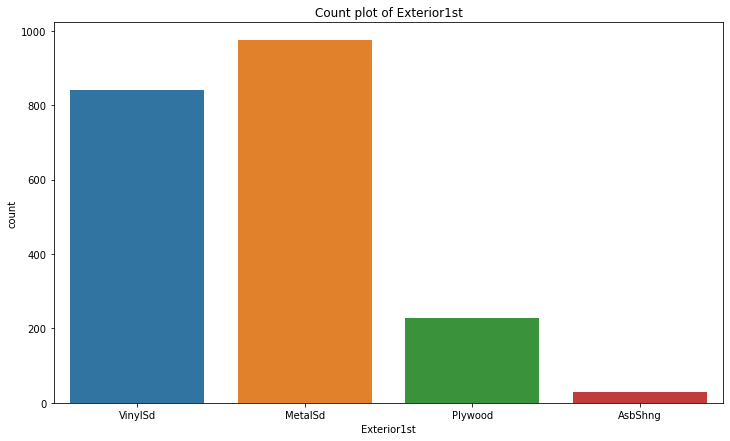

In [364]:
sns.countplot(data.Exterior1st)
plt.title('Count plot of Exterior1st')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs Exterior1st')

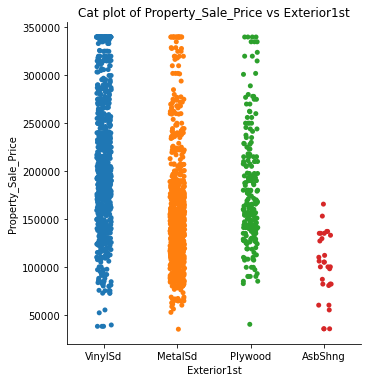

In [365]:
sns.catplot('Exterior1st', 'Property_Sale_Price', data=data)
plt.title('Cat plot of Property_Sale_Price vs Exterior1st')

Text(0.5, 1.0, 'Box plot of Property_Sale_Price vs Exterior1st')

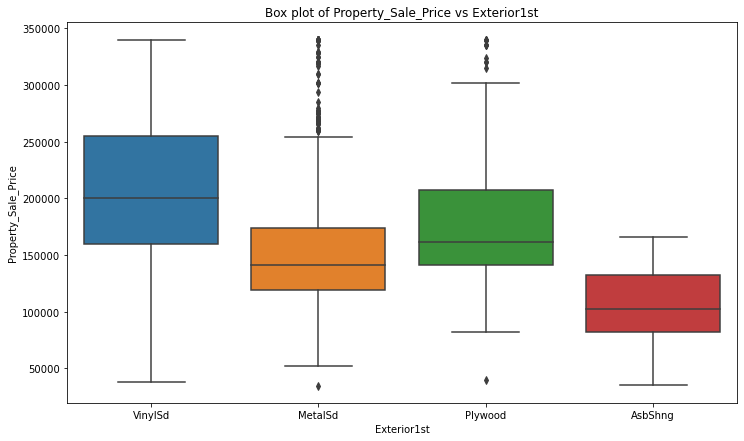

In [366]:
sns.boxplot('Exterior1st', 'Property_Sale_Price', data=data)
plt.title('Box plot of Property_Sale_Price vs Exterior1st')

**Good Predictor**

# 

# 

# 23) Exterior2nd

In [367]:
data.Exterior2nd.isnull().sum()

0

In [368]:
data.Exterior2nd.value_counts()

VinylSd    729
MetalSd    299
HdBoard    292
Wd Sdng    277
Plywood    205
CmentBd     85
Wd Shng     55
BrkFace     35
Stucco      29
AsbShng     27
ImStucc     14
Brk Cmn     11
Stone        9
AsphShn      4
CBlock       1
Other        1
Name: Exterior2nd, dtype: int64

In [369]:
data.Exterior2nd.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Exterior2nd')

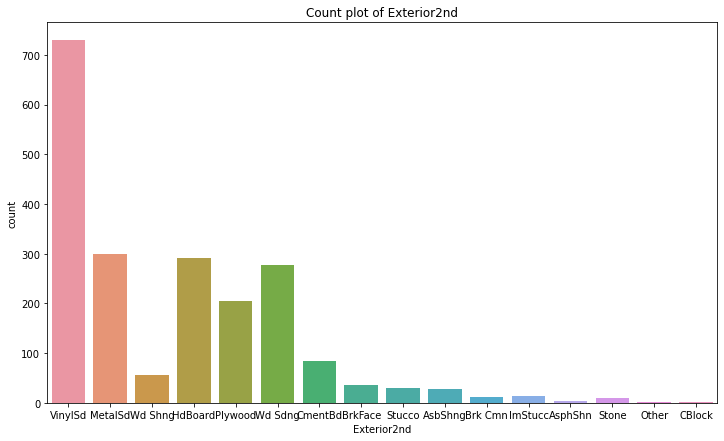

In [370]:
sns.countplot(data.Exterior2nd)
plt.title('Count plot of Exterior2nd')

In [371]:
data.groupby("Exterior2nd")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Exterior2nd,,,,,,,,
AsbShng,27.0,110716.037037,42612.862368,35311.0,90000.0,122500.0,135000.0,225000.0
AsphShn,4.0,128500.000000,36041.642582,100000.0,100000.0,119500.0,148000.0,175000.0
Brk Cmn,11.0,130363.636364,36381.376355,60000.0,114000.0,148500.0,155000.0,155000.0
BrkFace,35.0,193470.000000,76279.933565,40000.0,147500.0,160000.0,250000.0,340000.0
CBlock,1.0,105000.000000,NaN,105000.0,105000.0,105000.0,105000.0,105000.0
CmentBd,85.0,213299.705882,93417.583395,75000.0,115000.0,229456.0,287090.0,340000.0
HdBoard,292.0,165542.595890,49759.903194,83000.0,131475.0,157000.0,185000.0,340000.0
ImStucc,14.0,230692.857143,97939.608270,88000.0,135000.0,229000.0,320000.0,340000.0
MetalSd,299.0,150934.698997,53912.357252,62383.0,119000.0,140000.0,166000.0,340000.0


In [372]:
mod = ols('Property_Sale_Price ~ Exterior2nd', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq          F        PR(>F)
Exterior2nd    15.0  1.648526e+12  1.099017e+11  29.511593  2.410342e-76
Residual     2057.0  7.660308e+12  3.724019e+09        NaN           NaN


In [373]:
t_Exterior2nd = pairwise_tukeyhsd(data.Property_Sale_Price, data.Exterior2nd)
print(t_Exterior2nd)

        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff   p-adj     lower        upper    reject
-------------------------------------------------------------------
AsbShng AsphShn    17783.963    0.9  -94374.4658 129942.3917  False
AsbShng Brk Cmn   19647.5993    0.9   -55234.243  94529.4417  False
AsbShng BrkFace    82753.963  0.001   29131.9778 136375.9481   True
AsbShng  CBlock    -5716.037    0.9 -218902.7242 207470.6502  False
AsbShng CmentBd  102583.6688  0.001   56336.9832 148830.3545   True
AsbShng HdBoard   54826.5589  0.001   12716.5841  96936.5336   True
AsbShng ImStucc  119976.8201  0.001   51030.8359 188922.8044   True
AsbShng MetalSd    40218.662 0.0799   -1849.5711   82286.895  False
AsbShng   Other   208283.963 0.0642   -4902.7242 421470.6502  False
AsbShng Plywood   54667.1386 0.0014   11807.5372  97526.7399   True
AsbShng   Stone   17575.5185    0.9  -63001.4754  98152.5124  False
AsbShng  Stucco   45594.7561 0.2737  -10390.8108

In [374]:
data["Exterior2nd"].replace('AsphShn', 'AsbShng',inplace = True)
data["Exterior2nd"].replace('Brk Cmn', 'AsbShng',inplace = True)
data["Exterior2nd"].replace('CBlock', 'AsbShng',inplace = True)
data["Exterior2nd"].replace('Stone', 'AsbShng',inplace = True)
data["Exterior2nd"].replace('BrkFace', 'VinylSd',inplace = True)
data["Exterior2nd"].replace('CmentBd', 'VinylSd',inplace = True)
data["Exterior2nd"].replace('Plywood', 'HdBoard',inplace = True)
data["Exterior2nd"].replace('Stucco', 'HdBoard',inplace = True)
data["Exterior2nd"].replace('Wd Shng', 'HdBoard',inplace = True)
data["Exterior2nd"].replace('Wd Sdng', 'MetalSd',inplace = True)
data["Exterior2nd"].replace('ImStucc', 'VinylSd',inplace = True)
data["Exterior2nd"].replace('Other', 'VinylSd',inplace = True)

In [375]:
data.Exterior2nd.value_counts()

VinylSd    864
HdBoard    581
MetalSd    576
AsbShng     52
Name: Exterior2nd, dtype: int64

In [376]:
data.Exterior2nd.value_counts().sum()

2073

In [377]:
mod = ols('Property_Sale_Price ~ Exterior2nd', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq           F        PR(>F)
Exterior2nd     3.0  1.609325e+12  5.364417e+11  144.151782  8.010779e-85
Residual     2069.0  7.699509e+12  3.721367e+09         NaN           NaN


In [378]:
t_Exterior2nd = pairwise_tukeyhsd(data.Property_Sale_Price, data.Exterior2nd)
print(t_Exterior2nd)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1  group2   meandiff  p-adj     lower       upper    reject
-----------------------------------------------------------------
AsbShng HdBoard  45695.1373  0.001  22991.9732  68398.3014   True
AsbShng MetalSd  29404.0174 0.0049     6692.76  52115.2748   True
AsbShng VinylSd  89837.6562  0.001  67442.0169 112233.2956   True
HdBoard MetalSd -16291.1199  0.001 -25513.4708   -7068.769   True
HdBoard VinylSd   44142.519  0.001  35727.3419   52557.696   True
MetalSd VinylSd  60433.6389  0.001  51996.6514  68870.6264   True
-----------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Exterior2nd')

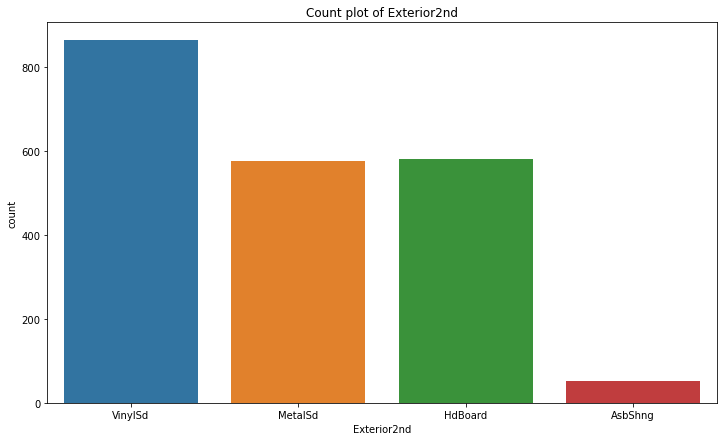

In [379]:
sns.countplot(data.Exterior2nd)
plt.title('Count plot of Exterior2nd')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs Exterior2nd')

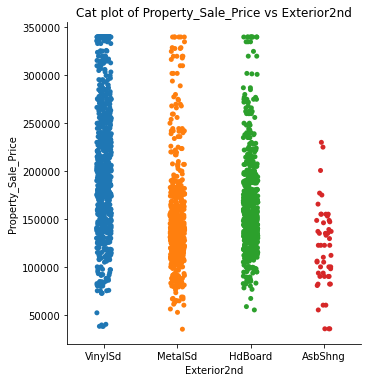

In [380]:
sns.catplot('Exterior2nd', 'Property_Sale_Price', data=data)
plt.title('Cat plot of Property_Sale_Price vs Exterior2nd')

Text(0.5, 1.0, 'Box plot of Property_Sale_Price vs Exterior2nd')

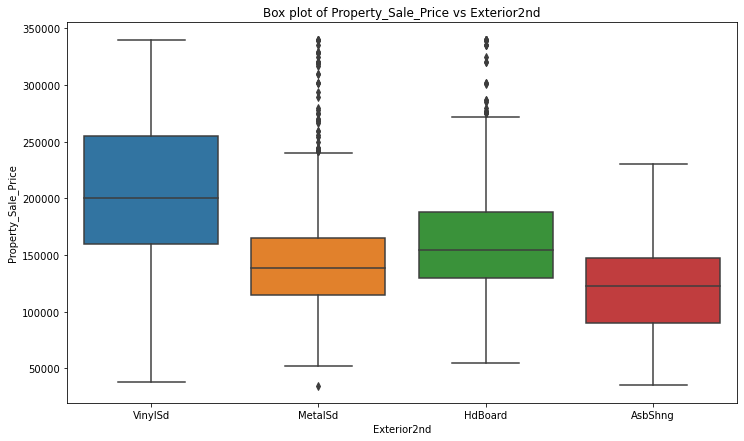

In [381]:
sns.boxplot('Exterior2nd', 'Property_Sale_Price', data=data)
plt.title('Box plot of Property_Sale_Price vs Exterior2nd')

**Good Predictor**

# 

# 

# 24) MasVnrType

In [382]:
data.MasVnrType.isnull().sum()

14

In [383]:
data.MasVnrType.dtype

dtype('O')

In [384]:
data.MasVnrType.mode()

0    None
dtype: object

In [385]:
data.MasVnrType.fillna(data.MasVnrType.mode()[0] , inplace = True)

In [386]:
data.MasVnrType.isnull().sum()

0

In [387]:
data.MasVnrType.value_counts()

None       1247
BrkFace     620
Stone       186
BrkCmn       20
Name: MasVnrType, dtype: int64

In [388]:
data.MasVnrType.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of MasVnrType')

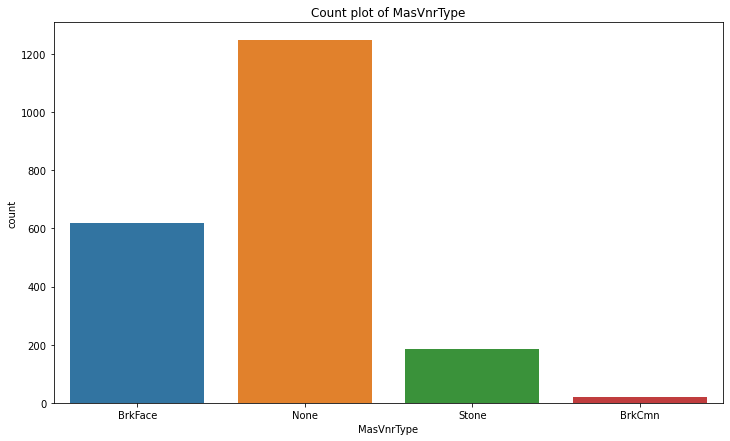

In [389]:
sns.countplot(data.MasVnrType)
plt.title('Count plot of MasVnrType')

In [390]:
data.groupby("MasVnrType")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
MasVnrType,,,,,,,,
BrkCmn,20.0,144938.550000,41726.240841,89471.0,116375.0,147000.0,163475.0,277000.0
BrkFace,620.0,200255.917742,65695.079837,75000.0,149975.0,183950.0,236000.0,340000.0
None,1247.0,156338.171612,55775.467311,34900.0,119250.0,143500.0,184950.0,340000.0
Stone,186.0,248055.150538,69805.524683,119000.0,194000.0,248900.0,315500.0,340000.0


In [391]:
mod = ols('Property_Sale_Price ~ MasVnrType', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F        PR(>F)
MasVnrType     3.0  1.826592e+12  6.088639e+11  168.363874  1.177350e-97
Residual    2069.0  7.482243e+12  3.616357e+09         NaN           NaN


In [392]:
t_MasVnrType = pairwise_tukeyhsd(data.Property_Sale_Price, data.MasVnrType)
print(t_MasVnrType)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1  group2   meandiff  p-adj     lower       upper    reject
-----------------------------------------------------------------
 BrkCmn BrkFace  55317.3677  0.001  20190.6321  90444.1034   True
 BrkCmn    None  11399.6216 0.8131 -23450.0532  46249.2965  False
 BrkCmn   Stone 103116.6005  0.001  66731.7339 139501.4672   True
BrkFace    None -43917.7461  0.001 -51515.7889 -36319.7033   True
BrkFace   Stone  47799.2328  0.001  34872.9441  60725.5215   True
   None   Stone  91716.9789  0.001  79563.7398 103870.2181   True
-----------------------------------------------------------------


In [393]:
data["MasVnrType"].replace('BrkCmn', 'None',inplace = True)

In [394]:
data.MasVnrType.value_counts()

None       1267
BrkFace     620
Stone       186
Name: MasVnrType, dtype: int64

In [395]:
data.MasVnrType.value_counts().sum()

2073

In [396]:
mod = ols('Property_Sale_Price ~ MasVnrType', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F        PR(>F)
MasVnrType     2.0  1.824034e+12  9.120168e+11  252.227801  9.330649e-99
Residual    2070.0  7.484801e+12  3.615846e+09         NaN           NaN


In [397]:
t_MasVnrType = pairwise_tukeyhsd(data.Property_Sale_Price, data.MasVnrType)
print(t_MasVnrType)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1 group2   meandiff  p-adj    lower       upper    reject
---------------------------------------------------------------
BrkFace   None -44097.6928 0.001 -51010.0561 -37185.3295   True
BrkFace  Stone  47799.2328 0.001  36008.5228  59589.9428   True
   None  Stone  91896.9256 0.001  80822.7149 102971.1363   True
---------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of MasVnrType')

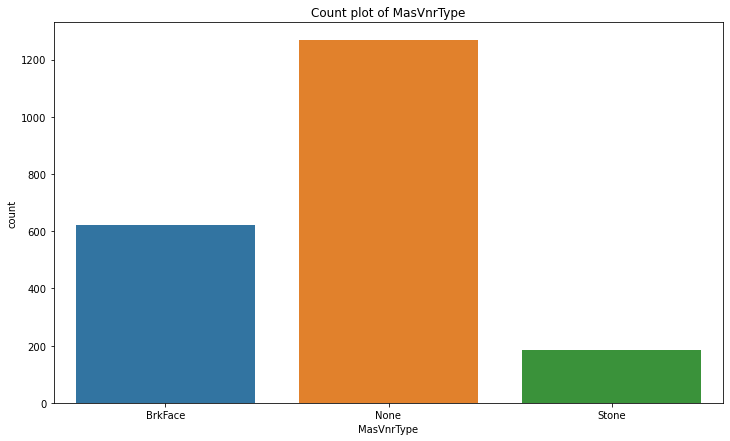

In [398]:
sns.countplot(data.MasVnrType)
plt.title('Count plot of MasVnrType')

Text(0.5, 1.0, 'Cat plot of Property_Sale_Price vs MasVnrType')

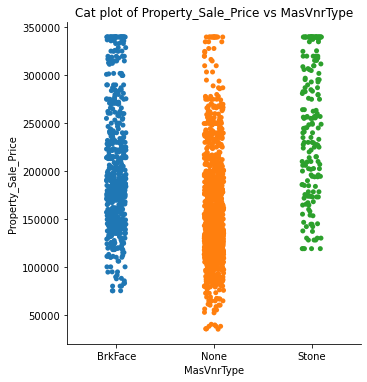

In [399]:
sns.catplot('MasVnrType', 'Property_Sale_Price' , data=data)
plt.title('Cat plot of Property_Sale_Price vs MasVnrType')

Text(0.5, 1.0, 'Box plot of Property_Sale_Price vs MasVnrType')

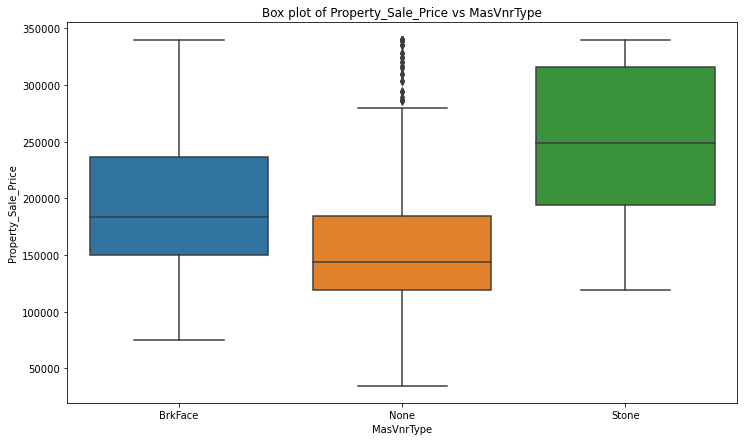

In [400]:
sns.boxplot('MasVnrType', 'Property_Sale_Price' , data=data)
plt.title('Box plot of Property_Sale_Price vs MasVnrType')

**Good Predictor**

# 

# 

# 25) MasVnrArea

In [401]:
data.MasVnrArea.isnull().sum()

14

In [402]:
data.MasVnrArea.dtype

dtype('float64')

In [403]:
data.MasVnrArea.describe()

count    2059.000000
mean      101.875668
std       179.169217
min         0.000000
25%         0.000000
50%         0.000000
75%       161.500000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [404]:
data.MasVnrArea.sample(10)

1326      0.0
1446    189.0
71        0.0
726     260.0
1747      0.0
2058      0.0
124       0.0
1655     93.0
1003    164.0
403     650.0
Name: MasVnrArea, dtype: float64

In [405]:
data.MasVnrArea.fillna(data.MasVnrArea.median(), inplace = True)

In [406]:
data.MasVnrArea.isnull().sum()

0

In [407]:
data.MasVnrArea.describe()

count    2073.000000
mean      101.187651
std       178.757820
min         0.000000
25%         0.000000
50%         0.000000
75%       160.000000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [408]:
data.MasVnrArea.value_counts()

0.0      1243
108.0      12
340.0      10
210.0       9
106.0       9
         ... 
299.0       1
97.0        1
278.0       1
292.0       1
428.0       1
Name: MasVnrArea, Length: 342, dtype: int64

In [409]:
data.MasVnrArea.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of MasVnrArea')

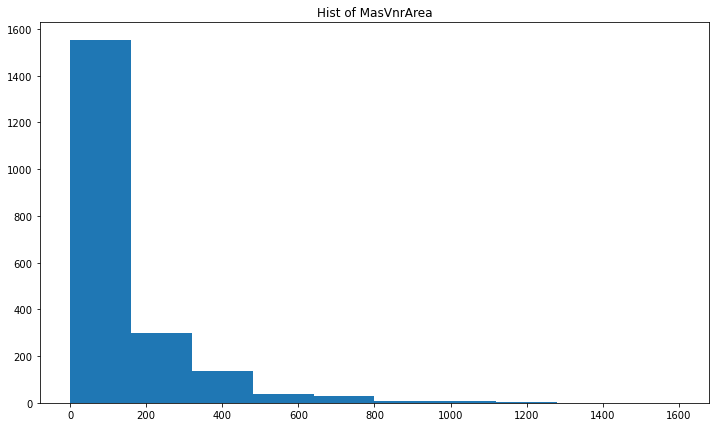

In [410]:
plt.hist(data.MasVnrArea)
plt.title('Hist of MasVnrArea')

Text(0.5, 1.0, 'Normality MasVnrArea')

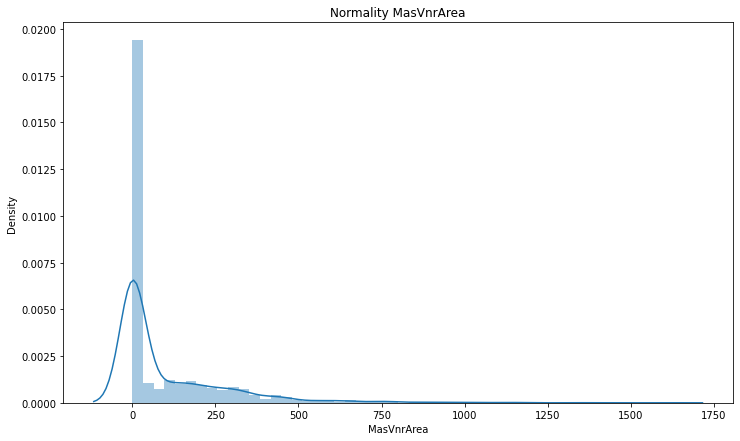

In [411]:
sns.distplot(data.MasVnrArea)
plt.title('Normality MasVnrArea')

Text(0.5, 1.0, 'count plot of MasVnrArea')

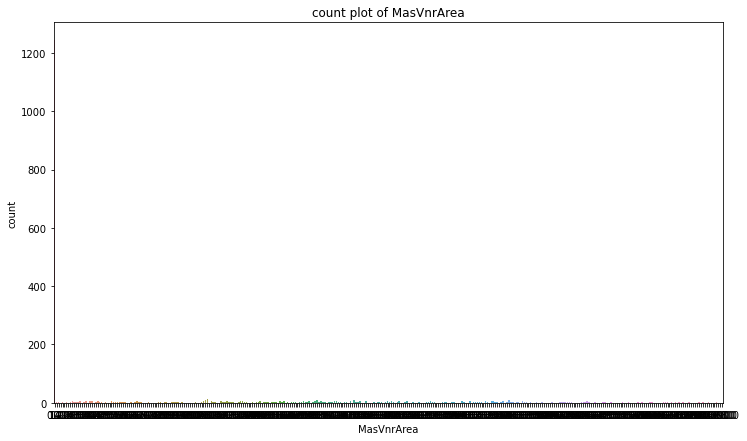

In [412]:
sns.countplot(data.MasVnrArea)
plt.title('count plot of MasVnrArea')

Text(0.5, 1.0, 'Box plot of MasVnrArea')

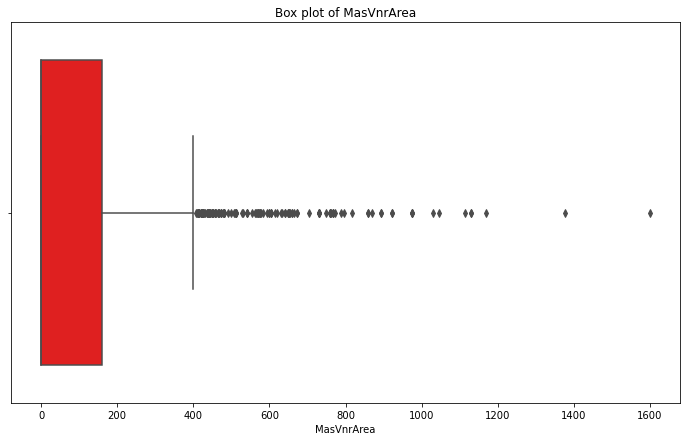

In [413]:
sns.boxplot(x = data.MasVnrArea, data =data, color = 'r')
plt.title('Box plot of MasVnrArea')

In [414]:
IQR = data.MasVnrArea.quantile(0.75) - data.MasVnrArea.quantile(0.25)
IQR

160.0

In [415]:
upper_limit = data.MasVnrArea.quantile(0.75) + (1.5*IQR)
upper_limit

400.0

In [416]:
lower_limit = data.MasVnrArea.quantile(0.25) - (1.5*IQR)
lower_limit

-240.0

In [417]:
len(data.MasVnrArea[data.MasVnrArea > upper_limit])

143

In [418]:
len(data.MasVnrArea[data.MasVnrArea < lower_limit])

0

In [419]:
for i in np.arange(upper_limit, 800, 200):
    outliers = len(data.MasVnrArea[data.MasVnrArea > i])
    print('At a limit of: ', i, 'There are ', outliers)

At a limit of:  400.0 There are  143
At a limit of:  600.0 There are  54


In [420]:
data['MasVnrArea'] = np.where(data['MasVnrArea'] > upper_limit, upper_limit, data['MasVnrArea'])

Text(0.5, 1.0, 'Box plot of MasVnrArea')

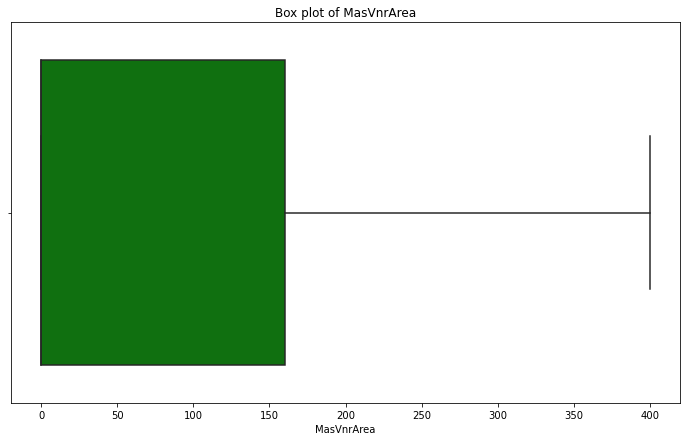

In [421]:
sns.boxplot(x = data.MasVnrArea, data =data, color = 'g')
plt.title('Box plot of MasVnrArea')

Text(0.5, 1.0, 'Normality of MasVnrArea')

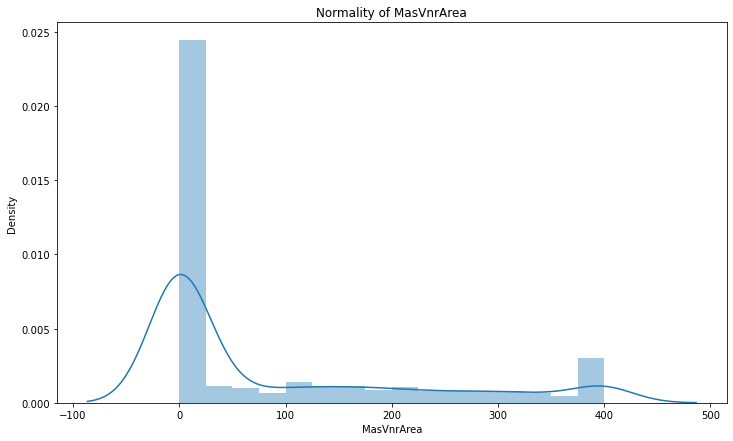

In [422]:
sns.distplot(data.MasVnrArea)
plt.title('Normality of MasVnrArea')

In [423]:
np.corrcoef(data.MasVnrArea, data.Property_Sale_Price)

array([[1.        , 0.45503223],
       [0.45503223, 1.        ]])

Text(0.5, 1.0, 'Scatter plot of MasVnrArea vs Property_Sale_Price')

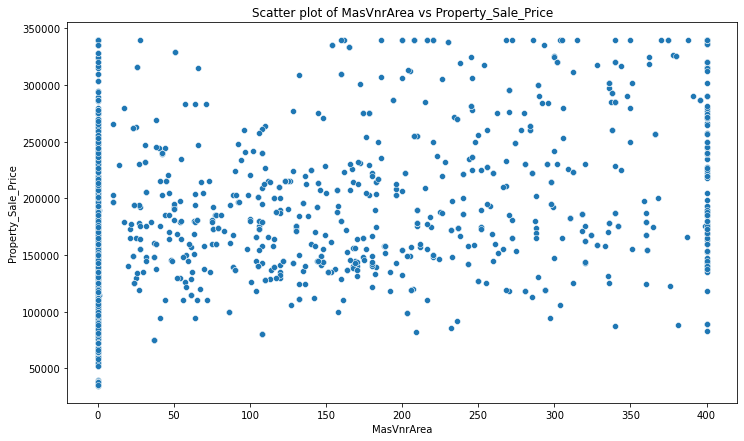

In [424]:
sns.scatterplot(x = data['MasVnrArea'], y = data.Property_Sale_Price, data = data )
plt.xlabel('MasVnrArea')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter plot of MasVnrArea vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 26) ExterQual

In [425]:
data.ExterQual.isnull().sum()

0

In [426]:
data.ExterQual.value_counts()

TA    1272
Gd     706
Ex      76
Fa      19
Name: ExterQual, dtype: int64

In [427]:
data.ExterQual.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of ExterQual')

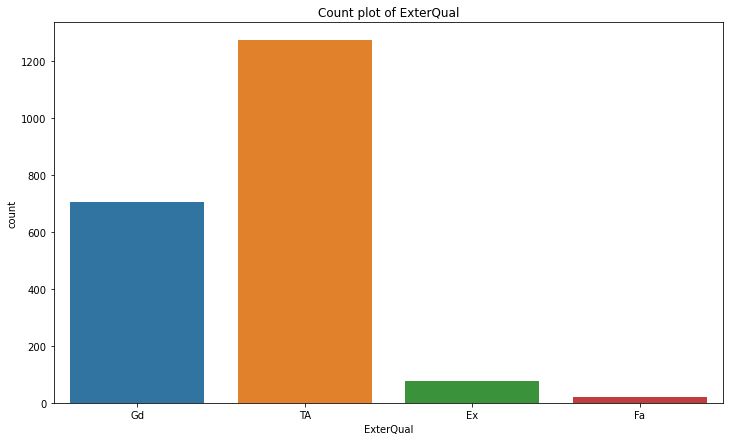

In [428]:
sns.countplot(data.ExterQual)
plt.title('Count plot of ExterQual')

In [429]:
data.groupby("ExterQual")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
ExterQual,,,,,,,,
Ex,76.0,304193.276316,55255.814100,160000.0,299800.0,335000.0,340000.0,340000.0
Fa,19.0,90936.473684,34933.709741,39300.0,71000.0,85000.0,110000.0,200000.0
Gd,706.0,227613.082153,56929.057167,52000.0,184900.0,221250.0,265979.0,340000.0
TA,1272.0,143559.811321,41343.779478,34900.0,118768.5,139000.0,165000.0,340000.0


In [430]:
mod = ols('Property_Sale_Price ~ ExterQual', data=data).fit()
print(sm.stats.anova_lm(mod))

               df        sum_sq       mean_sq           F         PR(>F)
ExterQual     3.0  4.600500e+12  1.533500e+12  673.871283  1.466181e-305
Residual   2069.0  4.708334e+12  2.275657e+09         NaN            NaN


In [431]:
t_ExterQual = pairwise_tukeyhsd(data.Property_Sale_Price, data.ExterQual)
print(t_ExterQual)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj    lower        upper     reject
-----------------------------------------------------------------
    Ex     Fa -213256.8026 0.001 -244716.5052 -181797.1001   True
    Ex     Gd  -76580.1942 0.001  -91387.3155  -61773.0728   True
    Ex     TA  -160633.465 0.001 -175116.8808 -146150.0491   True
    Fa     Gd  136676.6085 0.001  108162.0758  165191.1412   True
    Fa     TA   52623.3376 0.001     24275.55   80971.1253   True
    Gd     TA  -84053.2708 0.001  -89809.5738  -78296.9679   True
-----------------------------------------------------------------


Text(0.5, 1.0, 'Cat plot of ExterQual vs Property_sale_price')

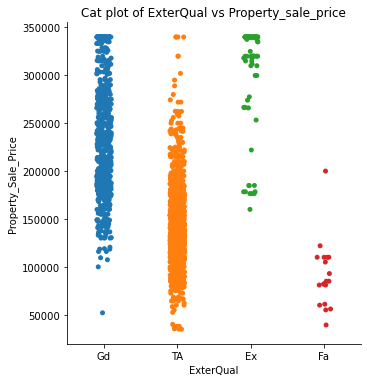

In [432]:
sns.catplot('ExterQual', 'Property_Sale_Price', data=data)
plt.title('Cat plot of ExterQual vs Property_sale_price')

Text(0.5, 1.0, 'Box plot of ExterQual vs Property_sale_price')

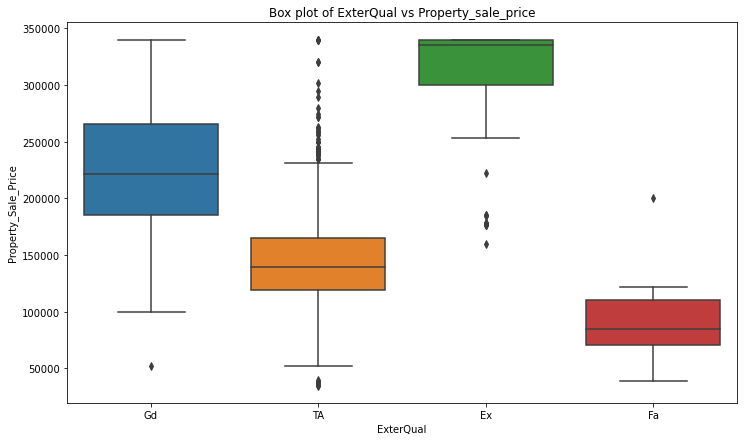

In [433]:
sns.boxplot('ExterQual', 'Property_Sale_Price', data=data)
plt.title('Box plot of ExterQual vs Property_sale_price')

**Good Predictor**

# 

# 

# 27) ExterCond

In [434]:
data.ExterCond.isnull().sum()

0

In [435]:
data.ExterCond.value_counts()

TA    1815
Gd     219
Fa      35
Ex       3
Po       1
Name: ExterCond, dtype: int64

In [436]:
data.ExterCond.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of ExterCond')

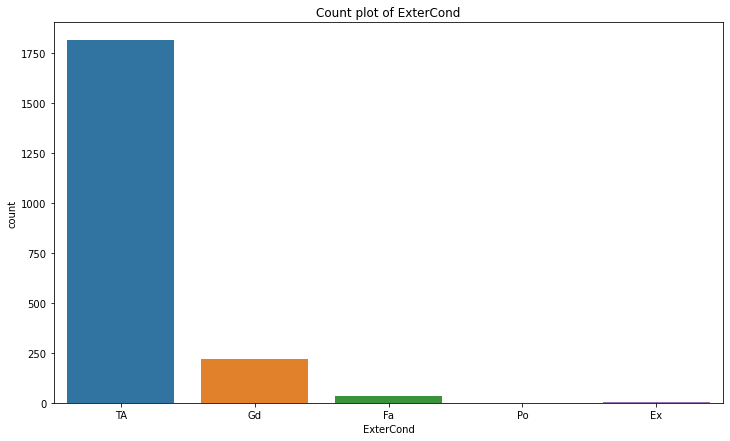

In [437]:
sns.countplot(data.ExterCond)
plt.title('Count plot of ExterCond')

In [438]:
data.groupby("ExterCond")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
ExterCond,,,,,,,,
Ex,3.0,201333.333333,109235.220205,118000.0,139500.0,161000.0,243000.0,325000.0
Fa,35.0,106946.514286,38633.905585,39300.0,80500.0,115000.0,140000.0,169500.0
Gd,219.0,170332.031963,58812.747429,68400.0,130750.0,158000.0,201000.0,340000.0
Po,1.0,76500.000000,NaN,76500.0,76500.0,76500.0,76500.0,76500.0
TA,1815.0,179847.413223,67531.729210,34900.0,130500.0,167000.0,216250.0,340000.0


In [439]:
mod = ols('Property_Sale_Price ~ ExterCond', data=data).fit()
print(sm.stats.anova_lm(mod))

               df        sum_sq       mean_sq          F        PR(>F)
ExterCond     4.0  2.073636e+11  5.184089e+10  11.779082  1.838421e-09
Residual   2068.0  9.101471e+12  4.401098e+09        NaN           NaN


In [440]:
t_ExterCond = pairwise_tukeyhsd(data.Property_Sale_Price, data.ExterCond)
print(t_ExterCond)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
    Ex     Fa   -94386.819 0.1251  -203346.949  14573.3109  False
    Ex     Gd  -31001.3014    0.9 -136285.7595  74283.1568  False
    Ex     Po -124833.3333 0.4793 -333974.6473  84307.9806  False
    Ex     TA  -21485.9201    0.9 -126142.9634  83171.1232  False
    Fa     Gd   63385.5177  0.001   30414.5842  96356.4511   True
    Fa     Po  -30446.5143    0.9 -214137.4355 153244.4069  False
    Fa     TA   72900.8989  0.001   41991.9675 103809.8304   True
    Gd     Po   -93832.032 0.6046 -275366.7717  87702.7078  False
    Gd     TA    9515.3813 0.2638   -3441.0551  22471.8176  False
    Po     TA  103347.4132 0.5216  -77824.1666  284518.993  False
-----------------------------------------------------------------


In [441]:
data["ExterCond"].replace('Ex', 'TA',inplace = True)
data["ExterCond"].replace('Gd', 'TA',inplace = True)
data["ExterCond"].replace('Po', 'Fa',inplace = True)

In [442]:
data.ExterCond.value_counts()

TA    2037
Fa      36
Name: ExterCond, dtype: int64

In [443]:
data.ExterCond.value_counts().sum()

2073

In [444]:
df1=data[data.ExterCond=='TA']

df2=data[data.ExterCond=='Fa']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=6.520283823345744, pvalue=8.790776565581211e-11)

Text(0.5, 1.0, 'Count plot of ExterCond')

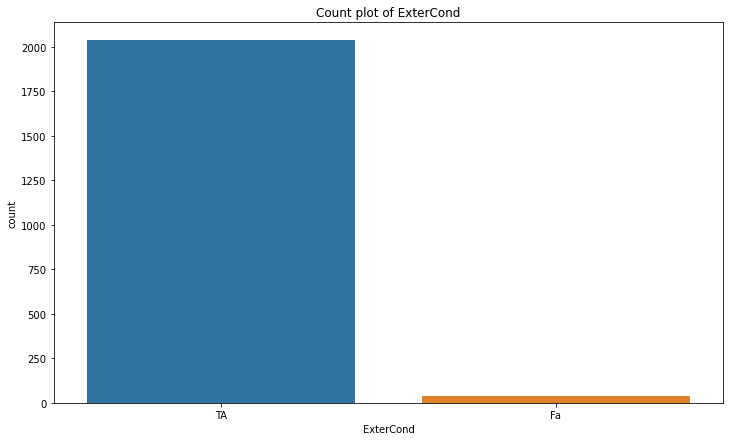

In [445]:
sns.countplot(data.ExterCond)
plt.title('Count plot of ExterCond')

Text(0.5, 1.0, 'Cat Plot of ExterCond vs Property_Sale_Price')

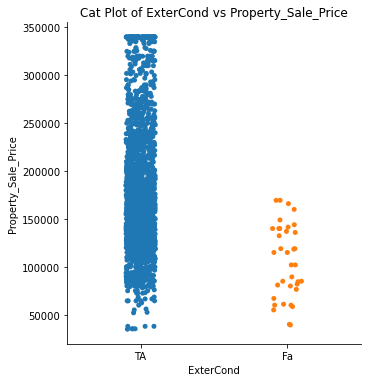

In [446]:
sns.catplot('ExterCond', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of ExterCond vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of ExterCond vs Property_Sale_Price')

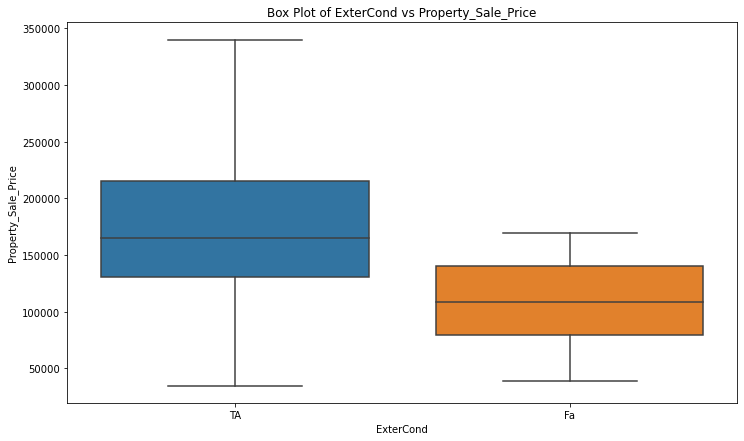

In [447]:
sns.boxplot('ExterCond', 'Property_Sale_Price', data=data)
plt.title('Box Plot of ExterCond vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 28) Foundation

In [448]:
data.Foundation.isnull().sum()

0

In [449]:
data.Foundation.value_counts()

PConc     928
CBlock    901
BrkTil    191
Slab       40
Stone      10
Wood        3
Name: Foundation, dtype: int64

In [450]:
data.Foundation.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Foundation')

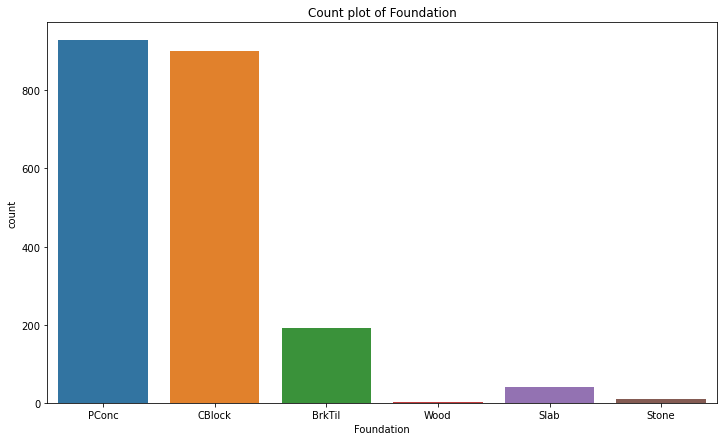

In [451]:
sns.countplot(data.Foundation)
plt.title('Count plot of Foundation')

In [452]:
data.groupby("Foundation")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Foundation,,,,,,,,
BrkTil,191.0,129701.293194,48595.423104,37900.0,100000.0,124900.0,154400.00,340000.0
CBlock,901.0,149323.705882,46434.127889,34900.0,123000.0,141000.0,167900.00,340000.0
PConc,928.0,217604.738147,65636.968941,78000.0,173733.0,204750.0,260675.00,340000.0
Slab,40.0,110771.525000,31139.767500,39300.0,90000.0,108700.0,124123.00,198500.0
Stone,10.0,191073.400000,79767.802738,102776.0,116000.0,201489.5,266369.75,266500.0
Wood,3.0,185666.666667,56695.090910,143000.0,153500.0,164000.0,207000.00,250000.0


In [453]:
mod = ols('Property_Sale_Price ~ Foundation', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F         PR(>F)
Foundation     5.0  2.824406e+12  5.648812e+11  180.063606  2.183733e-159
Residual    2067.0  6.484428e+12  3.137120e+09         NaN            NaN


In [454]:
t_Foundation = pairwise_tukeyhsd(data.Property_Sale_Price, data.Foundation)
print(t_Foundation)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
BrkTil CBlock   19622.4127  0.001    6896.1395  32348.6859   True
BrkTil  PConc    87903.445  0.001   75209.5946 100597.2953   True
BrkTil   Slab  -18929.7682 0.3769  -46709.5169   8849.9805  False
BrkTil  Stone   61372.1068 0.0097    9545.7898 113198.4238   True
BrkTil   Wood   55965.3735 0.5173  -36993.8648 148924.6117  False
CBlock  PConc   68281.0323  0.001   60808.9874  75753.0771   True
CBlock   Slab  -38552.1809  0.001  -64367.1389 -12737.2229   True
CBlock  Stone   41749.6941 0.1768   -9050.5495  92549.9378  False
CBlock   Wood   36342.9608 0.8608  -56048.1513 128734.0729  False
 PConc   Slab -106833.2131  0.001 -132632.2027 -81034.2236   True
 PConc  Stone  -26531.3381 0.6485  -77323.4691  24260.7928  False
 PConc   Wood  -31938.0715    0.9 -124324.7231  60448.5802  False
  Slab  St

In [455]:
data["Foundation"].replace('Wood', 'PConc',inplace = True)
data["Foundation"].replace('Stone', 'PConc',inplace = True)
data["Foundation"].replace('Slab', 'BrkTil',inplace = True)

In [456]:
data.Foundation.value_counts()

PConc     941
CBlock    901
BrkTil    231
Name: Foundation, dtype: int64

In [457]:
data.Foundation.value_counts().sum()

2073

In [458]:
mod = ols('Property_Sale_Price ~ Foundation', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F         PR(>F)
Foundation     2.0  2.802594e+12  1.401297e+12  445.831193  9.772675e-162
Residual    2070.0  6.506240e+12  3.143111e+09         NaN            NaN


In [459]:
t_Foundation = pairwise_tukeyhsd(data.Property_Sale_Price, data.Foundation)
print(t_Foundation)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj   lower       upper    reject
------------------------------------------------------------
BrkTil CBlock 22900.2946 0.001 13202.9125  32597.6768   True
BrkTil  PConc 90797.5569 0.001 81142.3254 100452.7883   True
CBlock  PConc 67897.2622 0.001 61768.2952  74026.2293   True
------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Foundation')

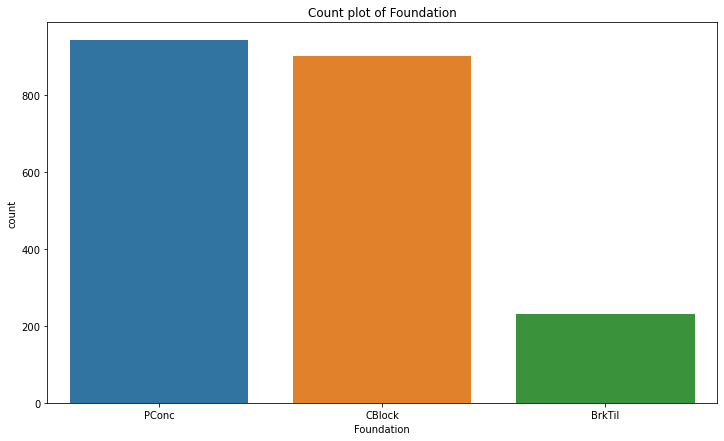

In [460]:
sns.countplot(data.Foundation)
plt.title('Count plot of Foundation')

Text(0.5, 1.0, 'Cat plot of Foundation vs Property_Sale_Price')

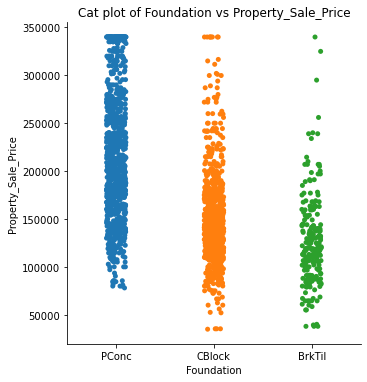

In [461]:
sns.catplot('Foundation', 'Property_Sale_Price', data=data)
plt.title('Cat plot of Foundation vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of Foundation vs Property_Sale_Price')

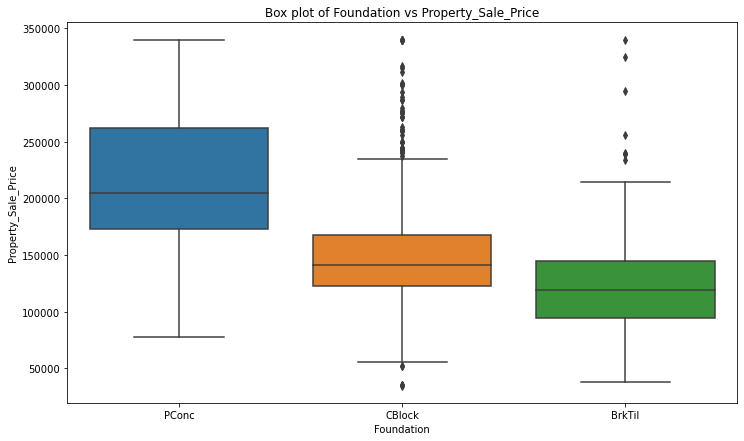

In [462]:
sns.boxplot('Foundation', 'Property_Sale_Price', data=data)
plt.title('Box plot of Foundation vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 29) BsmtQual

In [463]:
data.BsmtQual.isnull().sum()

59

In [464]:
data.BsmtQual.dtype

dtype('O')

In [465]:
data['BsmtQual'] = data["BsmtQual"].fillna("No Basement")

In [466]:
data.BsmtQual.isnull().sum()

0

In [467]:
data.BsmtQual.value_counts()

Gd             904
TA             891
Ex             169
No Basement     59
Fa              50
Name: BsmtQual, dtype: int64

In [468]:
data.BsmtQual.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtQual')

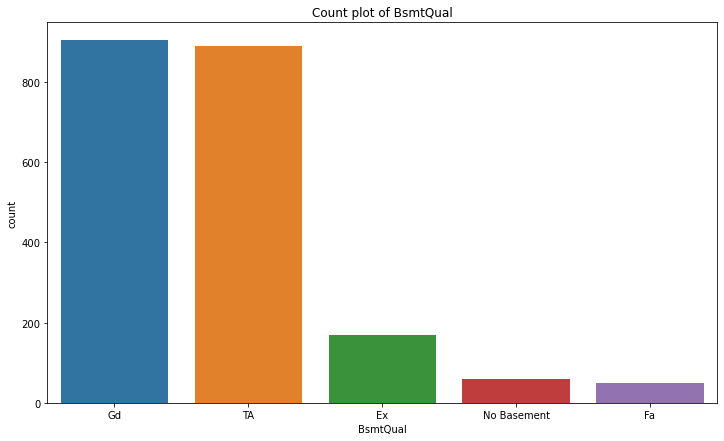

In [469]:
sns.countplot(data.BsmtQual)
plt.title('Count plot of BsmtQual')

In [470]:
data.groupby("BsmtQual")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtQual,,,,,,,,
Ex,169.0,289784.644970,59455.881416,123500.0,240000.0,318000.0,340000.0,340000.0
Fa,50.0,119061.420000,36058.605421,61000.0,91875.0,114000.0,134250.0,206900.0
Gd,904.0,201837.722345,54558.954794,75500.0,166830.0,192000.0,235346.0,340000.0
No Basement,59.0,106993.949153,28115.764591,39300.0,90000.0,101800.0,118964.0,198500.0
TA,891.0,139673.151515,41221.918687,34900.0,116700.0,135000.0,156500.0,340000.0


In [471]:
mod = ols('Property_Sale_Price ~ BsmtQual', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq           F         PR(>F)
BsmtQual     4.0  4.405123e+12  1.101281e+12  464.433686  7.169002e-286
Residual  2068.0  4.903711e+12  2.371234e+09         NaN            NaN


In [472]:
t_B = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtQual, alpha = 0.05)
print(t_B)

            Multiple Comparison of Means - Tukey HSD, FWER=0.05             
   group1      group2     meandiff   p-adj     lower        upper     reject
----------------------------------------------------------------------------
         Ex          Fa  -170723.225  0.001 -192126.0361 -149320.4138   True
         Ex          Gd  -87946.9226  0.001    -99088.57  -76805.2752   True
         Ex No Basement -182790.6958  0.001 -202894.3582 -162687.0334   True
         Ex          TA -150111.4935  0.001 -161265.9353 -138957.0516   True
         Fa          Gd   82776.3023  0.001   63461.8638  102090.7408   True
         Fa No Basement  -12067.4708 0.6737  -37622.6752   13487.7335  False
         Fa          TA   20611.7315 0.0298    1289.9096   39933.5534   True
         Gd No Basement  -94843.7732  0.001 -112707.8279  -76979.7185   True
         Gd          TA  -62164.5708  0.001  -68440.6191  -55888.5225   True
No Basement          TA   32679.2024  0.001   14807.1651   50551.2396   True

In [473]:
data["BsmtQual"].replace('Fa', 'No Basement',inplace = True)

In [474]:
data.BsmtQual.value_counts()

Gd             904
TA             891
Ex             169
No Basement    109
Name: BsmtQual, dtype: int64

In [475]:
data.BsmtQual.value_counts().sum()

2073

In [476]:
mod = ols('Property_Sale_Price ~ BsmtQual', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq           F         PR(>F)
BsmtQual     3.0  4.401182e+12  1.467061e+12  618.492965  6.085538e-287
Residual  2069.0  4.907652e+12  2.371992e+09         NaN            NaN


In [477]:
t_B = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtQual, alpha = 0.05)
print(t_B)

            Multiple Comparison of Means - Tukey HSD, FWER=0.05            
   group1      group2     meandiff   p-adj    lower        upper     reject
---------------------------------------------------------------------------
         Ex          Gd  -87946.9226 0.001  -98441.1856  -77452.6597   True
         Ex No Basement -177255.1587 0.001 -192638.3148 -161872.0027   True
         Ex          TA -150111.4935 0.001 -160617.8075 -139605.1794   True
         Gd No Basement  -89308.2361 0.001 -102004.8206  -76611.6516   True
         Gd          TA  -62164.5708 0.001  -68075.9499  -56253.1918   True
No Basement          TA   27143.6653 0.001   14437.1182   39850.2123   True
---------------------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of BsmtQual')

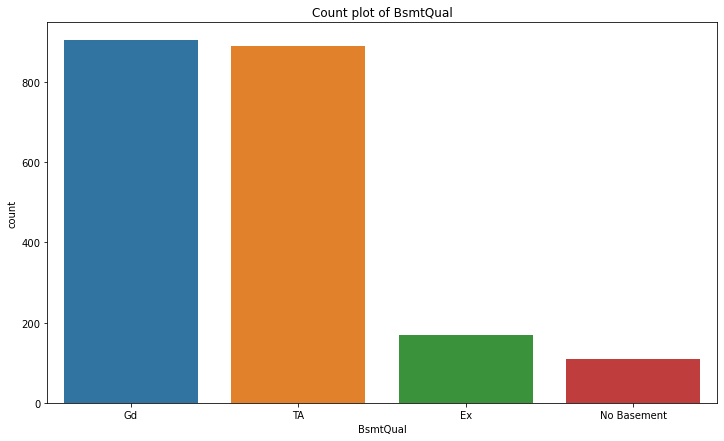

In [478]:
sns.countplot(data.BsmtQual)
plt.title('Count plot of BsmtQual')

Text(0.5, 1.0, 'Cat plot of BsmtQual vs Property_Sale_Price')

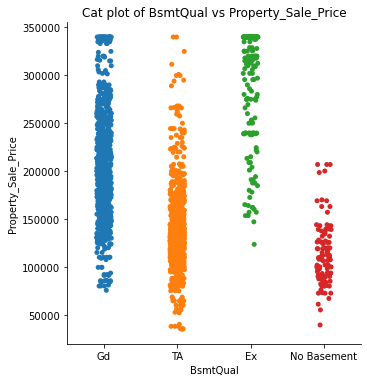

In [479]:
sns.catplot('BsmtQual', 'Property_Sale_Price', data=data)
plt.title('Cat plot of BsmtQual vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of BsmtQual vs Property_Sale_Price')

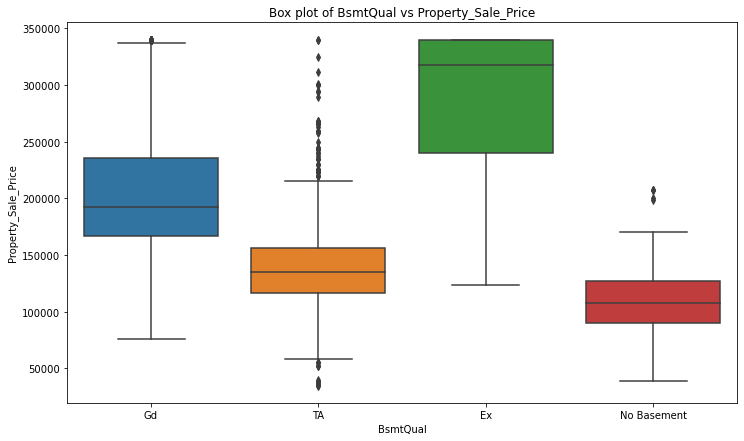

In [480]:
sns.boxplot('BsmtQual', 'Property_Sale_Price', data=data)
plt.title('Box plot of BsmtQual vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 30) BsmtCond

In [481]:
data.BsmtCond.isnull().sum()

59

In [482]:
data.BsmtCond.dtype

dtype('O')

In [483]:
data.BsmtCond.fillna('No basement', inplace = True)

In [484]:
data.BsmtCond.isnull().sum()

0

In [485]:
data.BsmtCond.value_counts()

TA             1851
Gd              100
Fa               61
No basement      59
Po                2
Name: BsmtCond, dtype: int64

In [486]:
data.BsmtCond.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtCond')

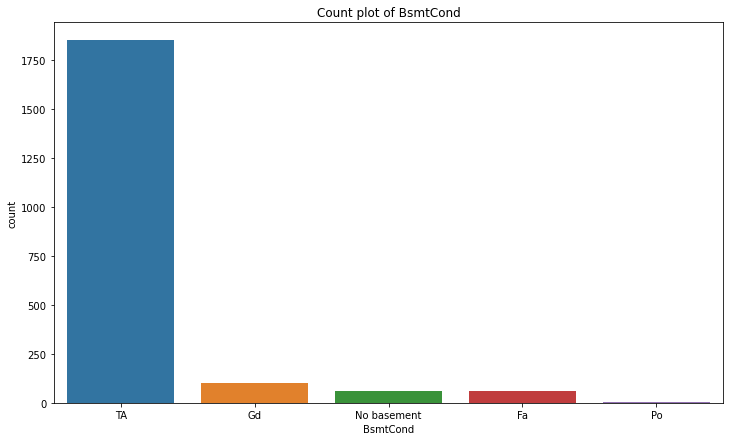

In [487]:
sns.countplot(data.BsmtCond)
plt.title('Count plot of BsmtCond')

In [488]:
data.groupby("BsmtCond")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtCond,,,,,,,,
Fa,61.0,125764.885246,43955.279142,55000.0,96500.0,119200.0,147000.0,265979.0
Gd,100.0,213821.820000,60761.330363,119000.0,165750.0,199000.0,266500.0,340000.0
No basement,59.0,106993.949153,28115.764591,39300.0,90000.0,101800.0,118964.0,198500.0
Po,2.0,64000.000000,4242.640687,61000.0,62500.0,64000.0,65500.0,67000.0
TA,1851.0,179716.323609,66406.658696,34900.0,132500.0,165400.0,215000.0,340000.0


In [489]:
mod = ols('Property_Sale_Price ~ BsmtCond', data = data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq          F        PR(>F)
BsmtCond     4.0  6.233294e+11  1.558324e+11  37.103348  5.283618e-30
Residual  2068.0  8.685505e+12  4.199954e+09        NaN           NaN


In [490]:
t_BsmtCond = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtCond)
print(t_BsmtCond)

            Multiple Comparison of Means - Tukey HSD, FWER=0.05            
   group1      group2     meandiff   p-adj     lower        upper    reject
---------------------------------------------------------------------------
         Fa          Gd   88056.9348  0.001   59312.0726 116801.7969   True
         Fa No basement  -18770.9361 0.5053  -51079.0726  13537.2004  False
         Fa          Po  -61764.8852 0.6527 -188910.8464   65381.076  False
         Fa          TA   53951.4384  0.001    30927.054  76975.8227   True
         Gd No basement -106827.8708  0.001 -135873.7661 -77781.9756   True
         Gd          Po   -149821.82 0.0108 -276178.2357 -23465.4043   True
         Gd          TA  -34105.4964  0.001  -52270.5898  -15940.403   True
No basement          Po  -42993.9492 0.8816 -170208.3052  84220.4069  False
No basement          TA   72722.3745  0.001   49323.2462  96121.5027   True
         Po          TA  115716.3236 0.0859    -9462.744 240895.3912  False
------------

In [491]:
data.BsmtCond.replace('Po', 'No basement', inplace = True)
data.BsmtCond.replace('Fa', 'No basement', inplace = True)

In [492]:
data.BsmtCond.value_counts()

TA             1851
No basement     122
Gd              100
Name: BsmtCond, dtype: int64

In [493]:
data.BsmtCond.value_counts().sum()

2073

In [494]:
mod = ols('Property_Sale_Price ~ BsmtCond', data = data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq         F        PR(>F)
BsmtCond     2.0  6.073324e+11  3.036662e+11  72.23914  4.713926e-31
Residual  2070.0  8.701502e+12  4.203624e+09       NaN           NaN


In [495]:
t_BsmtCond = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtCond)
print(t_BsmtCond)

           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
   group1      group2     meandiff  p-adj    lower        upper    reject
-------------------------------------------------------------------------
         Gd No basement -98147.2216 0.001 -118660.1809 -77634.2624   True
         Gd          TA -34105.4964 0.001  -49717.4471 -18493.5457   True
No basement          TA  64041.7252 0.001    49827.861  78255.5895   True
-------------------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of BsmtCond')

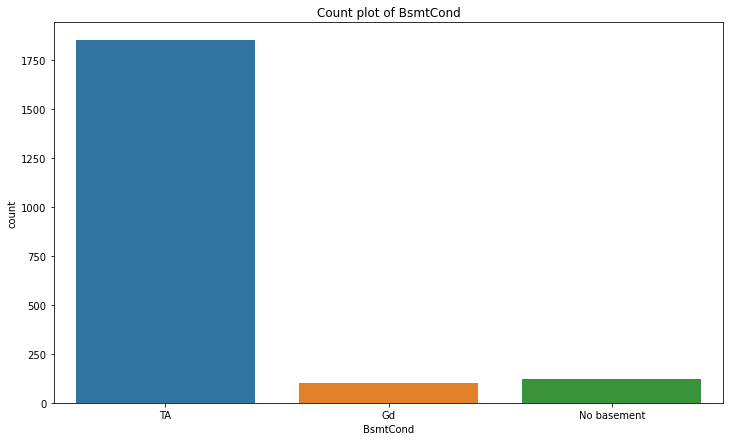

In [496]:
sns.countplot(data.BsmtCond)
plt.title('Count plot of BsmtCond')

Text(0.5, 1.0, 'Cat plot of BsmtCond vs Property_Sale_Price')

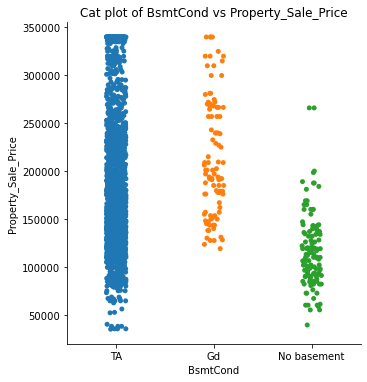

In [497]:
sns.catplot('BsmtCond', 'Property_Sale_Price', data=data)
plt.title('Cat plot of BsmtCond vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of BsmtCond vs Property_Sale_Price')

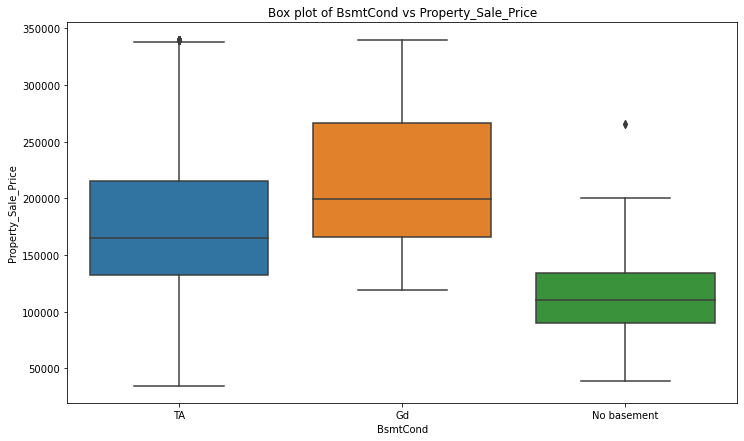

In [498]:
sns.boxplot('BsmtCond', 'Property_Sale_Price', data=data)
plt.title('Box plot of BsmtCond vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 31) BsmtExposure

In [499]:
data.BsmtExposure.isnull().sum()

61

In [500]:
data.BsmtExposure.dtype

dtype('O')

In [501]:
data.BsmtExposure.fillna('No Basement', inplace = True)

In [502]:
data.BsmtExposure.isnull().sum()

0

In [503]:
data.BsmtExposure.value_counts()

No             1349
Av              322
Gd              181
Mn              160
No Basement      61
Name: BsmtExposure, dtype: int64

In [504]:
data.BsmtExposure.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtExposure')

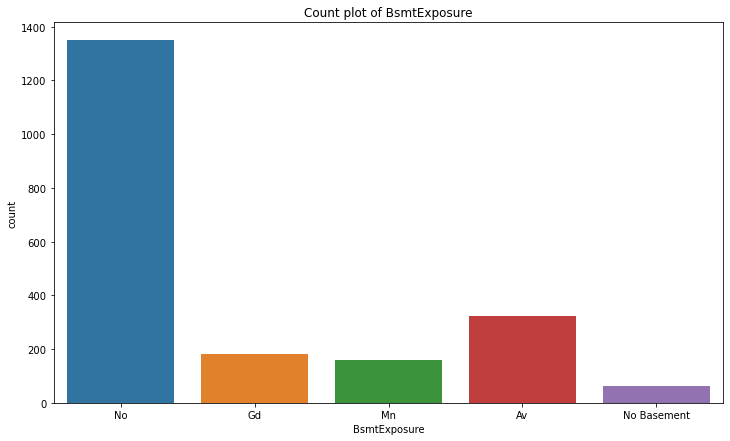

In [505]:
sns.countplot(data.BsmtExposure)
plt.title('Count plot of BsmtExposure')

In [506]:
data.groupby("BsmtExposure")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtExposure,,,,,,,,
Av,322.0,199222.850932,70246.764118,35311.0,144125.00,185675.0,246578.0,340000.0
Gd,181.0,234769.093923,78900.744173,61000.0,167900.00,225000.0,315500.0,340000.0
Mn,160.0,193995.568750,69158.528027,78000.0,142093.75,186750.0,239799.0,340000.0
No,1349.0,165878.057821,57988.554630,34900.0,125500.00,155000.0,193000.0,340000.0
No Basement,61.0,109797.426230,31620.647693,39300.0,90000.00,106250.0,120000.0,198500.0


In [507]:
mod = ols('Property_Sale_Price ~ BsmtExposure', data = data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F        PR(>F)
BsmtExposure     4.0  1.250910e+12  3.127276e+11  80.258963  2.202829e-63
Residual      2068.0  8.057924e+12  3.896482e+09        NaN           NaN


In [508]:
t_BsmtExposure = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtExposure)
print(t_BsmtExposure)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
group1    group2     meandiff   p-adj    lower        upper    reject
---------------------------------------------------------------------
    Av          Gd    35546.243 0.001   19713.9788  51378.5072   True
    Av          Mn   -5227.2822   0.9  -21711.2535  11256.6892  False
    Av          No  -33344.7931 0.001  -43914.9291 -22774.6571   True
    Av No Basement  -89425.4247 0.001 -113223.0046 -65627.8448   True
    Gd          Mn  -40773.5252 0.001  -59266.3889 -22280.6614   True
    Gd          No  -68891.0361 0.001  -82381.4947 -55400.5775   True
    Gd No Basement -124971.6677 0.001 -150202.3931 -99740.9423   True
    Mn          No  -28117.5109 0.001  -42367.1844 -13867.8374   True
    Mn No Basement  -84198.1425 0.001 -109842.8345 -58553.4505   True
    No No Basement  -56080.6316 0.001  -78388.8518 -33772.4114   True
---------------------------------------------------------------------


In [509]:
data.BsmtExposure.replace('Mn', 'Av', inplace = True)

In [510]:
data.BsmtExposure.value_counts()

No             1349
Av              482
Gd              181
No Basement      61
Name: BsmtExposure, dtype: int64

In [511]:
data.BsmtExposure.value_counts().sum()

2073

In [512]:
mod = ols('Property_Sale_Price ~ BsmtExposure', data = data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F        PR(>F)
BsmtExposure     3.0  1.247990e+12  4.159965e+11  106.77502  2.841040e-64
Residual      2069.0  8.060845e+12  3.896010e+09        NaN           NaN


In [513]:
t_BsmtExposure = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtExposure)
print(t_BsmtExposure)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05          
group1    group2     meandiff   p-adj    lower        upper     reject
----------------------------------------------------------------------
    Av          Gd   37281.4404 0.001   23291.1417   51271.7391   True
    Av          No  -31609.5957 0.001  -40125.8321  -23093.3593   True
    Av No Basement  -87690.2273 0.001 -109499.6669  -65880.7876   True
    Gd          No  -68891.0361 0.001  -81594.8313  -56187.2409   True
    Gd No Basement -124971.6677 0.001 -148731.1245 -101212.2109   True
    No No Basement  -56080.6316 0.001   -77088.002  -35073.2612   True
----------------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of BsmtExposure')

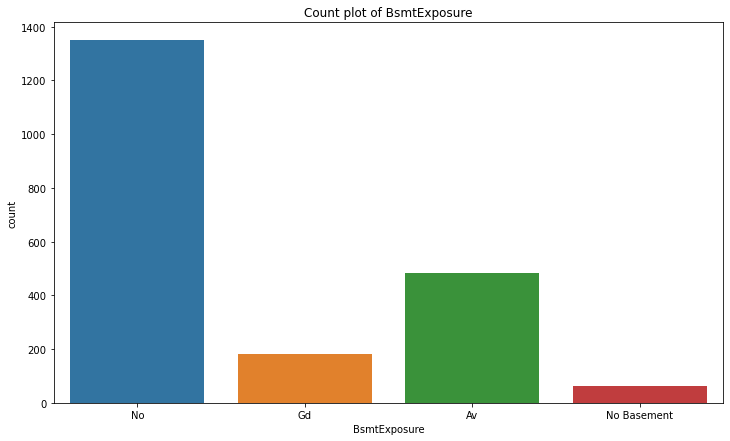

In [514]:
sns.countplot(data.BsmtExposure)
plt.title('Count plot of BsmtExposure')

Text(0.5, 1.0, 'Cat plot of BsmtExposure vs Property_Sale_Price')

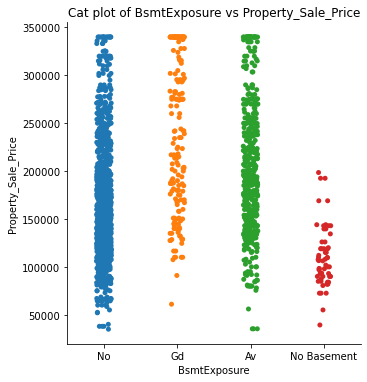

In [515]:
sns.catplot('BsmtExposure', 'Property_Sale_Price', data=data)
plt.title('Cat plot of BsmtExposure vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of BsmtExposure vs Property_Sale_Price')

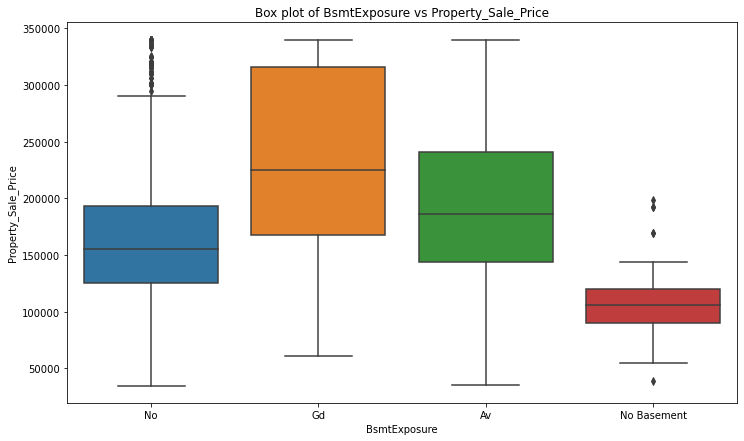

In [516]:
sns.boxplot('BsmtExposure', 'Property_Sale_Price', data=data)
plt.title('Box plot of BsmtExposure vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 32) BsmtFinType1

In [517]:
data.BsmtFinType1.isnull().sum()

59

In [518]:
data.BsmtFinType1.dtype

dtype('O')

In [519]:
data.BsmtFinType1.fillna('No basement', inplace = True)

In [520]:
data.BsmtFinType1.isnull().sum()

0

In [521]:
data.BsmtFinType1.value_counts()

Unf            604
GLQ            599
ALQ            319
BLQ            210
Rec            173
LwQ            109
No basement     59
Name: BsmtFinType1, dtype: int64

In [522]:
data.BsmtFinType1.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtFinType1')

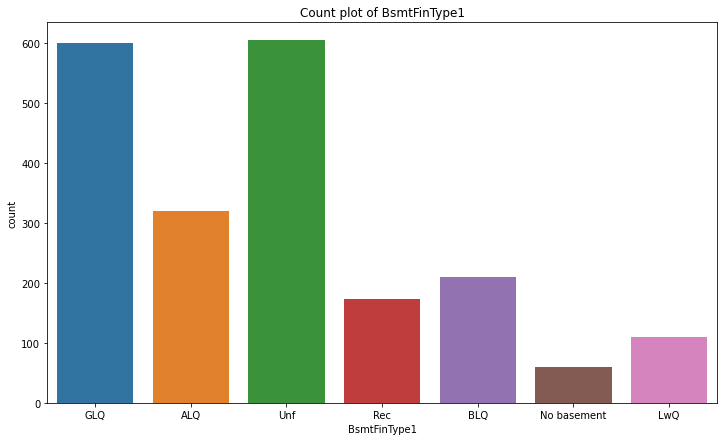

In [523]:
sns.countplot(data.BsmtFinType1)
plt.title('Count plot of BsmtFinType1')

In [524]:
data.groupby("BsmtFinType1")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtFinType1,,,,,,,,
ALQ,319.0,160272.648903,44780.348164,81000.0,129250.0,148500.0,179400.0,340000.0
BLQ,210.0,147228.252381,44001.875087,35311.0,122000.0,140000.0,161500.0,340000.0
GLQ,599.0,225608.691152,68004.823134,80000.0,173733.0,214000.0,275000.0,340000.0
LwQ,109.0,149950.000000,48729.133711,75500.0,117000.0,139000.0,172500.0,301000.0
No basement,59.0,106993.949153,28115.764591,39300.0,90000.0,101800.0,118964.0,198500.0
Rec,173.0,147012.254335,42258.300502,34900.0,125000.0,143000.0,161000.0,340000.0
Unf,604.0,170322.137417,66293.801295,37900.0,118500.0,165000.0,207000.0,340000.0


In [525]:
mod = ols('Property_Sale_Price ~ BsmtFinType1', data = data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq           F         PR(>F)
BsmtFinType1     6.0  2.241398e+12  3.735663e+11  109.203384  8.185389e-120
Residual      2066.0  7.067436e+12  3.420831e+09         NaN            NaN


In [526]:
t_BsmtFinType1 = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtFinType1)
print(t_BsmtFinType1)

           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
   group1      group2     meandiff  p-adj     lower        upper    reject
--------------------------------------------------------------------------
        ALQ         BLQ -13044.3965 0.1562   -28383.061    2294.268  False
        ALQ         GLQ  65336.0422  0.001   53372.0179  77300.0666   True
        ALQ         LwQ -10322.6489 0.6641  -29473.0553   8827.7575  False
        ALQ No basement -53278.6998  0.001  -77740.5472 -28816.8523   True
        ALQ         Rec -13260.3946 0.1983  -29558.1899   3037.4008  False
        ALQ         Unf  10049.4885 0.1662   -1897.3155  21996.2926  False
        BLQ         GLQ  78380.4388  0.001   64537.8951  92222.9825   True
        BLQ         LwQ   2721.7476    0.9   -17655.107  23098.6022  False
        BLQ No basement -40234.3032  0.001  -65667.7481 -14800.8584   True
        BLQ         Rec    -215.998    0.9  -17938.7594  17506.7633  False
        BLQ         Unf  

In [527]:
data.BsmtFinType1.replace('LwQ', 'BLQ', inplace = True)
data.BsmtFinType1.replace('Rec', 'BLQ', inplace = True)
data.BsmtFinType1.replace('ALQ', 'Unf',inplace = True )

In [528]:
data.BsmtFinType1.value_counts()

Unf            923
GLQ            599
BLQ            492
No basement     59
Name: BsmtFinType1, dtype: int64

In [529]:
data.BsmtFinType1.value_counts().sum()

2073

In [530]:
mod = ols('Property_Sale_Price ~ BsmtFinType1', data = data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq           F         PR(>F)
BsmtFinType1     3.0  2.219637e+12  7.398789e+11  215.935521  7.410086e-122
Residual      2069.0  7.089197e+12  3.426388e+09         NaN            NaN


In [531]:
t_BsmtFinType1 = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtFinType1)
print(t_BsmtFinType1)

          Multiple Comparison of Means - Tukey HSD, FWER=0.05           
   group1      group2     meandiff  p-adj    lower       upper    reject
------------------------------------------------------------------------
        BLQ         GLQ  77853.4005 0.001  68696.3059  87010.4951   True
        BLQ No basement -40761.3415 0.001  -61496.556  -20026.127   True
        BLQ         Unf  19093.6216 0.001  10692.5225  27494.7207   True
        GLQ No basement -118614.742 0.001 -139150.693  -98078.791   True
        GLQ         Unf -58759.7789 0.001 -66656.2737 -50863.2841   True
No basement         Unf  59854.9631 0.001  39644.7833  80065.1429   True
------------------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of BsmtFinType1')

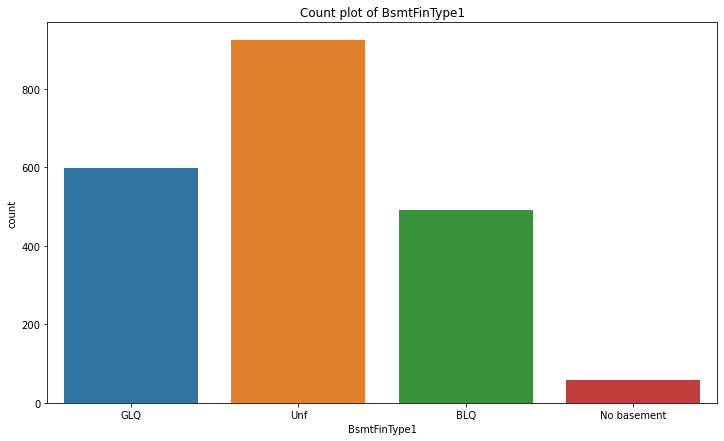

In [532]:
sns.countplot(data.BsmtFinType1)
plt.title('Count plot of BsmtFinType1')

Text(0.5, 1.0, 'Cat plot of BsmtFinType1 vs Property_Sale_Price')

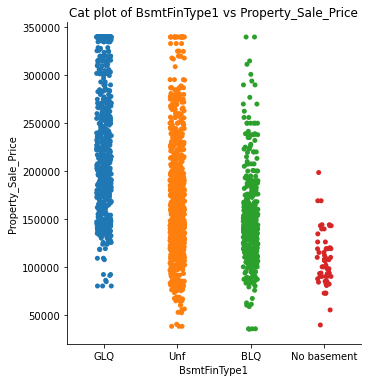

In [533]:
sns.catplot('BsmtFinType1', 'Property_Sale_Price', data=data)
plt.title('Cat plot of BsmtFinType1 vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of BsmtFinType1 vs Property_Sale_Price')

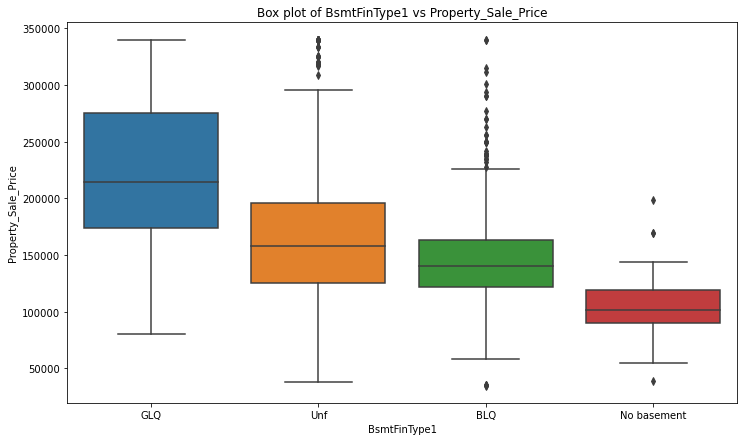

In [534]:
sns.boxplot('BsmtFinType1', 'Property_Sale_Price', data=data)
plt.title('Box plot of BsmtFinType1 vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 33) BsmtFinSF1

In [535]:
data.BsmtFinSF1.isnull().sum()

0

In [536]:
data.BsmtFinSF1.describe()

count    2073.000000
mean      437.949349
std       448.051119
min         0.000000
25%         0.000000
50%       381.000000
75%       708.000000
max      5644.000000
Name: BsmtFinSF1, dtype: float64

In [537]:
data.BsmtFinSF1.value_counts()

0       663
24       18
16       15
936      12
1200      9
       ... 
1216      1
1198      1
1196      1
1186      1
1767      1
Name: BsmtFinSF1, Length: 637, dtype: int64

In [538]:
data.BsmtFinSF1.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of BsmtFinSF1')

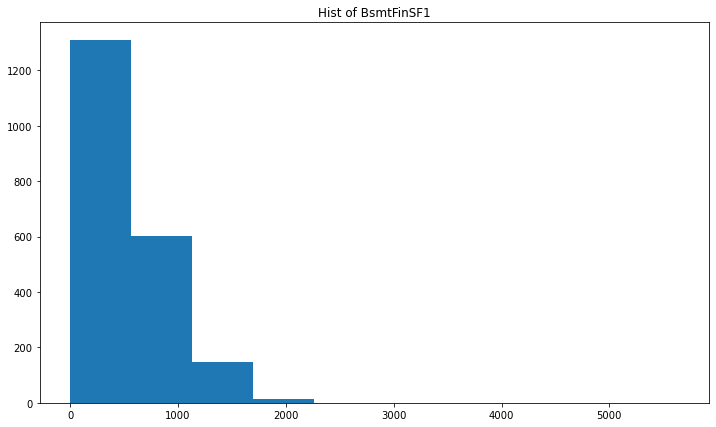

In [539]:
plt.hist(data.BsmtFinSF1)
plt.title('Hist of BsmtFinSF1')

Text(0.5, 1.0, 'Normality of BsmtFinSF1')

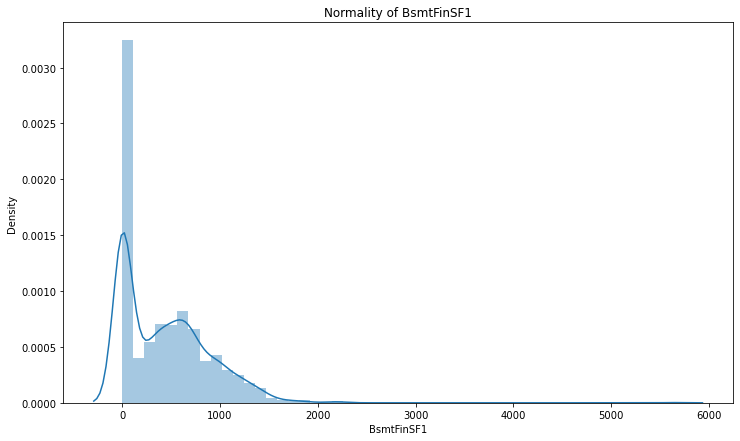

In [540]:
sns.distplot(data.BsmtFinSF1)
plt.title('Normality of BsmtFinSF1')

Text(0.5, 1.0, 'Count plot of BsmtFinSF1')

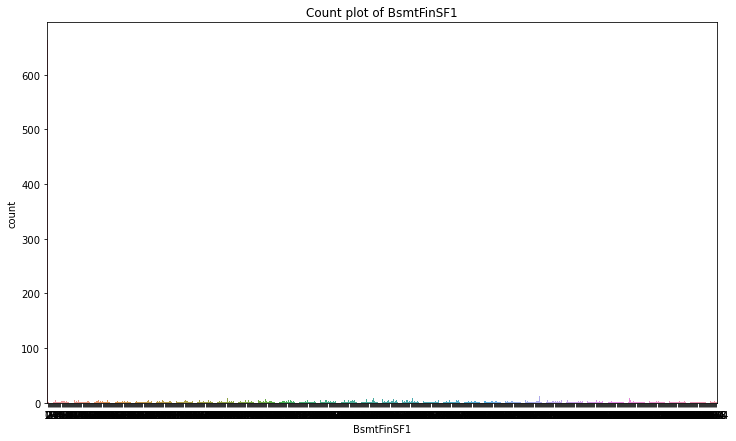

In [541]:
sns.countplot(data.BsmtFinSF1)
plt.title('Count plot of BsmtFinSF1')

Text(0.5, 1.0, 'BoxPlot Of BsmtFinSF1')

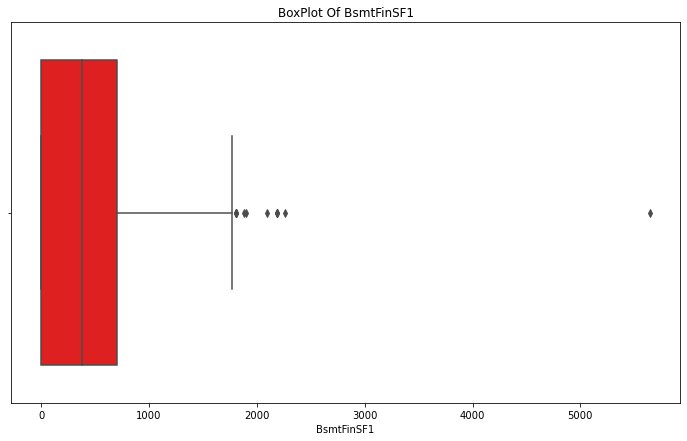

In [542]:
sns.boxplot(data.BsmtFinSF1, color = 'red')
plt.title('BoxPlot Of BsmtFinSF1')

In [543]:
IQR = data.BsmtFinSF1.quantile(0.75) - data.BsmtFinSF1.quantile(0.25)
IQR

708.0

In [544]:
upper_limit = data.BsmtFinSF1.quantile(0.75) + (1.5*IQR)
upper_limit

1770.0

In [545]:
lower_limit = data.BsmtFinSF1.quantile(0.25) - (1.5*IQR)
lower_limit

-1062.0

In [546]:
len(data.BsmtFinSF1[data.BsmtFinSF1 > upper_limit])

12

In [547]:
len(data.BsmtFinSF1[data.BsmtFinSF1 < lower_limit])

0

In [548]:
for i in np.arange(upper_limit,2300,1000):
    outliers = len(data.BsmtFinSF1[data.BsmtFinSF1 > i])
    print('At the point of: ', i, 'There are ', outliers, 'Outliers')

At the point of:  1770.0 There are  12 Outliers


In [549]:
data.BsmtFinSF1 = np.where(data.BsmtFinSF1 > upper_limit, upper_limit, data.BsmtFinSF1)

Text(0.5, 1.0, 'BoxPlot Of BsmtFinSF1')

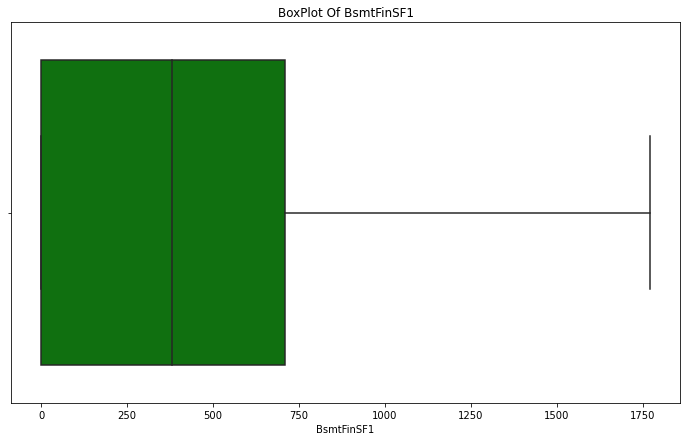

In [550]:
sns.boxplot(data.BsmtFinSF1, color = 'g')
plt.title('BoxPlot Of BsmtFinSF1')

In [551]:
np.corrcoef(data.BsmtFinSF1, data.Property_Sale_Price)

array([[1.        , 0.36562477],
       [0.36562477, 1.        ]])

**Not Good Predictor**

# 

# 

# 34) BsmtFinType2

In [552]:
data.BsmtFinType2.isnull().sum()

60

In [553]:
data.BsmtFinType2.dtype

dtype('O')

In [554]:
data.BsmtFinType2.fillna('No Basement', inplace = True)

In [555]:
data.BsmtFinType2.isnull().sum()

0

In [556]:
data.BsmtFinType2.value_counts()

Unf            1770
Rec              79
LwQ              68
No Basement      60
BLQ              50
ALQ              24
GLQ              22
Name: BsmtFinType2, dtype: int64

In [557]:
data.BsmtFinType2.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtFinType2')

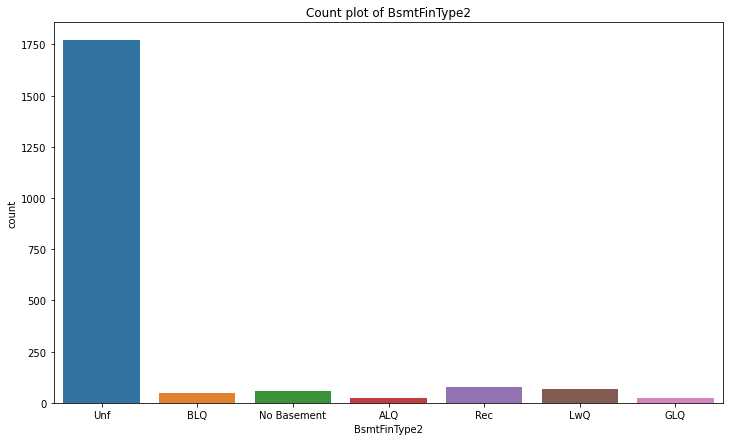

In [558]:
sns.countplot(data.BsmtFinType2)
plt.title('Count plot of BsmtFinType2')

In [559]:
data.groupby("BsmtFinType2")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtFinType2,,,,,,,,
ALQ,24.0,199154.166667,73038.304299,123500.0,131000.0,169700.0,290000.0,340000.0
BLQ,50.0,146091.660000,36211.174172,62383.0,129000.0,141000.0,158712.5,271900.0
GLQ,22.0,181625.000000,63255.799188,75500.0,114250.0,193000.0,236500.0,270000.0
LwQ,68.0,167181.617647,43912.261491,88000.0,138500.0,155500.0,189725.0,287000.0
No Basement,60.0,109944.050000,36045.577789,39300.0,90000.0,104025.0,119223.0,284000.0
Rec,79.0,161127.531646,48851.882623,85000.0,129000.0,147000.0,178450.0,340000.0
Unf,1770.0,181567.964407,68304.963259,34900.0,132500.0,169250.0,221000.0,340000.0


In [560]:
mod = ols('Property_Sale_Price ~ BsmtFinType2', data = data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F        PR(>F)
BsmtFinType2     6.0  3.924698e+11  6.541164e+10  15.156452  4.704314e-17
Residual      2066.0  8.916364e+12  4.315762e+09        NaN           NaN


In [561]:
t_BsmtFinType2 = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtFinType2)
print(t_BsmtFinType2)

           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
   group1      group2     meandiff  p-adj     lower        upper    reject
--------------------------------------------------------------------------
        ALQ         BLQ -53062.5067 0.0199 -101207.6947  -4917.3186   True
        ALQ         GLQ -17529.1667    0.9  -74754.6678  39696.3345  False
        ALQ         LwQ  -31972.549  0.385  -78004.7231   14059.625  False
        ALQ No Basement -89210.1167  0.001 -136036.0074 -42384.2259   True
        ALQ         Rec  -38026.635 0.1659  -83215.0487   7161.7787  False
        ALQ         Unf -17586.2023 0.8334  -57428.7054  22256.3009  False
        BLQ         GLQ    35533.34 0.3448  -14068.4736  85135.1536  False
        BLQ         LwQ  21089.9576 0.5863  -15028.4999  57208.4152  False
        BLQ No Basement   -36147.61 0.0624  -73272.3453    977.1253  False
        BLQ         Rec  15035.8716 0.8546  -20000.8899  50072.6332  False
        BLQ         Unf  

In [562]:
data.BsmtFinType2.replace('GLQ', 'ALQ', inplace = True)
data.BsmtFinType2.replace('LwQ', 'Rec', inplace = True)
data.BsmtFinType2.replace('ALQ', 'Unf', inplace = True)
data.BsmtFinType2.replace('BLQ', 'Rec', inplace = True)

In [563]:
data.BsmtFinType2.value_counts()

Unf            1816
Rec             197
No Basement      60
Name: BsmtFinType2, dtype: int64

In [564]:
data.BsmtFinType2.value_counts().sum()

2073

In [565]:
mod = ols('Property_Sale_Price ~ BsmtFinType2', data = data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F        PR(>F)
BsmtFinType2     2.0  3.719368e+11  1.859684e+11  43.074752  4.695439e-19
Residual      2070.0  8.936897e+12  4.317342e+09        NaN           NaN


In [566]:
t_BsmtFinType2 = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtFinType2)
print(t_BsmtFinType2)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
   group1   group2  meandiff  p-adj   lower      upper    reject
----------------------------------------------------------------
No Basement    Rec 49457.0058 0.001 26732.9501 72181.0616   True
No Basement    Unf 71857.0221 0.001 51635.6374 92078.4069   True
        Rec    Unf 22400.0163 0.001 10839.9886  33960.044   True
----------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of BsmtFinType2')

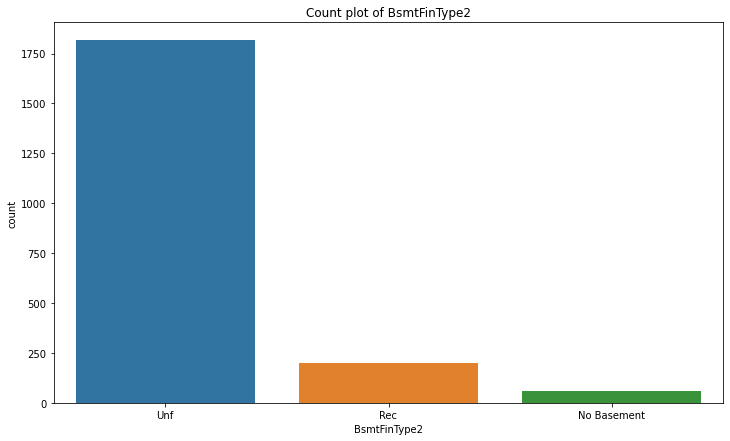

In [567]:
sns.countplot(data.BsmtFinType2)
plt.title('Count plot of BsmtFinType2')

Text(0.5, 1.0, 'Cat plot of BsmtFinType2 vs Property_Sale_Price')

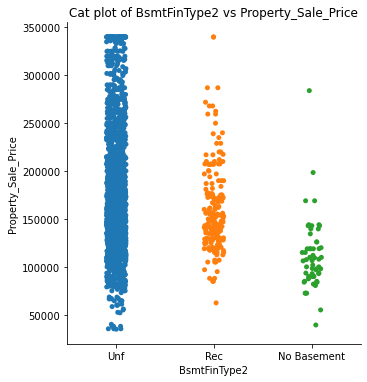

In [568]:
sns.catplot('BsmtFinType2', 'Property_Sale_Price', data=data)
plt.title('Cat plot of BsmtFinType2 vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of BsmtFinType2 vs Property_Sale_Price')

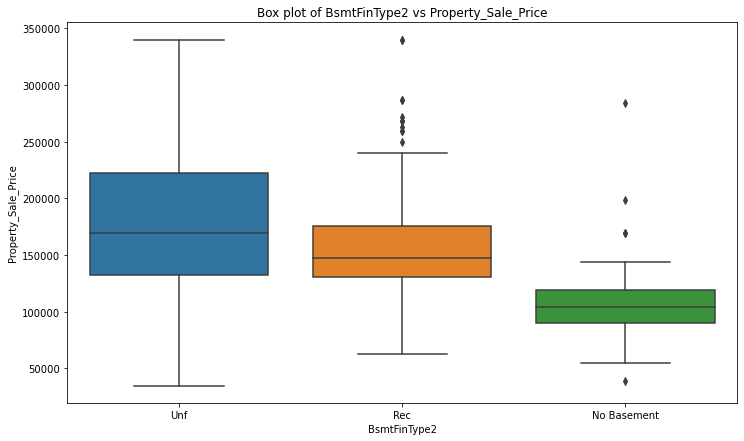

In [569]:
sns.boxplot('BsmtFinType2', 'Property_Sale_Price', data=data)
plt.title('Box plot of BsmtFinType2 vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 35) BsmtFinSF2

In [570]:
data.BsmtFinSF2.isnull().sum()

0

In [571]:
data.BsmtFinSF2.describe()

count    2073.000000
mean       49.219489
std       165.621465
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1474.000000
Name: BsmtFinSF2, dtype: float64

In [572]:
data.BsmtFinSF2.value_counts()

0       1829
93         7
290        6
180        5
712        5
        ... 
600        1
580        1
546        1
544        1
1127       1
Name: BsmtFinSF2, Length: 144, dtype: int64

In [573]:
data.BsmtFinSF2.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of BsmtFinSF2')

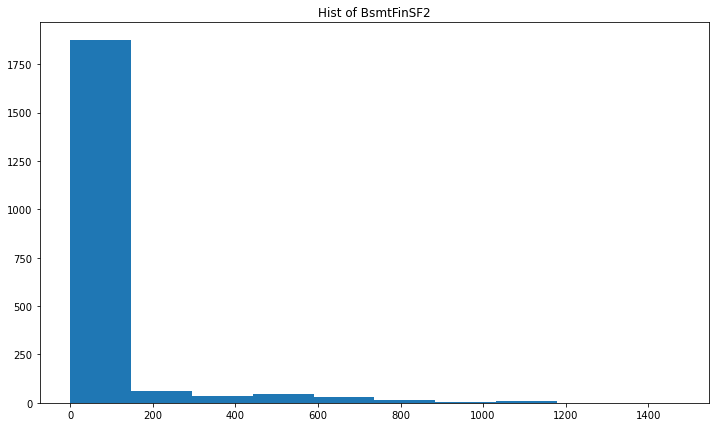

In [574]:
plt.hist(data.BsmtFinSF2)
plt.title('Hist of BsmtFinSF2')

Text(0.5, 1.0, 'Normality of BsmtFinSF1')

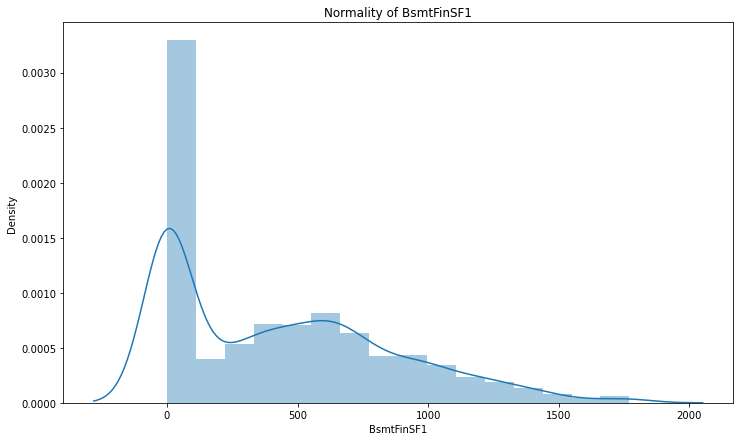

In [575]:
sns.distplot(data.BsmtFinSF1)
plt.title('Normality of BsmtFinSF1')

Text(0.5, 1.0, 'count plot of BsmtFinSF1')

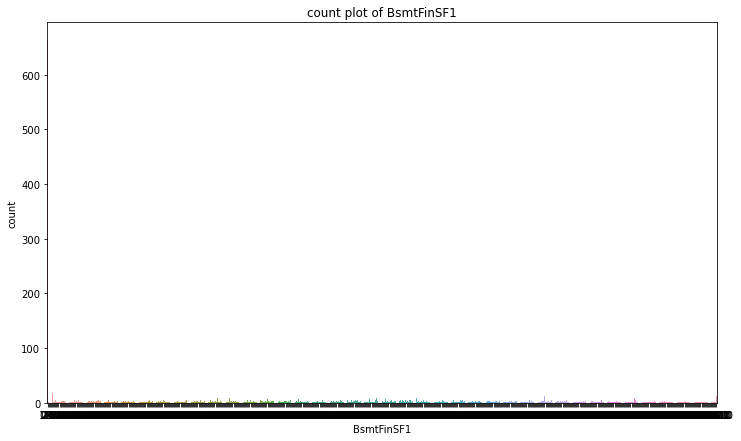

In [576]:
sns.countplot(data.BsmtFinSF1)
plt.title('count plot of BsmtFinSF1')

Text(0.5, 1.0, 'BoxPlot Of BsmtFinSF1')

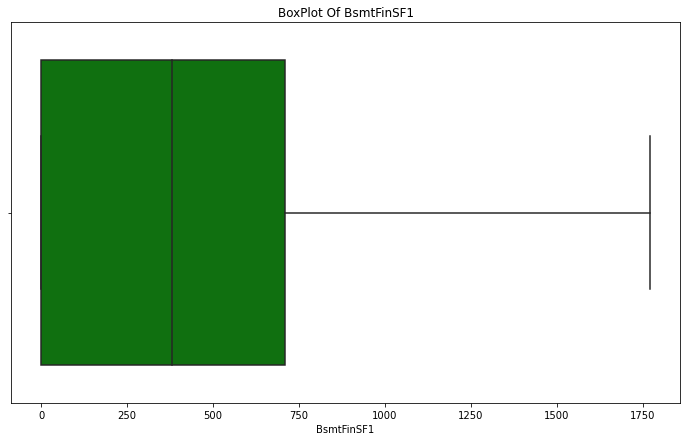

In [577]:
sns.boxplot(data.BsmtFinSF1, color = 'g')
plt.title('BoxPlot Of BsmtFinSF1')

In [578]:
np.corrcoef(data.BsmtFinSF2, data.Property_Sale_Price)

array([[ 1.        , -0.02588584],
       [-0.02588584,  1.        ]])

**Not a Good Predictor**

# 

# 

# 36) BsmtUnfSF

In [579]:
data.BsmtUnfSF.isnull().sum()

0

In [580]:
data.BsmtUnfSF.describe()

count    2073.000000
mean      565.101302
std       449.730940
min         0.000000
25%       208.000000
50%       466.000000
75%       804.000000
max      2336.000000
Name: BsmtUnfSF, dtype: float64

In [581]:
data.BsmtUnfSF.value_counts()

0       173
300      11
728      11
600      11
384      10
       ... 
730       1
251       1
241       1
744       1
1969      1
Name: BsmtUnfSF, Length: 780, dtype: int64

In [582]:
data.BsmtUnfSF.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of BsmtUnfSF')

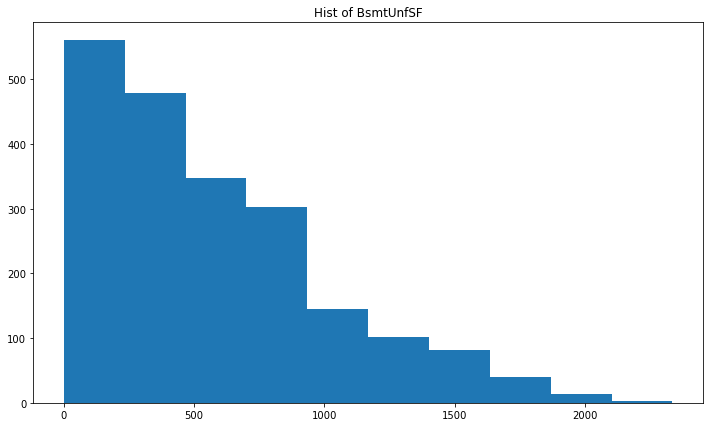

In [583]:
plt.hist(data.BsmtUnfSF)
plt.title('Hist of BsmtUnfSF')

Text(0.5, 1.0, 'Normality of BsmtUnfSF')

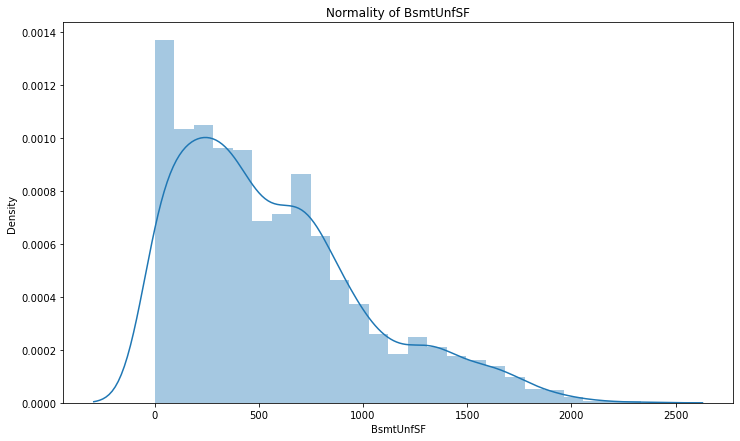

In [584]:
sns.distplot(data.BsmtUnfSF)
plt.title('Normality of BsmtUnfSF')

Text(0.5, 1.0, 'count plot of BsmtUnfSF')

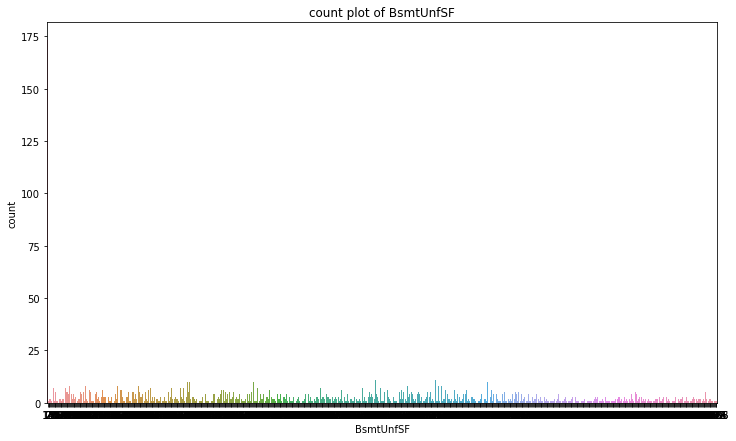

In [585]:
sns.countplot(data.BsmtUnfSF)
plt.title('count plot of BsmtUnfSF')

Text(0.5, 1.0, 'BoxPlot Of BsmtUnfSF')

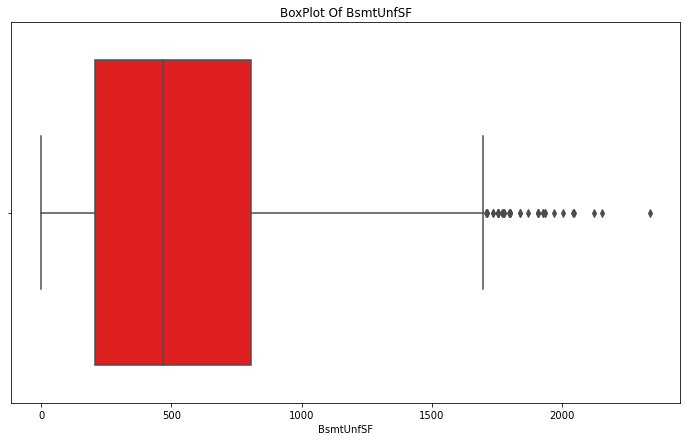

In [586]:
sns.boxplot(data.BsmtUnfSF, color = 'red')
plt.title('BoxPlot Of BsmtUnfSF')

In [587]:
IQR = data.BsmtUnfSF.quantile(0.75) - data.BsmtUnfSF.quantile(0.25)
IQR

596.0

In [588]:
upper_limit = data.BsmtUnfSF.quantile(0.75) + (1.5*IQR)
upper_limit

1698.0

In [589]:
lower_limit = data.BsmtUnfSF.quantile(0.25) - (1.5*IQR)
lower_limit

-686.0

In [590]:
len(data.BsmtUnfSF[data.BsmtUnfSF > upper_limit])

41

In [591]:
len(data.BsmtUnfSF[data.BsmtUnfSF < lower_limit])

0

In [592]:
for i in np.arange(upper_limit,2700,300):
    outliers = len(data.BsmtUnfSF[data.BsmtUnfSF > i])
    print('At the point of: ', i, 'There are ', outliers, 'Outliers')

At the point of:  1698.0 There are  41 Outliers
At the point of:  1998.0 There are  6 Outliers
At the point of:  2298.0 There are  1 Outliers
At the point of:  2598.0 There are  0 Outliers


In [593]:
data.BsmtUnfSF = np.where(data.BsmtUnfSF > upper_limit, upper_limit, data.BsmtUnfSF)

Text(0.5, 1.0, 'BoxPlot Of BsmtUnfSF')

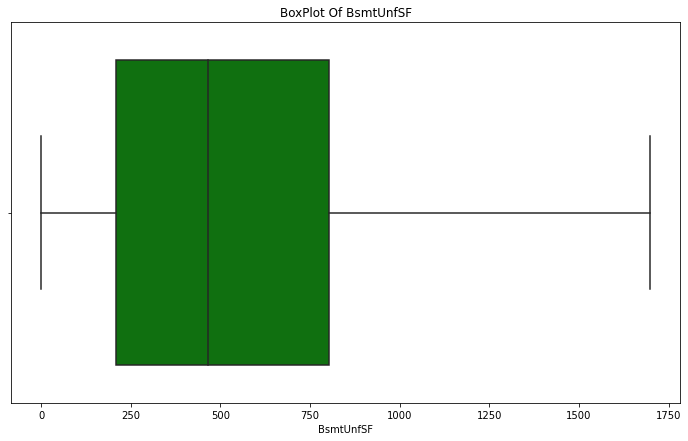

In [594]:
sns.boxplot(data.BsmtUnfSF, color = 'g')
plt.title('BoxPlot Of BsmtUnfSF')

In [595]:
np.corrcoef(data.BsmtUnfSF, data.Property_Sale_Price)

array([[1.        , 0.23819431],
       [0.23819431, 1.        ]])

**Not a Good Predictor**

# 

# 

# 37) TotalBsmtSF

In [596]:
data.TotalBsmtSF.isnull().sum()

0

In [597]:
data.TotalBsmtSF.describe()

count    2073.000000
mean     1052.270140
std       431.026436
min         0.000000
25%       794.000000
50%       990.000000
75%      1291.000000
max      6110.000000
Name: TotalBsmtSF, dtype: float64

In [598]:
data.TotalBsmtSF.value_counts()

0       59
864     48
816     21
912     21
672     21
        ..
2046     1
2042     1
6110     1
2006     1
2035     1
Name: TotalBsmtSF, Length: 721, dtype: int64

In [599]:
data.TotalBsmtSF.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of TotalBsmtSF')

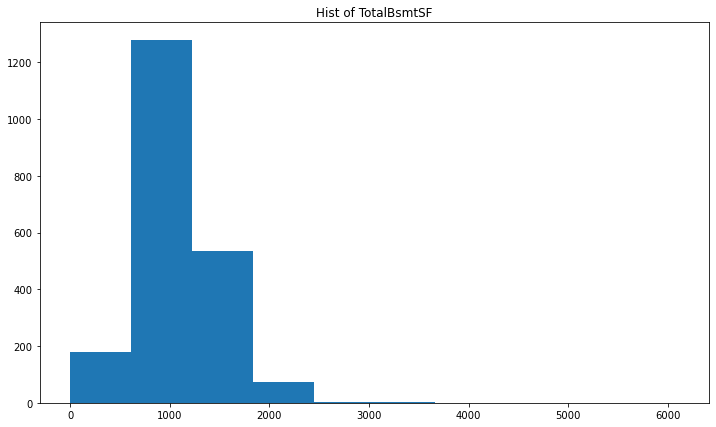

In [600]:
plt.hist(data.TotalBsmtSF)
plt.title('Hist of TotalBsmtSF')

Text(0.5, 1.0, 'Normality of TotalBsmtSF')

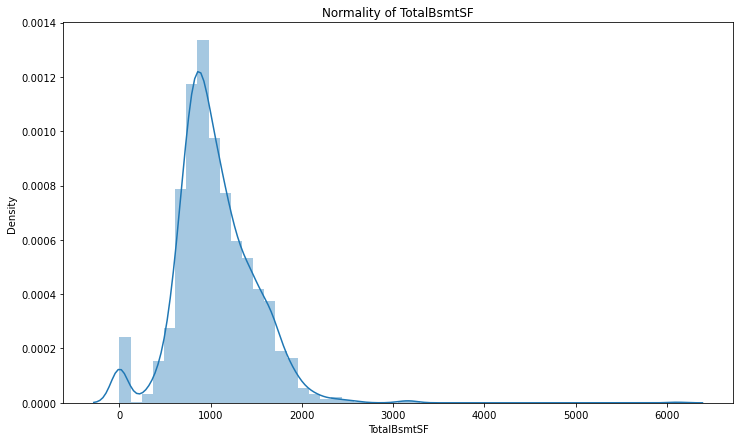

In [601]:
sns.distplot(data.TotalBsmtSF)
plt.title('Normality of TotalBsmtSF')

Text(0.5, 1.0, 'count plot of TotalBsmtSF')

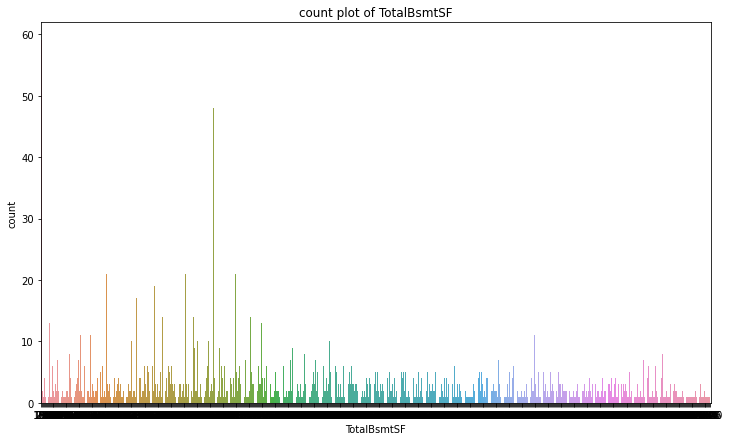

In [602]:
sns.countplot(data.TotalBsmtSF)
plt.title('count plot of TotalBsmtSF')

Text(0.5, 1.0, 'BoxPlot Of TotalBsmtSF')

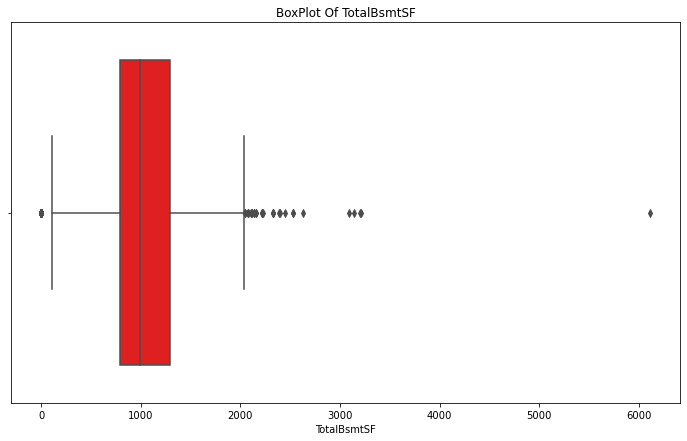

In [603]:
sns.boxplot(data.TotalBsmtSF, color = 'red')
plt.title('BoxPlot Of TotalBsmtSF')

In [604]:
IQR = data.TotalBsmtSF.quantile(0.75) - data.TotalBsmtSF.quantile(0.25)
IQR

497.0

In [605]:
upper_limit = data.TotalBsmtSF.quantile(0.75) + (1.5*IQR)
upper_limit

2036.5

In [606]:
lower_limit = data.TotalBsmtSF.quantile(0.25) - (1.5*IQR)
lower_limit

48.5

In [607]:
len(data.TotalBsmtSF[data.TotalBsmtSF > upper_limit])

30

In [608]:
len(data.TotalBsmtSF[data.TotalBsmtSF < lower_limit])

59

In [609]:
for i in np.arange(upper_limit, 3000, 350):
    outliers = len(data.TotalBsmtSF[data.TotalBsmtSF > i])
    print('At the point of: ', i, 'There are', outliers, 'Outliers')

At the point of:  2036.5 There are 30 Outliers
At the point of:  2386.5 There are 11 Outliers
At the point of:  2736.5 There are 5 Outliers


In [610]:
data.TotalBsmtSF = np.where(data.TotalBsmtSF > upper_limit, upper_limit, data.TotalBsmtSF)

In [611]:
data.TotalBsmtSF = np.where(data.TotalBsmtSF < lower_limit, lower_limit, data.TotalBsmtSF)

Text(0.5, 1.0, 'BoxPlot Of TotalBsmtSF')

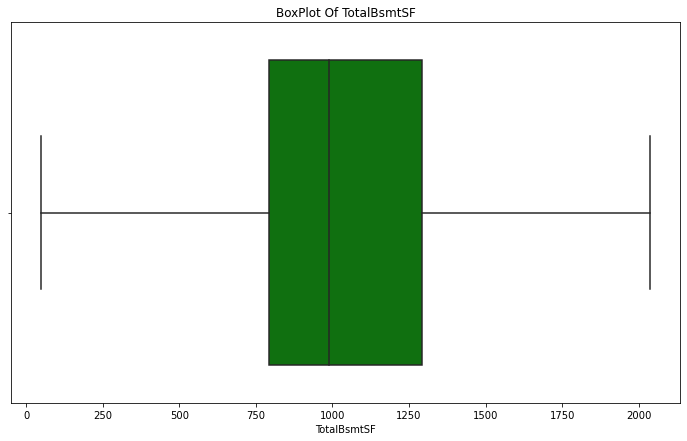

In [612]:
sns.boxplot(data.TotalBsmtSF, color = 'g')
plt.title('BoxPlot Of TotalBsmtSF')

In [613]:
np.corrcoef(data.TotalBsmtSF, data.Property_Sale_Price)

array([[1.        , 0.64253607],
       [0.64253607, 1.        ]])

Text(0.5, 1.0, 'Scatter plot of TotalBsmtSF vs Property_Sale_Price')

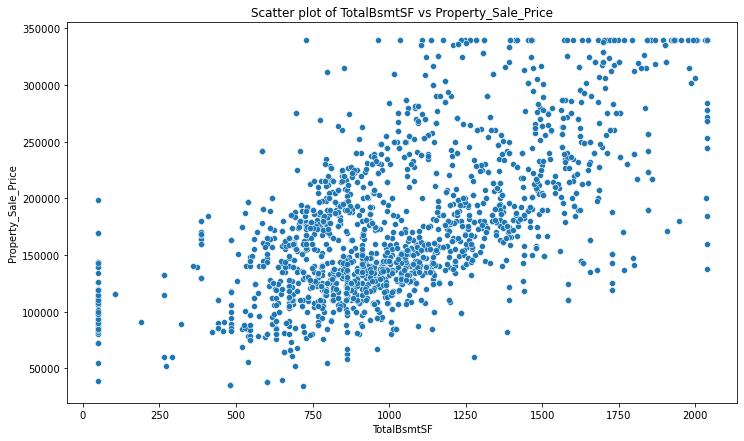

In [614]:
sns.scatterplot(x = data['TotalBsmtSF'], y = data.Property_Sale_Price, data = data )
plt.xlabel('TotalBsmtSF')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter plot of TotalBsmtSF vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 38) Heating

In [615]:
data.Heating.isnull().sum()

0

In [616]:
data.Heating.value_counts()

GasA     2025
GasW       25
Grav       10
Wall        8
Floor       3
OthW        2
Name: Heating, dtype: int64

In [617]:
data.Heating.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Heating')

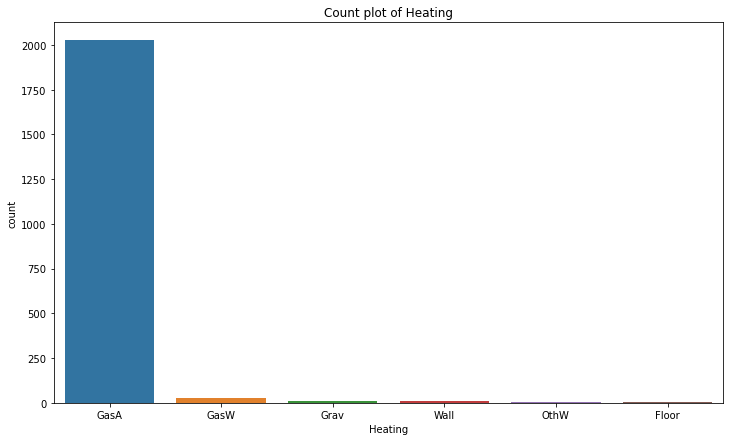

In [618]:
sns.countplot(data.Heating)
plt.title('Count plot of Heating')

In [619]:
data.groupby("Heating")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Heating,,,,,,,,
Floor,3.0,72500.00000,0.000000,72500.0,72500.0,72500.0,72500.0,72500.0
GasA,2025.0,178906.68642,66531.528754,34900.0,131500.0,165000.0,214900.0,340000.0
GasW,25.0,157370.32000,70285.099908,82000.0,115000.0,133900.0,205000.0,340000.0
Grav,10.0,72370.00000,32534.701132,37900.0,41550.0,69500.0,92375.0,121000.0
OthW,2.0,125750.00000,5303.300859,122000.0,123875.0,125750.0,127625.0,129500.0
Wall,8.0,92050.00000,3946.788930,87500.0,90000.0,90000.0,94175.0,98000.0


In [620]:
mod = ols('Property_Sale_Price ~ Heating', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq          F        PR(>F)
Heating      5.0  2.214873e+11  4.429745e+10  10.075859  1.514722e-09
Residual  2067.0  9.087347e+12  4.396394e+09        NaN           NaN


In [621]:
t_Heating = pairwise_tukeyhsd(data.Property_Sale_Price, data.Heating, alpha = 0.05)
print(t_Heating)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
 Floor   GasA  106406.6864 0.0616   -2866.2347 215679.6076  False
 Floor   GasW     84870.32 0.2903  -30687.7029 200428.3429  False
 Floor   Grav       -130.0    0.9 -124628.1126 124368.1126  False
 Floor   OthW      53250.0    0.9 -119397.8188 225897.8188  False
 Floor   Wall      19550.0    0.9 -108489.0492 147589.0492  False
  GasA   GasW  -21536.3664 0.5768  -59594.3813  16521.6484  False
  GasA   Grav -106536.6864  0.001 -166491.1348  -46582.238   True
  GasA   OthW  -53156.6864 0.8544 -186955.1362  80641.7634  False
  GasA   Wall  -86856.6864 0.0031 -153854.8503 -19858.5225   True
  GasW   Grav    -85000.32 0.0082 -155764.8679 -14235.7721   True
  GasW   OthW    -31620.32    0.9 -170599.1332 107358.4932  False
  GasW   Wall    -65320.32 0.1479 -142143.7495  11503.1095  False
  Grav   O

In [622]:
data["Heating"].replace('Floor', 'Grav',inplace = True)
data["Heating"].replace('OthW', 'Grav',inplace = True)
data["Heating"].replace('Wall', 'Grav',inplace = True)
data["Heating"].replace('GasW', 'GasA',inplace = True)

In [623]:
data.Heating.value_counts()

GasA    2050
Grav      23
Name: Heating, dtype: int64

In [624]:
data.Heating.value_counts().sum()

2073

In [625]:
df1=data[data.Heating=='GasA']

df2=data[data.Heating=='Grav']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=6.816687704976715, pvalue=1.2177323085835995e-11)

Text(0.5, 1.0, 'count plot of Heating')

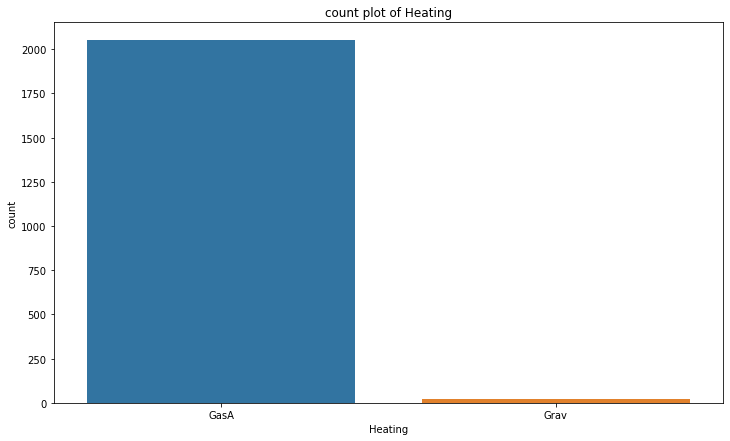

In [626]:
sns.countplot(data.Heating)
plt.title('count plot of Heating')

Text(0.5, 1.0, 'Cat plot of Heating vs Property_Sale_Price')

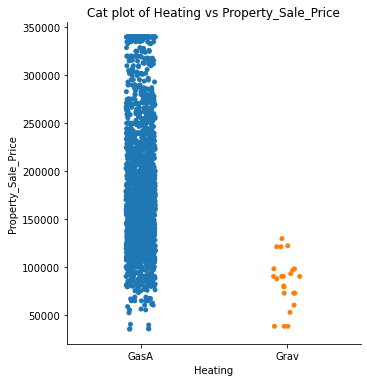

In [627]:
sns.catplot('Heating', 'Property_Sale_Price', data=data)
plt.title('Cat plot of Heating vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of Heating vs Property_Sale_Price')

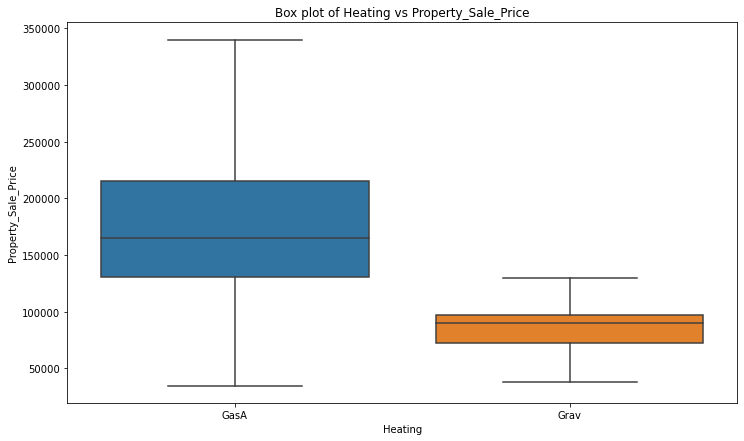

In [628]:
sns.boxplot('Heating', 'Property_Sale_Price', data=data)
plt.title('Box plot of Heating vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 39) HeatingQC

In [629]:
data.HeatingQC.isnull().sum()

0

In [630]:
data.HeatingQC.value_counts()

Ex    1045
TA     618
Gd     341
Fa      68
Po       1
Name: HeatingQC, dtype: int64

In [631]:
data.HeatingQC.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of HeatingQC')

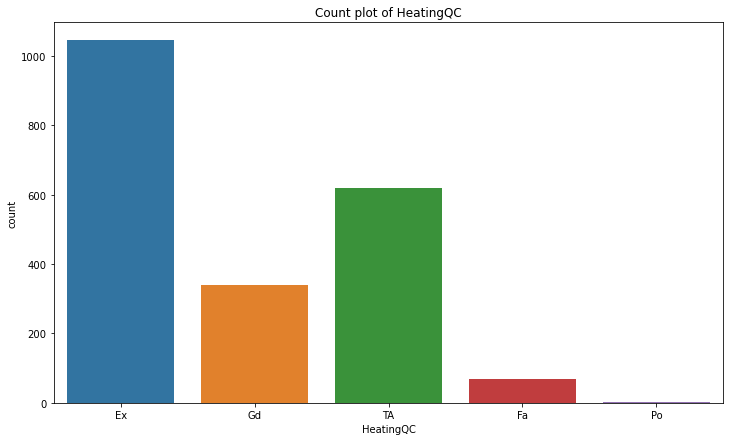

In [632]:
sns.countplot(data.HeatingQC)
plt.title('Count plot of HeatingQC')

In [633]:
data.groupby("HeatingQC")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
HeatingQC,,,,,,,,
Ex,1045.0,208654.001914,67436.100850,66500.0,157000.0,195000.0,253000.0,340000.0
Fa,68.0,120657.500000,48828.262281,37900.0,83000.0,121500.0,160000.0,235000.0
Gd,341.0,158854.217009,52355.542116,52000.0,125500.0,153500.0,179400.0,340000.0
Po,1.0,87000.000000,NaN,87000.0,87000.0,87000.0,87000.0,87000.0
TA,618.0,141820.336570,46287.982203,34900.0,115000.0,135000.0,157900.0,340000.0


In [634]:
mod = ols('Property_Sale_Price ~ HeatingQC', data=data).fit()
print(sm.stats.anova_lm(mod))

               df        sum_sq       mean_sq          F         PR(>F)
HeatingQC     4.0  2.147424e+12  5.368561e+11  155.02791  4.074768e-116
Residual   2068.0  7.161410e+12  3.462964e+09        NaN            NaN


In [635]:
t_HeatingQC = pairwise_tukeyhsd(data.Property_Sale_Price, data.HeatingQC, alpha = 0.05)
print(t_HeatingQC)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
    Ex     Fa  -87996.5019  0.001 -108103.5781 -67889.4258   True
    Ex     Gd  -49799.7849  0.001  -59819.6119 -39779.9579   True
    Ex     Po -121654.0019 0.2353 -282393.1414  39085.1376  False
    Ex     TA  -66833.6653  0.001  -74986.4822 -58680.8485   True
    Fa     Gd    38196.717  0.001   16859.1966  59534.2375   True
    Fa     Po     -33657.5    0.9 -195496.8148 128181.8148  False
    Fa     TA   21162.8366 0.0395     635.7504  41689.9228   True
    Gd     Po   -71854.217 0.7134 -232751.9057  89043.4717  False
    Gd     TA  -17033.8804  0.001  -27871.9471  -6195.8138   True
    Po     TA   54820.3366  0.877 -105971.8825 215612.5557  False
-----------------------------------------------------------------


In [636]:
data["HeatingQC"].replace('Po', 'Fa',inplace = True)

In [637]:
data.HeatingQC.value_counts()

Ex    1045
TA     618
Gd     341
Fa      69
Name: HeatingQC, dtype: int64

In [638]:
data.HeatingQC.value_counts().sum()

2073

In [639]:
mod = ols('Property_Sale_Price ~ HeatingQC', data=data).fit()
print(sm.stats.anova_lm(mod))

               df        sum_sq       mean_sq           F         PR(>F)
HeatingQC     3.0  2.146308e+12  7.154360e+11  206.664102  3.061274e-117
Residual   2069.0  7.162526e+12  3.461830e+09         NaN            NaN


In [640]:
t_HeatingQC = pairwise_tukeyhsd(data.Property_Sale_Price, data.HeatingQC, alpha = 0.05)
print(t_HeatingQC)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
    Ex     Fa -88484.2918  0.001 -107287.6653 -69680.9182   True
    Ex     Gd -49799.7849  0.001  -59234.3557 -40365.2141   True
    Ex     TA -66833.6653  0.001  -74510.2777  -59157.053   True
    Fa     Gd  38684.5069  0.001   18715.0588  58653.9549   True
    Fa     TA  21650.6264 0.0198    2449.1133  40852.1396   True
    Gd     TA -17033.8804  0.001  -27238.8977  -6828.8631   True
----------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of HeatingQC')

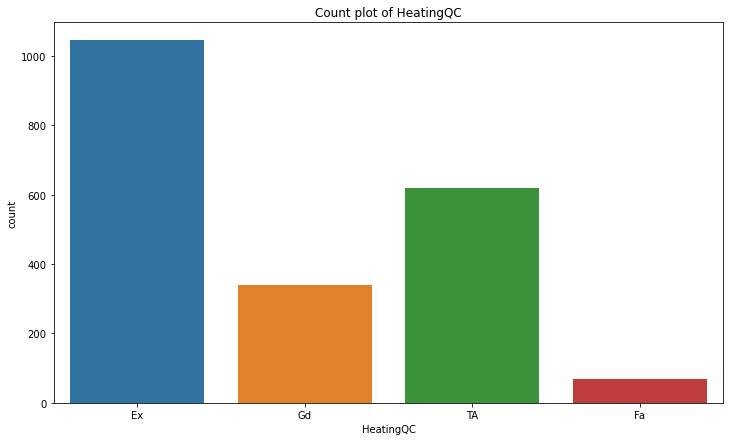

In [641]:
sns.countplot(data.HeatingQC)
plt.title('Count plot of HeatingQC')

Text(0.5, 1.0, 'Cat Plot of HeatingQC vs Property_Sale_Price')

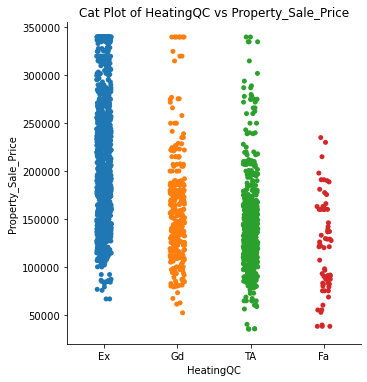

In [642]:
sns.catplot('HeatingQC', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of HeatingQC vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of HeatingQC vs Property_Sale_Price')

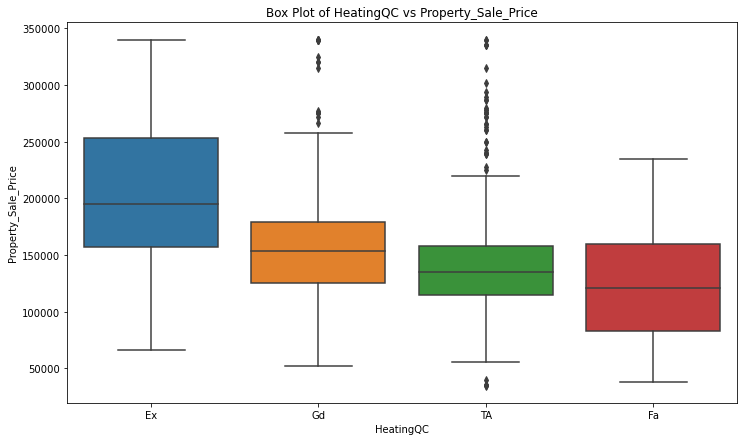

In [643]:
sns.boxplot('HeatingQC', 'Property_Sale_Price', data=data)
plt.title('Box Plot of HeatingQC vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 40) CentralAir

In [644]:
data.CentralAir.isnull().sum()

0

In [645]:
data.CentralAir.value_counts()

Y    1935
N     138
Name: CentralAir, dtype: int64

In [646]:
data.CentralAir.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of CentralAir')

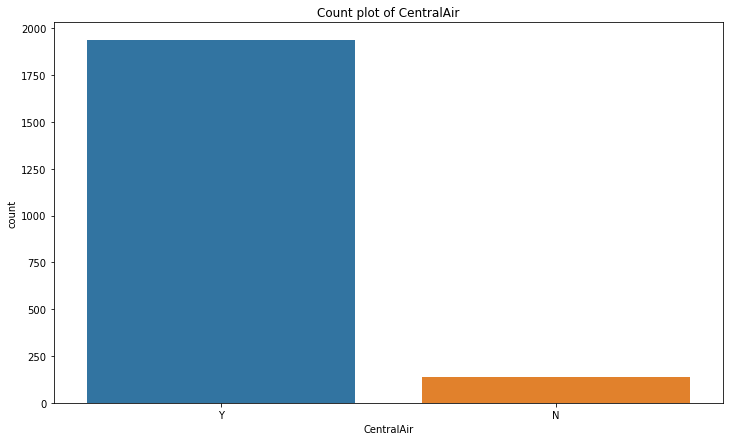

In [647]:
sns.countplot(data.CentralAir)
plt.title('Count plot of CentralAir')

In [648]:
data.groupby("CentralAir")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
CentralAir,,,,,,,,
N,138.0,106078.898551,40909.189004,34900.0,84000.0,100000.0,128750.0,265979.0
Y,1935.0,182692.770026,65603.012258,52000.0,135000.0,169990.0,219355.0,340000.0


In [649]:
df1=data[data.CentralAir=='Y']
df2=data[data.CentralAir=='N']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=13.530853321902182, pvalue=4.904316035430789e-40)

Text(0.5, 1.0, 'Cat Plot of CentralAir vs Property_Sale_Price')

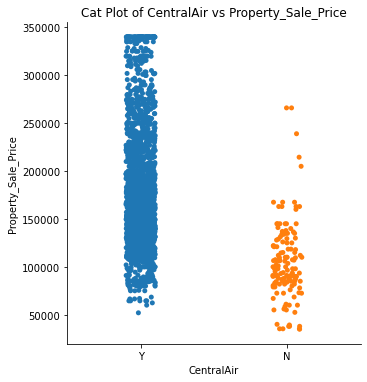

In [650]:
sns.catplot('CentralAir', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of CentralAir vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of CentralAir vs Property_Sale_Price')

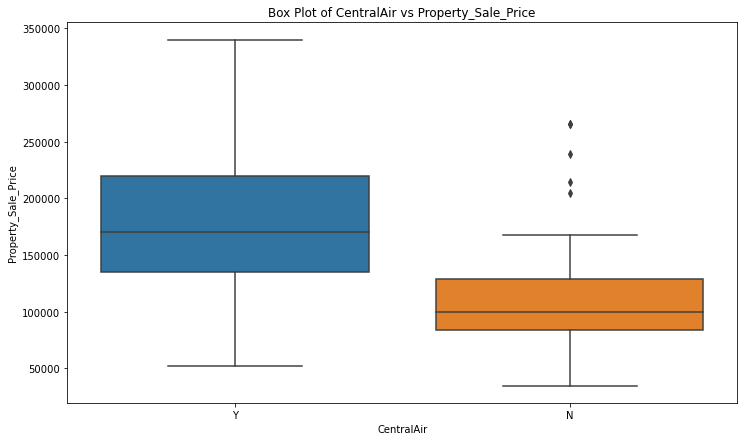

In [651]:
sns.boxplot('CentralAir', 'Property_Sale_Price', data=data)
plt.title('Box Plot of CentralAir vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 41) Electrical

In [652]:
data.Electrical.isnull().sum()

1

In [653]:
data.Electrical.dtype

dtype('O')

In [654]:
data.Electrical.mode()

0    SBrkr
dtype: object

In [655]:
data.Electrical.fillna(data.Electrical.mode()[0], inplace = True)

In [656]:
data.Electrical.isnull().sum()

0

In [657]:
data.Electrical.value_counts()

SBrkr    1902
FuseA     127
FuseF      40
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [658]:
data.Electrical.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Electrical')

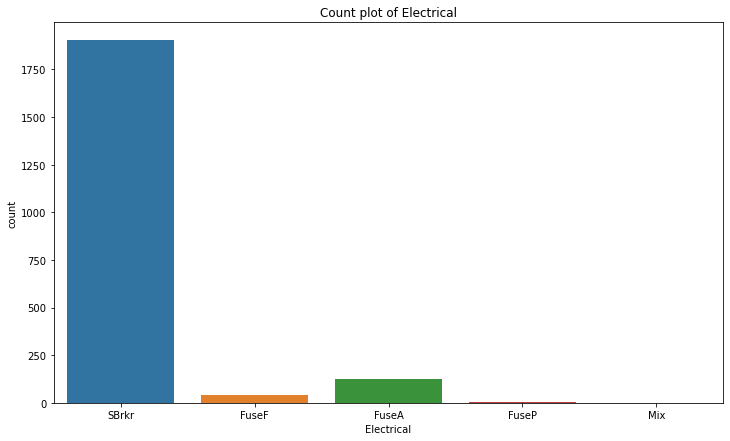

In [659]:
sns.countplot(data.Electrical)
plt.title('Count plot of Electrical')

In [660]:
data.groupby("Electrical")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Electrical,,,,,,,,
FuseA,127.0,122764.409449,35751.012402,34900.0,103000.0,130000.0,142125.0,239000.0
FuseF,40.0,108434.675000,29055.117416,39300.0,90000.0,105750.0,129925.0,169500.0
FuseP,3.0,97333.333333,34645.827070,73000.0,77500.0,82000.0,109500.0,137000.0
Mix,1.0,67000.000000,NaN,67000.0,67000.0,67000.0,67000.0,67000.0
SBrkr,1902.0,182892.708202,66688.361340,37900.0,134108.0,171000.0,221000.0,340000.0


In [661]:
mod = ols('Property_Sale_Price ~ Electrical', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq         F        PR(>F)
Electrical     4.0  6.580760e+11  1.645190e+11  39.32896  8.832416e-32
Residual    2068.0  8.650758e+12  4.183152e+09       NaN           NaN


In [662]:
t_B = pairwise_tukeyhsd(data.Property_Sale_Price, data.Electrical, alpha = 0.05)
print(t_B)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
 FuseA  FuseF -14329.7344 0.7119  -46345.8134  17686.3445  False
 FuseA  FuseP -25431.0761    0.9 -128576.7343  77714.5821  False
 FuseA    Mix -55764.4094    0.9 -233038.3455 121509.5266  False
 FuseA  SBrkr  60128.2988  0.001   43944.6788  76311.9187   True
 FuseF  FuseP -11101.3417    0.9 -116803.8682  94601.1849  False
 FuseF    Mix  -41434.675    0.9 -220208.4027 137339.0527  False
 FuseF  SBrkr  74458.0332  0.001   46246.2119 102669.8545   True
 FuseP    Mix -30333.3333    0.9 -234230.4721 173563.8055  False
 FuseP  SBrkr  85559.3749 0.1486  -16469.5639 187588.3137  False
   Mix  SBrkr 115892.7082 0.3799  -60733.8072 292519.2237  False
----------------------------------------------------------------


In [663]:
data["Electrical"].replace('FuseP', 'FuseA',inplace = True)
data["Electrical"].replace('Mix', 'FuseA',inplace = True)
data["Electrical"].replace('FuseF', 'FuseA',inplace = True)

In [664]:
data.Electrical.value_counts()

SBrkr    1902
FuseA     171
Name: Electrical, dtype: int64

In [665]:
data.Electrical.value_counts().sum()

2073

In [666]:
df1=data[data.Electrical=='SBrkr']

df2=data[data.Electrical=='FuseA']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=12.445066649361097, pvalue=2.4338317708885697e-34)

Text(0.5, 1.0, 'Count plot of Electrical')

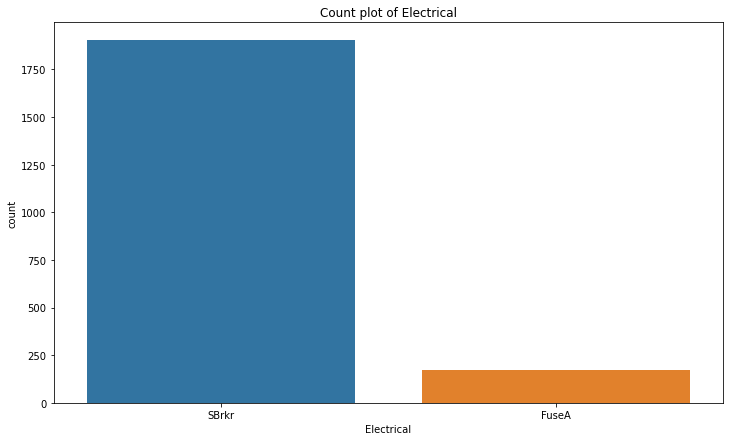

In [667]:
sns.countplot(data.Electrical)
plt.title('Count plot of Electrical')

Text(0.5, 1.0, 'Cat Plot of Electrical vs Property_Sale_Price')

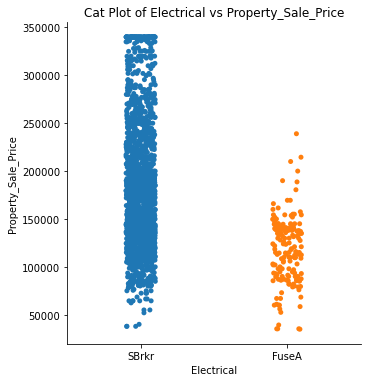

In [668]:
sns.catplot('Electrical', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of Electrical vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Electrical vs Property_Sale_Price')

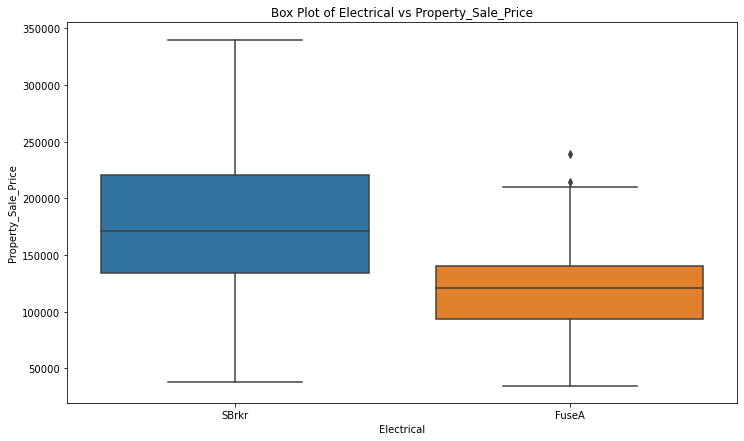

In [669]:
sns.boxplot('Electrical', 'Property_Sale_Price', data=data)
plt.title('Box Plot of Electrical vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 42) FirstFlrSF

In [670]:
data.FirstFlrSF.isnull().sum()

0

In [671]:
data.FirstFlrSF.value_counts()

864     33
1040    23
912     19
894     17
848     16
        ..
1898     1
1888     1
1872     1
1856     1
1987     1
Name: FirstFlrSF, Length: 753, dtype: int64

In [672]:
data.FirstFlrSF.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of FirstFlrSF')

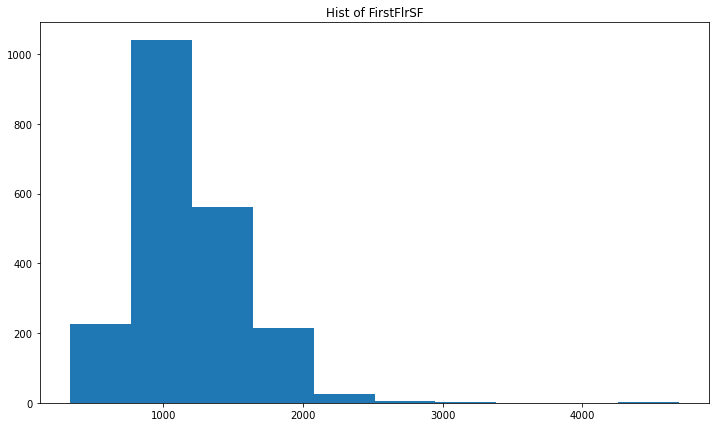

In [673]:
plt.hist(data.FirstFlrSF)
plt.title('Hist of FirstFlrSF')

Text(0.5, 1.0, 'Normality of FirstFlrSF')

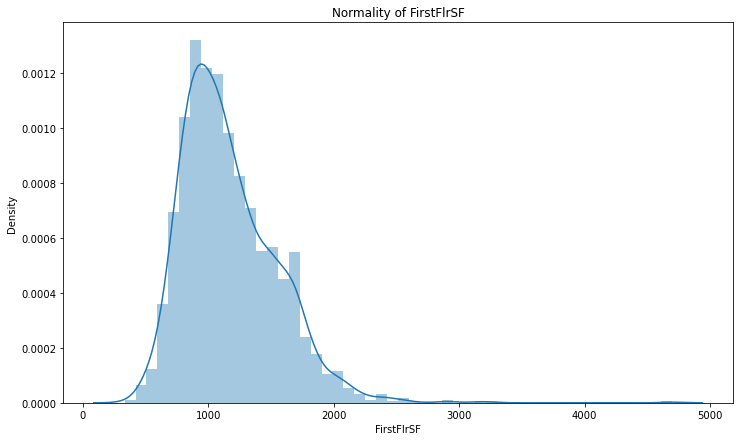

In [674]:
sns.distplot(data.FirstFlrSF)
plt.title('Normality of FirstFlrSF')

Text(0.5, 1.0, 'count plot of FirstFlrSF')

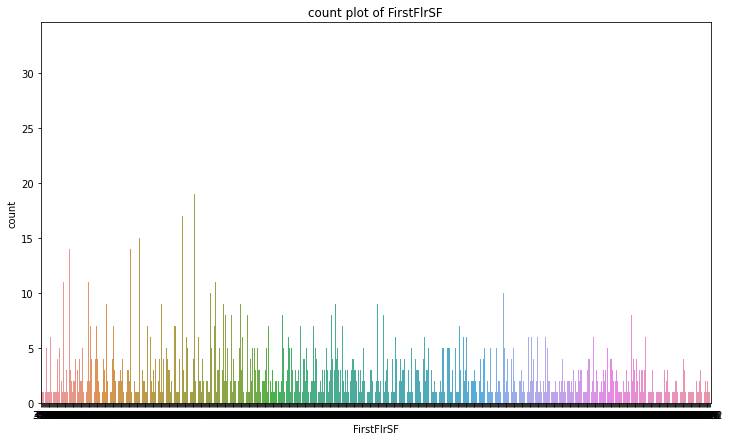

In [675]:
sns.countplot(data.FirstFlrSF)
plt.title('count plot of FirstFlrSF')

Text(0.5, 1.0, 'BoxPlot Of FirstFlrSF')

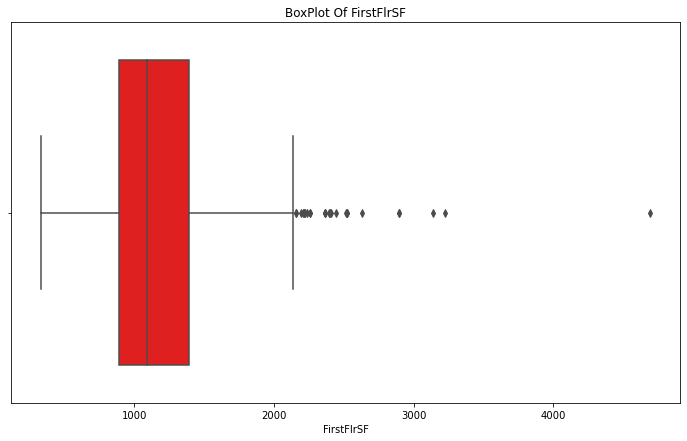

In [676]:
sns.boxplot(data['FirstFlrSF'], color = 'red')
plt.title('BoxPlot Of FirstFlrSF')

In [677]:
IQR = data['FirstFlrSF'].quantile(0.75) - data['FirstFlrSF'].quantile(0.25)
IQR

497.0

In [678]:
upper_limit = data['FirstFlrSF'].quantile(0.75) + (1.5*IQR)
upper_limit

2136.5

In [679]:
len(data['FirstFlrSF'][data['FirstFlrSF'] > upper_limit])

26

In [680]:
for i in np.arange(upper_limit, 3000, 500):
    outliers = len(data['FirstFlrSF'][data['FirstFlrSF'] > i])
    print('At the point of: ', i, 'There are ', outliers, 'outliers' )

At the point of:  2136.5 There are  26 outliers
At the point of:  2636.5 There are  5 outliers


In [681]:
data['FirstFlrSF'] = np.where(data['FirstFlrSF'] > upper_limit, upper_limit, data['FirstFlrSF'])

Text(0.5, 1.0, 'BoxPlot Of FirstFlrSF')

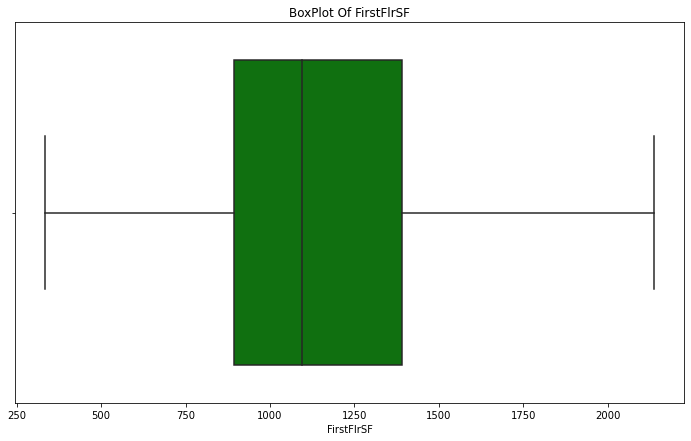

In [682]:
sns.boxplot(data['FirstFlrSF'], color = 'g')
plt.title('BoxPlot Of FirstFlrSF')

Text(0.5, 1.0, 'Normality of FirstFlrSF')

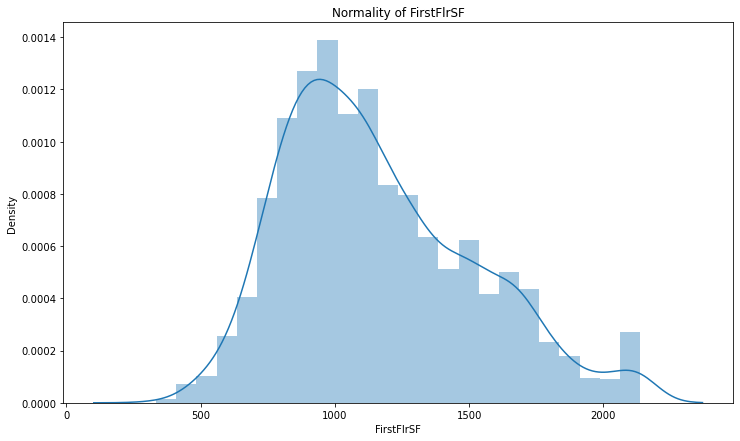

In [683]:
sns.distplot(data['FirstFlrSF'])
plt.title('Normality of FirstFlrSF')

In [684]:
np.corrcoef(data['FirstFlrSF'], data.Property_Sale_Price)

array([[1.        , 0.60991825],
       [0.60991825, 1.        ]])

<AxesSubplot:xlabel='FirstFlrSF', ylabel='Property_Sale_Price'>

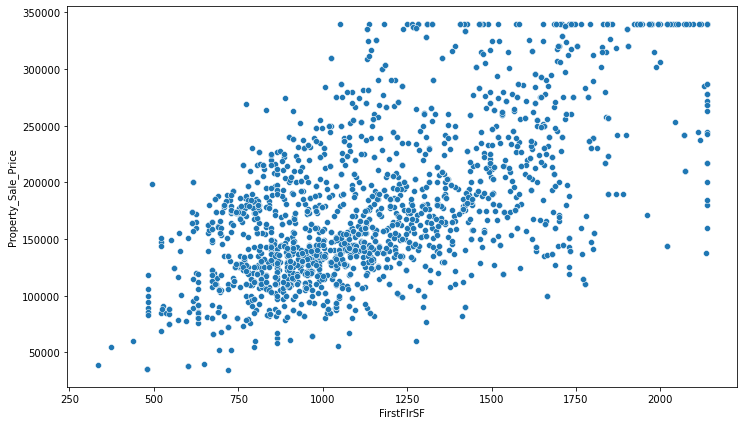

In [685]:
sns.scatterplot('FirstFlrSF', 'Property_Sale_Price', data=data)

**Good Predictor**

# 

# 

# 43) SecondFlrSF

In [686]:
data['SecondFlrSF'].isnull().sum()

0

In [687]:
data['SecondFlrSF'].describe()

count    2073.000000
mean      344.745779
std       438.844748
min         0.000000
25%         0.000000
50%         0.000000
75%       730.000000
max      2065.000000
Name: SecondFlrSF, dtype: float64

In [688]:
data['SecondFlrSF'].value_counts()

0       1195
546       13
728       11
896       10
504       10
        ... 
1230       1
1242       1
1274       1
1286       1
1611       1
Name: SecondFlrSF, Length: 417, dtype: int64

In [689]:
data['SecondFlrSF'].value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of SecondFlrSF')

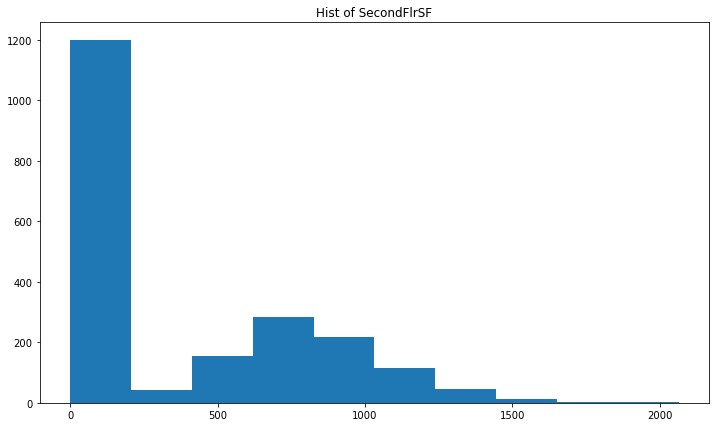

In [690]:
plt.hist(data['SecondFlrSF'])
plt.title('Hist of SecondFlrSF')

Text(0.5, 1.0, 'Mormality of SecondFlrSF')

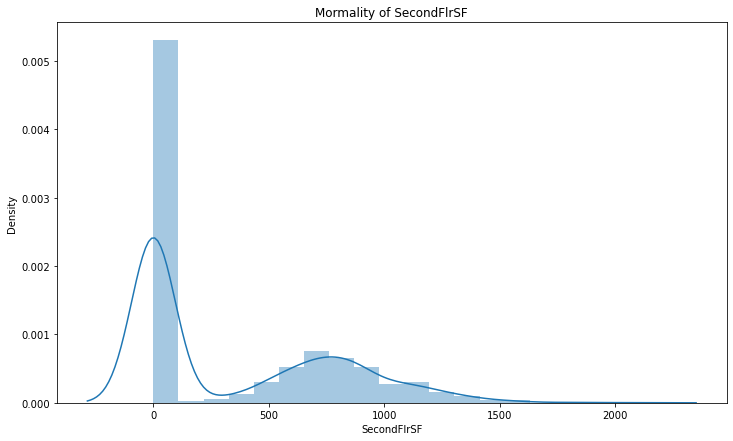

In [691]:
sns.distplot(data['SecondFlrSF'])
plt.title('Mormality of SecondFlrSF')

Text(0.5, 1.0, 'Count plot of SecondFlrSF')

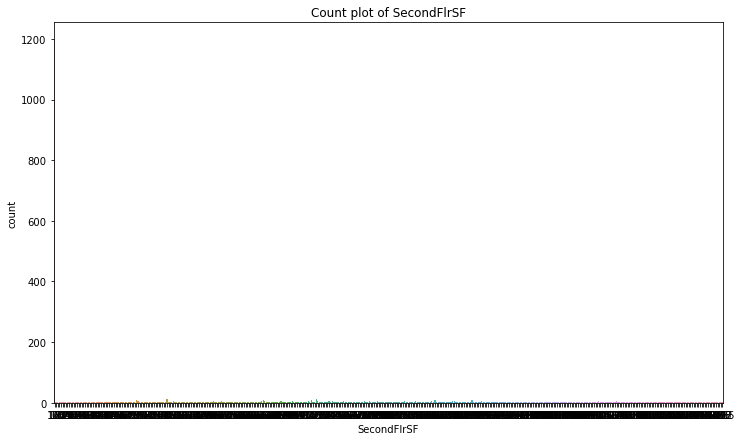

In [692]:
sns.countplot(data['SecondFlrSF'])
plt.title('Count plot of SecondFlrSF')

Text(0.5, 1.0, 'BoxPlot Of SecondFlrSF')

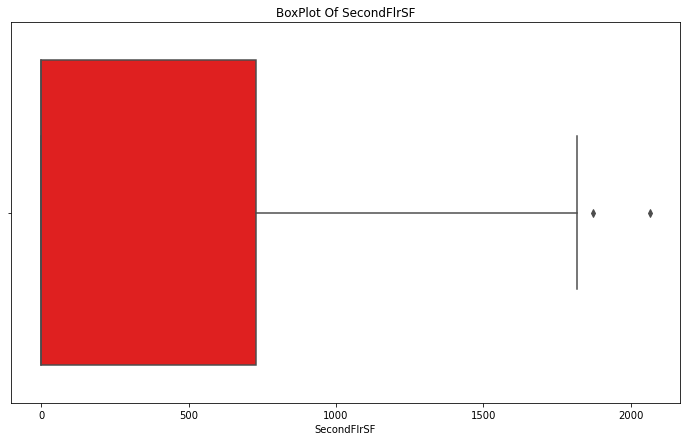

In [693]:
sns.boxplot(data['SecondFlrSF'], color = 'red')
plt.title('BoxPlot Of SecondFlrSF')

In [694]:
IQR = data['SecondFlrSF'].quantile(0.75) - data['SecondFlrSF'].quantile(0.25)
IQR

730.0

In [695]:
upper_limit = data['SecondFlrSF'].quantile(0.75) + (1.5*IQR)
upper_limit

1825.0

In [696]:
lower_limit = data['SecondFlrSF'].quantile(0.25) - (1.5*IQR)
lower_limit

-1095.0

In [697]:
len(data['SecondFlrSF'][data['SecondFlrSF'] > upper_limit])

2

In [698]:
len(data['SecondFlrSF'][data['SecondFlrSF'] < lower_limit])

0

In [699]:
for i in np.arange(upper_limit, 2500, 518):
    outliers = len(data['SecondFlrSF'][data['SecondFlrSF'] > i])
    print('At the point of: ', i, 'There are', outliers, 'outliers')

At the point of:  1825.0 There are 2 outliers
At the point of:  2343.0 There are 0 outliers


In [700]:
data['SecondFlrSF'] = np.where(data['SecondFlrSF'] > upper_limit, upper_limit, data['SecondFlrSF'])

Text(0.5, 1.0, 'BoxPlot Of SecondFlrSF')

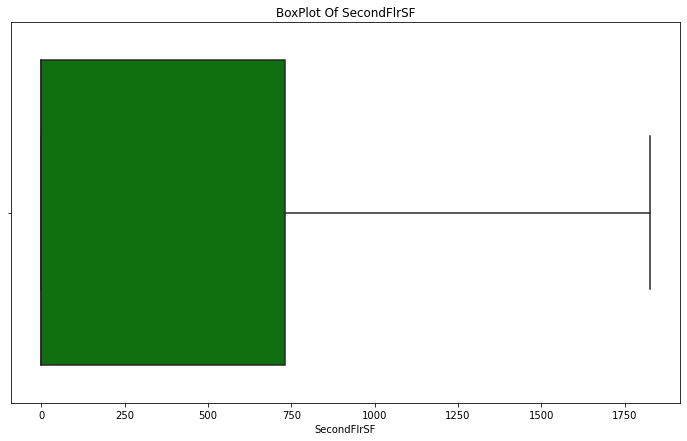

In [701]:
sns.boxplot(data['SecondFlrSF'], color = 'g')
plt.title('BoxPlot Of SecondFlrSF')

Text(0.5, 1.0, 'Mormality of SecondFlrSF')

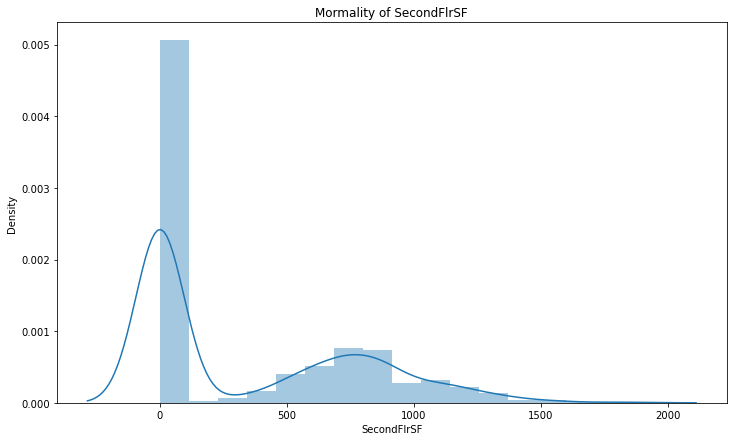

In [702]:
sns.distplot(data['SecondFlrSF'])
plt.title('Mormality of SecondFlrSF')

In [703]:
np.corrcoef(data['SecondFlrSF'], data.Property_Sale_Price)

array([[1.        , 0.33383669],
       [0.33383669, 1.        ]])

<AxesSubplot:xlabel='SecondFlrSF', ylabel='Property_Sale_Price'>

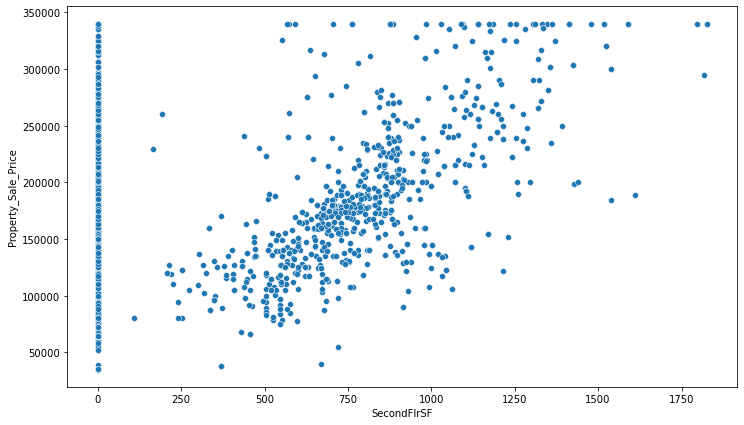

In [704]:
sns.scatterplot('SecondFlrSF', 'Property_Sale_Price', data=data)

**Not Good Predictor**

# 

# 

# 44) LowQualFinSF

In [705]:
data.LowQualFinSF.isnull().sum()

0

In [706]:
data.LowQualFinSF.describe()

count    2073.000000
mean        6.168355
std        49.553967
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       572.000000
Name: LowQualFinSF, dtype: float64

In [707]:
data.LowQualFinSF.value_counts()

0      2034
360       6
80        3
120       3
513       2
481       2
397       2
53        2
514       2
384       2
232       2
390       1
392       1
420       1
528       1
572       1
234       1
205       1
371       1
473       1
479       1
156       1
144       1
515       1
Name: LowQualFinSF, dtype: int64

In [708]:
data.LowQualFinSF.value_counts().sum()

2073

Text(0.5, 1.0, 'Hist of LowQualFinSF')

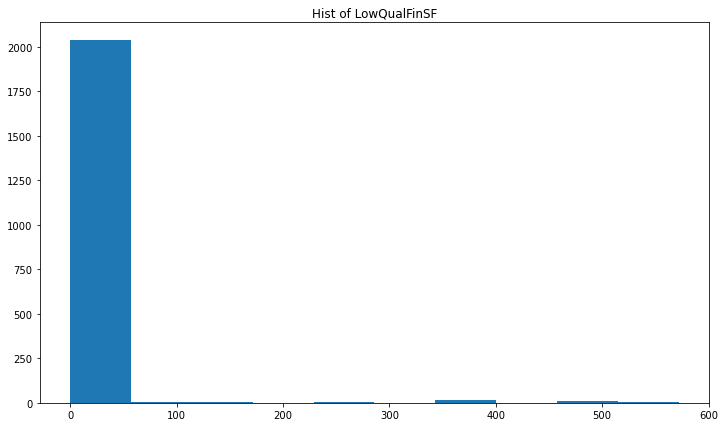

In [709]:
plt.hist(data.LowQualFinSF)
plt.title('Hist of LowQualFinSF')

Text(0.5, 1.0, 'Normality of LowQualFinSF')

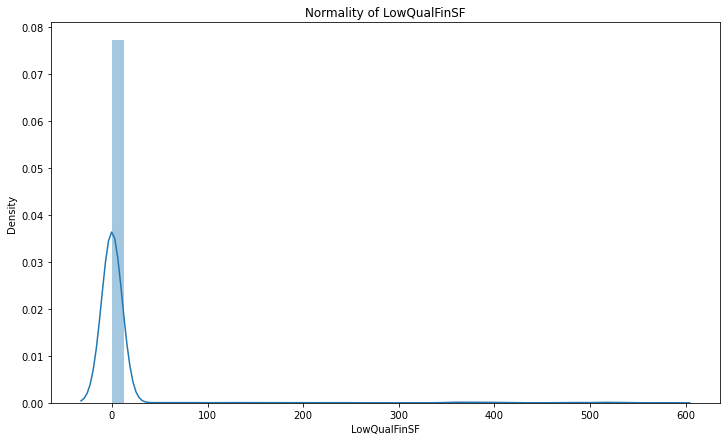

In [710]:
sns.distplot(data.LowQualFinSF)
plt.title('Normality of LowQualFinSF')

Text(0.5, 1.0, 'Count plot of LowQualFinSF')

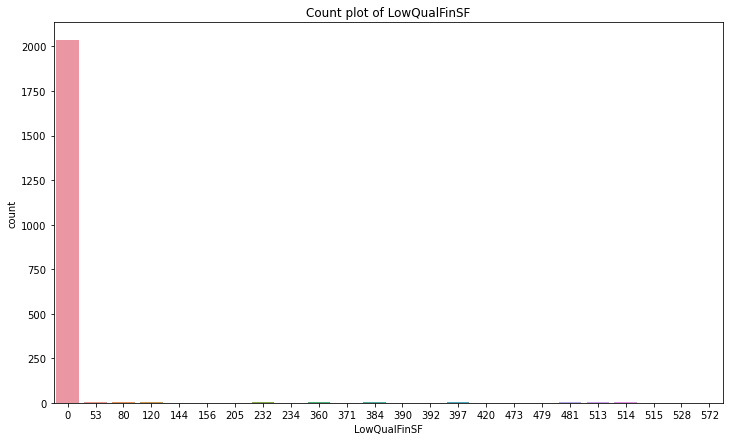

In [711]:
sns.countplot(data.LowQualFinSF)
plt.title('Count plot of LowQualFinSF')

Text(0.5, 1.0, 'BoxPlot Of LowQualFinSF')

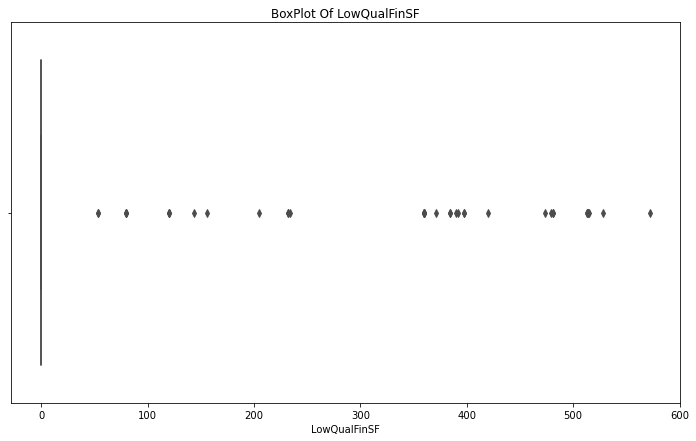

In [712]:
sns.boxplot(data.LowQualFinSF, color = 'red')
plt.title('BoxPlot Of LowQualFinSF')

In [713]:
IQR = data['LowQualFinSF'].quantile(0.75) - data['LowQualFinSF'].quantile(0.25)
IQR

0.0

In [714]:
upper_limit = data['LowQualFinSF'].quantile(0.75) + (1.5*IQR)
upper_limit

0.0

In [715]:
lower_limit = data['LowQualFinSF'].quantile(0.25) - (1.5*IQR)
lower_limit

0.0

**Not a Good Predictor**

# 

# 

# 45) GrLivArea

In [716]:
data.GrLivArea.isnull().sum()

0

In [717]:
data.GrLivArea.describe()

count    2073.000000
mean     1517.011095
std       517.236428
min       334.000000
25%      1126.000000
50%      1470.000000
75%      1792.000000
max      5642.000000
Name: GrLivArea, dtype: float64

In [718]:
data.GrLivArea.value_counts()

864     28
1040    20
894     16
848     13
1200    12
        ..
2704     1
790      1
2668     1
2654     1
2035     1
Name: GrLivArea, Length: 861, dtype: int64

In [719]:
data.GrLivArea.value_counts().sum()

2073

Text(0.5, 1.0, 'Hit of GrLivArea')

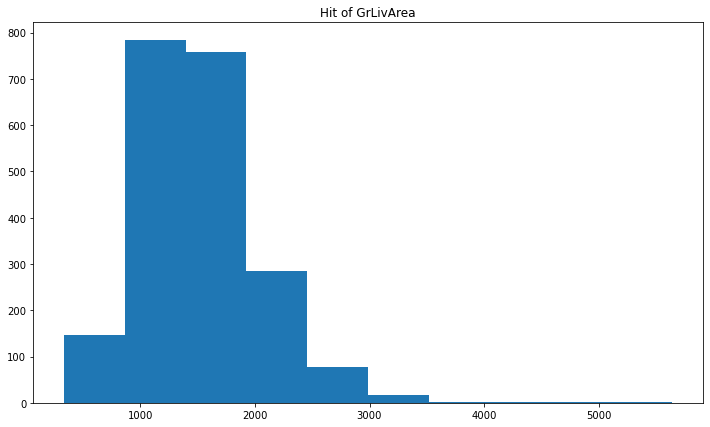

In [720]:
plt.hist(data.GrLivArea)
plt.title('Hit of GrLivArea')

Text(0.5, 1.0, 'Normality of GrLivArea')

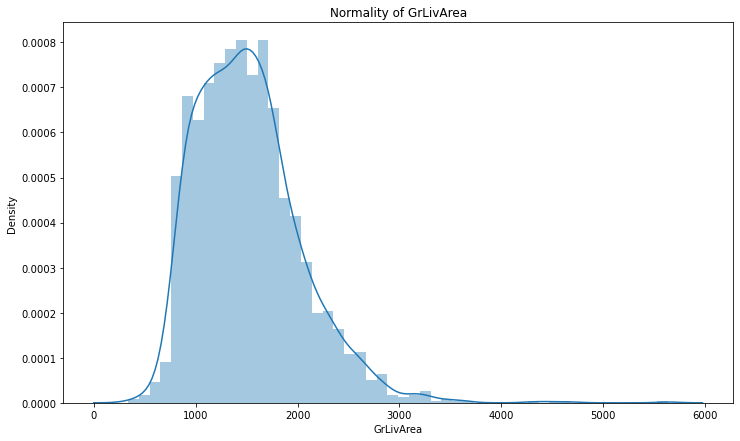

In [721]:
sns.distplot(data.GrLivArea)
plt.title('Normality of GrLivArea')

Text(0.5, 1.0, 'Count plot of GrLivArea')

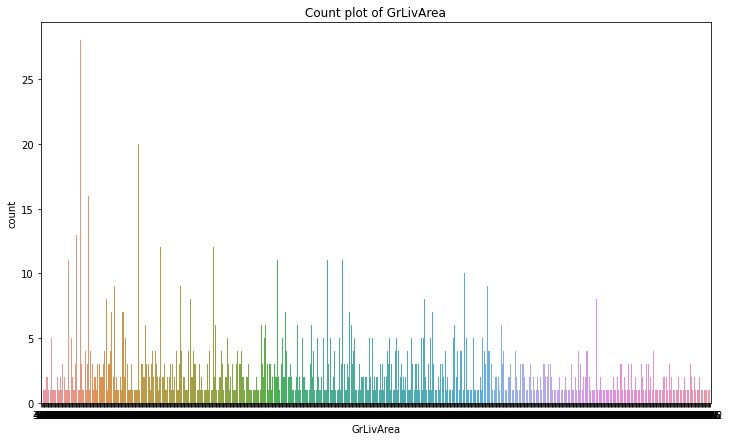

In [722]:
sns.countplot(data.GrLivArea)
plt.title('Count plot of GrLivArea')

Text(0.5, 1.0, 'BoxPlot Of GrLivArea')

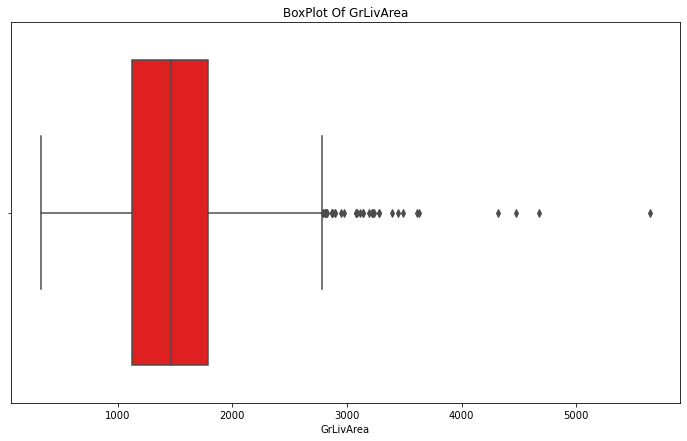

In [723]:
sns.boxplot(data.GrLivArea, color = 'red')
plt.title('BoxPlot Of GrLivArea')

In [724]:
IQR = data.GrLivArea.quantile(0.75)- data.GrLivArea.quantile(0.25)
IQR

666.0

In [725]:
upper_limit = data.GrLivArea.quantile(0.75) + (1.5*IQR)
upper_limit

2791.0

In [726]:
lower_limit = data.GrLivArea.quantile(0.25) -(1.5*IQR)
lower_limit

127.0

In [727]:
len(data.GrLivArea[data.GrLivArea > upper_limit])

39

In [728]:
len(data.GrLivArea[data.GrLivArea < lower_limit])

0

In [729]:
for i in np.arange(upper_limit, 4800, 500):
    outliers = len(data.GrLivArea[data.GrLivArea > i])
    print('At the point of: ', i, 'There are', outliers, 'outliers')

At the point of:  2791.0 There are 39 outliers
At the point of:  3291.0 There are 9 outliers
At the point of:  3791.0 There are 4 outliers
At the point of:  4291.0 There are 4 outliers
At the point of:  4791.0 There are 1 outliers


In [730]:
data.GrLivArea = np.where(data.GrLivArea > upper_limit, upper_limit, data.GrLivArea)

Text(0.5, 1.0, 'BoxPlot Of GrLivArea')

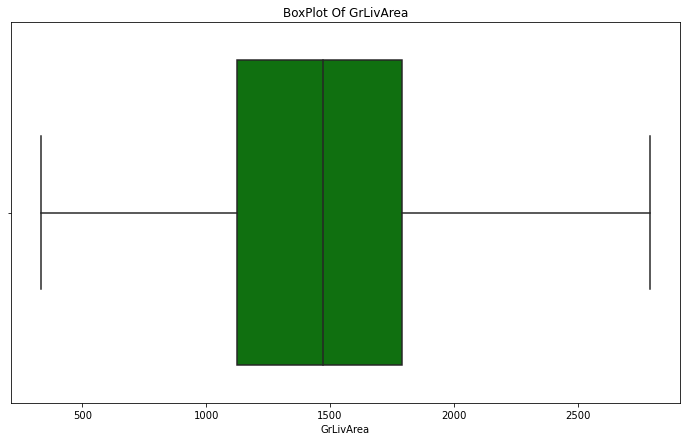

In [731]:
sns.boxplot(data.GrLivArea, color = 'g')
plt.title('BoxPlot Of GrLivArea')

Text(0.5, 1.0, 'Normality of GrLivArea')

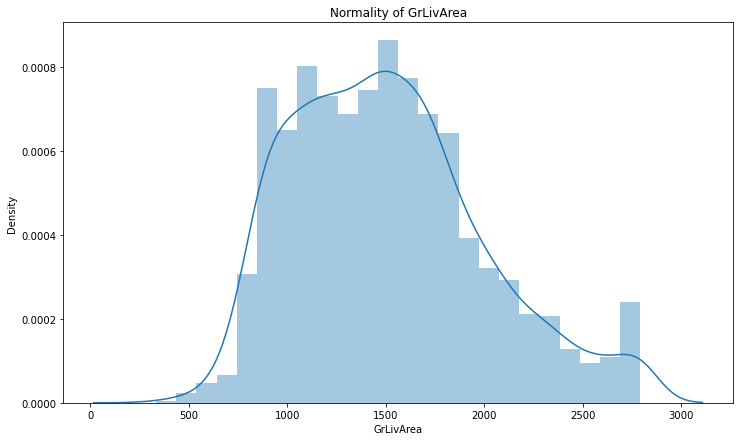

In [732]:
sns.distplot(data.GrLivArea)
plt.title('Normality of GrLivArea')

In [733]:
np.corrcoef(data.GrLivArea, data.Property_Sale_Price)

array([[1.        , 0.73086878],
       [0.73086878, 1.        ]])

Text(0.5, 1.0, 'GrLivArea vs Property_Sale_Price')

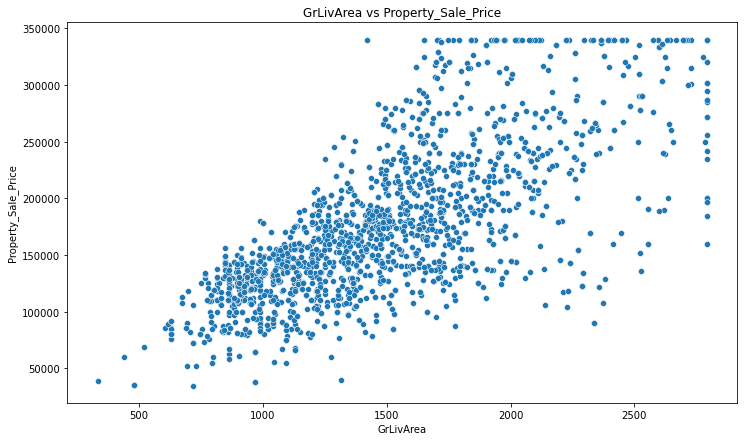

In [734]:
sns.scatterplot(data.GrLivArea, data.Property_Sale_Price)
plt.title('GrLivArea vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 46) BsmtFullBath

In [735]:
data.BsmtFullBath.isnull().sum()

0

In [736]:
data.BsmtFullBath.describe()

count    2073.000000
mean        0.429329
std         0.522605
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         3.000000
Name: BsmtFullBath, dtype: float64

In [737]:
data.BsmtFullBath.value_counts()

0    1210
1     838
2      23
3       2
Name: BsmtFullBath, dtype: int64

In [738]:
data.BsmtFullBath.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtFullBath')

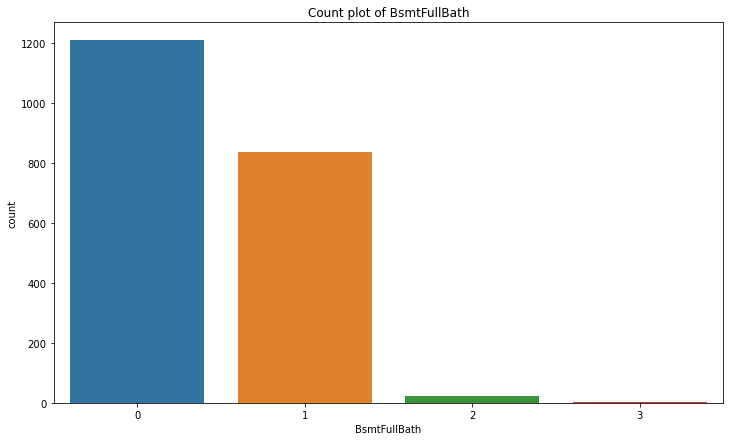

In [739]:
sns.countplot(data.BsmtFullBath)
plt.title('Count plot of BsmtFullBath')

In [740]:
data.groupby("BsmtFullBath")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtFullBath,,,,,,,,
0,1210.0,164453.647934,59900.550784,34900.0,120625.0,155417.5,193969.75,340000.0
1,838.0,195526.536993,71769.877578,35311.0,140000.0,176750.0,240000.00,340000.0
2,23.0,215271.565217,82149.958655,108959.0,147950.0,188000.0,292000.00,340000.0
3,2.0,179000.000000,0.000000,179000.0,179000.0,179000.0,179000.00,179000.0


In [741]:
mod = ols('Property_Sale_Price ~ BsmtFullBath', data=data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq           F        PR(>F)
BsmtFullBath     1.0  4.969889e+11  4.969889e+11  116.804584  1.592558e-26
Residual      2071.0  8.811845e+12  4.254875e+09         NaN           NaN


In [742]:
t_BsmtFullBath = pairwise_tukeyhsd(data.Property_Sale_Price, data.BsmtFullBath)
print(t_BsmtFullBath)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
     0      1  31072.8891  0.001   23537.9572  38607.8209   True
     0      2  50817.9173 0.0013   15527.7285  86108.1061   True
     0      3  14546.3521    0.9 -104104.9952 133197.6993  False
     1      2  19745.0282 0.4798   -15690.972  55181.0284  False
     1      3  -16526.537    0.9 -135221.3342 102168.2602  False
     2      3 -36271.5652 0.8617  -159872.039  87328.9085  False
----------------------------------------------------------------


In [743]:
data["BsmtFullBath"].replace(0, 3,inplace = True)
data["BsmtFullBath"].replace(2, 1,inplace = True)

In [744]:
data.BsmtFullBath.value_counts()

3    1212
1     861
Name: BsmtFullBath, dtype: int64

In [745]:
data.BsmtFullBath.value_counts().sum()

2073

In [746]:
df1=data[data.BsmtFullBath==3]

df2=data[data.BsmtFullBath==1]

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=-10.864081506501448, pvalue=8.882352183807123e-27)

Text(0.5, 1.0, 'Count plot of BsmtFullBath')

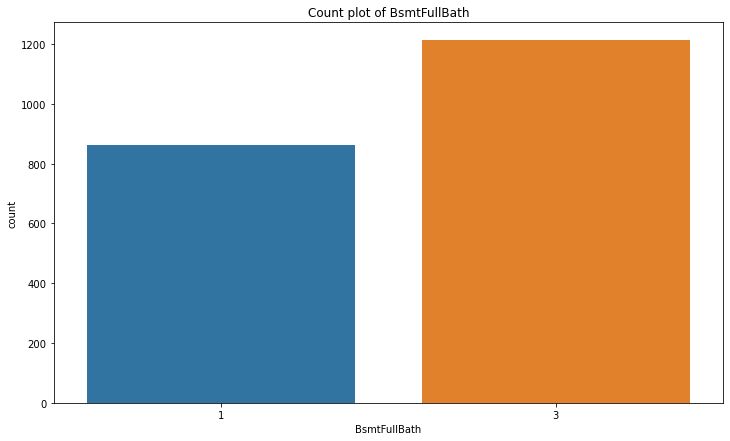

In [747]:
sns.countplot(data.BsmtFullBath)
plt.title('Count plot of BsmtFullBath')

Text(0.5, 1.0, 'Cat plot of BsmtFullBath vs Property_Sale_Price')

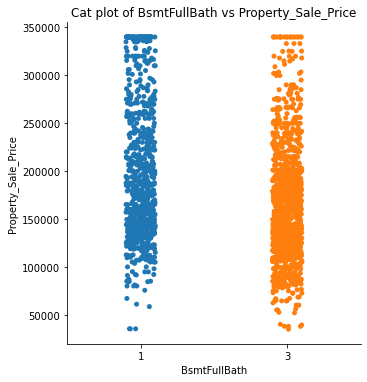

In [748]:
sns.catplot('BsmtFullBath', 'Property_Sale_Price', data=data)
plt.title('Cat plot of BsmtFullBath vs Property_Sale_Price')

Text(0.5, 1.0, 'Box plot of BsmtFullBath vs Property_Sale_Price')

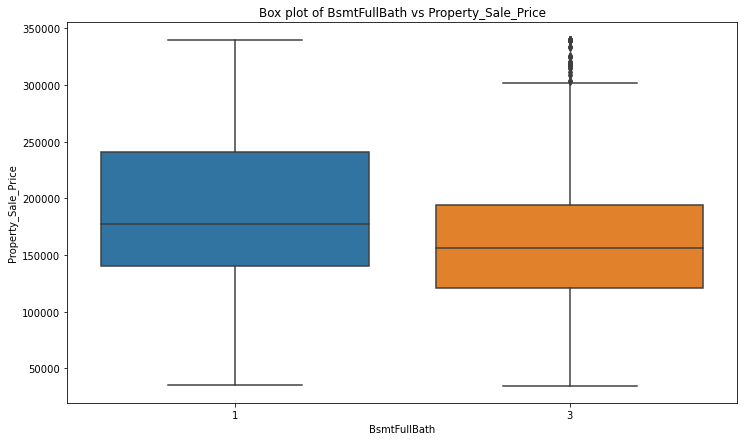

In [749]:
sns.boxplot('BsmtFullBath', 'Property_Sale_Price', data=data)
plt.title('Box plot of BsmtFullBath vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 47) BsmtHalfBath

In [750]:
data.BsmtHalfBath.isnull().sum()

0

In [751]:
data.BsmtHalfBath.describe()

count    2073.000000
mean        0.056440
std         0.237015
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: BsmtHalfBath, dtype: float64

In [752]:
data.BsmtHalfBath.value_counts()

0    1959
1     111
2       3
Name: BsmtHalfBath, dtype: int64

In [753]:
data.BsmtHalfBath.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BsmtHalfBath')

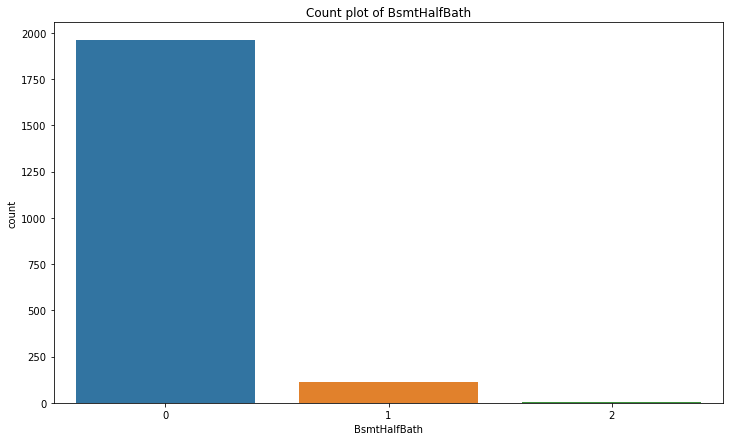

In [754]:
sns.countplot(data.BsmtHalfBath)
plt.title('Count plot of BsmtHalfBath')

In [755]:
data.groupby("BsmtHalfBath")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BsmtHalfBath,,,,,,,,
0,1959.0,178099.921899,67934.574168,34900.0,129500.0,164000.0,215000.0,340000.0
1,111.0,169391.441441,48541.601124,91500.0,138250.0,163500.0,177000.0,340000.0
2,3.0,149733.666667,38509.840305,127500.0,127500.0,127500.0,160850.5,194201.0


In [756]:
mod = ols('Property_Sale_Price ~ BsmtHalfBath', data=data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq         F    PR(>F)
BsmtHalfBath     1.0  9.974184e+09  9.974184e+09  2.221405  0.136261
Residual      2071.0  9.298860e+12  4.490034e+09       NaN       NaN


**Not Good Predictor**

# 

# 

# 48) FullBath

In [757]:
data.FullBath.isnull().sum()

0

In [758]:
data.FullBath.describe()

count    2073.000000
mean        1.571635
std         0.545963
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: FullBath, dtype: float64

In [759]:
data.FullBath.value_counts()

2    1117
1     901
3      41
0      14
Name: FullBath, dtype: int64

In [760]:
data.FullBath.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of FullBath')

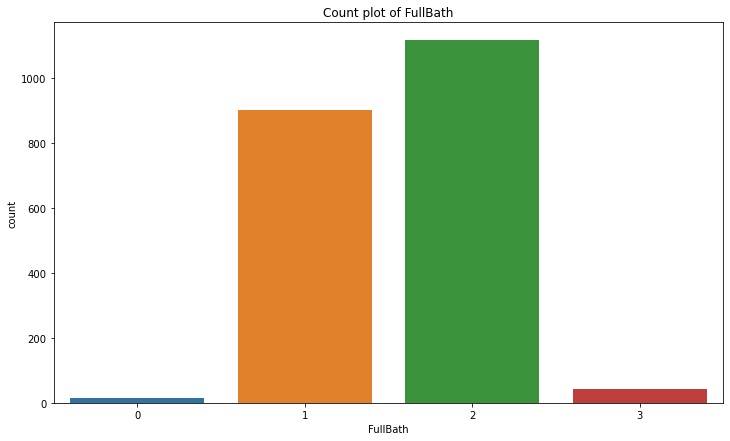

In [761]:
sns.countplot(data.FullBath)
plt.title('Count plot of FullBath')

In [762]:
data.groupby("FullBath")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
FullBath,,,,,,,,
0,14.0,180887.857143,122234.041510,35311.0,72989.75,149168.5,320000.0,340000.0
1,901.0,134287.288568,38751.157631,34900.0,112000.00,132000.0,149500.0,340000.0
2,1117.0,208497.468218,62426.317696,55000.0,168500.00,195000.0,248000.0,340000.0
3,41.0,286157.292683,65967.887097,170000.0,225000.00,325000.0,340000.0,340000.0


In [763]:
mod = ols('Property_Sale_Price ~ FullBath', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq            F         PR(>F)
FullBath     1.0  3.046506e+12  3.046506e+12  1007.503049  1.639697e-180
Residual  2071.0  6.262328e+12  3.023818e+09          NaN            NaN


In [764]:
t_FullBath = pairwise_tukeyhsd(data.Property_Sale_Price, data.FullBath)
print(t_FullBath)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
     0      1 -46600.5686 0.0077 -84104.9235  -9096.2136   True
     0      2  27609.6111 0.2303  -9839.2198   65058.442  False
     0      3 105269.4355  0.001  62164.9005 148373.9706   True
     1      2  74210.1797  0.001  67974.7101  80445.6492   True
     1      3 151870.0041  0.001 129633.3882   174106.62   True
     2      3  77659.8245  0.001   55516.984  99802.6649   True
---------------------------------------------------------------


In [765]:
data["FullBath"].replace(0, 2,inplace = True)

In [766]:
data.FullBath.value_counts()

2    1131
1     901
3      41
Name: FullBath, dtype: int64

In [767]:
data.FullBath.value_counts().sum()

2073

In [768]:
mod = ols('Property_Sale_Price ~ FullBath', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq            F         PR(>F)
FullBath     1.0  3.228811e+12  3.228811e+12  1099.809517  8.243835e-194
Residual  2071.0  6.080023e+12  2.935791e+09          NaN            NaN


In [769]:
t_FullBath = pairwise_tukeyhsd(data.Property_Sale_Price, data.FullBath)
print(t_FullBath)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj    lower       upper    reject
--------------------------------------------------------------
     1      2  73868.4161 0.001  68192.5205  79544.3117   True
     1      3 151870.0041 0.001 131572.7461 172167.2622   True
     2      3   78001.588 0.001  57794.3563  98208.8197   True
--------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of FullBath')

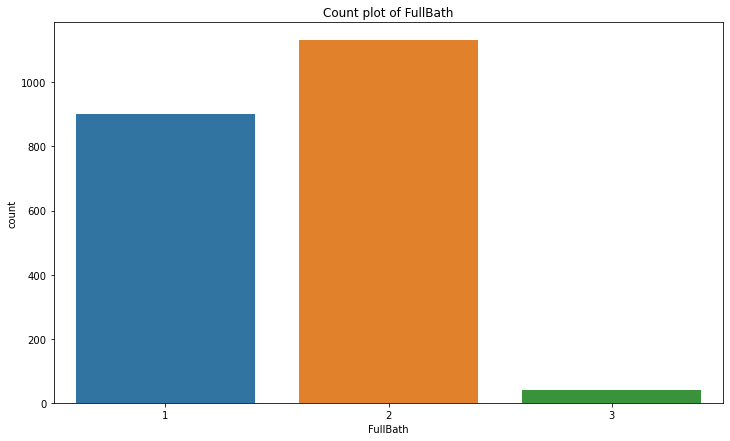

In [770]:
sns.countplot(data.FullBath)
plt.title('Count plot of FullBath')

Text(0.5, 1.0, 'Cat Plot of FullBath vs Property_Sale_Price')

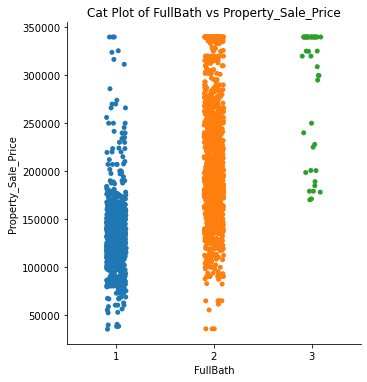

In [771]:
sns.catplot('FullBath', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of FullBath vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of FullBath vs Property_Sale_Price')

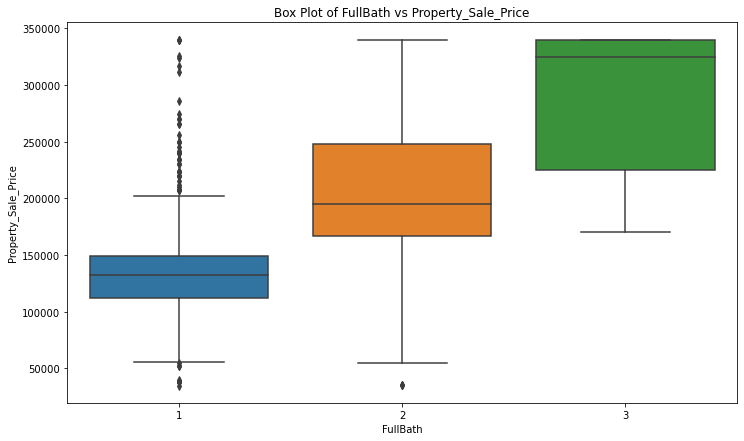

In [772]:
sns.boxplot('FullBath', 'Property_Sale_Price', data=data)
plt.title('Box Plot of FullBath vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 49) HalfBath

In [773]:
data.HalfBath.isnull().sum()

0

In [774]:
data.HalfBath.describe()

count    2073.000000
mean        0.378678
std         0.499873
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: HalfBath, dtype: float64

In [775]:
data.HalfBath.value_counts()

0    1303
1     755
2      15
Name: HalfBath, dtype: int64

In [776]:
data.HalfBath.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of HalfBath')

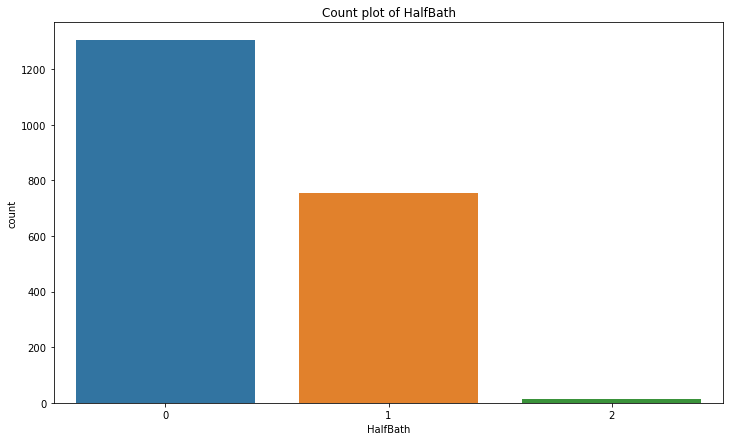

In [777]:
sns.countplot(data.HalfBath)
plt.title('Count plot of HalfBath')

In [778]:
data.groupby("HalfBath")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
HalfBath,,,,,,,,
0,1303.0,160961.395242,61982.511951,34900.0,119200.0,143000.0,189000.0,340000.0
1,755.0,206681.527152,66063.562011,61000.0,159250.0,190000.0,246750.0,340000.0
2,15.0,158143.133333,28133.306194,108959.0,137500.0,145900.0,182500.0,201800.0


In [779]:
mod = ols('Property_Sale_Price ~ HalfBath', data=data).fit()
print(sm.stats.anova_lm(mod))

              df        sum_sq       mean_sq           F        PR(>F)
HalfBath     1.0  8.827791e+11  8.827791e+11  216.974087  8.835252e-47
Residual  2071.0  8.426055e+12  4.068592e+09         NaN           NaN


In [780]:
t_HalfBath = pairwise_tukeyhsd(data.Property_Sale_Price, data.HalfBath)
print(t_HalfBath)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower      upper    reject
--------------------------------------------------------------
     0      1  45720.1319  0.001  38925.7075 52514.5563   True
     0      2  -2818.2619    0.9 -41394.1147 35757.5909  False
     1      2 -48538.3938 0.0093  -87273.248 -9803.5397   True
--------------------------------------------------------------


In [781]:
data["HalfBath"].replace(2, 0,inplace = True)

In [782]:
data.HalfBath.value_counts()

0    1318
1     755
Name: HalfBath, dtype: int64

In [783]:
data.HalfBath.value_counts().sum()

2073

In [784]:
df1=data[data.HalfBath==0]

df2=data[data.HalfBath==1]

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=-15.83031334361822, pvalue=2.276986553597032e-53)

Text(0.5, 1.0, 'Count plot of HalfBath')

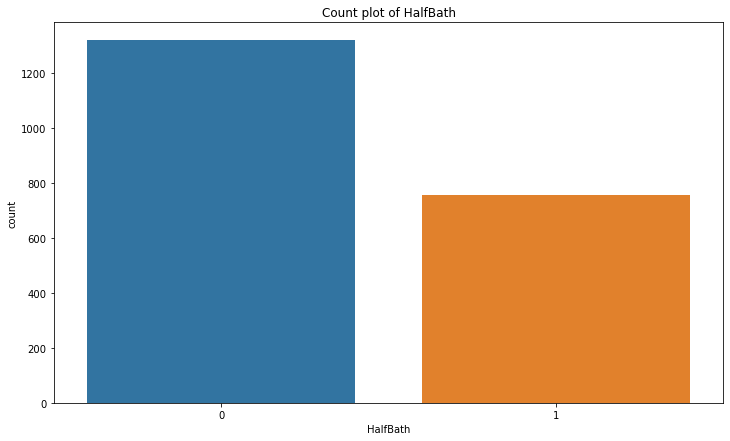

In [785]:
sns.countplot(data.HalfBath)
plt.title('Count plot of HalfBath')

Text(0.5, 1.0, 'Cat Plot of HalfBath vs Property_Sale_Price')

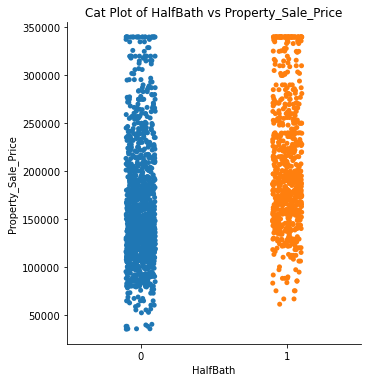

In [786]:
sns.catplot('HalfBath', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of HalfBath vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of HalfBath vs Property_Sale_Price')

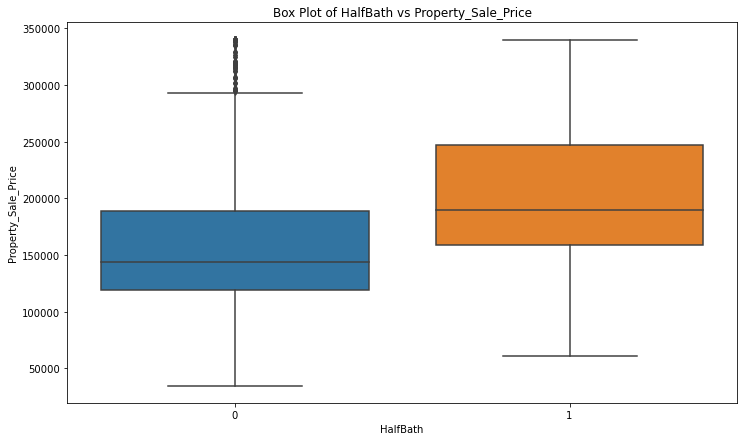

In [787]:
sns.boxplot('HalfBath', 'Property_Sale_Price', data=data)
plt.title('Box Plot of HalfBath vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 50) BedroomAbvGr

In [788]:
data.BedroomAbvGr.isnull().sum()

0

In [789]:
data.BedroomAbvGr.describe()

count    2073.000000
mean        2.874096
std         0.816144
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: BedroomAbvGr, dtype: float64

In [790]:
data.BedroomAbvGr.value_counts()

3    1131
2     503
4     319
1      71
5      30
0       9
6       9
8       1
Name: BedroomAbvGr, dtype: int64

In [791]:
data.BedroomAbvGr.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of BedroomAbvGr')

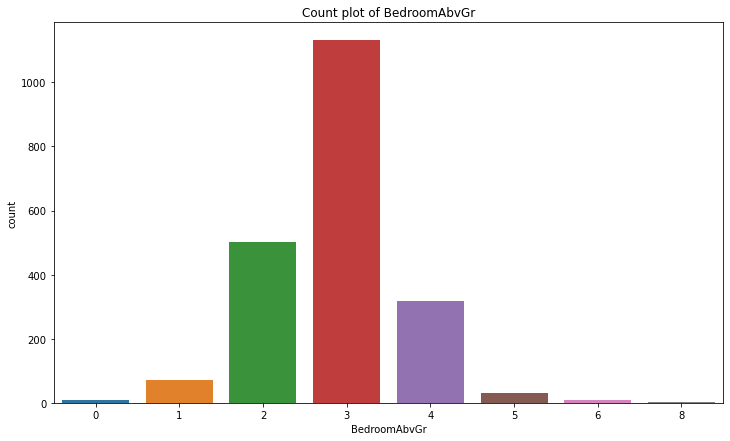

In [792]:
sns.countplot(data.BedroomAbvGr)
plt.title('Count plot of BedroomAbvGr')

In [793]:
data.groupby("BedroomAbvGr")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
BedroomAbvGr,,,,,,,,
0,9.0,255995.444444,97227.860908,108959.0,145000.0,286000.0,340000.0,340000.0
1,71.0,162525.887324,80611.069754,35311.0,89000.0,149300.0,199900.0,340000.0
2,503.0,154924.240557,65888.675106,34900.0,110000.0,138000.0,185000.0,340000.0
3,1131.0,180181.955791,59513.952844,40000.0,136500.0,172400.0,214000.0,340000.0
4,319.0,205681.056426,76222.288380,64500.0,139800.0,192140.0,266239.5,340000.0
5,30.0,182960.000000,70458.922246,81000.0,135250.0,160750.0,233625.0,320000.0
6,9.0,143595.444444,22913.930371,119000.0,135900.0,142600.0,142953.0,200000.0
8,1.0,200000.000000,NaN,200000.0,200000.0,200000.0,200000.0,200000.0


In [794]:
mod = ols('Property_Sale_Price ~ BedroomAbvGr', data=data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F        PR(>F)
BedroomAbvGr     1.0  2.869680e+11  2.869680e+11  65.874481  8.152662e-16
Residual      2071.0  9.021866e+12  4.356285e+09        NaN           NaN


In [795]:
t_BedroomAbvGr = pairwise_tukeyhsd(data.Property_Sale_Price, data.BedroomAbvGr)
print(t_BedroomAbvGr)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
     0      1  -93469.5571 0.0013 -163181.0252  -23758.089   True
     0      2 -101071.2039  0.001 -167329.3679 -34813.0399   True
     0      3  -75813.4887 0.0116 -141747.5052  -9879.4721   True
     0      4   -50314.388 0.2983 -116907.6042  16278.8281  False
     0      5  -73035.4444 0.0621 -147914.4531   1843.5642  False
     0      6    -112400.0  0.006 -205275.9796 -19524.0204   True
     0      8  -55995.4444    0.9 -263672.4483 151681.5594  False
     1      2   -7601.6468    0.9  -32579.3467  17376.0531  False
     1      3   17656.0685 0.3388   -6448.6144  41760.7513  False
     1      4   43155.1691  0.001   17301.7818  69008.5564   True
     1      5   20434.1127 0.8153  -22468.1848  63336.4101  False
     1      6  -18930.4429    0.9   -88641.911  50781.0252  False
     1    

In [796]:
data["BedroomAbvGr"].replace(8, 0,inplace = True)
data["BedroomAbvGr"].replace(1, 2,inplace = True)
data["BedroomAbvGr"].replace(6, 2,inplace = True)
data["BedroomAbvGr"].replace(5, 3,inplace = True)
data["BedroomAbvGr"].replace(0, 4,inplace = True)

In [797]:
data.BedroomAbvGr.value_counts()

3    1161
2     583
4     329
Name: BedroomAbvGr, dtype: int64

In [798]:
data.BedroomAbvGr.value_counts().sum()

2073

In [799]:
mod = ols('Property_Sale_Price ~ BedroomAbvGr', data=data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq           F        PR(>F)
BedroomAbvGr     1.0  5.729822e+11  5.729822e+11  135.836339  1.890442e-30
Residual      2071.0  8.735852e+12  4.218181e+09         NaN           NaN


In [800]:
t_BedroomAbvGr = pairwise_tukeyhsd(data.Property_Sale_Price, data.BedroomAbvGr)
print(t_BedroomAbvGr)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj   lower      upper    reject
-----------------------------------------------------------
     2      3 24578.6284 0.001 16844.7854 32312.4713   True
     2      4 51365.0587 0.001 40859.0517 61871.0658   True
     3      4 26786.4303 0.001 17270.4931 36302.3676   True
-----------------------------------------------------------


Text(0.5, 1.0, 'Count plot of BedroomAbvGr')

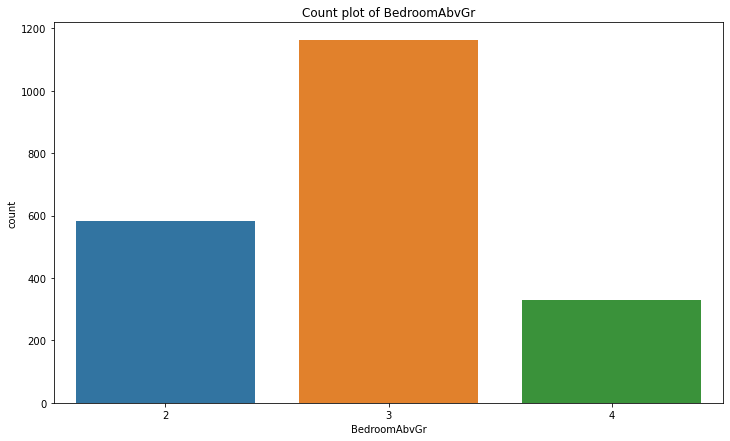

In [801]:
sns.countplot(data.BedroomAbvGr)
plt.title('Count plot of BedroomAbvGr')

Text(0.5, 1.0, 'Cat Plot of BedroomAbvGr vs Property_Sale_Price')

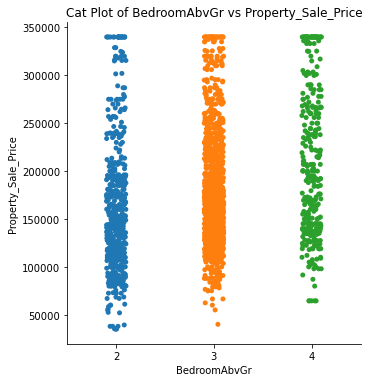

In [802]:
sns.catplot('BedroomAbvGr', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of BedroomAbvGr vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of BedroomAbvGr vs Property_Sale_Price')

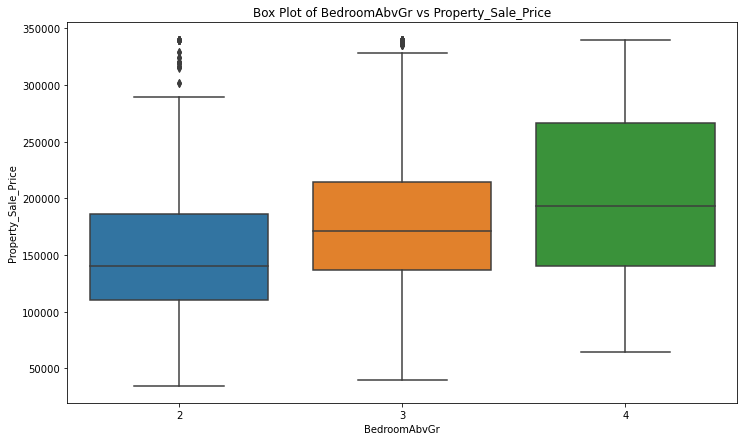

In [803]:
sns.boxplot('BedroomAbvGr', 'Property_Sale_Price', data=data)
plt.title('Box Plot of BedroomAbvGr vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 51) KitchenAbvGr

In [804]:
data.KitchenAbvGr.isnull().sum()

0

In [805]:
data.KitchenAbvGr.describe()

count    2073.000000
mean        1.052581
std         0.237901
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: KitchenAbvGr, dtype: float64

In [806]:
data.KitchenAbvGr.value_counts()

1    1965
2     101
3       5
0       2
Name: KitchenAbvGr, dtype: int64

In [807]:
data.KitchenAbvGr.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of KitchenAbvGr')

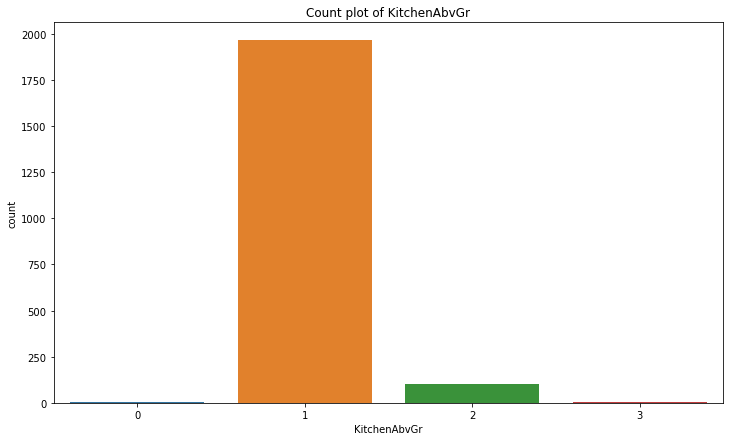

In [808]:
sns.countplot(data.KitchenAbvGr)
plt.title('Count plot of KitchenAbvGr')

In [809]:
data.groupby("KitchenAbvGr")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
KitchenAbvGr,,,,,,,,
0,2.0,127500.000000,0.000000,127500.0,127500.0,127500.0,127500.0,127500.0
1,1965.0,180190.105344,67589.787291,34900.0,132000.0,168000.0,217000.0,340000.0
2,101.0,131315.257426,28309.983888,55000.0,112000.0,136000.0,145000.0,206300.0
3,5.0,111600.000000,3130.495168,106000.0,113000.0,113000.0,113000.0,113000.0


In [810]:
mod = ols('Property_Sale_Price ~ KitchenAbvGr', data=data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F        PR(>F)
KitchenAbvGr     1.0  2.335843e+11  2.335843e+11  53.304667  4.052531e-13
Residual      2071.0  9.075250e+12  4.382062e+09        NaN           NaN


In [811]:
t_KitchenAbvGr = pairwise_tukeyhsd(data.Property_Sale_Price, data.KitchenAbvGr)
print(t_KitchenAbvGr)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
     0      1  52690.1053 0.6532  -67628.4171 173008.6278  False
     0      2   3815.2574    0.9 -117626.9109 125257.4258  False
     0      3    -15900.0    0.9 -158190.4017 126390.4017  False
     1      2 -48874.8479  0.001  -66226.8575 -31522.8383   True
     1      3 -68590.1053 0.0947  -144744.228   7564.0173  False
     2      3 -19715.2574    0.9  -97632.5456  58202.0307  False
----------------------------------------------------------------


In [812]:
data["KitchenAbvGr"].replace(0, 2,inplace = True)
data["KitchenAbvGr"].replace(3, 2,inplace = True)

In [813]:
data.KitchenAbvGr.value_counts()

1    1965
2     108
Name: KitchenAbvGr, dtype: int64

In [814]:
data.KitchenAbvGr.value_counts().sum()

2073

In [815]:
df1=data[data.KitchenAbvGr==1]

df2=data[data.KitchenAbvGr==2]

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=7.6294265770566945, pvalue=3.571786832048337e-14)

Text(0.5, 1.0, 'Count plot of KitchenAbvGr')

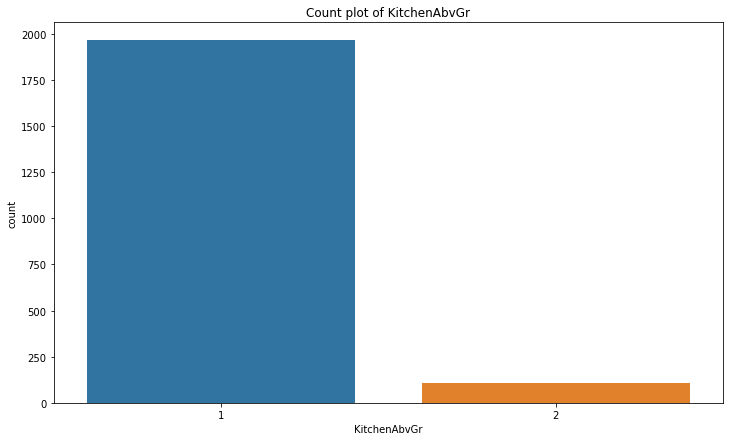

In [816]:
sns.countplot(data.KitchenAbvGr)
plt.title('Count plot of KitchenAbvGr')

Text(0.5, 1.0, 'Cat Plot of KitchenAbvGr vs Property_Sale_Price')

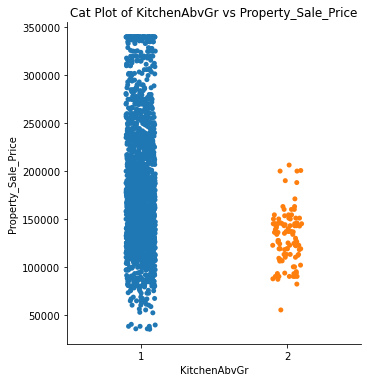

In [817]:
sns.catplot('KitchenAbvGr', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of KitchenAbvGr vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of KitchenAbvGr vs Property_Sale_Price')

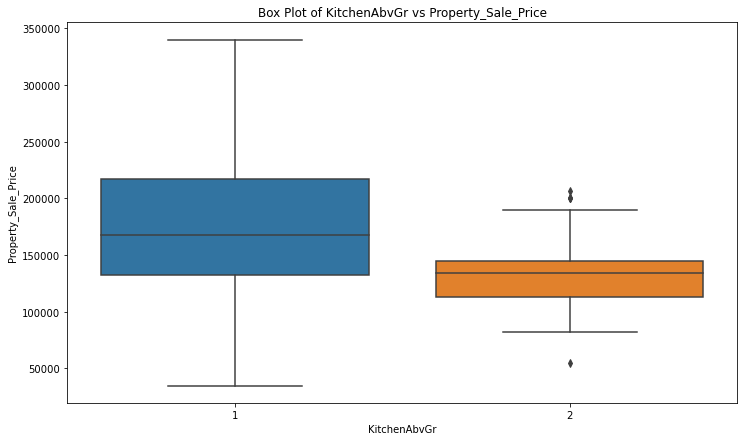

In [818]:
sns.boxplot('KitchenAbvGr', 'Property_Sale_Price', data=data)
plt.title('Box Plot of KitchenAbvGr vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 52) KitchenQual

In [819]:
data.KitchenQual.isnull().sum()

0

In [820]:
data.KitchenQual.value_counts()

TA    1043
Gd     838
Ex     144
Fa      48
Name: KitchenQual, dtype: int64

In [821]:
data.KitchenQual.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of KitchenQual')

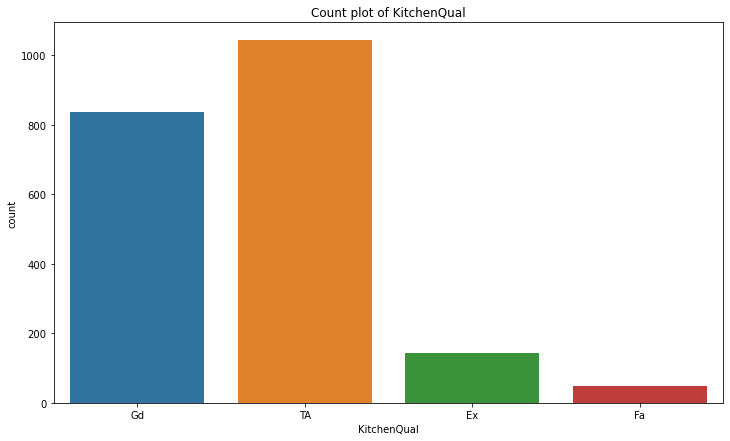

In [822]:
sns.countplot(data.KitchenQual)
plt.title('Count plot of KitchenQual')

In [823]:
data.groupby("KitchenQual")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
KitchenQual,,,,,,,,
Ex,144.0,287234.361111,64792.366051,86000.0,261125.0,315500.0,340000.0,340000.0
Fa,48.0,104995.687500,33305.855391,39300.0,82000.0,111750.0,129000.0,200000.0
Gd,838.0,210808.052506,56926.121329,79000.0,173125.0,201000.0,245262.5,340000.0
TA,1043.0,139109.021093,37824.206016,34900.0,115000.0,136500.0,160000.0,340000.0


In [824]:
mod = ols('Property_Sale_Price ~ KitchenQual', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq           F         PR(>F)
KitchenQual     3.0  4.453250e+12  1.484417e+12  632.520772  9.879853e-292
Residual     2069.0  4.855584e+12  2.346827e+09         NaN            NaN


In [825]:
t_KitchenQual = pairwise_tukeyhsd(data.Property_Sale_Price, data.KitchenQual)
print(t_KitchenQual)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj    lower        upper     reject
-----------------------------------------------------------------
    Ex     Fa -182238.6736 0.001 -202997.9522  -161479.395   True
    Ex     Gd  -76426.3086 0.001   -87662.419  -65190.1982   True
    Ex     TA   -148125.34 0.001 -159198.3443 -137052.3358   True
    Fa     Gd   105812.365 0.001   87326.5867  124298.1433   True
    Fa     TA   34113.3336 0.001    15726.239   52500.4282   True
    Gd     TA  -71699.0314 0.001   -77477.247  -65920.8158   True
-----------------------------------------------------------------


Text(0.5, 1.0, 'Cat Plot of KitchenQual vs Property_Sale_Price')

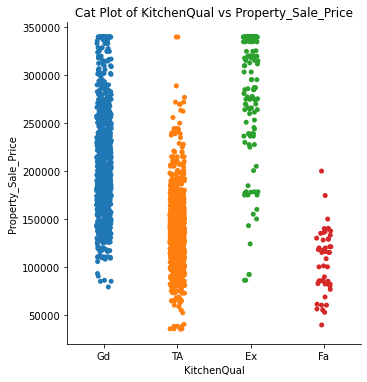

In [826]:
sns.catplot('KitchenQual', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of KitchenQual vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of KitchenQual vs Property_Sale_Price')

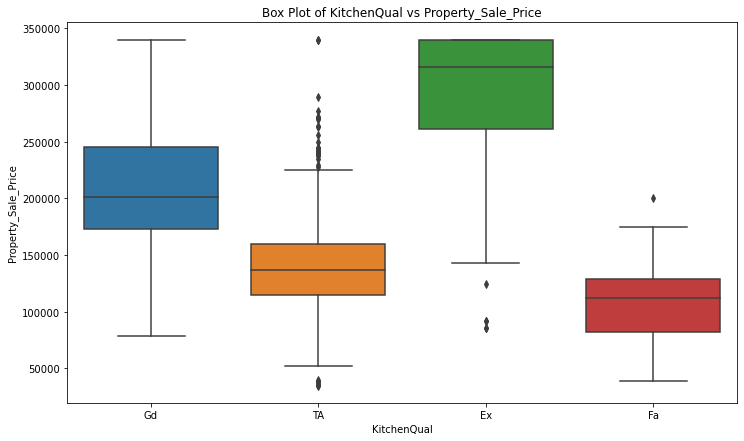

In [827]:
sns.boxplot('KitchenQual', 'Property_Sale_Price', data=data)
plt.title('Box Plot of KitchenQual vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 53) TotRmsAbvGrd

In [828]:
data.TotRmsAbvGrd.isnull().sum()

0

In [829]:
data.TotRmsAbvGrd.describe()

count    2073.000000
mean        6.540280
std         1.629673
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        14.000000
Name: TotRmsAbvGrd, dtype: float64

In [830]:
data.TotRmsAbvGrd.value_counts()

6     580
7     458
5     396
8     269
4     127
9     106
10     65
11     30
3      22
12     18
2       1
14      1
Name: TotRmsAbvGrd, dtype: int64

In [831]:
data.TotRmsAbvGrd.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram of TotRmsAbvGrd')

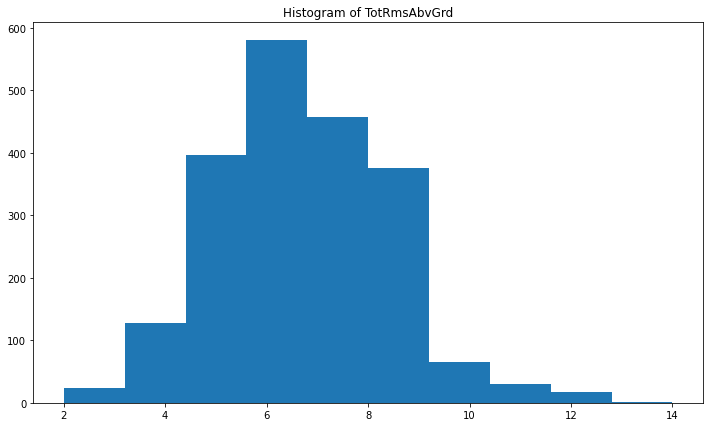

In [832]:
plt.hist(data.TotRmsAbvGrd)
plt.title('Histogram of TotRmsAbvGrd')

Text(0.5, 1.0, 'Normality of TotRmsAbvGrd')

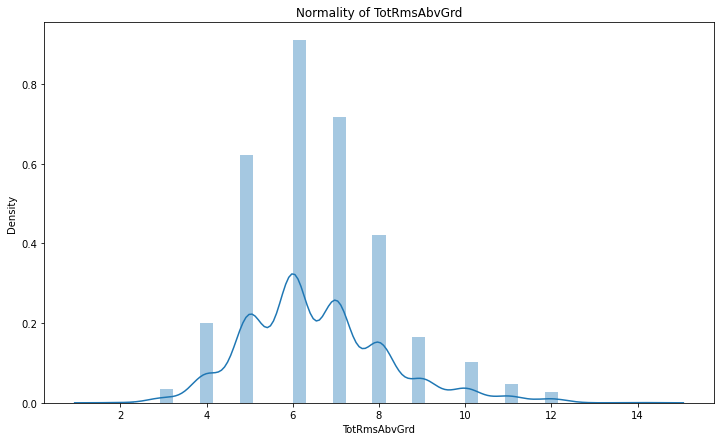

In [833]:
sns.distplot(data.TotRmsAbvGrd)
plt.title('Normality of TotRmsAbvGrd')

Text(0.5, 1.0, 'Count plot of TotRmsAbvGrd')

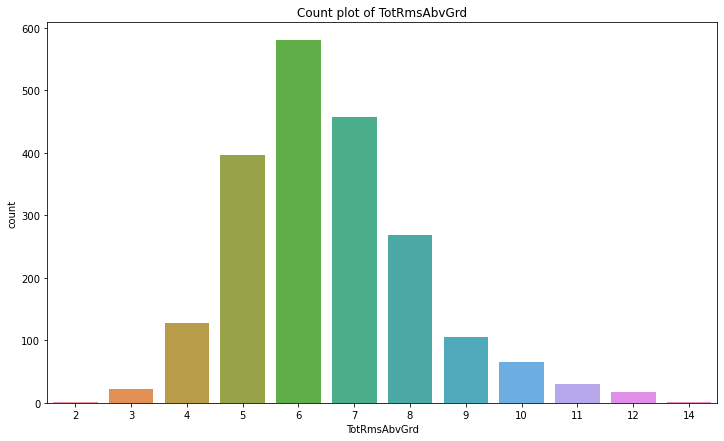

In [834]:
sns.countplot(data.TotRmsAbvGrd)
plt.title('Count plot of TotRmsAbvGrd')

Text(0.5, 1.0, 'BoxPlot Of TotRmsAbvGrd')

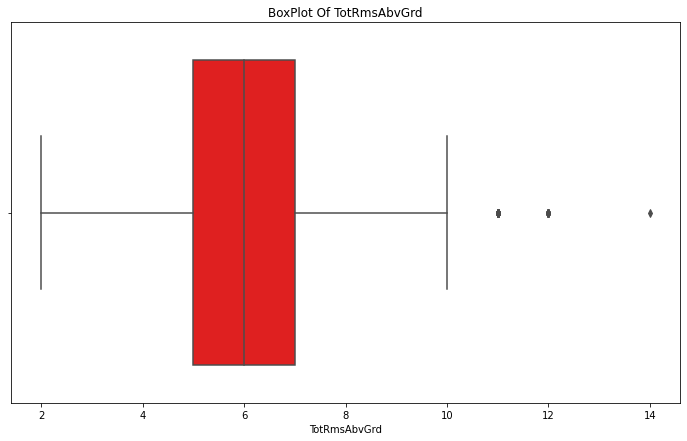

In [835]:
sns.boxplot(data.TotRmsAbvGrd, color = 'red')
plt.title('BoxPlot Of TotRmsAbvGrd')

In [836]:
IQR = data.TotRmsAbvGrd.quantile(.75) - data.TotRmsAbvGrd.quantile(.25)
IQR

2.0

In [837]:
upper_limit = data.TotRmsAbvGrd.quantile(.75) + (1.5*IQR)
upper_limit

10.0

In [838]:
lower_limit = data.TotRmsAbvGrd.quantile(.25) - (1.5*IQR)
lower_limit

2.0

In [839]:
len(data.TotRmsAbvGrd[data.TotRmsAbvGrd  > upper_limit])

49

In [840]:
len(data.TotRmsAbvGrd[data.TotRmsAbvGrd  < lower_limit])

0

In [841]:
for i in np.arange(upper_limit, 12, 1):
  outliers = len(data.TotRmsAbvGrd[data.TotRmsAbvGrd  > i])
  print('At the point of:', i, 'There are ', outliers)

At the point of: 10.0 There are  49
At the point of: 11.0 There are  19


In [842]:
data.TotRmsAbvGrd = np.where(data.TotRmsAbvGrd > upper_limit, upper_limit, data.TotRmsAbvGrd)

Text(0.5, 1.0, 'BoxPlot Of TotRmsAbvGrd')

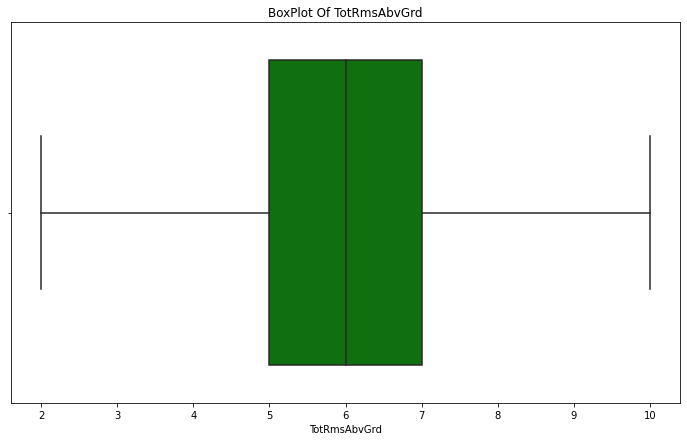

In [843]:
sns.boxplot(data.TotRmsAbvGrd, color = 'g')
plt.title('BoxPlot Of TotRmsAbvGrd')

In [844]:
np.corrcoef(data.TotRmsAbvGrd, data.Property_Sale_Price)

array([[1.       , 0.5244364],
       [0.5244364, 1.       ]])

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Property_Sale_Price'>

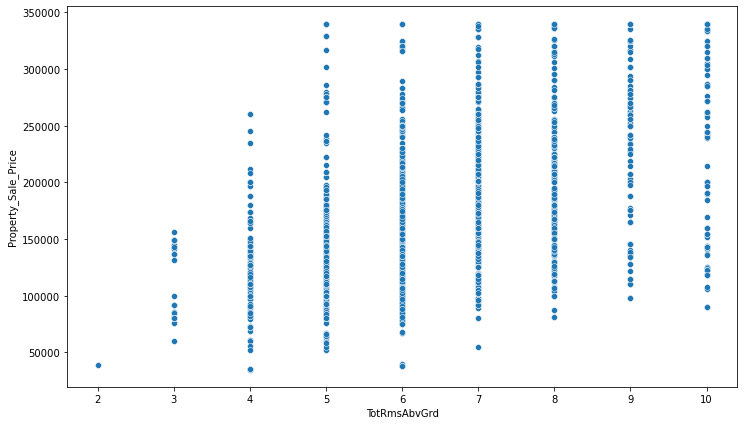

In [845]:
sns.scatterplot(data.TotRmsAbvGrd,data.Property_Sale_Price )

**Not Good Predictor**

# 

# 

# 54) Functional

In [846]:
data.Functional.isnull().sum()

0

In [847]:
data.Functional.value_counts()

Typ     1937
Min1      49
Min2      47
Mod       18
Maj1      15
Maj2       6
Sev        1
Name: Functional, dtype: int64

In [848]:
data.Functional.value_counts().sum()

2073

Text(0.5, 1.0, 'Count Plot of Functional - count')

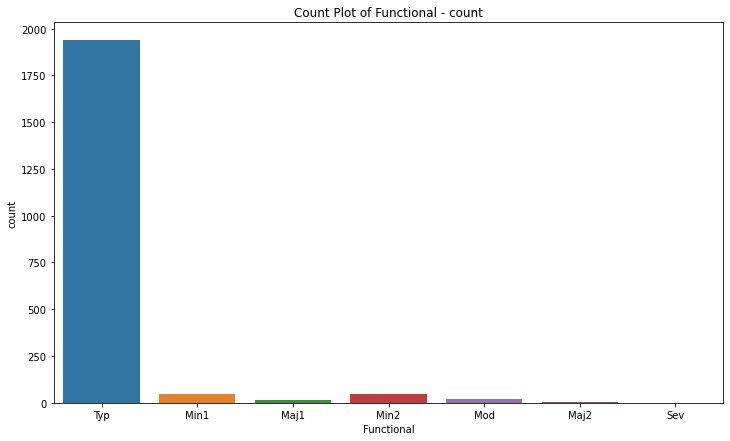

In [849]:
sns.countplot(data.Functional)
plt.title('Count Plot of Functional - count')

In [850]:
data.groupby("Functional")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Functional,,,,,,,,
Maj1,15.0,154018.266667,62157.987000,60000.0,130000.0,144000.0,177750.0,315000.0
Maj2,6.0,85666.666667,24229.458654,52000.0,71500.0,85000.0,103750.0,115000.0
Min1,49.0,144162.244898,38515.982249,82000.0,118000.0,139000.0,170000.0,256000.0
Min2,47.0,143016.638298,37460.315266,87000.0,125500.0,140000.0,160750.0,316600.0
Mod,18.0,162550.000000,85663.282339,55000.0,100375.0,148950.0,197500.0,340000.0
Sev,1.0,129000.000000,NaN,129000.0,129000.0,129000.0,129000.0,129000.0
Typ,1937.0,179909.391843,67437.150215,34900.0,131500.0,167000.0,217000.0,340000.0


In [851]:
mod_GC = ols('Property_Sale_Price ~ Functional', data = data).fit()
sm.stats.anova_lm(mod_GC)

,df,sum_sq,mean_sq,F,PR(>F)
Functional,6.0,1.868199e+11,3.113665e+10,7.051986,1.902607e-07
Residual,2066.0,9.122014e+12,4.415302e+09,NaN,NaN


In [852]:
tukey_GC = pairwise_tukeyhsd(data.Property_Sale_Price, data.Functional, alpha = 0.05)
print(tukey_GC)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
  Maj1   Maj2    -68351.6 0.3356 -163077.2325  26374.0325  False
  Maj1   Min1  -9856.0218    0.9  -67722.2851  48010.2415  False
  Maj1   Min2 -11001.6284    0.9  -69155.7376  47152.4808  False
  Maj1    Mod   8531.7333    0.9  -60025.6462  77089.1128  False
  Maj1    Sev -25018.2667    0.9 -227550.1882 177513.6548  False
  Maj1    Typ  25891.1252 0.7155  -24937.5263  76719.7767  False
  Maj2   Min1  58495.5782 0.3943  -26322.1822 143313.3386  False
  Maj2   Min2  57349.9716 0.4231  -27664.4299 142364.3732  False
  Maj2    Mod  76883.3333 0.1765  -15559.4183  169326.085  False
  Maj2    Sev  43333.3333    0.9 -168479.6202 255146.2868  False
  Maj2    Typ  94242.7252 0.0096   14061.0573 174424.3931   True
  Min1   Min2  -1145.6066    0.9  -41183.1819  38891.9687  False
  Min1    Mod  18387.7551

In [853]:
data["Functional"].replace('Maj1', 'Min1',inplace = True)
data["Functional"].replace('Min2', 'Min1',inplace = True)
data["Functional"].replace('Mod', 'Min1',inplace = True)
data["Functional"].replace('Sev', 'Min1',inplace = True)

In [854]:
data.Functional.value_counts()

Typ     1937
Min1     130
Maj2       6
Name: Functional, dtype: int64

In [855]:
data.Functional.value_counts().sum()

2073

In [856]:
mod_GC = ols('Property_Sale_Price ~ Functional', data = data).fit()
sm.stats.anova_lm(mod_GC)

,df,sum_sq,mean_sq,F,PR(>F)
Functional,2.0,1.802771e+11,9.013856e+10,20.439903,1.620241e-09
Residual,2070.0,9.128557e+12,4.409931e+09,NaN,NaN


In [857]:
tukey_GC = pairwise_tukeyhsd(data.Property_Sale_Price, data.Functional, alpha = 0.05)
print(tukey_GC)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj    lower       upper    reject
-------------------------------------------------------------
  Maj2   Min1 61647.9949 0.0676 -3388.6096 126684.5993  False
  Maj2    Typ 94242.7252 0.0015 30558.5291 157926.9212   True
  Min1    Typ 32594.7303  0.001 18483.3513  46706.1093   True
-------------------------------------------------------------


In [858]:
data["Functional"].replace('Maj2', 'Min1',inplace = True)

In [859]:
data.Functional.value_counts()

Typ     1937
Min1     136
Name: Functional, dtype: int64

In [860]:
data.Functional.value_counts().sum()

2073

In [861]:
df1=data[data.Functional=='Typ']

df2=data[data.Functional=='Min1']

ttest_ind(df1.Property_Sale_Price,df2.Property_Sale_Price)

Ttest_indResult(statistic=5.989060705579733, pvalue=2.4817905193362626e-09)

Text(0.5, 1.0, 'Cat Plot of Functional vs Property_Sale_Price')

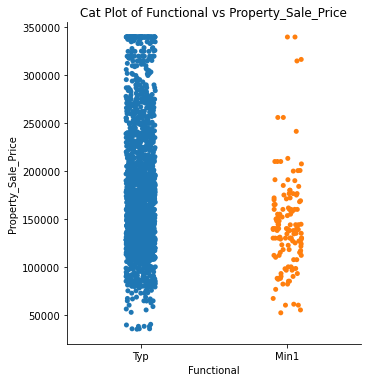

In [862]:
sns.catplot('Functional', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of Functional vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Functional vs Property_Sale_Price')

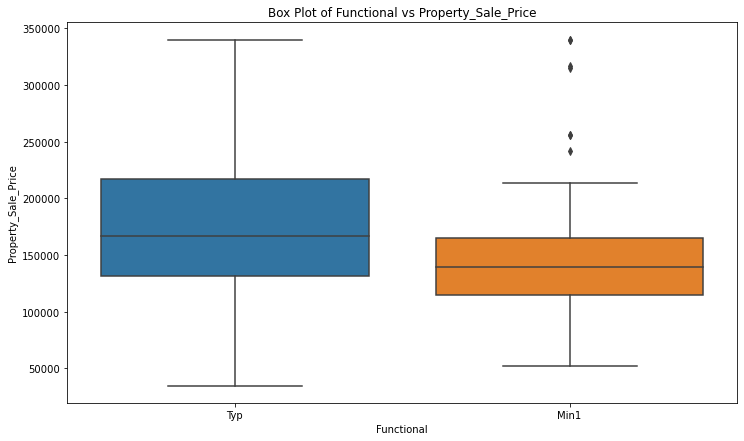

In [863]:
sns.boxplot('Functional', 'Property_Sale_Price', data=data)
plt.title('Box Plot of Functional vs Property_Sale_Price')

**Good Pradictor**

# 

# 

# 55) Fireplaces

In [864]:
data.Fireplaces.isnull().sum()

0

In [865]:
data.Fireplaces.describe()

count    2073.000000
mean        0.602026
std         0.633931
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: Fireplaces, dtype: float64

In [866]:
data.Fireplaces.value_counts()

0    988
1    927
2    153
3      5
Name: Fireplaces, dtype: int64

In [867]:
data.Fireplaces.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of Fireplaces')

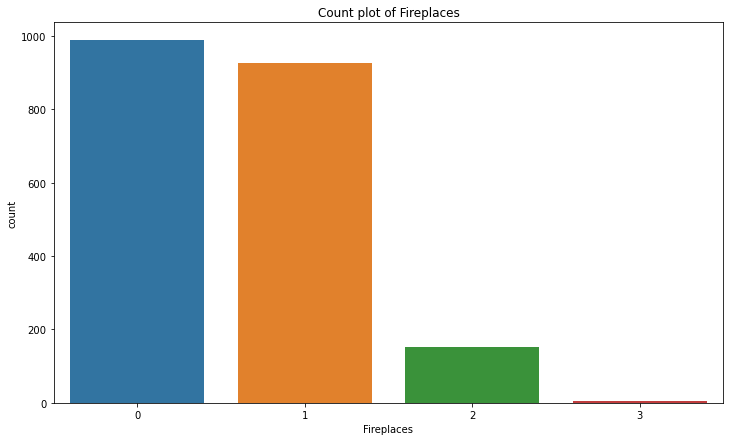

In [868]:
sns.countplot(data.Fireplaces)
plt.title('Count plot of Fireplaces')

In [869]:
data.groupby("Fireplaces")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Fireplaces,,,,,,,,
0,988.0,141606.623482,44270.114578,34900.0,112375.0,135625.0,165000.0,340000.0
1,927.0,208329.539374,66425.592636,60000.0,159975.0,190000.0,255250.0,340000.0
2,153.0,221474.320261,71854.986236,100000.0,160000.0,206900.0,271000.0,340000.0
3,5.0,247000.000000,86429.161745,160000.0,190000.0,205000.0,340000.0,340000.0


In [870]:
mod = ols('Property_Sale_Price ~ Fireplaces', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F         PR(>F)
Fireplaces     1.0  2.216651e+12  2.216651e+12  647.287754  1.763214e-124
Residual    2071.0  7.092184e+12  3.424521e+09         NaN            NaN


In [871]:
t_Fireplaces = pairwise_tukeyhsd(data.Property_Sale_Price, data.Fireplaces)
print(t_Fireplaces)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
     0      1  66722.9159  0.001  59965.5961  73480.2357   True
     0      2  79867.6968  0.001  67028.8191  92706.5744   True
     0      3 105393.3765  0.001  39138.2367 171648.5164   True
     1      2  13144.7809 0.0438    249.3838   26040.178   True
     1      3  38670.4606 0.4389 -27595.6547  104936.576  False
     2      3  25525.6797 0.7367 -41633.6342  92684.9937  False
---------------------------------------------------------------


In [872]:
data["Fireplaces"].replace(3, 2,inplace = True)

In [873]:
data.Fireplaces.value_counts()

0    988
1    927
2    158
Name: Fireplaces, dtype: int64

In [874]:
data.Fireplaces.value_counts().sum()

2073

In [875]:
mod = ols('Property_Sale_Price ~ Fireplaces', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F         PR(>F)
Fireplaces     1.0  2.231890e+12  2.231890e+12  653.141157  1.894439e-125
Residual    2071.0  7.076944e+12  3.417163e+09         NaN            NaN


In [876]:
t_Fireplaces = pairwise_tukeyhsd(data.Property_Sale_Price, data.Fireplaces)
print(t_Fireplaces)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj    lower      upper    reject
------------------------------------------------------------
     0      1 66722.9159  0.001 60558.8601 72886.9717   True
     0      2 80675.4715  0.001 69125.3699  92225.573   True
     1      2 13952.5556 0.0134  2350.1787 25554.9325   True
------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of Fireplaces')

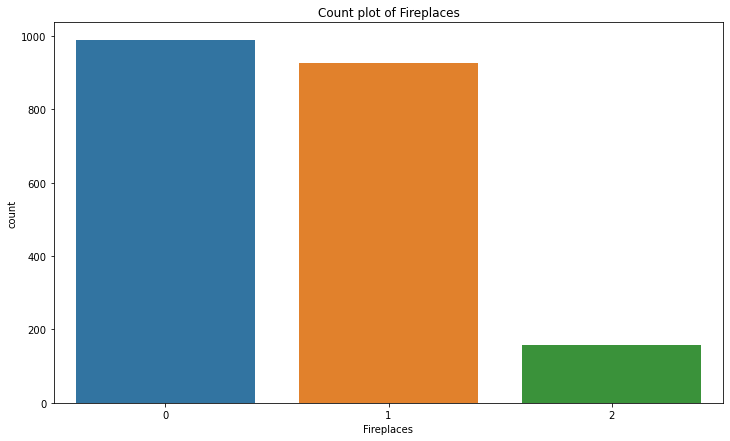

In [877]:
sns.countplot(data.Fireplaces)
plt.title('Count plot of Fireplaces')

Text(0.5, 1.0, 'Cat Plot of Fireplaces vs Property_Sale_Price')

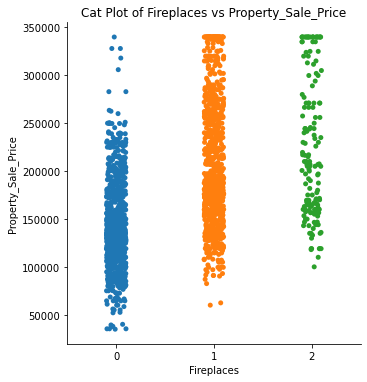

In [878]:
sns.catplot('Fireplaces', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of Fireplaces vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of Fireplaces vs Property_Sale_Price')

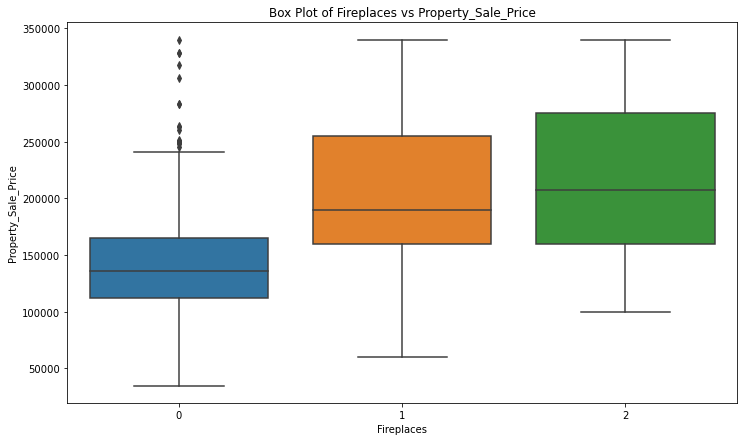

In [879]:
sns.boxplot('Fireplaces', 'Property_Sale_Price', data=data)
plt.title('Box Plot of Fireplaces vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 56) FireplaceQu

In [880]:
data.FireplaceQu.isnull().sum()

988

In [881]:
data.FireplaceQu.dtype

dtype('O')

In [882]:
data.FireplaceQu.fillna('No Fireplace' , inplace = True)

In [883]:
data.FireplaceQu.isnull().sum()

0

In [884]:
data.FireplaceQu.value_counts()

No Fireplace    988
Gd              530
TA              457
Fa               40
Ex               33
Po               25
Name: FireplaceQu, dtype: int64

In [885]:
data.FireplaceQu.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of FireplaceQu')

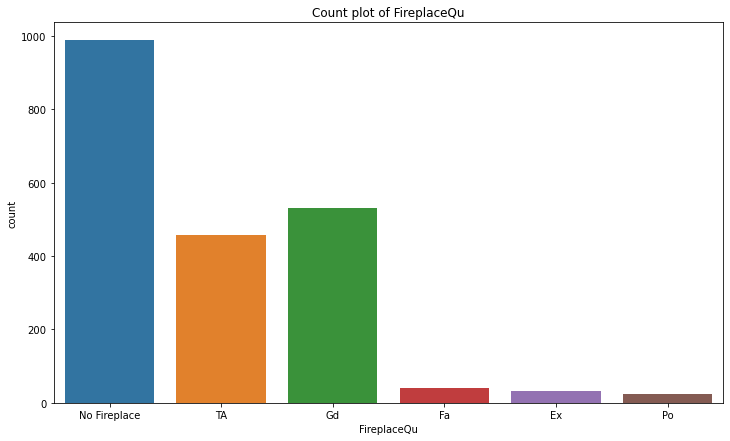

In [886]:
sns.countplot(data.FireplaceQu)
plt.title('Count plot of FireplaceQu')

In [887]:
data.groupby("FireplaceQu")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
FireplaceQu,,,,,,,,
Ex,33.0,286554.666667,55664.331759,130500.0,239686.0,302000.0,340000.0,340000.0
Fa,40.0,167421.250000,32703.040099,117000.0,142875.0,158000.0,188500.0,262000.0
Gd,530.0,219530.394340,71625.390333,90350.0,160050.0,208200.0,274970.0,340000.0
No Fireplace,988.0,141606.623482,44270.114578,34900.0,112375.0,135625.0,165000.0,340000.0
Po,25.0,132467.320000,29351.985303,60000.0,122900.0,134000.0,154000.0,172000.0
TA,457.0,202245.312910,58543.393223,82500.0,163500.0,186500.0,236500.0,340000.0


In [888]:
mod = ols('Property_Sale_Price ~ FireplaceQu', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq           F         PR(>F)
FireplaceQu     5.0  2.936194e+12  5.872387e+11  190.474012  3.623749e-167
Residual     2067.0  6.372641e+12  3.083039e+09         NaN            NaN


In [889]:
t_FireplaceQu = pairwise_tukeyhsd(data.Property_Sale_Price, data.FireplaceQu)
print(t_FireplaceQu)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
   group1       group2      meandiff   p-adj     lower        upper     reject
------------------------------------------------------------------------------
          Ex           Fa -119133.4167  0.001 -156378.3621  -81888.4712   True
          Ex           Gd  -67024.2723  0.001  -95439.5674  -38608.9772   True
          Ex No Fireplace -144948.0432  0.001 -172974.6362 -116921.4502   True
          Ex           Po -154087.3467  0.001 -196080.6366 -112094.0567   True
          Ex           TA  -84309.3538  0.001 -112857.3643  -55761.3432   True
          Fa           Gd   52109.1443  0.001   26139.7169   78078.5718   True
          Fa No Fireplace  -25814.6265 0.0459  -51358.1596    -271.0934   True
          Fa           Po    -34953.93 0.1335  -75332.3719    5424.5119  False
          Fa           TA   34824.0629  0.002     8709.487   60938.6388   True
          Gd No Fireplace  -77923.7709  0.001  -8645

In [890]:
data["FireplaceQu"].replace('Po', 'No Fireplace',inplace = True)

In [891]:
data.FireplaceQu.value_counts()

No Fireplace    1013
Gd               530
TA               457
Fa                40
Ex                33
Name: FireplaceQu, dtype: int64

In [892]:
data.FireplaceQu.value_counts().sum()

2073

In [893]:
mod = ols('Property_Sale_Price ~ FireplaceQu', data=data).fit()
print(sm.stats.anova_lm(mod))

                 df        sum_sq       mean_sq           F         PR(>F)
FireplaceQu     4.0  2.934157e+12  7.335392e+11  237.966422  3.065384e-168
Residual     2068.0  6.374677e+12  3.082533e+09         NaN            NaN


In [894]:
t_FireplaceQu = pairwise_tukeyhsd(data.Property_Sale_Price, data.FireplaceQu)
print(t_FireplaceQu)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05             
   group1       group2      meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------------------
          Ex           Fa -119133.4167  0.001 -154780.0274 -83486.8059   True
          Ex           Gd  -67024.2723  0.001  -94220.1495 -39828.3951   True
          Ex No Fireplace -145173.5936  0.001 -171986.7492 -118360.438   True
          Ex           TA  -84309.3538  0.001  -111632.251 -56986.4565   True
          Fa           Gd   52109.1443  0.001   27254.1724  76964.1162   True
          Fa No Fireplace  -26040.1769   0.03  -50475.7904  -1604.5635   True
          Fa           TA   34824.0629 0.0014    9830.1716  59817.9543   True
          Gd No Fireplace  -78149.3213  0.001  -86275.4573 -70023.1853   True
          Gd           TA  -17285.0814  0.001  -26961.3145  -7608.8484   True
No Fireplace           TA   60864.2399  0.001   52322.6321  6940

Text(0.5, 1.0, 'Count plot of FireplaceQu')

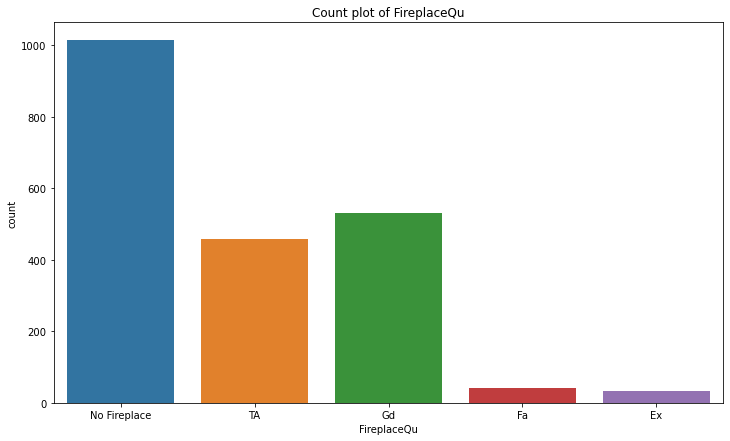

In [895]:
sns.countplot(data.FireplaceQu)
plt.title('Count plot of FireplaceQu')

Text(0.5, 1.0, 'Cat Plot og FireplaceQu vs Property_Sale_Price')

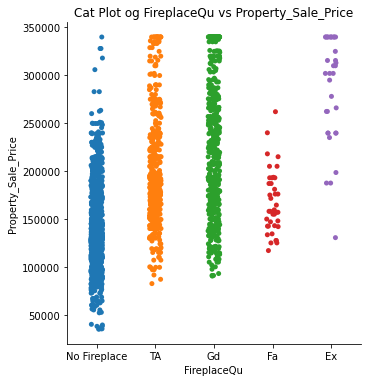

In [896]:
sns.catplot('FireplaceQu', 'Property_Sale_Price', data=data)
plt.title('Cat Plot og FireplaceQu vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot og FireplaceQu vs Property_Sale_Price')

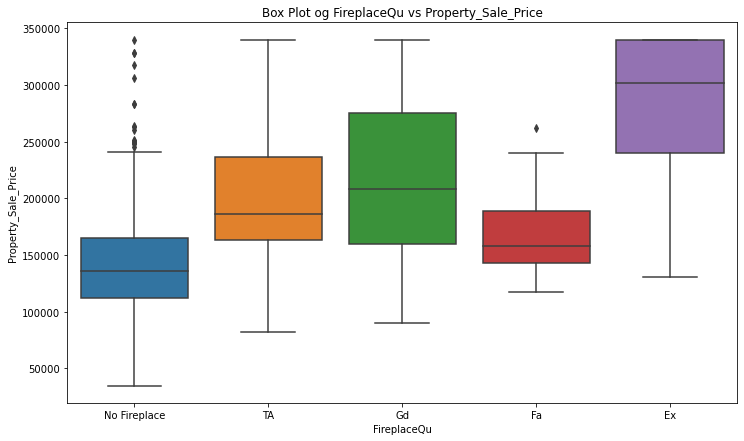

In [897]:
sns.boxplot('FireplaceQu', 'Property_Sale_Price', data=data)
plt.title('Box Plot og FireplaceQu vs Property_Sale_Price')

**Good Pradictor**

# 

# 

# 57) GarageType

In [898]:
data.GarageType.isnull().sum()

113

In [899]:
data.GarageType.dtype

dtype('O')

In [900]:
data.GarageType.fillna('No Garage', inplace = True)

In [901]:
data.GarageType.isnull().sum()

0

In [902]:
data.GarageType.value_counts()

Attchd       1252
Detchd        537
BuiltIn       124
No Garage     113
Basment        27
CarPort        12
2Types          8
Name: GarageType, dtype: int64

In [903]:
data.GarageType.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of GarageType')

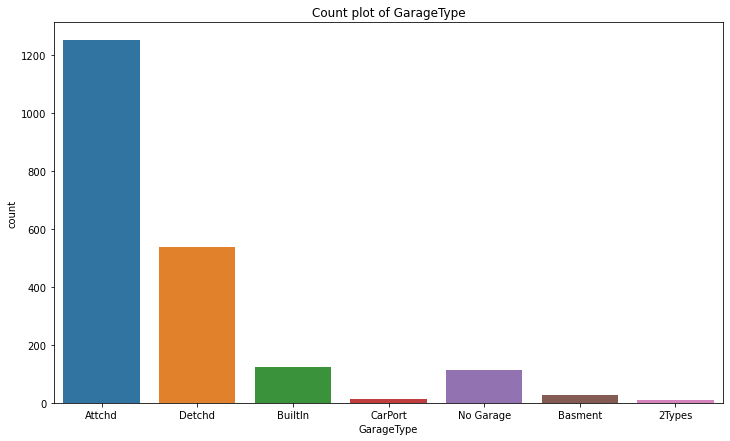

In [904]:
sns.countplot(data.GarageType)
plt.title('Count plot of GarageType')

In [905]:
data.groupby("GarageType")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
GarageType,,,,,,,,
2Types,8.0,149712.500000,29653.303237,87000.0,145000.0,147500.0,168750.0,186700.0
Attchd,1252.0,198469.570288,62778.142381,60000.0,149850.0,185000.0,237125.0,340000.0
Basment,27.0,156036.777778,55344.633028,55993.0,132250.0,145000.0,174000.0,340000.0
BuiltIn,124.0,241190.612903,68998.383109,91000.0,184587.5,227500.0,303477.0,340000.0
CarPort,12.0,109971.583333,21011.520630,82000.0,100100.0,109479.5,110000.0,164900.0
Detchd,537.0,132222.826816,38273.672570,35311.0,110000.0,129000.0,148000.0,340000.0
No Garage,113.0,106405.752212,32494.589352,34900.0,85000.0,106250.0,127500.0,200500.0


In [906]:
mod = ols('Property_Sale_Price ~ GarageType', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq          F         PR(>F)
GarageType     6.0  2.798865e+12  4.664775e+11  148.04104  1.756884e-156
Residual    2066.0  6.509969e+12  3.151001e+09        NaN            NaN


In [907]:
t_GarageType = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageType)
print(t_GarageType)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05          
 group1   group2    meandiff   p-adj     lower        upper     reject
----------------------------------------------------------------------
 2Types    Attchd   48757.0703 0.1787  -10000.1608  107514.3013  False
 2Types   Basment    6324.2778    0.9  -60361.0597   73009.6153  False
 2Types   BuiltIn   91478.1129  0.001   31047.8705  151908.3553   True
 2Types   CarPort  -39740.9167 0.6874  -115354.982   35873.1486  False
 2Types    Detchd  -17489.6732    0.9   -76494.742   41515.3957  False
 2Types No Garage  -43306.7478 0.3481 -103914.9883   17301.4928  False
 Attchd   Basment  -42432.7925  0.002  -74656.4203  -10209.1647   True
 Attchd   BuiltIn   42721.0426  0.001   27124.8203   58317.2649   True
 Attchd   CarPort   -88497.987  0.001 -136549.1558  -40446.8181   True
 Attchd    Detchd  -66246.7435  0.001  -74792.2748  -57701.2122   True
 Attchd No Garage  -92063.8181  0.001 -108336.0882  -75791.5479   True
Basmen

In [908]:
data["GarageType"].replace('2Types', 'Detchd',inplace = True)
data["GarageType"].replace('CarPort', 'No Garage',inplace = True)
data["GarageType"].replace('Basment', 'Detchd',inplace = True)

In [909]:
data.GarageType.value_counts()

Attchd       1252
Detchd        572
No Garage     125
BuiltIn       124
Name: GarageType, dtype: int64

In [910]:
data.GarageType.value_counts().sum()

2073

In [911]:
mod = ols('Property_Sale_Price ~ GarageType', data=data).fit()
print(sm.stats.anova_lm(mod))

                df        sum_sq       mean_sq           F         PR(>F)
GarageType     3.0  2.782040e+12  9.273466e+11  293.969762  6.068678e-159
Residual    2069.0  6.526794e+12  3.154565e+09         NaN            NaN


In [912]:
t_GarageType = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageType)
print(t_GarageType)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05         
 group1   group2    meandiff   p-adj    lower        upper     reject
---------------------------------------------------------------------
 Attchd   BuiltIn   42721.0426 0.001   29125.7384   56316.3468   True
 Attchd    Detchd  -64878.0476 0.001  -72165.9904  -57590.1047   True
 Attchd No Garage  -91721.4983 0.001 -105267.2315  -78175.7651   True
BuiltIn    Detchd -107599.0902 0.001 -121904.1106  -93294.0698   True
BuiltIn No Garage -134442.5409 0.001 -152745.7206 -116139.3612   True
 Detchd No Garage  -26843.4507 0.001  -41101.3679  -12585.5336   True
---------------------------------------------------------------------


Text(0.5, 1.0, 'Count plot of GarageType')

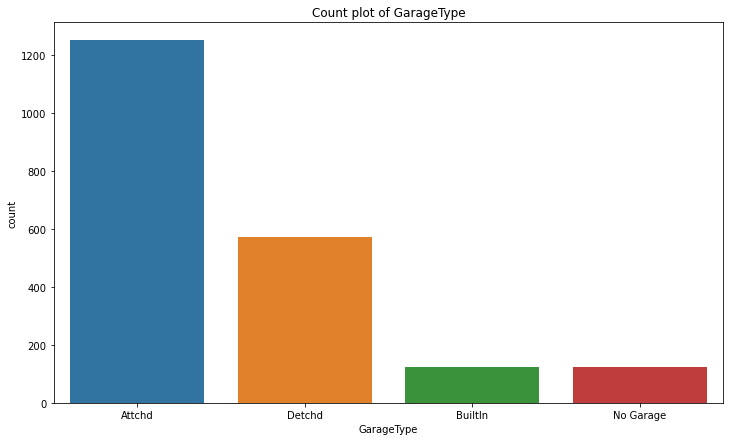

In [913]:
sns.countplot(data.GarageType)
plt.title('Count plot of GarageType')

Text(0.5, 1.0, 'Cat Plot of GarageType vs Property_Sale_Price')

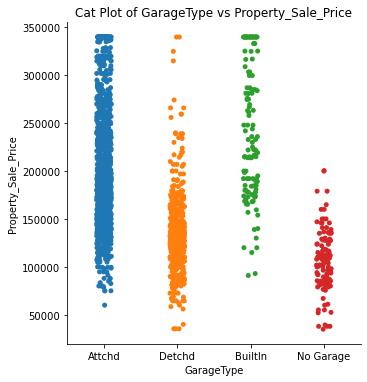

In [914]:
sns.catplot('GarageType', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of GarageType vs Property_Sale_Price')

Text(0.5, 1.0, 'Box Plot of GarageType vs Property_Sale_Price')

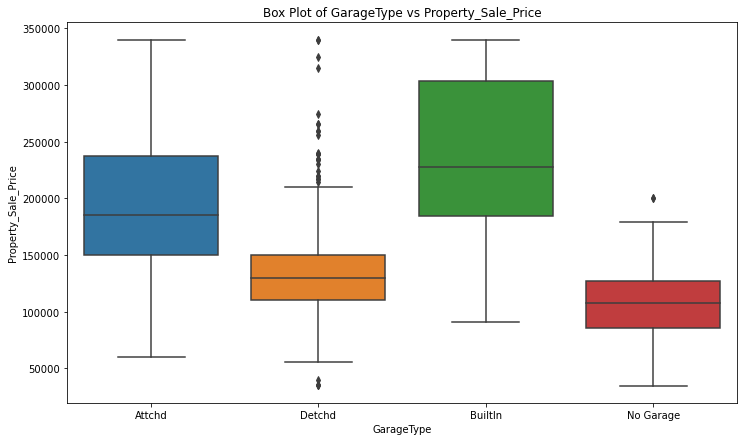

In [915]:
sns.boxplot('GarageType', 'Property_Sale_Price', data=data)
plt.title('Box Plot of GarageType vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 58) GarageYrBlt

In [916]:
data.GarageYrBlt.isnull().sum()

113

In [917]:
data.GarageYrBlt.dtype

dtype('float64')

In [918]:
data.GarageYrBlt.sample(10)

1984    1972.0
531     1920.0
1951    1961.0
757     1978.0
1155    1976.0
1818    1990.0
672     1977.0
681     1968.0
471     1977.0
1069    1985.0
Name: GarageYrBlt, dtype: float64

In [919]:
data.GarageYrBlt.median()

1984.0

In [920]:
data.GarageYrBlt.fillna(data.GarageYrBlt.median(), inplace = True)

In [921]:
data.GarageYrBlt.isnull().sum()

0

In [922]:
data.GarageYrBlt.describe()

count    2073.000000
mean     1980.613603
std        23.504410
min      1906.000000
25%      1964.000000
50%      1984.000000
75%      2003.000000
max      2019.000000
Name: GarageYrBlt, dtype: float64

In [923]:
data.GarageYrBlt.value_counts()

1984.0    122
2005.0    116
2006.0     82
2007.0     81
2003.0     72
         ... 
2015.0      1
2019.0      1
1908.0      1
1906.0      1
2013.0      1
Name: GarageYrBlt, Length: 102, dtype: int64

In [924]:
data.GarageYrBlt.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram of GarageYrBlt')

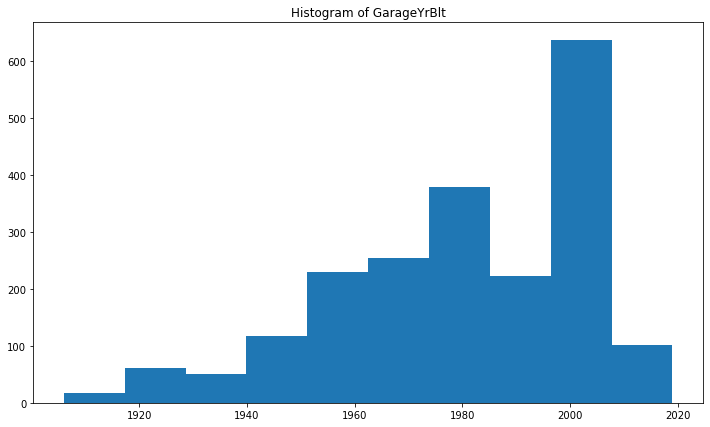

In [925]:
plt.hist(data.GarageYrBlt)
plt.title('Histogram of GarageYrBlt')

Text(0.5, 1.0, 'Normality of GarageYrBlt')

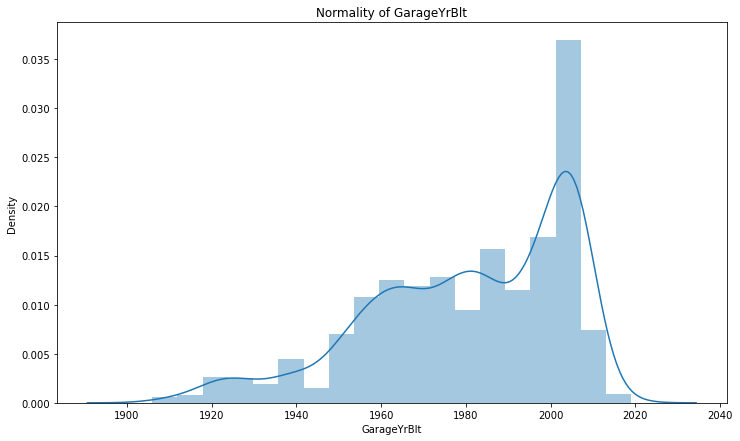

In [926]:
sns.distplot(data.GarageYrBlt)
plt.title('Normality of GarageYrBlt')

Text(0.5, 1.0, 'Count plot of GarageYrBlt')

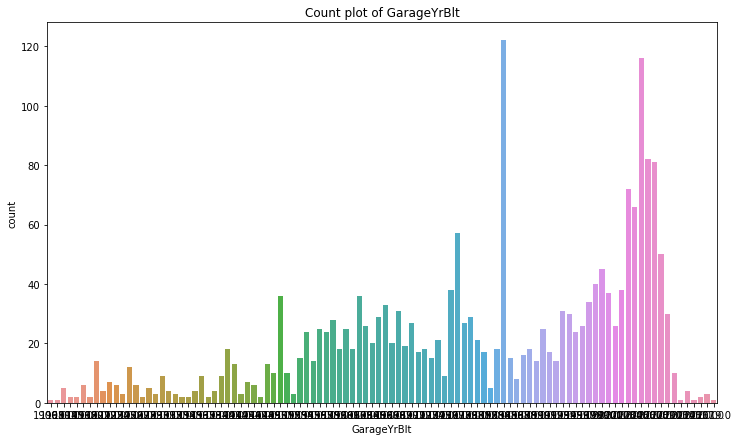

In [927]:
sns.countplot(data.GarageYrBlt)
plt.title('Count plot of GarageYrBlt')

Text(0.5, 1.0, 'BoxPlot Of GarageYrBlt')

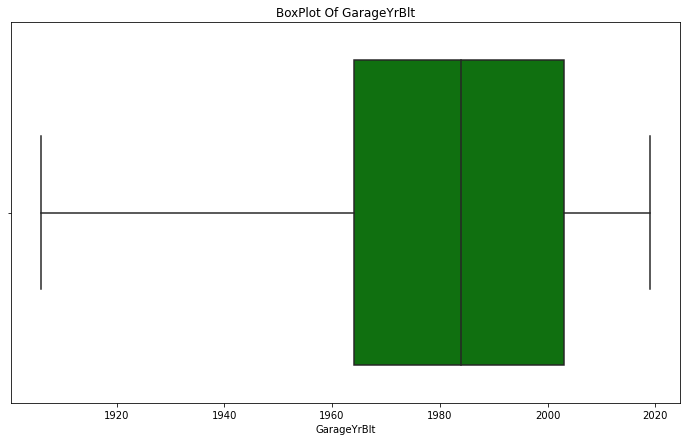

In [928]:
sns.boxplot(data.GarageYrBlt, color = 'g')
plt.title('BoxPlot Of GarageYrBlt')

In [929]:
np.corrcoef(data.Property_Sale_Price, data.GarageYrBlt)

array([[1.        , 0.47316836],
       [0.47316836, 1.        ]])

Text(0.5, 1.0, 'GarageYrBlt vs Property_Sale_Price')

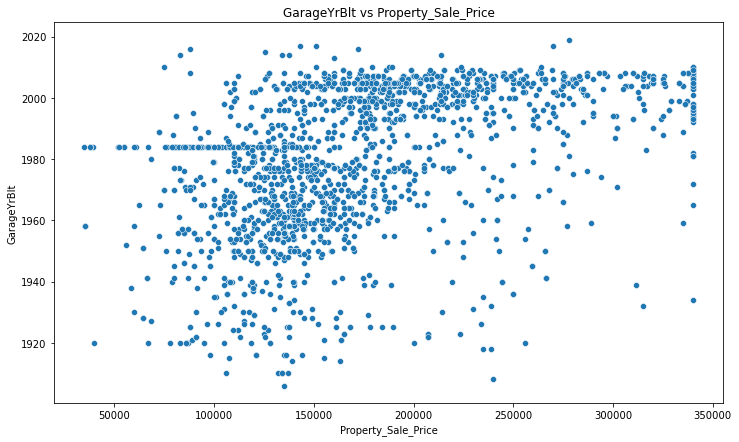

In [930]:
sns.scatterplot(data.Property_Sale_Price, data.GarageYrBlt)
plt.title('GarageYrBlt vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 59) GarageFinish

In [931]:
data.GarageFinish.isnull().sum()

113

In [932]:
data.GarageFinish.dtype

dtype('O')

In [933]:
data.GarageFinish.fillna('No Garage', inplace = True)

In [934]:
data.GarageFinish.isnull().sum()

0

In [935]:
data.GarageFinish.value_counts()

Unf          857
RFn          605
Fin          498
No Garage    113
Name: GarageFinish, dtype: int64

In [936]:
data.GarageFinish.value_counts().sum()

2073

Text(0.5, 1.0, 'Count plot of GarageFinish')

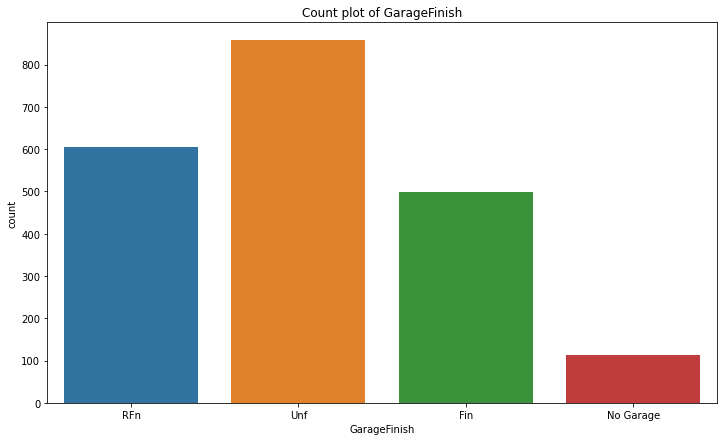

In [937]:
sns.countplot(data.GarageFinish)
plt.title('Count plot of GarageFinish')

In [938]:
data.groupby("GarageFinish")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
GarageFinish,,,,,,,,
Fin,498.0,229552.206827,67955.485997,82500.0,178000.0,215000.0,285000.0,340000.0
No Garage,113.0,106405.752212,32494.589352,34900.0,85000.0,106250.0,127500.0,200500.0
RFn,605.0,200026.957025,54999.706561,68400.0,160000.0,190000.0,235000.0,340000.0
Unf,857.0,140947.771295,44510.885445,35311.0,115000.0,135000.0,155000.0,340000.0


In [939]:
mod = ols('Property_Sale_Price ~ GarageFinish', data=data).fit()
print(sm.stats.anova_lm(mod))

                  df        sum_sq       mean_sq          F         PR(>F)
GarageFinish     3.0  3.372449e+12  1.124150e+12  391.79839  1.683598e-201
Residual      2069.0  5.936385e+12  2.869205e+09        NaN            NaN


In [940]:
t_GarageFinish = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageFinish)
print(t_GarageFinish)

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
  group1    group2    meandiff   p-adj    lower        upper     reject
-----------------------------------------------------------------------
      Fin No Garage -123146.4546 0.001 -137497.0688 -108795.8405   True
      Fin       RFn  -29525.2498 0.001  -37858.2074  -21192.2922   True
      Fin       Unf  -88604.4355 0.001  -96364.5538  -80844.3173   True
No Garage       RFn   93621.2048 0.001   79507.2381  107735.1715   True
No Garage       Unf   34542.0191 0.001   20758.5032   48325.5349   True
      RFn       Unf  -59079.1857 0.001  -66392.4179  -51765.9535   True
-----------------------------------------------------------------------


Text(0.5, 1.0, 'Cat Plot of GarageType vs GarageFinish')

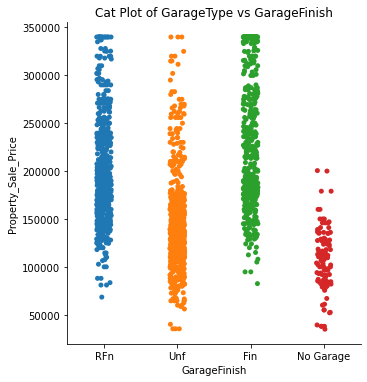

In [941]:
sns.catplot('GarageFinish', 'Property_Sale_Price', data=data)
plt.title('Cat Plot of GarageType vs GarageFinish')

Text(0.5, 1.0, 'Box Plot of GarageType vs GarageFinish')

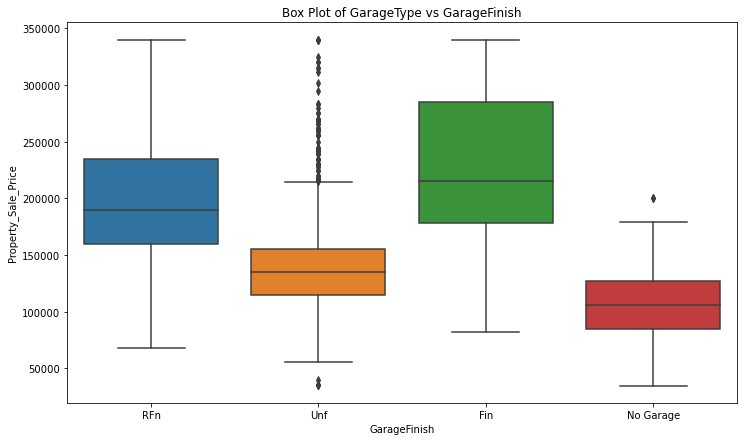

In [942]:
sns.boxplot('GarageFinish', 'Property_Sale_Price', data=data)
plt.title('Box Plot of GarageType vs GarageFinish')

**Good Predictor**

# 

# 

# 60) GarageCars

In [943]:
data.GarageCars.isnull().sum()

0

In [944]:
data.GarageCars.describe()

count    2073.000000
mean        1.775687
std         0.741976
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: GarageCars, dtype: float64

In [945]:
data.GarageCars.value_counts()

2    1185
1     510
3     259
0     113
4       6
Name: GarageCars, dtype: int64

In [946]:
data.GarageCars.value_counts().sum()

2073

Text(0.5, 1.0, 'GarageCars - count')

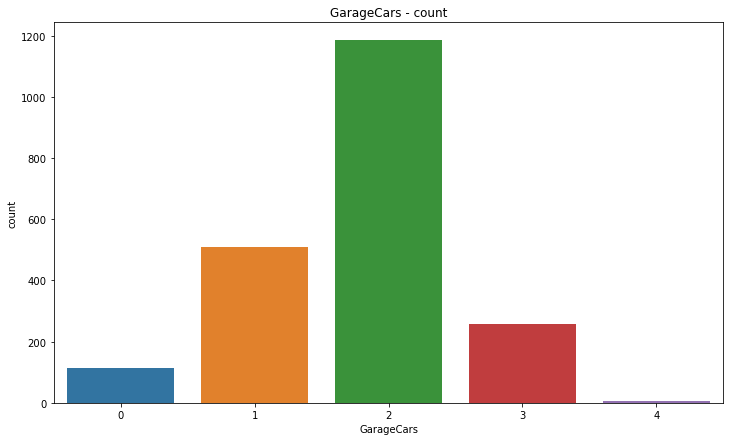

In [947]:
sns.countplot(data.GarageCars)
plt.title('GarageCars - count')

In [948]:
data.groupby("GarageCars")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
GarageCars,,,,,,,,
0,113.0,106405.752212,32494.589352,34900.0,85000.0,106250.0,127500.00,200500.0
1,510.0,128228.098039,33074.896644,35311.0,110000.0,128000.0,141000.00,266500.0
2,1185.0,182900.022785,50169.588399,55993.0,147400.0,177000.0,211000.00,340000.0
3,259.0,280939.895753,62830.981922,81000.0,245000.0,293077.0,340000.00,340000.0
4,6.0,204876.333333,55778.983715,123000.0,176000.0,203150.0,251059.25,265979.0


In [949]:
mod_GC = ols('Property_Sale_Price ~ GarageCars', data = data).fit()
sm.stats.anova_lm(mod_GC)

,df,sum_sq,mean_sq,F,PR(>F)
GarageCars,1.0,4.096521e+12,4.096521e+12,1627.664126,4.128337e-263
Residual,2071.0,5.212313e+12,2.516810e+09,NaN,NaN


In [950]:
tukey_GC = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageCars, alpha = 0.05)
print(tukey_GC)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------
     0      1  21822.3458  0.001    8305.1442  35339.5475   True
     0      2  76494.2706  0.001   63694.3867  89294.1544   True
     0      3 174534.1435  0.001  159876.9965 189191.2906   True
     0      4  98470.5811  0.001   44004.5521 152936.6102   True
     1      2  54671.9247  0.001   47786.8657  61556.9838   True
     1      3 152711.7977  0.001  142792.1721 162631.4233   True
     1      4  76648.2353  0.001   23261.7639 130034.7067   True
     2      3   98039.873  0.001   89122.4037 106957.3422   True
     2      4  21976.3105 0.7654  -31233.0647  75185.6858  False
     3      4 -76063.5624 0.0011 -129749.9904 -22377.1344   True
----------------------------------------------------------------


In [951]:
data["GarageCars"].replace(4,2,inplace = True)

In [952]:
data.GarageCars.value_counts()

2    1191
1     510
3     259
0     113
Name: GarageCars, dtype: int64

In [953]:
data.GarageCars.value_counts().sum()

2073

In [954]:
mod_GC = ols('Property_Sale_Price ~ GarageCars', data = data).fit()
sm.stats.anova_lm(mod_GC)

,df,sum_sq,mean_sq,F,PR(>F)
GarageCars,1.0,4.164913e+12,4.164913e+12,1676.840447,4.702769e-269
Residual,2071.0,5.143921e+12,2.483786e+09,NaN,NaN


In [955]:
tukey_GC = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageCars, alpha = 0.05)
print(tukey_GC)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj    lower       upper    reject
--------------------------------------------------------------
     0      1  21822.3458 0.001   9091.7614  34552.9302   True
     0      2  76604.9825 0.001  64552.6162  88657.3487   True
     0      3 174534.1435 0.001 160729.9515 188338.3356   True
     1      2  54782.6366 0.001  48303.1617  61262.1116   True
     1      3 152711.7977 0.001 143369.4328 162054.1626   True
     2      3  97929.1611 0.001  89534.4285 106323.8936   True
--------------------------------------------------------------


Text(0.5, 1.0, 'GarageCars - count')

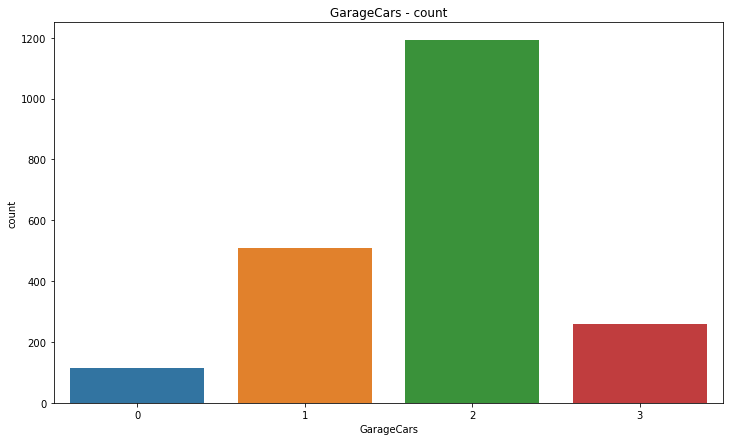

In [956]:
sns.countplot(x = 'GarageCars', data = data)
plt.title('GarageCars - count')

Text(0.5, 1.0, 'Catplot Of GarageCars vs Property_Sale_Price')

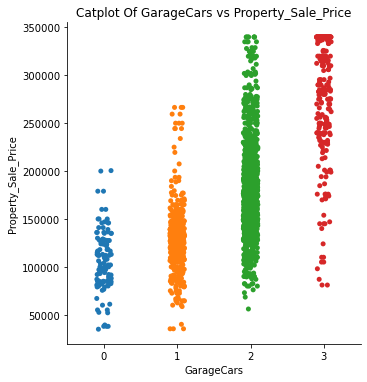

In [957]:
sns.catplot(x = 'GarageCars', y = 'Property_Sale_Price',data = data)
plt.title('Catplot Of GarageCars vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of GarageCars vs Property_Sale_Price')

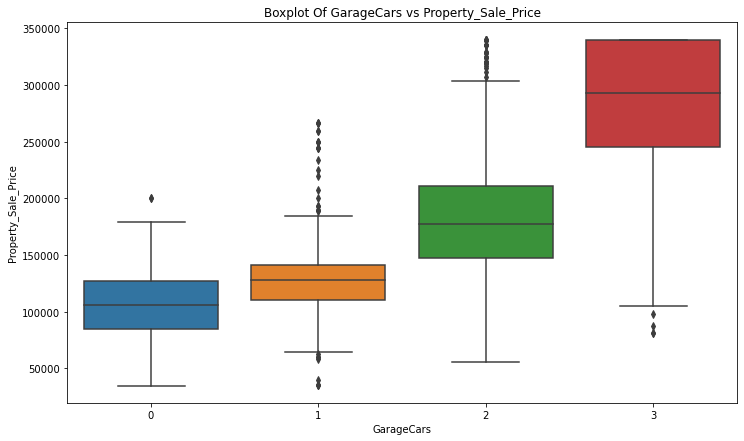

In [958]:
sns.boxplot(x = 'GarageCars', y = 'Property_Sale_Price',data = data)
plt.title('Boxplot Of GarageCars vs Property_Sale_Price')

**GOOD PREDICTOR**

# 

# 

# 61) GarageArea

In [959]:
data.GarageArea.isnull().sum()

0

In [960]:
data.GarageArea.describe()

count    2073.000000
mean      474.683068
std       212.284955
min         0.000000
25%       336.000000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64

In [961]:
data.GarageArea.value_counts()

0      113
440     72
576     61
240     54
528     53
      ... 
350      1
342      1
283      1
292      1
770      1
Name: GarageArea, Length: 441, dtype: int64

In [962]:
data.GarageArea.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of GarageArea')

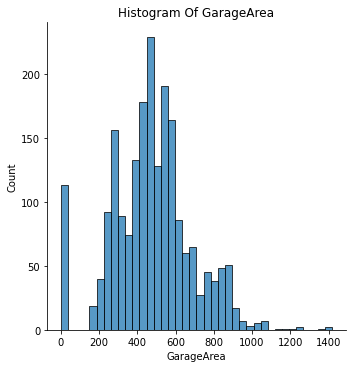

In [963]:
sns.displot(data.GarageArea)
plt.title('Histogram Of GarageArea')

Text(0.5, 1.0, 'Normality Of GarageArea')

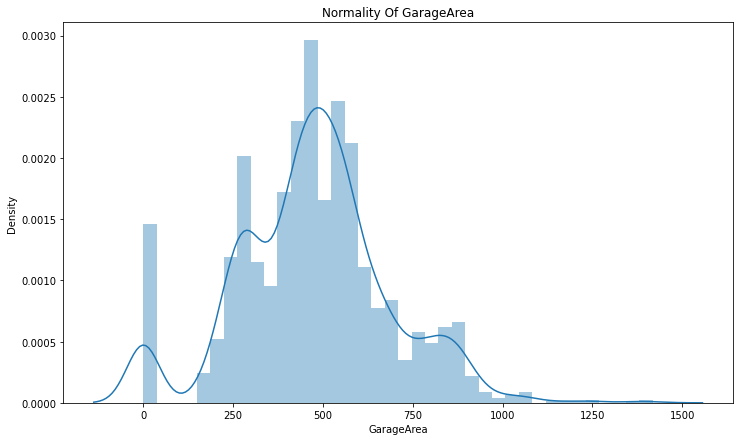

In [964]:
sns.distplot(data.GarageArea)
plt.title('Normality Of GarageArea')

Text(0.5, 1.0, 'GarageArea - count')

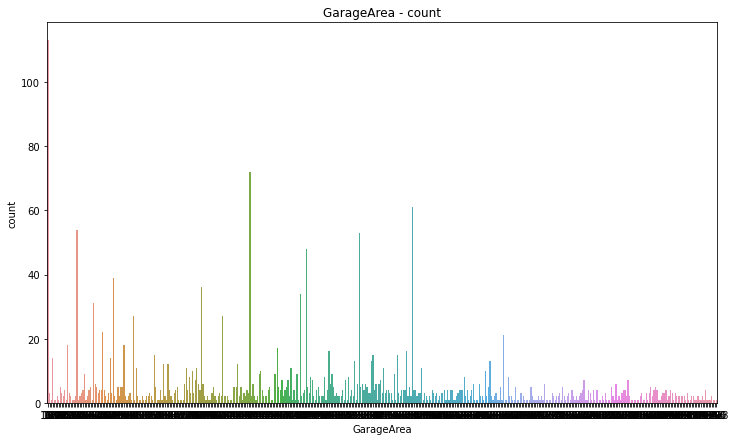

In [965]:
sns.countplot(data.GarageArea)
plt.title('GarageArea - count')

Text(0.5, 1.0, 'BoxPlot Of GarageArea')

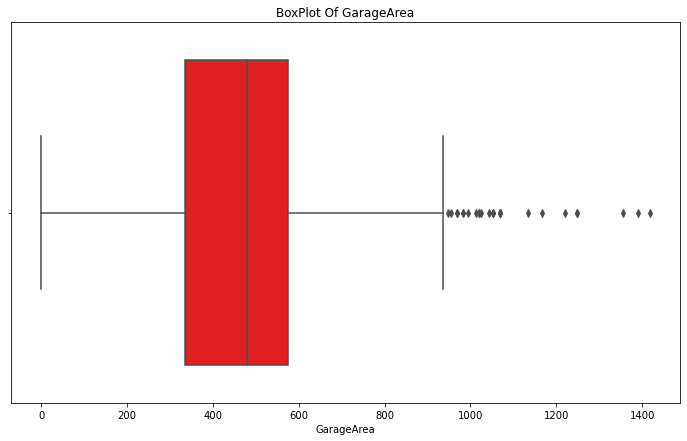

In [966]:
sns.boxplot(data.GarageArea, color = 'red')
plt.title('BoxPlot Of GarageArea')

In [967]:
IQR = data.GarageArea.quantile(0.75) - data.GarageArea.quantile(0.25)
IQR

240.0

In [968]:
UL = data.GarageArea.quantile(0.75) + (1.5*IQR)
UL

936.0

In [969]:
LL = data.GarageArea.quantile(0.25) - (1.5*IQR)
LL

-24.0

In [970]:
data.GarageArea[(data.GarageArea > UL)].value_counts().sum()

27

In [971]:
data.GarageArea[(data.GarageArea < LL)].value_counts().sum()

0

In [972]:
data['GarageArea'] = np.where(data['GarageArea'] > UL, UL, data['GarageArea'])

Text(0.5, 1.0, 'BoxPlot Of GarageArea')

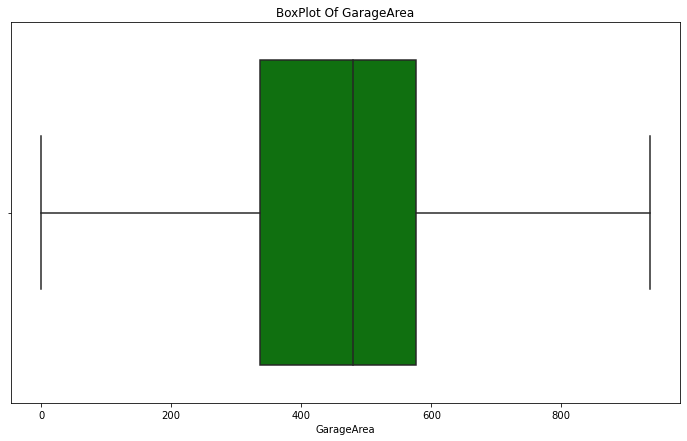

In [973]:
sns.boxplot(data.GarageArea, color = 'green')
plt.title('BoxPlot Of GarageArea')

Text(0.5, 1.0, 'Normality Of GarageArea')

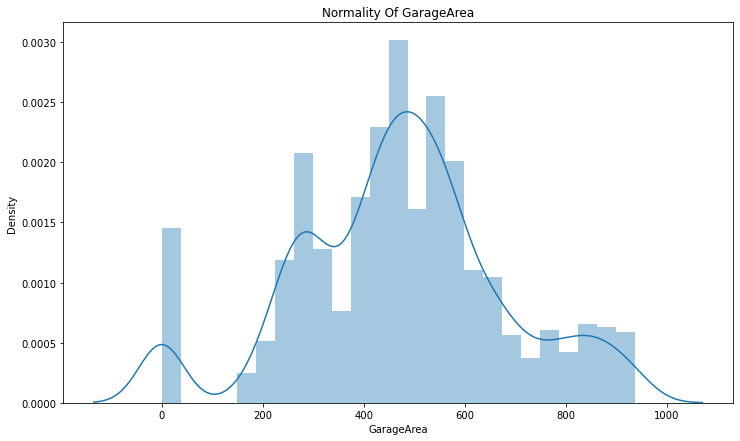

In [974]:
sns.distplot(data.GarageArea)
plt.title('Normality Of GarageArea')

In [975]:
np.corrcoef(data.GarageArea, data.Property_Sale_Price)

array([[1.        , 0.65435751],
       [0.65435751, 1.        ]])

Text(0.5, 1.0, 'Scatter Plot Of GarageArea vs Property_Sale_Price')

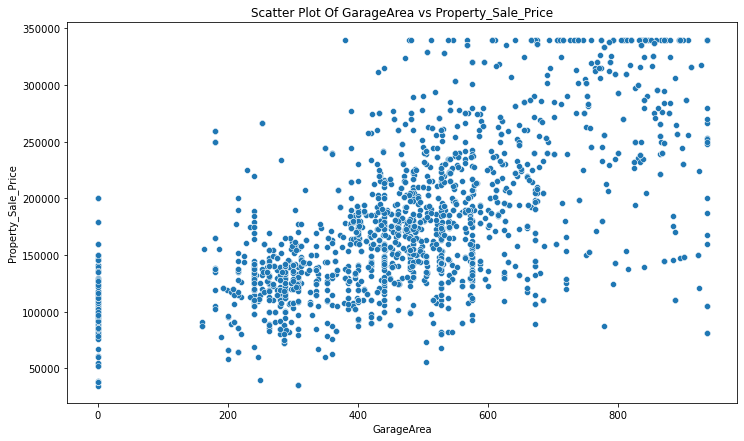

In [976]:
sns.scatterplot(x = data['GarageArea'], y = data.Property_Sale_Price, data = data )
plt.xlabel('GarageArea')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter Plot Of GarageArea vs Property_Sale_Price')

**GOOD PREDICTOR**

# 

# 

# 62) GarageQual

In [977]:
data.GarageQual.isnull().sum()

113

In [978]:
data.GarageQual.dtype

dtype('O')

In [979]:
data['GarageQual'] = data['GarageQual'].fillna('No Garage')

In [980]:
data.GarageQual.isnull().sum()

0

In [981]:
data.GarageQual.value_counts()

TA           1870
No Garage     113
Fa             65
Gd             18
Ex              4
Po              3
Name: GarageQual, dtype: int64

In [982]:
data.GarageQual.value_counts().sum()

2073

Text(0.5, 1.0, 'GarageQual - count')

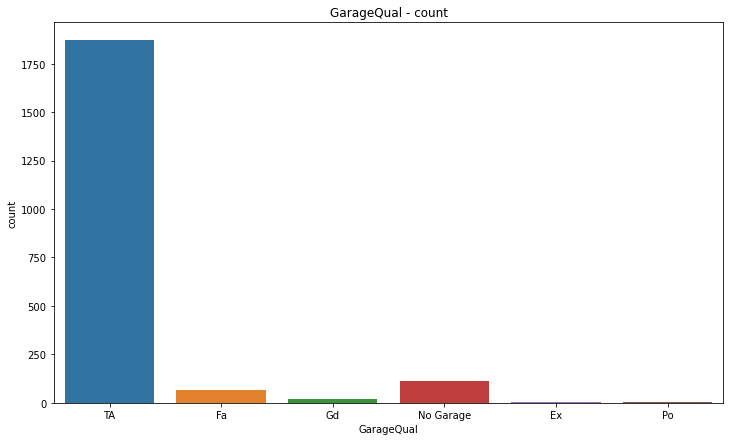

In [983]:
sns.countplot(data.GarageQual)
plt.title('GarageQual - count')

In [984]:
data.groupby("GarageQual")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
GarageQual,,,,,,,,
Ex,4.0,178875.000000,107467.340000,120500.0,125750.0,127500.0,180625.0,340000.0
Fa,65.0,121509.553846,46472.205090,64500.0,91000.0,112000.0,135000.0,256000.0
Gd,18.0,225778.888889,73079.130029,90350.0,165975.0,236115.0,295242.5,325000.0
No Garage,113.0,106405.752212,32494.589352,34900.0,85000.0,106250.0,127500.0,200500.0
Po,3.0,100166.666667,35143.752408,67000.0,81750.0,96500.0,116750.0,137000.0
TA,1870.0,183501.287166,65515.593003,35311.0,135500.0,171000.0,219875.0,340000.0


In [985]:
mod_GQ = ols('Property_Sale_Price ~ GarageQual', data = data).fit()
sm.stats.anova_lm(mod_GQ)

,df,sum_sq,mean_sq,F,PR(>F)
GarageQual,5.0,9.021521e+11,1.804304e+11,44.363481,1.349928e-43
Residual,2067.0,8.406682e+12,4.067093e+09,NaN,NaN


In [986]:
tukey_GQ = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageQual, alpha = 0.05)
print(tukey_GQ)

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
  group1    group2    meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------------
       Ex        Fa  -57365.4462 0.5006 -151074.8873   36343.995  False
       Ex        Gd   46903.8889 0.7405  -53648.0777 147455.8555  False
       Ex No Garage  -72469.2478 0.2228 -165017.7064  20079.2108  False
       Ex        Po  -78708.3333 0.5758 -217640.8407   60224.174  False
       Ex        TA    4626.2872    0.9  -86423.6124  95676.1867  False
       Fa        Gd   104269.335  0.001   55819.5793 152719.0908   True
       Fa No Garage  -15103.8016 0.6304   -43421.606  13214.0028  False
       Fa        Po  -21342.8872    0.9 -128762.2637  86076.4893  False
       Fa        TA   61991.7333  0.001   39040.3704  84943.0962   True
       Gd No Garage -119373.1367  0.001 -165537.3724 -73208.9009   True
       Gd        Po -125612.2222   0.02 -239050.1394  -12174.305

In [987]:
data["GarageQual"].replace('Ex','TA',inplace = True)
data["GarageQual"].replace('Po','Fa',inplace = True)

In [988]:
data.GarageQual.value_counts()

TA           1874
No Garage     113
Fa             68
Gd             18
Name: GarageQual, dtype: int64

In [989]:
data.GarageQual.value_counts().sum()

2073

In [990]:
mod_GQ = ols('Property_Sale_Price ~ GarageQual', data = data).fit()
sm.stats.anova_lm(mod_GQ)

,df,sum_sq,mean_sq,F,PR(>F)
GarageQual,3.0,9.007604e+11,3.002535e+11,73.884274,2.143585e-45
Residual,2069.0,8.408074e+12,4.063835e+09,NaN,NaN


In [991]:
tukey_GQ = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageQual, alpha = 0.05)
print(tukey_GQ)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05          
  group1    group2    meandiff   p-adj     lower       upper    reject
----------------------------------------------------------------------
       Fa        Gd   105210.933  0.001  61764.9599 148656.9062   True
       Fa No Garage  -14162.2037 0.4708 -39317.9161  10993.5088  False
       Fa        TA   62923.4566  0.001  42689.7068  83157.2064   True
       Gd No Garage -119373.1367  0.001   -160969.1 -77777.1734   True
       Gd        TA  -42287.4764 0.0264  -81105.242  -3469.7108   True
No Garage        TA   77085.6603  0.001  61208.7522  92962.5684   True
----------------------------------------------------------------------


In [992]:
data["GarageQual"].replace('Fa', 'No Garage',inplace = True)

In [993]:
data.GarageQual.value_counts()

TA           1874
No Garage     181
Gd             18
Name: GarageQual, dtype: int64

In [994]:
data.GarageQual.value_counts().sum()

2073

In [995]:
mod_GQ = ols('Property_Sale_Price ~ GarageQual', data = data).fit()
sm.stats.anova_lm(mod_GQ)

,df,sum_sq,mean_sq,F,PR(>F)
GarageQual,2.0,8.922457e+11,4.461228e+11,109.720736,5.119506e-46
Residual,2070.0,8.416588e+12,4.065985e+09,NaN,NaN


In [996]:
tukey_GQ = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageQual, alpha = 0.05)
print(tukey_GQ)

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
  group1    group2    meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------------
       Gd No Garage -114052.5298  0.001 -151014.3784 -77090.6812   True
       Gd        TA  -42287.4764 0.0143  -77706.9584  -6867.9944   True
No Garage        TA   71765.0534  0.001   60124.2081  83405.8987   True
-----------------------------------------------------------------------


Text(0.5, 1.0, 'GarageQual - count')

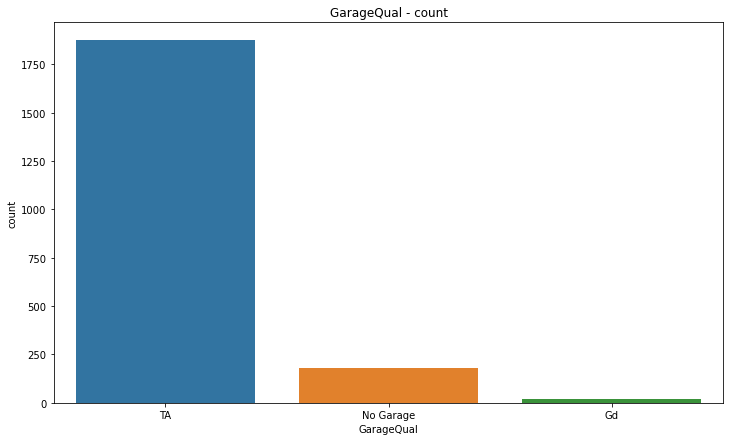

In [997]:
sns.countplot(x = 'GarageQual', data = data)
plt.title('GarageQual - count')

Text(0.5, 1.0, 'Catplot Of GarageQual vs Property_Sale_Price')

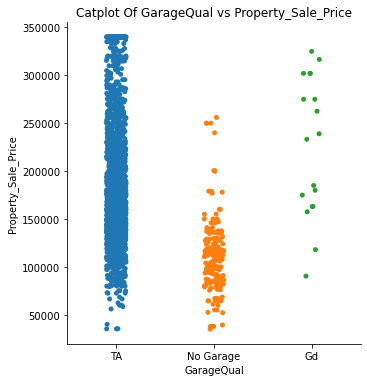

In [998]:
sns.catplot(x = 'GarageQual', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of GarageQual vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of GarageQual vs Property_Sale_Price')

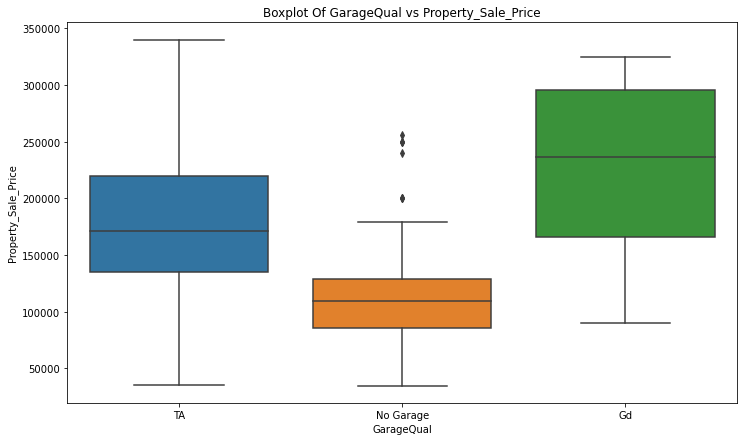

In [999]:
sns.boxplot(x = 'GarageQual', y = 'Property_Sale_Price', data = data)
plt.title('Boxplot Of GarageQual vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 63) GarageCond

In [1000]:
data.GarageCond.isnull().sum()

113

In [1001]:
data.GarageCond.dtype

dtype('O')

In [1002]:
data['GarageCond'] = data['GarageCond'].fillna('No Garage')

In [1003]:
data.GarageCond.value_counts().sum()

2073

In [1004]:
data.GarageCond.value_counts()

TA           1885
No Garage     113
Fa             47
Gd             17
Po              8
Ex              3
Name: GarageCond, dtype: int64

In [1005]:
data.GarageCond.value_counts().sum()

2073

Text(0.5, 1.0, 'GarageCond - count')

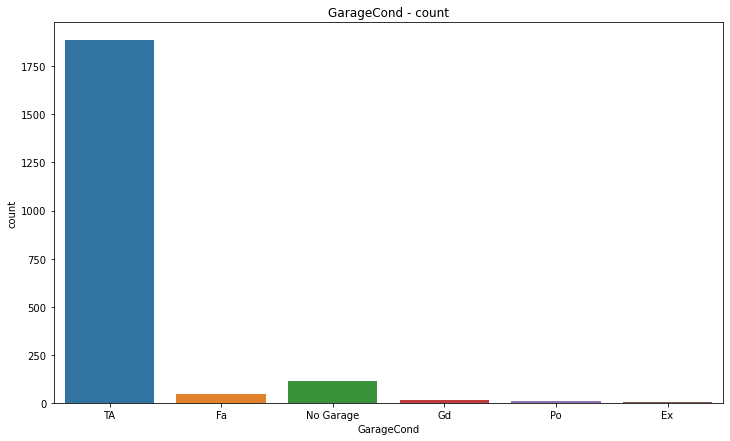

In [1006]:
sns.countplot(data.GarageCond)
plt.title('GarageCond - count')

In [1007]:
data.groupby("GarageCond")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
GarageCond,,,,,,,,
Ex,3.0,125166.666667,4041.451884,120500.0,124000.0,127500.0,127500.0,127500.0
Fa,47.0,109221.085106,39440.028632,40000.0,80000.0,100000.0,137250.0,220000.0
Gd,17.0,187108.235294,71354.376463,118500.0,144000.0,145000.0,274970.0,302000.0
No Garage,113.0,106405.752212,32494.589352,34900.0,85000.0,106250.0,127500.0,200500.0
Po,8.0,110062.500000,21441.677540,67000.0,103625.0,114500.0,121750.0,137000.0
TA,1885.0,183848.974536,65658.153844,35311.0,135000.0,171500.0,221000.0,340000.0


In [1008]:
mod_GC = ols('Property_Sale_Price ~ GarageCond', data = data).fit()
sm.stats.anova_lm(mod_GC)

,df,sum_sq,mean_sq,F,PR(>F)
GarageCond,5.0,9.123947e+11,1.824789e+11,44.921892,3.893997e-44
Residual,2067.0,8.396440e+12,4.062138e+09,NaN,NaN


In [1009]:
tukey_GC = pairwise_tukeyhsd(data.Property_Sale_Price, data.GarageCond, alpha = 0.05)
print(tukey_GC)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05          
  group1    group2    meandiff  p-adj     lower        upper    reject
----------------------------------------------------------------------
       Ex        Fa -15945.5816    0.9 -124202.6326  92311.4695  False
       Ex        Gd  61941.5686 0.6127   -51902.565 175785.7023  False
       Ex No Garage -18760.9145    0.9 -125104.1555  87582.3266  False
       Ex        Po -15104.1667    0.9 -138179.6269 107971.2936  False
       Ex        TA  58682.3079 0.5887  -46360.2859 163724.9016  False
       Fa        Gd  77887.1502  0.001   26435.7327 129338.5677   True
       Fa No Garage  -2815.3329    0.9  -34369.1997  28738.5339  False
       Fa        Po    841.4149    0.9   -68687.935  70370.7648  False
       Fa        TA  74627.8894  0.001   47781.8823 101473.8966   True
       Gd No Garage -80702.4831  0.001 -127994.5985 -33410.3677   True
       Gd        Po -77045.7353 0.0548 -154989.4853    898.0148  False
      

In [1010]:
data["GarageCond"].replace('Fa','No Garage',inplace = True)
data["GarageCond"].replace('Ex','No Garage',inplace = True)
data["GarageCond"].replace('Po','No Garage',inplace = True)
data["GarageCond"].replace('Gd','TA',inplace = True)

In [1011]:
data.GarageCond.value_counts()

TA           1902
No Garage     171
Name: GarageCond, dtype: int64

In [1012]:
data.GarageCond.value_counts().sum()

2073

In [1013]:
GC_TA = data[data.GarageCond == 'TA']
GC_NG = data[data.GarageCond == 'No Garage']
ttest_ind(GC_TA.Property_Sale_Price, GC_NG.Property_Sale_Price)

Ttest_indResult(statistic=14.988371426457498, pvalue=2.7101983787665408e-48)

Text(0.5, 1.0, 'GarageCond - count')

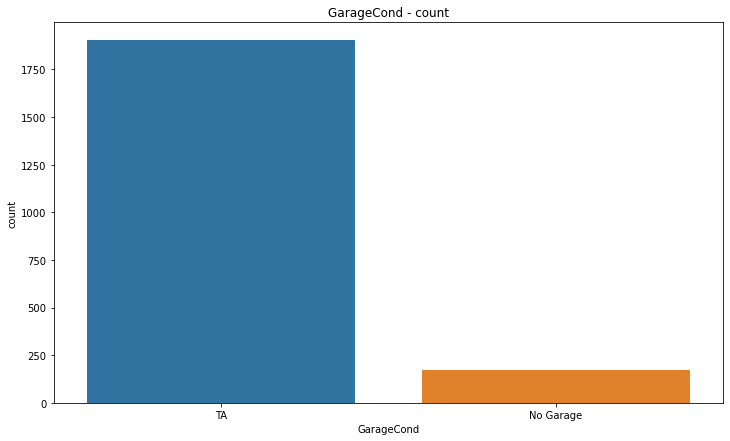

In [1014]:
sns.countplot(x = 'GarageCond', data = data)
plt.title('GarageCond - count')

Text(0.5, 1.0, 'Catplot Of GarageCond vs Property_Sale_Price')

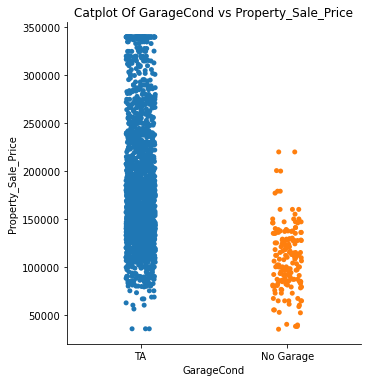

In [1015]:
sns.catplot(x = 'GarageCond', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of GarageCond vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of GarageCond vs Property_Sale_Price')

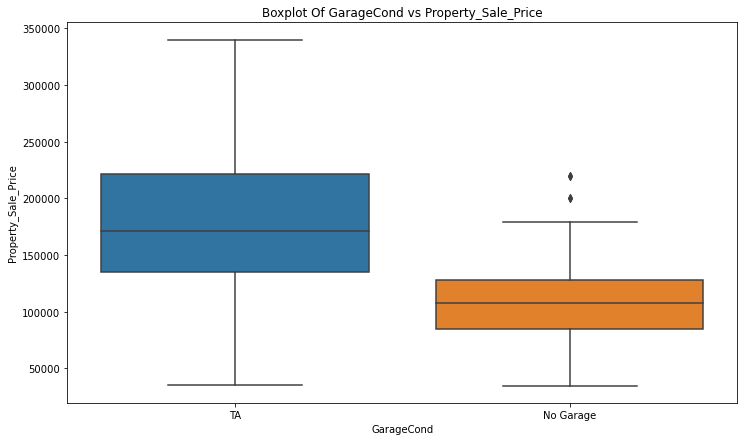

In [1016]:
sns.boxplot(x = 'GarageCond', y = 'Property_Sale_Price', data = data)
plt.title('Boxplot Of GarageCond vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 64) PavedDrive

In [1017]:
data.PavedDrive.isnull().sum()

0

In [1018]:
data.PavedDrive.value_counts()

Y    1913
N     116
P      44
Name: PavedDrive, dtype: int64

In [1019]:
data.PavedDrive.value_counts().sum()

2073

Text(0.5, 1.0, 'PavedDrive - count')

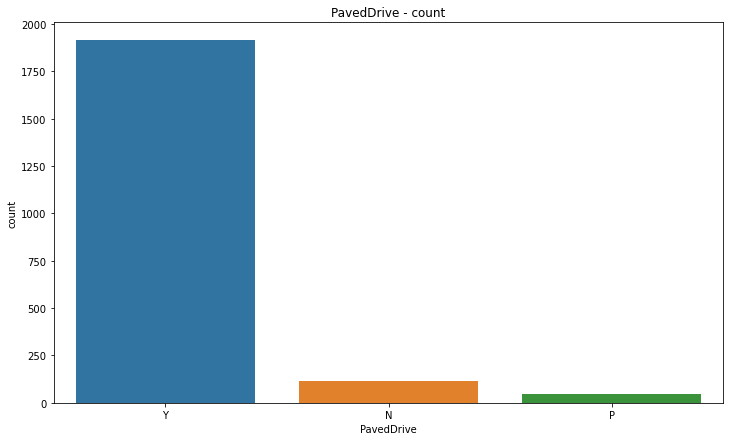

In [1020]:
sns.countplot(data.PavedDrive)
plt.title('PavedDrive - count')

In [1021]:
data.groupby("PavedDrive")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
PavedDrive,,,,,,,,
N,116.0,120372.413793,45249.930170,34900.0,86750.0,113752.0,145225.0,265979.0
P,44.0,135432.954545,31840.985624,79500.0,104250.0,142000.0,160000.0,215000.0
Y,1913.0,182031.964454,66808.834987,35311.0,133900.0,169990.0,220000.0,340000.0


In [1022]:
mod_PD = ols('Property_Sale_Price ~ PavedDrive', data = data).fit()
sm.stats.anova_lm(mod_PD)

,df,sum_sq,mean_sq,F,PR(>F)
PavedDrive,2.0,4.957099e+11,2.478549e+11,58.215417,2.528211e-25
Residual,2070.0,8.813124e+12,4.257548e+09,NaN,NaN


In [1023]:
tukey_PD = pairwise_tukeyhsd(data.Property_Sale_Price, data.PavedDrive, alpha = 0.05)
print(tukey_PD)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj     lower      upper    reject
-------------------------------------------------------------
     N      P 15060.5408 0.3948 -12035.4007 42156.4822  False
     N      Y 61659.5507  0.001  47025.8512 76293.2501   True
     P      Y 46599.0099  0.001  23263.8288  69934.191   True
-------------------------------------------------------------


In [1024]:
data["PavedDrive"].replace('P', 'N',inplace = True)

In [1025]:
data.PavedDrive.value_counts()

Y    1913
N     160
Name: PavedDrive, dtype: int64

In [1026]:
data.PavedDrive.value_counts().sum()

2073

In [1027]:
PD_Y = data[data.PavedDrive == 'Y']
PD_N = data[data.PavedDrive == "N"]
ttest_ind(PD_Y.Property_Sale_Price, PD_N.Property_Sale_Price)

Ttest_indResult(statistic=10.709464579232613, pvalue=4.366284091297098e-26)

Text(0.5, 1.0, 'PavedDrive - count')

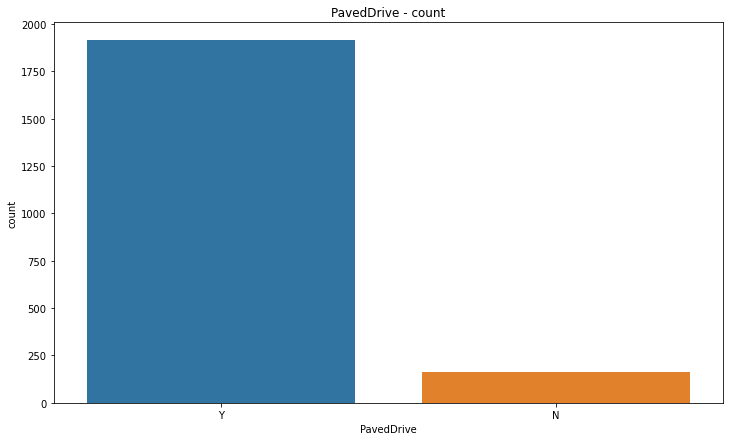

In [1028]:
sns.countplot(x = 'PavedDrive', data = data)
plt.title('PavedDrive - count')

Text(0.5, 1.0, 'Catplot Of PavedDrive vs Property_Sale_Price')

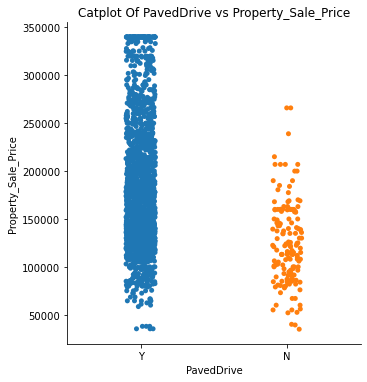

In [1029]:
sns.catplot(x = 'PavedDrive', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of PavedDrive vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of PavedDrive vs Property_Sale_Price')

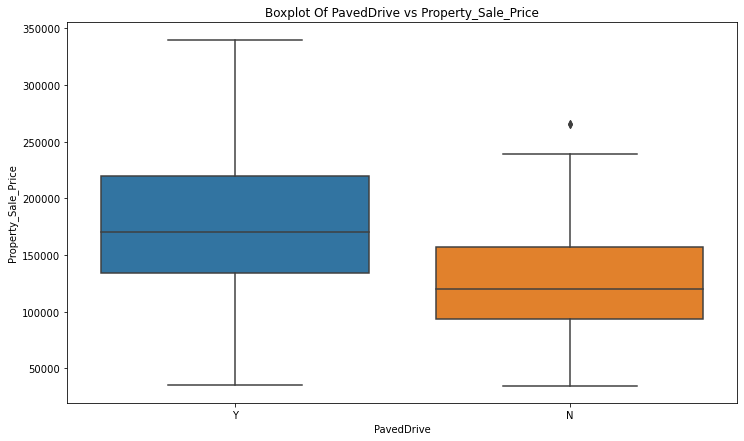

In [1030]:
sns.boxplot(x = 'PavedDrive', y = 'Property_Sale_Price', data = data)
plt.title('Boxplot Of PavedDrive vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 65) WoodDeckSF

In [1031]:
data.WoodDeckSF.isnull().sum()

0

In [1032]:
data.WoodDeckSF.describe()

count    2073.000000
mean       94.168837
std       129.072113
min         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
max       857.000000
Name: WoodDeckSF, dtype: float64

In [1033]:
data.WoodDeckSF.value_counts()

0      1089
192      51
100      51
144      45
168      43
       ... 
35        1
45        1
126       1
362       1
476       1
Name: WoodDeckSF, Length: 274, dtype: int64

In [1034]:
data.WoodDeckSF.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of WoodDeckSF')

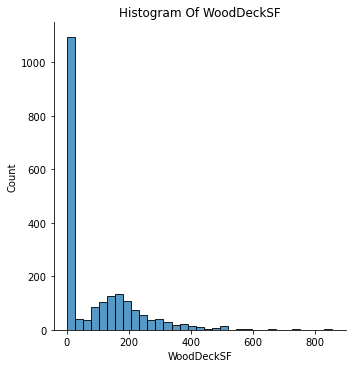

In [1035]:
sns.displot(data.WoodDeckSF)
plt.title('Histogram Of WoodDeckSF')

Text(0.5, 1.0, 'Normality Of WoodDeckSF')

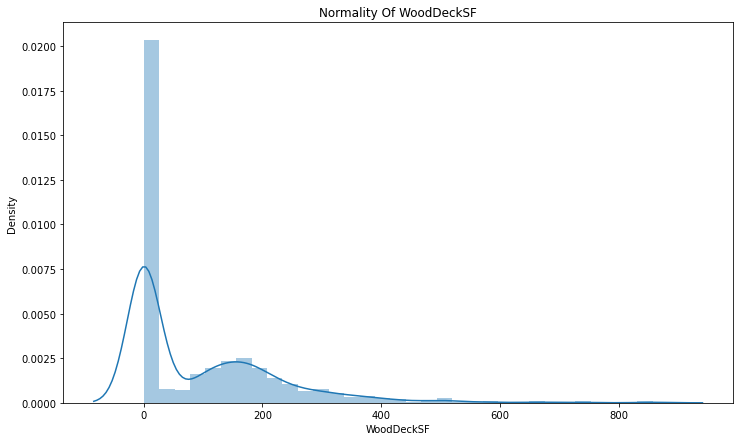

In [1036]:
sns.distplot(data.WoodDeckSF)
plt.title('Normality Of WoodDeckSF')

Text(0.5, 1.0, 'WoodDeckSF - count')

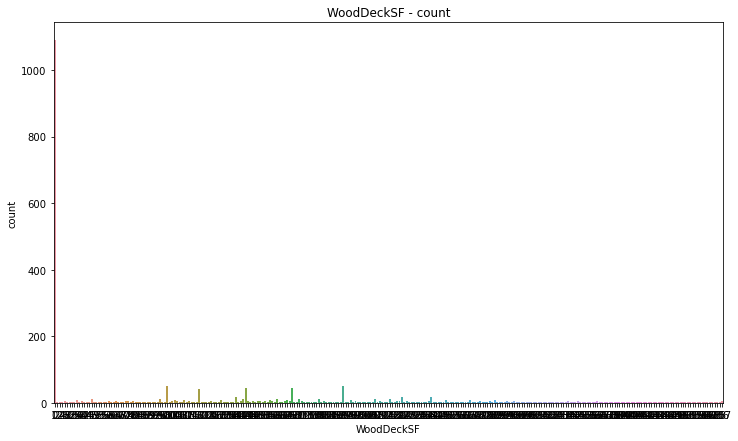

In [1037]:
sns.countplot(data.WoodDeckSF)
plt.title('WoodDeckSF - count')

Text(0.5, 1.0, 'BoxPlot Of WoodDeckSF')

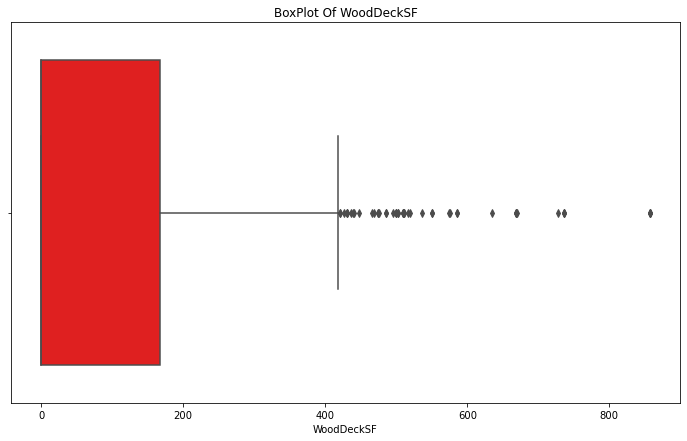

In [1038]:
sns.boxplot(data.WoodDeckSF, color = 'red')
plt.title('BoxPlot Of WoodDeckSF')

In [1039]:
IQR = data.WoodDeckSF.quantile(0.75) - data.WoodDeckSF.quantile(0.25)
IQR

168.0

In [1040]:
UL = data.WoodDeckSF.quantile(0.75) + (1.5*IQR)
UL

420.0

In [1041]:
LL = data.WoodDeckSF.quantile(0.25) - (1.5*IQR)
LL

-252.0

In [1042]:
data.WoodDeckSF[(data.WoodDeckSF > UL)].value_counts().sum()

50

In [1043]:
data.WoodDeckSF[(data.WoodDeckSF < LL)].value_counts().sum()

0

In [1044]:
data['WoodDeckSF'] = np.where(data['WoodDeckSF'] > UL, UL, data['WoodDeckSF'])

Text(0.5, 1.0, 'BoxPlot Of WoodDeckSF')

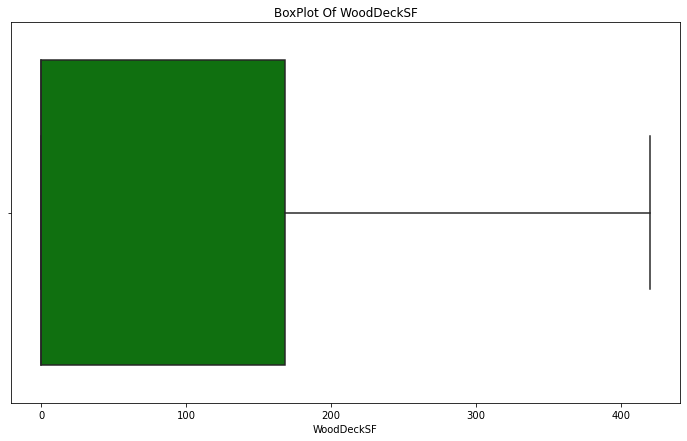

In [1045]:
sns.boxplot(data.WoodDeckSF, color = 'green')
plt.title('BoxPlot Of WoodDeckSF')

Text(0.5, 1.0, 'Normality Of WoodDeckSF')

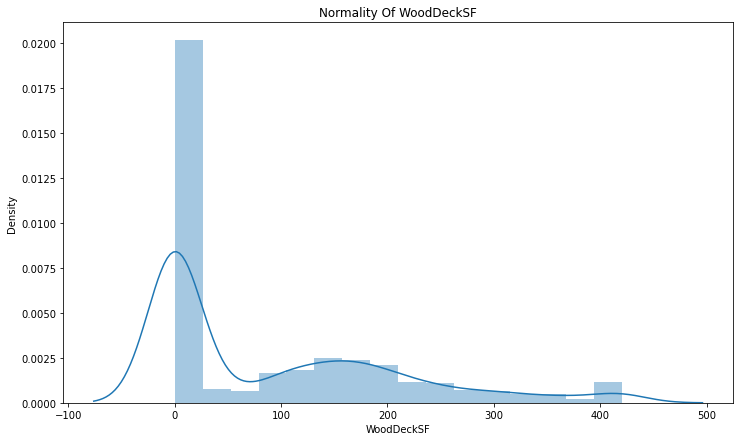

In [1046]:
sns.distplot(data.WoodDeckSF)
plt.title('Normality Of WoodDeckSF')

In [1047]:
np.corrcoef(data.WoodDeckSF, data.Property_Sale_Price)

array([[1.        , 0.34254742],
       [0.34254742, 1.        ]])

**Not Good Predictor**

# 

# 

# 66) OpenPorchSF

In [1048]:
data.OpenPorchSF.isnull().sum()

0

In [1049]:
data.OpenPorchSF.describe()

count    2073.000000
mean       46.035697
std        64.768713
min         0.000000
25%         0.000000
50%        24.000000
75%        67.000000
max       547.000000
Name: OpenPorchSF, dtype: float64

In [1050]:
data.OpenPorchSF.value_counts()

0      939
36      42
20      31
48      30
40      29
      ... 
119      1
123      1
15       1
129      1
547      1
Name: OpenPorchSF, Length: 202, dtype: int64

In [1051]:
data.OpenPorchSF.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of OpenPorchSF')

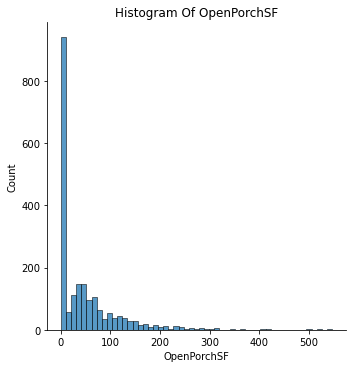

In [1052]:
sns.displot(data.OpenPorchSF)
plt.title('Histogram Of OpenPorchSF')

Text(0.5, 1.0, 'Normality Of OpenPorchSF')

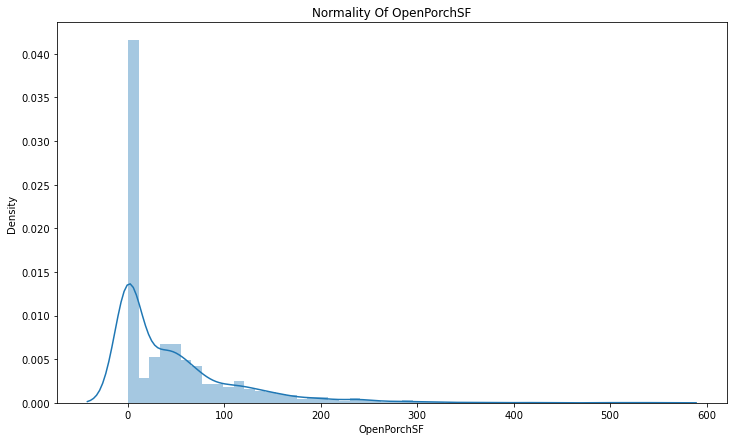

In [1053]:
sns.distplot(data.OpenPorchSF)
plt.title('Normality Of OpenPorchSF')

Text(0.5, 1.0, 'OpenPorchSF - count')

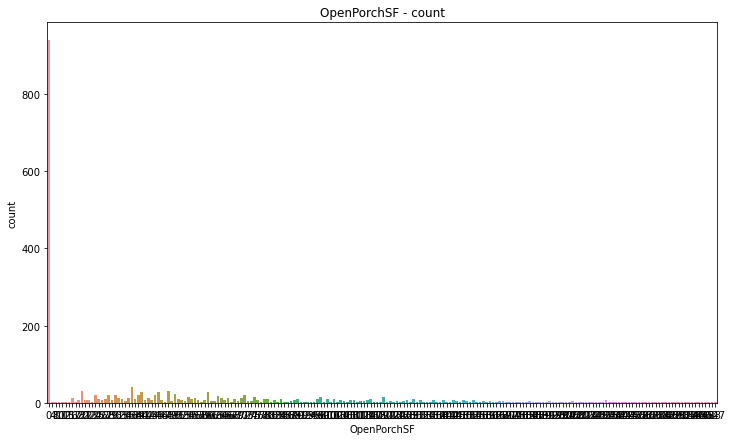

In [1054]:
sns.countplot(data.OpenPorchSF)
plt.title('OpenPorchSF - count')

Text(0.5, 1.0, 'BoxPlot Of OpenPorchSF')

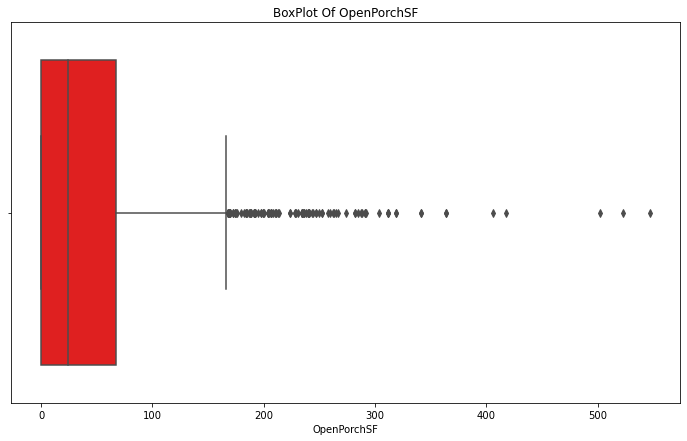

In [1055]:
sns.boxplot(data.OpenPorchSF, color = 'red')
plt.title('BoxPlot Of OpenPorchSF')

In [1056]:
IQR = data.OpenPorchSF.quantile(0.75) - data.OpenPorchSF.quantile(0.25)
IQR

67.0

In [1057]:
UL = data.OpenPorchSF.quantile(0.75) + (1.5*IQR)
UL

167.5

In [1058]:
LL = data.OpenPorchSF.quantile(0.25) - (1.5*IQR)
LL

-100.5

In [1059]:
data.OpenPorchSF[(data.OpenPorchSF > UL)].value_counts().sum()

118

In [1060]:
data.OpenPorchSF[(data.OpenPorchSF < LL)].value_counts().sum()

0

In [1061]:
data['OpenPorchSF'] = np.where(data['OpenPorchSF'] > UL, UL, data['OpenPorchSF'])

Text(0.5, 1.0, 'BoxPlot Of OpenPorchSF')

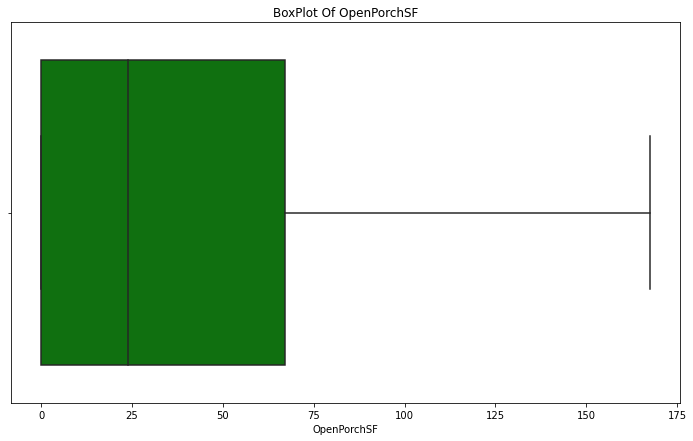

In [1062]:
sns.boxplot(data.OpenPorchSF, color = 'green')
plt.title('BoxPlot Of OpenPorchSF')

Text(0.5, 1.0, 'Normality Of OpenPorchSF')

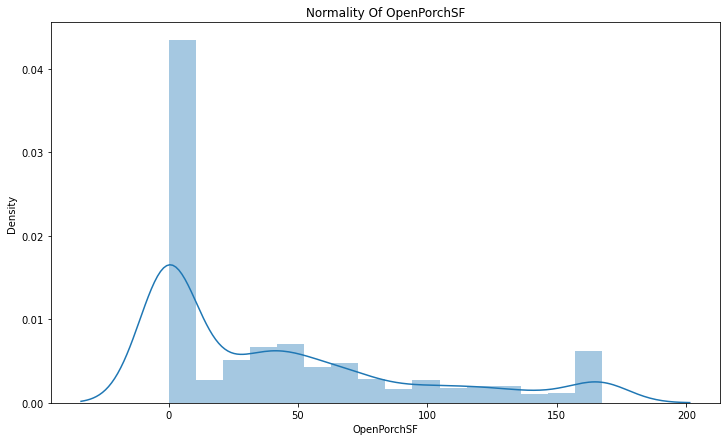

In [1063]:
sns.distplot(data.OpenPorchSF)
plt.title('Normality Of OpenPorchSF')

In [1064]:
np.corrcoef(data.OpenPorchSF, data.Property_Sale_Price)

array([[1.        , 0.42627987],
       [0.42627987, 1.        ]])

**Not Good Predictor**

# 

# 

# 67) EnclosedPorch

In [1065]:
data.EnclosedPorch.isnull().sum()

0

In [1066]:
data.EnclosedPorch.describe()

count    2073.000000
mean       21.029908
std        59.569928
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       552.000000
Name: EnclosedPorch, dtype: float64

In [1067]:
data.EnclosedPorch.value_counts()

0      1790
112      23
216       8
192       7
154       7
       ... 
248       1
254       1
268       1
272       1
301       1
Name: EnclosedPorch, Length: 120, dtype: int64

In [1068]:
data.EnclosedPorch.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of EnclosedPorch')

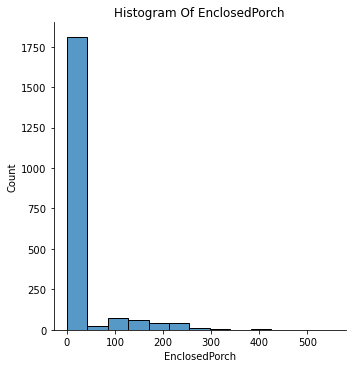

In [1069]:
sns.displot(data.EnclosedPorch)
plt.title('Histogram Of EnclosedPorch')

Text(0.5, 1.0, 'Normality Of EnclosedPorch')

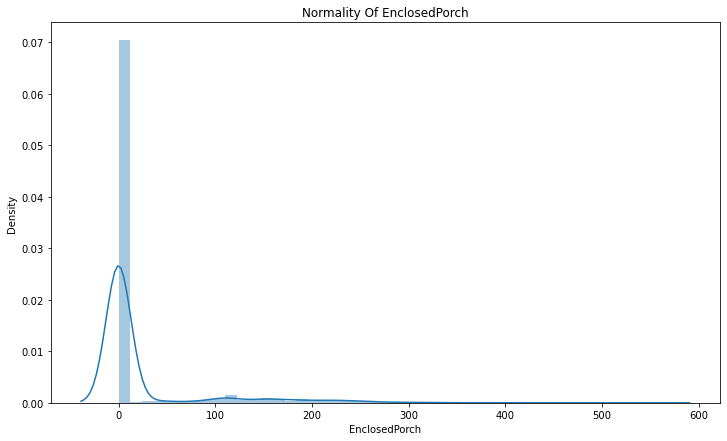

In [1070]:
sns.distplot(data.EnclosedPorch)
plt.title('Normality Of EnclosedPorch')

Text(0.5, 1.0, 'EnclosedPorch - count')

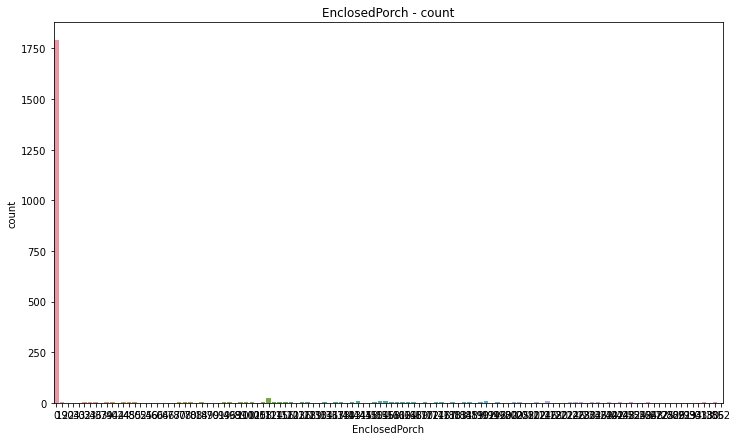

In [1071]:
sns.countplot(data.EnclosedPorch)
plt.title('EnclosedPorch - count')

Text(0.5, 1.0, 'BoxPlot Of EnclosedPorch')

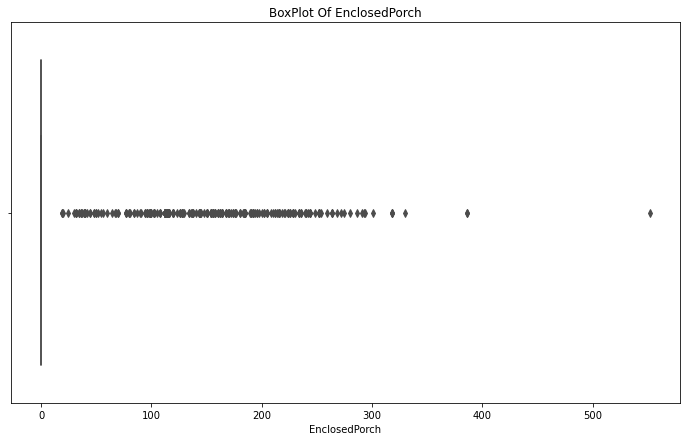

In [1072]:
sns.boxplot(data.EnclosedPorch, color = 'red')
plt.title('BoxPlot Of EnclosedPorch')

In [1073]:
IQR = data.EnclosedPorch.quantile(0.75) - data.EnclosedPorch.quantile(0.25)
IQR

0.0

In [1074]:
UL = data.EnclosedPorch.quantile(0.75) + (1.5*IQR)
UL

0.0

In [1075]:
LL = data.EnclosedPorch.quantile(0.25) - (1.5*IQR)
LL

0.0

In [1076]:
np.corrcoef(data.EnclosedPorch, data.Property_Sale_Price)

array([[ 1.        , -0.11479018],
       [-0.11479018,  1.        ]])

In [1077]:
mod_EP = ols('Property_Sale_Price ~ EnclosedPorch', data = data).fit()
sm.stats.anova_lm(mod_EP)

,df,sum_sq,mean_sq,F,PR(>F)
EnclosedPorch,1.0,1.226605e+11,1.226605e+11,27.653506,1.600557e-07
Residual,2071.0,9.186174e+12,4.435622e+09,NaN,NaN


In [1078]:
tukey_EP = pairwise_tukeyhsd(data.Property_Sale_Price, data.EnclosedPorch, alpha = 0.05)
print(tukey_EP)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
     0     19   37657.3642    0.9 -165235.9802 240550.7087  False
     0     20  -60342.6358    0.9 -347197.0841 226511.8126  False
     0     24 -100342.6358    0.9 -387197.0841 186511.8126  False
     0     30  -78342.6358    0.9 -365197.0841 208511.8126  False
     0     32  -89167.6358    0.9  -232714.933  54379.6615  False
     0     34  -63667.6358    0.9 -266560.9802 139225.7087  False
     0     36  -32892.6358    0.9 -235785.9802 170000.7087  False
     0     37  157657.3642    0.9 -129197.0841 444511.8126  False
     0     39   -1592.6358    0.9 -204485.9802 201300.7087  False
     0     40  -21225.9691    0.9 -186933.9072 144481.9691  False
     0     42  -13342.6358    0.9 -300197.0841 273511.8126  False
     0     44  -18842.6358    0.9 -221735.9802 184050.7087  False
     0    

Text(0.5, 1.0, 'Scatter Plot Of EnclosedPorch vs Property_Sale_Price')

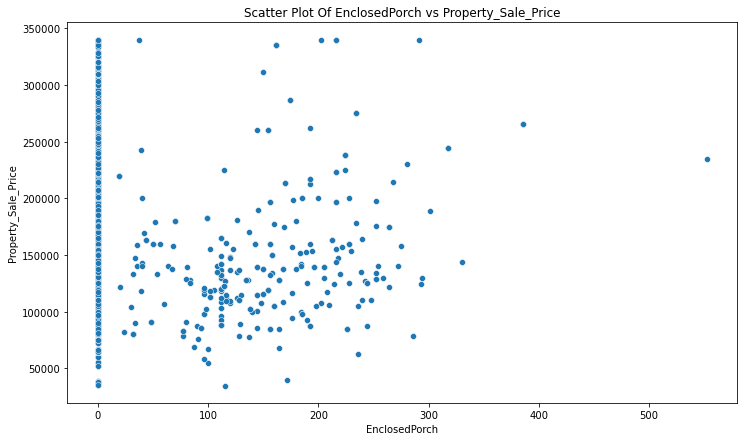

In [1079]:
sns.scatterplot(x = data['EnclosedPorch'], y = data.Property_Sale_Price, data = data )
plt.xlabel('EnclosedPorch')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter Plot Of EnclosedPorch vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 68) ThrSsnPorch

In [1080]:
data['ThrSsnPorch'].isnull().sum()

0

In [1081]:
data['ThrSsnPorch'].describe()

count    2073.000000
mean        2.979257
std        26.817218
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: ThrSsnPorch, dtype: float64

In [1082]:
data['ThrSsnPorch'].value_counts()

0      2041
168       6
23        3
304       2
182       2
180       2
216       2
162       2
144       2
196       1
96        1
238       1
290       1
140       1
320       1
508       1
130       1
153       1
245       1
407       1
Name: ThrSsnPorch, dtype: int64

In [1083]:
data['ThrSsnPorch'].value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of ThrSsnPorch')

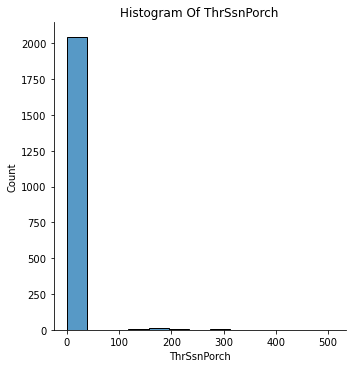

In [1084]:
sns.displot(data['ThrSsnPorch'])
plt.title('Histogram Of ThrSsnPorch')

Text(0.5, 1.0, 'Normality Of ThrSsnPorch')

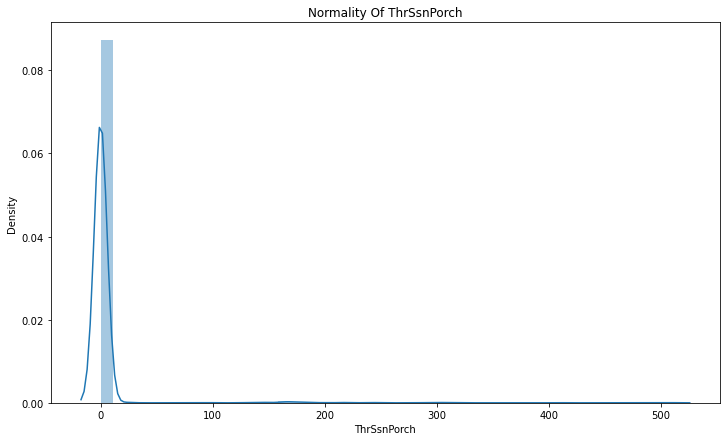

In [1085]:
sns.distplot(data['ThrSsnPorch'])
plt.title('Normality Of ThrSsnPorch')

Text(0.5, 1.0, 'ThrSsnPorch - count')

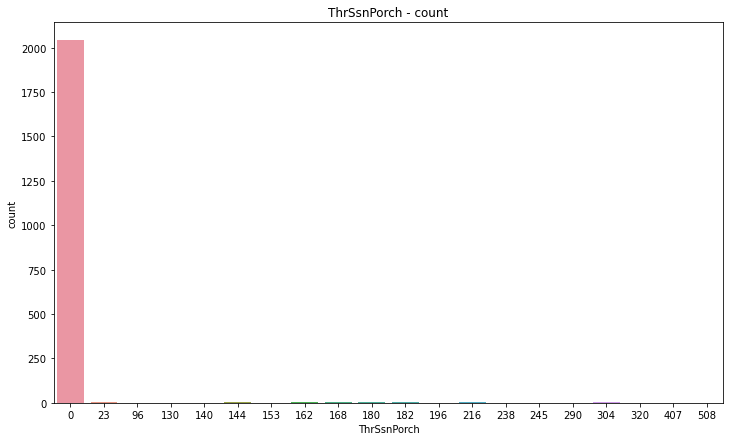

In [1086]:
sns.countplot(data['ThrSsnPorch'])
plt.title('ThrSsnPorch - count')

Text(0.5, 1.0, 'BoxPlot Of ThrSsnPorch')

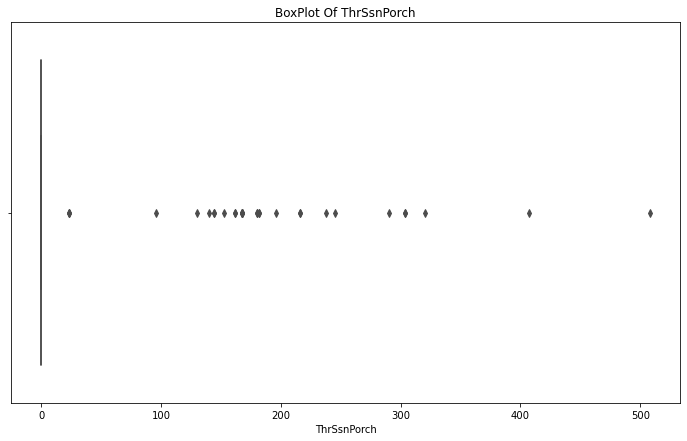

In [1087]:
sns.boxplot(data['ThrSsnPorch'], color = 'red')
plt.title('BoxPlot Of ThrSsnPorch')

In [1088]:
IQR = data['ThrSsnPorch'].quantile(0.75) - data['ThrSsnPorch'].quantile(0.25)
IQR

0.0

In [1089]:
UL = data['ThrSsnPorch'].quantile(0.75) + (1.5*IQR)
UL

0.0

In [1090]:
LL = data['ThrSsnPorch'].quantile(0.25) - (1.5*IQR)
LL

0.0

In [1091]:
np.corrcoef(data['ThrSsnPorch'], data.Property_Sale_Price)

array([[1.        , 0.05601521],
       [0.05601521, 1.        ]])

In [1092]:
tukey_EP = pairwise_tukeyhsd(data.Property_Sale_Price, data['ThrSsnPorch'], alpha = 0.05)
print(tukey_EP)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
     0     23   -7166.5546    0.9 -144350.1147 130017.0054  False
     0     96    2743.4454    0.9 -234749.1751 240236.0659  False
     0    130    2843.4454    0.9 -234649.1751 240336.0659  False
     0    140  -42156.5546    0.9 -279649.1751 195336.0659  False
     0    144   34343.4454    0.9 -133630.3117 202317.2024  False
     0    153  162843.4454 0.6147  -74649.1751 400336.0659  False
     0    162  -27656.5546    0.9 -195630.3117 140317.2024  False
     0    168   43176.7787    0.9  -53897.8072 140251.3646  False
     0    180  -42156.5546    0.9 -210130.3117 125817.2024  False
     0    182   44843.4454    0.9 -123130.3117 212817.2024  False
     0    196   51343.4454    0.9 -186149.1751 288836.0659  False
     0    216    7343.4454    0.9 -160630.3117 175317.2024  False
     0    

Text(0.5, 1.0, 'Scatter Plot Of ThrSsnPorch vs Property_Sale_Price')

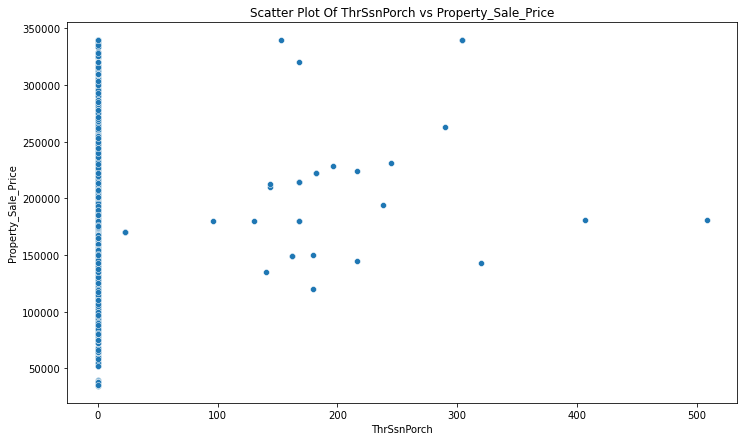

In [1093]:
sns.scatterplot(x = data['ThrSsnPorch'], y = data.Property_Sale_Price, data = data )
plt.xlabel('ThrSsnPorch')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter Plot Of ThrSsnPorch vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 69) ScreenPorch

In [1094]:
data.ScreenPorch.isnull().sum()

0

In [1095]:
data.ScreenPorch.describe()

count    2073.000000
mean       14.552340
std        54.099626
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       480.000000
Name: ScreenPorch, dtype: float64

In [1096]:
data.ScreenPorch.value_counts()

0      1912
168       8
120       7
192       7
224       6
       ... 
374       1
396       1
410       1
440       1
385       1
Name: ScreenPorch, Length: 76, dtype: int64

In [1097]:
data.ScreenPorch.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of ScreenPorch')

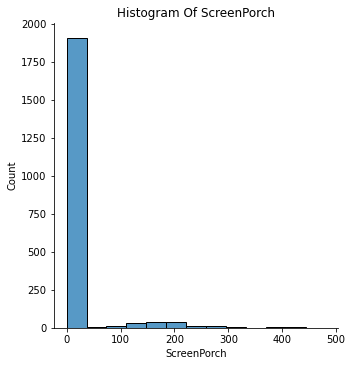

In [1098]:
sns.displot(data.ScreenPorch)
plt.title('Histogram Of ScreenPorch')

Text(0.5, 1.0, 'Normality Of ScreenPorch')

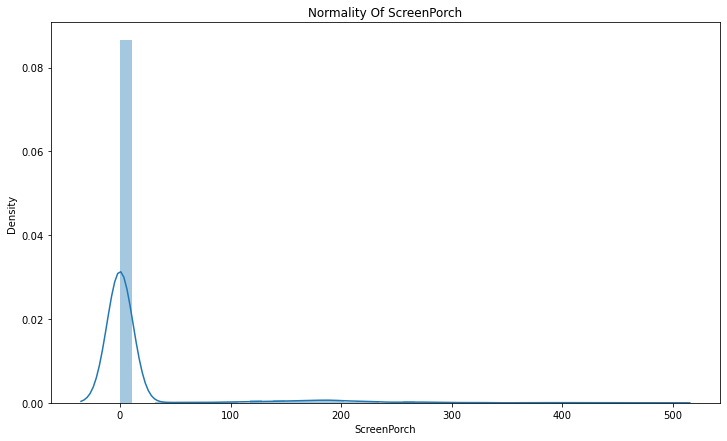

In [1099]:
sns.distplot(data.ScreenPorch)
plt.title('Normality Of ScreenPorch')

Text(0.5, 1.0, 'ScreenPorch - count')

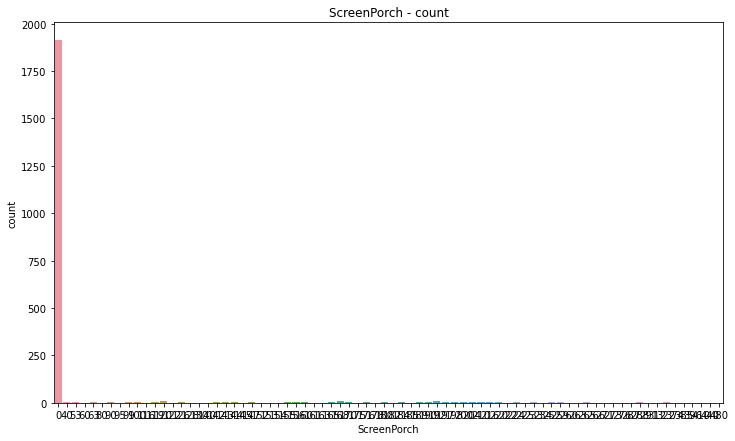

In [1100]:
sns.countplot(data.ScreenPorch)
plt.title('ScreenPorch - count')

Text(0.5, 1.0, 'BoxPlot Of ScreenPorch')

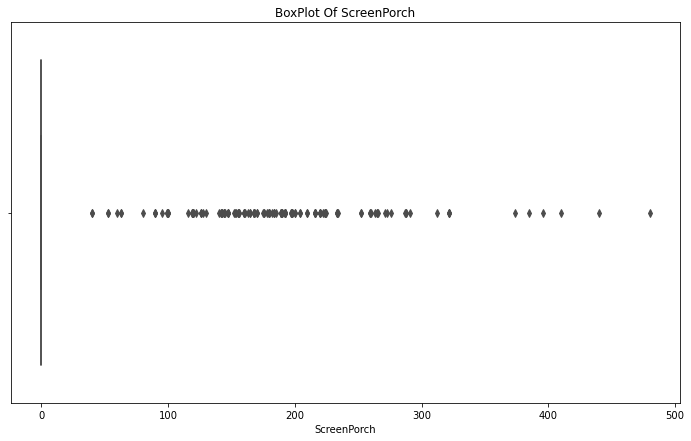

In [1101]:
sns.boxplot(data.ScreenPorch, color = 'red')
plt.title('BoxPlot Of ScreenPorch')

In [1102]:
IQR = data.ScreenPorch.quantile(0.75) - data.ScreenPorch.quantile(0.25)
IQR

0.0

In [1103]:
UL = data.ScreenPorch.quantile(0.75) + (1.5*IQR)
UL

0.0

In [1104]:
LL = data.ScreenPorch.quantile(0.25) - (1.5*IQR)
LL

0.0

In [1105]:
np.corrcoef(data.ScreenPorch, data.Property_Sale_Price)

array([[1.        , 0.10780137],
       [0.10780137, 1.        ]])

Text(0.5, 1.0, 'Scatter Plot Of ScreenPorch vs Property_Sale_Price')

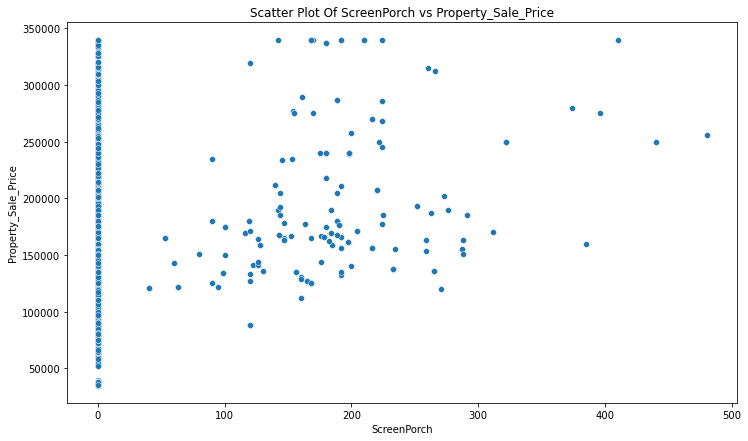

In [1106]:
sns.scatterplot(x = data['ScreenPorch'], y = data.Property_Sale_Price, data = data )
plt.xlabel('ScreenPorch')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter Plot Of ScreenPorch vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 70) PoolArea

In [1107]:
data.PoolArea.isnull().sum()

0

In [1108]:
data.PoolArea.describe()

count    2073.000000
mean        2.299083
std        37.411031
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       738.000000
Name: PoolArea, dtype: float64

In [1109]:
data.PoolArea.value_counts()

0      2065
738       2
480       1
512       1
576       1
648       1
519       1
555       1
Name: PoolArea, dtype: int64

In [1110]:
data.PoolArea.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of PoolArea')

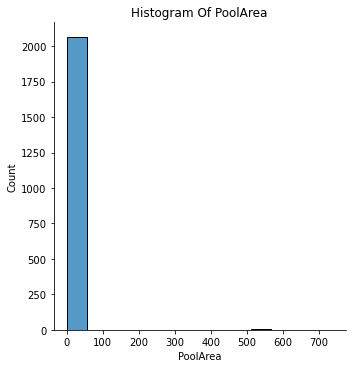

In [1111]:
sns.displot(data.PoolArea)
plt.title('Histogram Of PoolArea')

Text(0.5, 1.0, 'Normality Of PoolArea')

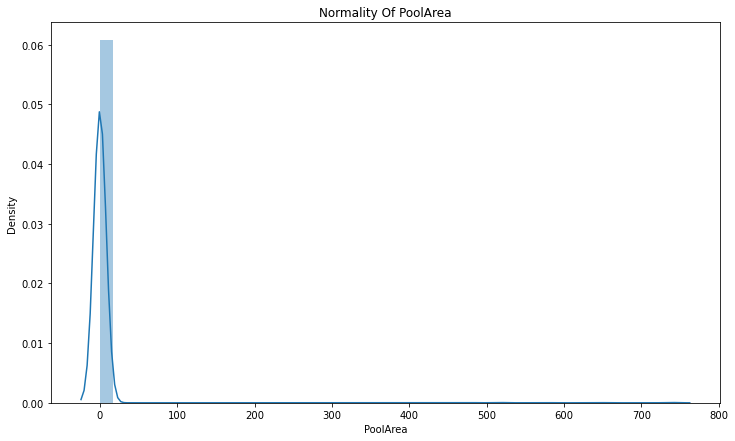

In [1112]:
sns.distplot(data.PoolArea)
plt.title('Normality Of PoolArea')

Text(0.5, 1.0, 'PoolArea - count')

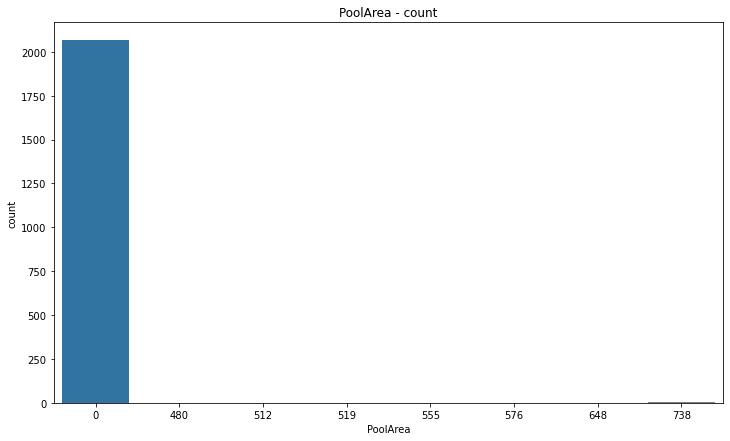

In [1113]:
sns.countplot(data.PoolArea)
plt.title('PoolArea - count')

Text(0.5, 1.0, 'BoxPlot Of PoolArea')

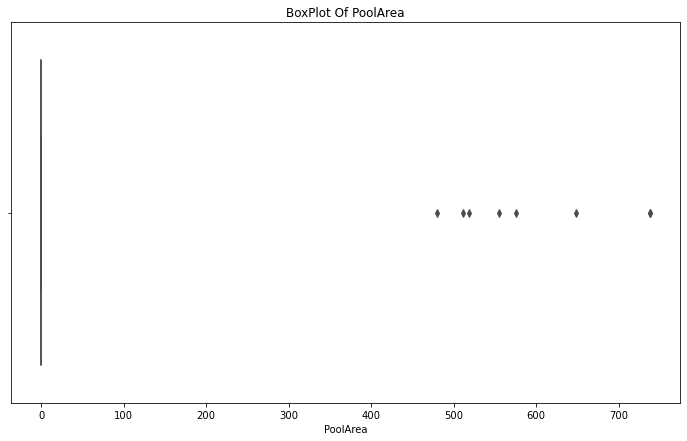

In [1114]:
sns.boxplot(data.PoolArea, color = 'red')
plt.title('BoxPlot Of PoolArea')

In [1115]:
IQR = data.PoolArea.quantile(0.75) - data.PoolArea.quantile(0.25)
IQR

0.0

In [1116]:
UL = data.PoolArea.quantile(0.75) + (1.5*IQR)
UL

0.0

In [1117]:
LL = data.PoolArea.quantile(0.25) - (1.5*IQR)
LL

0.0

In [1118]:
np.corrcoef(data.PoolArea, data.Property_Sale_Price)

array([[1.        , 0.05597028],
       [0.05597028, 1.        ]])

Text(0.5, 1.0, 'Scatter Plot Of PoolArea vs Property_Sale_Price')

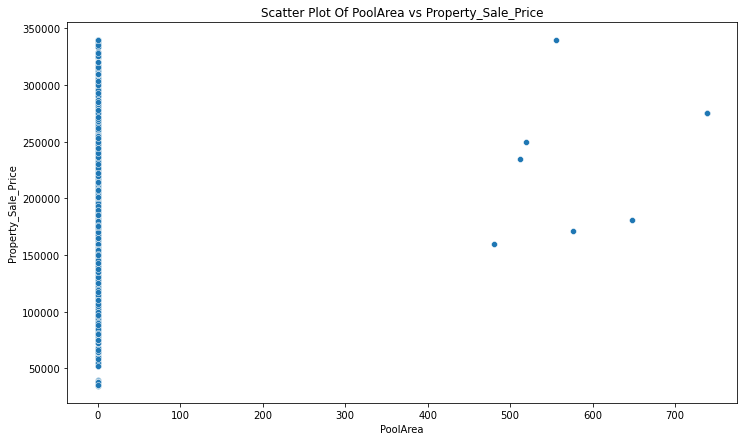

In [1119]:
sns.scatterplot(x = data['PoolArea'], y = data.Property_Sale_Price, data = data )
plt.xlabel('PoolArea')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter Plot Of PoolArea vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 71) PoolQC

In [1120]:
data.PoolQC.isnull().sum()

2065

In [1121]:
data.PoolQC.dtype

dtype('O')

In [1122]:
data['PoolQC'] = data['PoolQC'].fillna('No Pool')

In [1123]:
data.PoolQC.isnull().sum()

0

In [1124]:
data.PoolQC.value_counts()

No Pool    2065
Gd            4
Ex            2
Fa            2
Name: PoolQC, dtype: int64

In [1125]:
data.PoolQC.value_counts().sum()

2073

Text(0.5, 1.0, 'PoolQC - count')

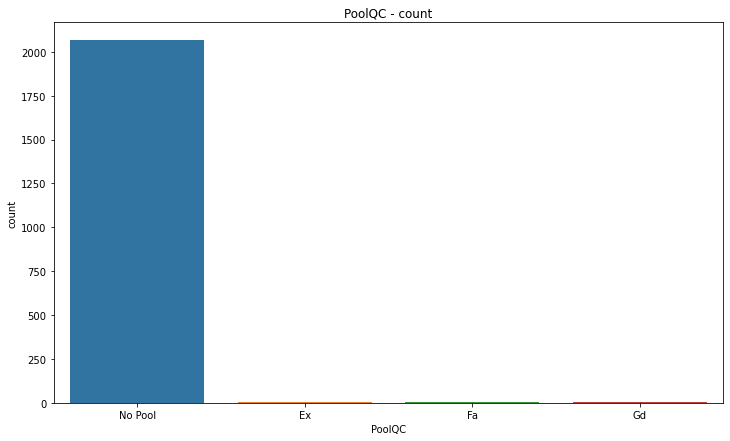

In [1126]:
sns.countplot(data.PoolQC)
plt.title('PoolQC - count')

In [1127]:
data.groupby("PoolQC")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
PoolQC,,,,,,,,
Ex,2.0,287500.000000,74246.212025,235000.0,261250.0,287500.0,313750.0,340000.0
Fa,2.0,215500.000000,48790.367902,181000.0,198250.0,215500.0,232750.0,250000.0
Gd,4.0,220235.000000,63361.873131,160000.0,168250.0,222985.0,274970.0,274970.0
No Pool,2065.0,177366.807748,66960.899857,34900.0,130000.0,163500.0,214000.0,340000.0


In [1128]:
mod_PQC = ols('Property_Sale_Price ~ PoolQC', data = data).fit()
sm.stats.anova_lm(mod_PQC)

,df,sum_sq,mean_sq,F,PR(>F)
PoolQC,3.0,3.441199e+10,1.147066e+10,2.558952,0.053479
Residual,2069.0,9.274422e+12,4.482563e+09,NaN,NaN


In [1129]:
tukey_PQC = pairwise_tukeyhsd(data.Property_Sale_Price, data.PoolQC, alpha = 0.05)
print(tukey_PQC)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
group1  group2   meandiff   p-adj     lower        upper    reject
------------------------------------------------------------------
    Ex      Fa     -72000.0 0.6816 -244141.7394 100141.7394  False
    Ex      Gd     -67265.0 0.6341 -216344.1193  81814.1193  False
    Ex No Pool -110133.1923 0.0926 -231914.7148  11648.3303  False
    Fa      Gd       4735.0    0.9 -144344.1193 153814.1193  False
    Fa No Pool  -38133.1923 0.8333 -159914.7148  83648.3303  False
    Gd No Pool  -42868.1923 0.5672 -129022.3832  43285.9987  False
------------------------------------------------------------------


**Not Good Predictor**

# 

# 

# 72) Fence

In [1130]:
data.Fence.isnull().sum()

1669

In [1131]:
data.Fence.dtype

dtype('O')

In [1132]:
data['Fence'] = data['Fence'].fillna('No Fence')

In [1133]:
data.Fence.isnull().sum()

0

In [1134]:
data.Fence.value_counts()

No Fence    1669
MnPrv        233
GdPrv         88
GdWo          69
MnWw          14
Name: Fence, dtype: int64

In [1135]:
data.Fence.value_counts().sum()

2073

Text(0.5, 1.0, 'Fence - count')

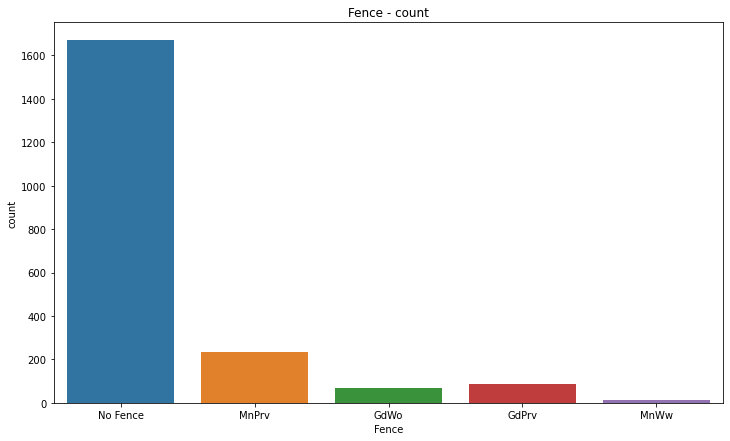

In [1136]:
sns.countplot(data.Fence)
plt.title('Fence - count')

In [1137]:
data.groupby("Fence")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
Fence,,,,,,,,
GdPrv,88.0,177929.431818,45501.339638,108000.0,145900.0,168000.0,192912.5,340000.0
GdWo,69.0,134575.115942,48914.077933,34900.0,116000.0,133700.0,150000.0,340000.0
MnPrv,233.0,145314.896996,44602.481546,40000.0,119900.0,135000.0,157000.0,340000.0
MnWw,14.0,136710.714286,24206.040080,110000.0,123475.0,127450.0,144000.0,187000.0
No Fence,1669.0,184202.279209,69384.510721,35311.0,134900.0,174000.0,225000.0,340000.0


In [1138]:
mod_F = ols('Property_Sale_Price ~ Fence', data = data).fit()
sm.stats.anova_lm(mod_F)

,df,sum_sq,mean_sq,F,PR(>F)
Fence,4.0,4.667595e+11,1.166899e+11,27.291632,4.190861e-22
Residual,2068.0,8.842075e+12,4.275665e+09,NaN,NaN


In [1139]:
tukey_F = pairwise_tukeyhsd(data.Property_Sale_Price, data.Fence, alpha = 0.05)
print(tukey_F)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1  group2    meandiff  p-adj     lower       upper    reject
-----------------------------------------------------------------
 GdPrv     GdWo -43354.3159  0.001 -72060.5163 -14648.1154   True
 GdPrv    MnPrv -32614.5348  0.001 -54951.5422 -10277.5274   True
 GdPrv     MnWw -41218.7175 0.1834 -92585.9894  10148.5543  False
 GdPrv No Fence   6272.8474    0.9 -13252.9215  25798.6163  False
  GdWo    MnPrv  10739.7811 0.7253 -13727.8957  35207.4578  False
  GdWo     MnWw   2135.5983    0.9 -50193.3795  54464.5762  False
  GdWo No Fence  49627.1633  0.001  27695.8852  71558.4413   True
 MnPrv     MnWw  -8604.1827    0.9 -57728.6967  40520.3313  False
 MnPrv No Fence  38887.3822  0.001  26402.3147  51372.4498   True
  MnWw No Fence  47491.5649 0.0534   -420.1417  95403.2715  False
-----------------------------------------------------------------


In [1140]:
data["Fence"].replace('GdPrv', 'No Fence',inplace = True)
data["Fence"].replace('MnWw', 'GdWo',inplace = True)

In [1141]:
data.Fence.value_counts()

No Fence    1757
MnPrv        233
GdWo          83
Name: Fence, dtype: int64

In [1142]:
data.Fence.value_counts().sum()

2073

In [1143]:
mod_F = ols('Property_Sale_Price ~ Fence', data = data).fit()
sm.stats.anova_lm(mod_F)

,df,sum_sq,mean_sq,F,PR(>F)
Fence,2.0,4.634171e+11,2.317086e+11,54.224322,1.113846e-23
Residual,2070.0,8.845417e+12,4.273148e+09,NaN,NaN


In [1144]:
tukey_F = pairwise_tukeyhsd(data.Property_Sale_Price, data.Fence, alpha = 0.05)
print(tukey_F)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1  group2   meandiff  p-adj    lower      upper    reject
--------------------------------------------------------------
  GdWo    MnPrv 10379.5596 0.4303 -9218.8274 29977.9467  False
  GdWo No Fence  48952.764  0.001 31730.9942 66174.5338   True
 MnPrv No Fence 38573.2043  0.001 27883.7264 49262.6822   True
--------------------------------------------------------------


In [1145]:
data["Fence"].replace('GdWo', 'MnPrv',inplace = True)

In [1146]:
data.Fence.value_counts()

No Fence    1757
MnPrv        316
Name: Fence, dtype: int64

In [1147]:
data.Fence.value_counts().sum()

2073

In [1148]:
F_NF = data[data.Fence == 'No Fence']
F_M = data[data.Fence == 'MnPrv']
ttest_ind(F_NF.Property_Sale_Price, F_M.Property_Sale_Price)

Ttest_indResult(statistic=10.338164977422487, pvalue=1.8417334925793386e-24)

Text(0.5, 1.0, 'Fence - count')

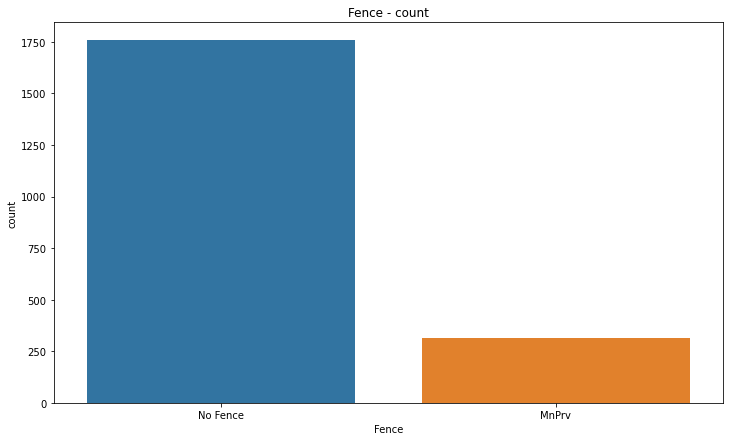

In [1149]:
sns.countplot(x = 'Fence', data = data)
plt.title('Fence - count')

Text(0.5, 1.0, 'Catplot Of Fence vs Property_Sale_Price')

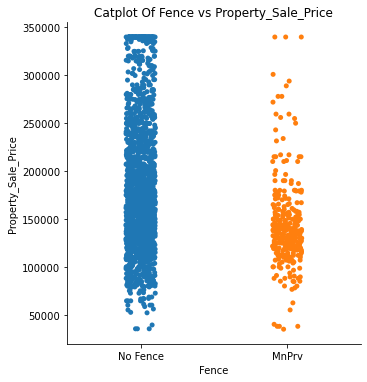

In [1150]:
sns.catplot(x = 'Fence', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of Fence vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of Fence vs Property_Sale_Price')

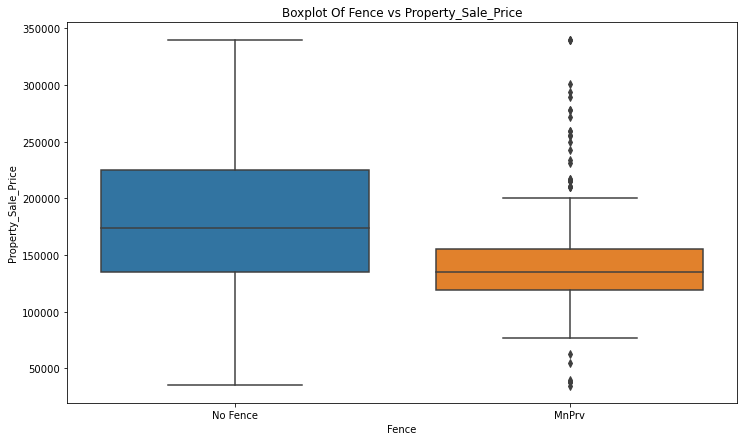

In [1151]:
sns.boxplot(x = 'Fence', y = 'Property_Sale_Price', data = data)
plt.title('Boxplot Of Fence vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 73) MiscFeature

In [1152]:
data.MiscFeature.isnull().sum()

1993

In [1153]:
data.MiscFeature.dtype

dtype('O')

In [1154]:
data['MiscFeature'] = data['MiscFeature'].fillna('Nothing')

In [1155]:
data.MiscFeature.isnull().sum()

0

In [1156]:
data.MiscFeature.value_counts()

Nothing    1993
Shed         74
Othr          3
Gar2          2
TenC          1
Name: MiscFeature, dtype: int64

In [1157]:
data.MiscFeature.value_counts().sum()

2073

Text(0.5, 1.0, 'MiscFeature - count')

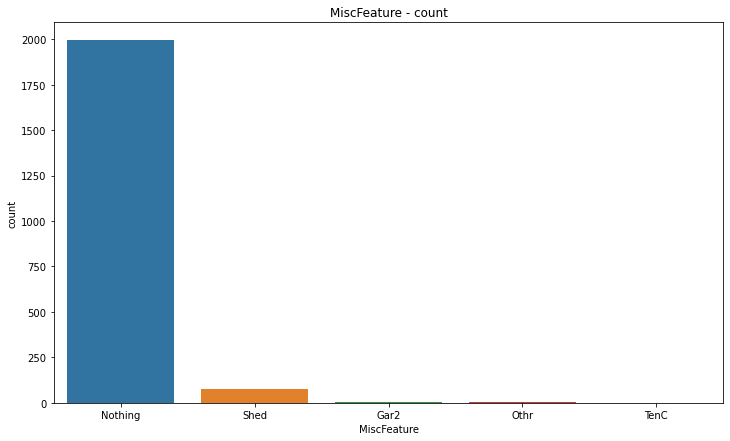

In [1158]:
sns.countplot(data.MiscFeature)
plt.title('MiscFeature - count')

In [1159]:
data.groupby("MiscFeature")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
MiscFeature,,,,,,,,
Gar2,2.0,170750.000000,27223.611076,151500.0,161125.0,170750.0,180375.0,190000.0
Nothing,1993.0,178719.746613,67333.487490,34900.0,130500.0,165000.0,215000.0,340000.0
Othr,3.0,107000.000000,45033.320997,55000.0,94000.0,133000.0,133000.0,133000.0
Shed,74.0,149303.283784,51107.030848,55993.0,114887.5,139950.0,172000.0,277000.0
TenC,1.0,250000.000000,NaN,250000.0,250000.0,250000.0,250000.0,250000.0


In [1160]:
mod_MF = ols('Property_Sale_Price ~ MiscFeature', data = data).fit()
sm.stats.anova_lm(mod_MF)

,df,sum_sq,mean_sq,F,PR(>F)
MiscFeature,4.0,8.203957e+10,2.050989e+10,4.596879,0.001071
Residual,2068.0,9.226795e+12,4.461700e+09,NaN,NaN


In [1161]:
tukey_MF = pairwise_tukeyhsd(data.Property_Sale_Price, data.MiscFeature, alpha = 0.05)
print(tukey_MF)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff  p-adj     lower        upper    reject
------------------------------------------------------------------
   Gar2 Nothing   7969.7466    0.9 -121046.0559 136985.5491  False
   Gar2    Othr    -63750.0  0.812 -230225.1758 102725.1758  False
   Gar2    Shed -21446.7162    0.9 -152128.7978 109235.3654  False
   Gar2    TenC     79250.0 0.8555 -144099.8858 302599.8858  False
Nothing    Othr -71719.7466 0.3406 -177087.1062  33647.6129  False
Nothing    Shed -29416.4628 0.0019  -51005.8758  -7827.0498   True
Nothing    TenC  71280.2534 0.7999 -111129.9102  253690.417  False
   Othr    Shed  42303.2838  0.795  -65097.8783 149704.4459  False
   Othr    TenC    143000.0 0.3431  -67576.2918 353576.2918  False
   Shed    TenC 100696.7162 0.5556   -82895.759 284289.1914  False
------------------------------------------------------------------


In [1162]:
data["MiscFeature"].replace('Gar2', 'Nothing', inplace = True)
data["MiscFeature"].replace('Othr', 'Nothing', inplace = True)
data["MiscFeature"].replace('TenC', 'Nothing', inplace = True)

In [1163]:
data.MiscFeature.value_counts()

Nothing    1999
Shed         74
Name: MiscFeature, dtype: int64

In [1164]:
data.MiscFeature.value_counts().sum()

2073

In [1165]:
MF_N = data[data.MiscFeature == 'Nothing']
MF_S = data[data.MiscFeature == 'Shed']
ttest_ind(MF_N.Property_Sale_Price, MF_S.Property_Sale_Price)

Ttest_indResult(statistic=3.7086072529736223, pvalue=0.00021388527972514962)

Text(0.5, 1.0, 'MiscFeature - count')

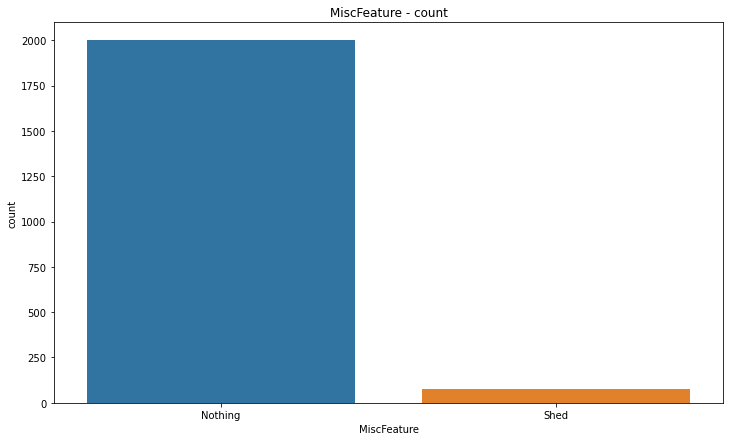

In [1166]:
sns.countplot(x = 'MiscFeature', data = data)
plt.title('MiscFeature - count')

Text(0.5, 1.0, 'Catplot Of MiscFeature vs Property_Sale_Price')

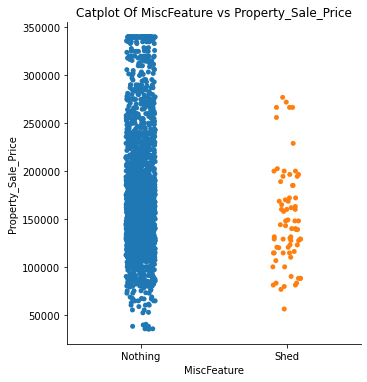

In [1167]:
sns.catplot(x = 'MiscFeature', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of MiscFeature vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 74) MiscVal

In [1168]:
data.MiscVal.isnull().sum()

0

In [1169]:
data.MiscVal.describe()

count     2073.000000
mean        39.736614
std        429.819512
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15500.000000
Name: MiscVal, dtype: float64

In [1170]:
data.MiscVal.value_counts()

0        1996
400        21
500        11
450         6
700         6
2000        5
600         4
2500        3
1200        3
620         3
480         3
560         2
1300        2
54          1
800         1
1150        1
1400        1
350         1
8300        1
15500       1
3500        1
Name: MiscVal, dtype: int64

In [1171]:
data.MiscVal.value_counts().sum()

2073

Text(0.5, 1.0, 'Histogram Of MiscVal')

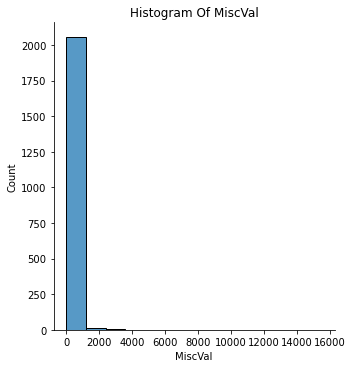

In [1172]:
sns.displot(data.MiscVal)
plt.title('Histogram Of MiscVal')

Text(0.5, 1.0, 'Normality Of MiscVal')

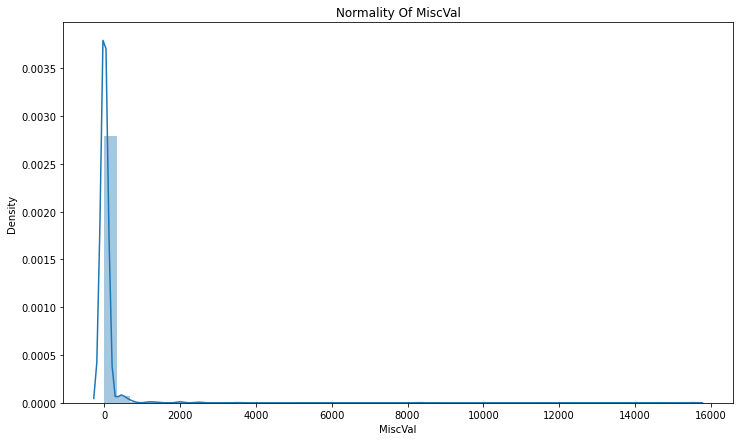

In [1173]:
sns.distplot(data.MiscVal)
plt.title('Normality Of MiscVal')

Text(0.5, 1.0, 'MiscVal - count')

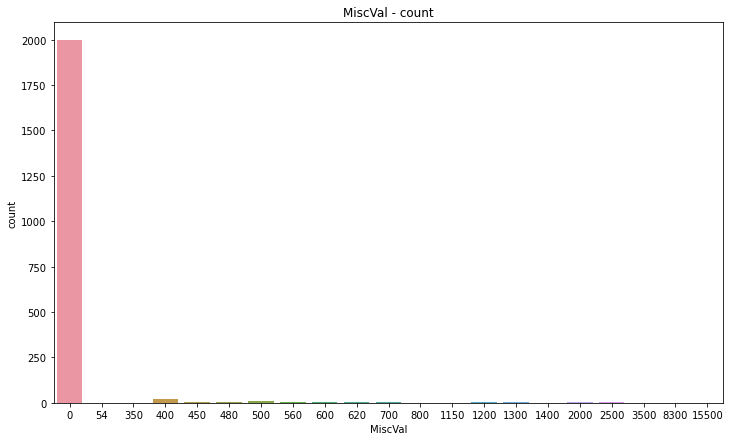

In [1174]:
sns.countplot(data.MiscVal)
plt.title('MiscVal - count')

Text(0.5, 1.0, 'BoxPlot Of MiscVal')

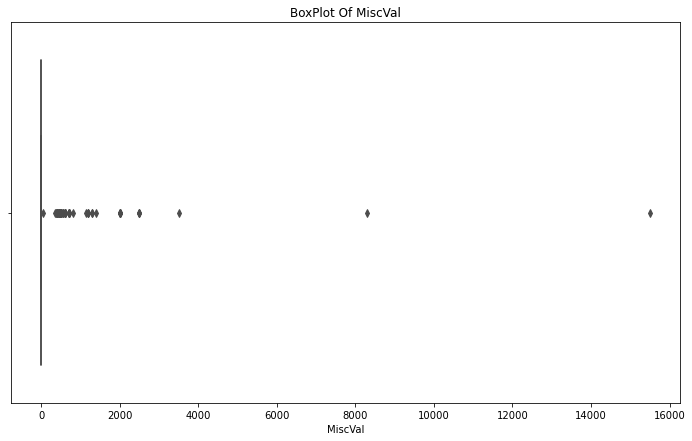

In [1175]:
sns.boxplot(data.MiscVal, color = 'red')
plt.title('BoxPlot Of MiscVal')

In [1176]:
IQR = data.MiscVal.quantile(0.75) - data.MiscVal.quantile(0.25)
IQR

0.0

In [1177]:
UL = data.MiscVal.quantile(0.75) + (1.5*IQR)
UL

0.0

In [1178]:
LL = data.MiscVal.quantile(0.25) - (1.5*IQR)
LL

0.0

In [1179]:
np.corrcoef(data.MiscVal, data.Property_Sale_Price)

array([[ 1.        , -0.01932011],
       [-0.01932011,  1.        ]])

In [1180]:
mod_cu = ols('Property_Sale_Price ~ MiscVal', data = data).fit()
sm.stats.anova_lm(mod_cu)

,df,sum_sq,mean_sq,F,PR(>F)
MiscVal,1.0,3.474677e+09,3.474677e+09,0.773324,0.379293
Residual,2071.0,9.305359e+12,4.493172e+09,NaN,NaN


Text(0.5, 1.0, 'Scatter Plot Of MiscVal vs Property_Sale_Price')

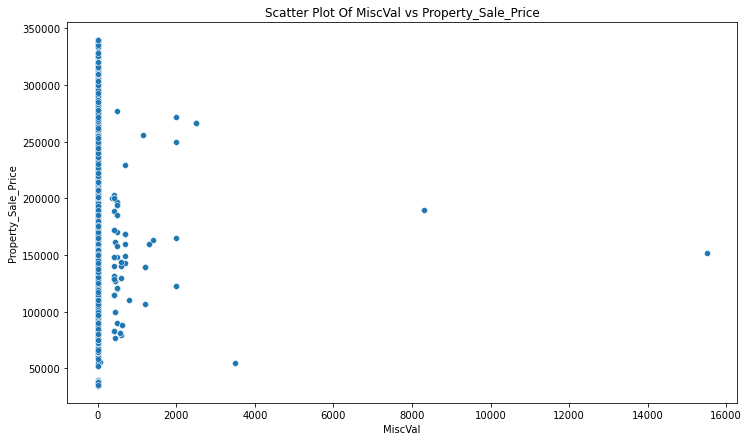

In [1181]:
sns.scatterplot(x = data['MiscVal'], y = data.Property_Sale_Price, data = data )
plt.xlabel('MiscVal')
plt.ylabel('Property_Sale_Price')
plt.title('Scatter Plot Of MiscVal vs Property_Sale_Price')

**Not Good Predictor**

# 

# 

# 75) MoSold

In [1182]:
data.MoSold.isnull().sum()

0

In [1183]:
data.MoSold.describe()

count    2073.000000
mean        6.287506
std         2.690130
min         1.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        12.000000
Name: MoSold, dtype: float64

In [1184]:
data.MoSold.value_counts()

6     356
7     325
5     294
4     201
8     187
3     140
10    130
11    111
9      87
1      85
2      84
12     73
Name: MoSold, dtype: int64

In [1185]:
data.MoSold.value_counts().sum()

2073

Text(0.5, 1.0, 'MoSold - count')

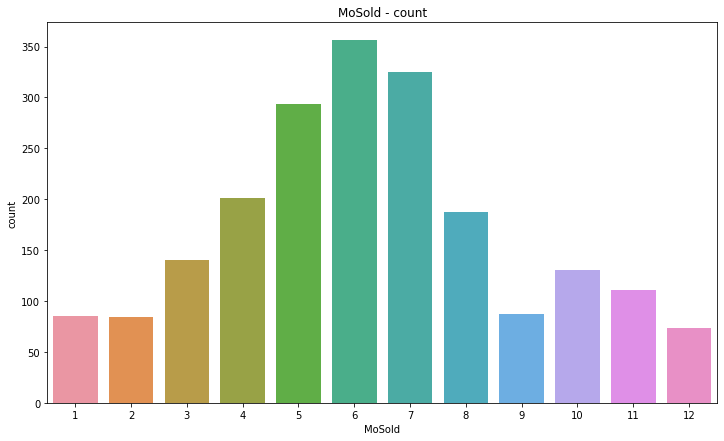

In [1186]:
sns.countplot(data.MoSold)
plt.title('MoSold - count')

In [1187]:
data.groupby("MoSold")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
MoSold,,,,,,,,
1,85.0,170737.811765,77992.809336,39300.0,119000.0,149000.0,216000.0,340000.0
2,84.0,182012.821429,59590.856199,93000.0,128150.0,174250.0,214900.0,320000.0
3,140.0,177742.492857,68536.971484,52500.0,133000.0,163200.0,200531.0,340000.0
4,201.0,168179.905473,63848.572438,68400.0,126000.0,149700.0,197000.0,340000.0
5,294.0,173787.653061,67214.198619,37900.0,128625.0,155450.0,205712.5,340000.0
6,356.0,174163.584270,59437.593759,55993.0,135000.0,162950.0,206900.0,340000.0
7,325.0,180120.630769,68372.089447,40000.0,132500.0,172500.0,210000.0,340000.0
8,187.0,180640.989305,70088.986283,64500.0,125250.0,173900.0,239686.0,340000.0
9,87.0,186318.827586,71906.219604,67000.0,134000.0,172000.0,230000.0,340000.0


In [1188]:
mod_MS = ols('Property_Sale_Price ~ MoSold', data = data).fit()
sm.stats.anova_lm(mod_MS)

,df,sum_sq,mean_sq,F,PR(>F)
MoSold,1.0,3.545346e+10,3.545346e+10,7.917729,0.004941
Residual,2071.0,9.273381e+12,4.477731e+09,NaN,NaN


In [1189]:
tukey_MS = pairwise_tukeyhsd(data.Property_Sale_Price, data.MoSold, alpha = 0.05)
print(tukey_MS)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower      upper    reject
--------------------------------------------------------------
     1      2  11275.0097    0.9 -22368.2411 44918.2604  False
     1      3   7004.6811    0.9  -23064.492 37073.8542  False
     1      4  -2557.9063    0.9 -30850.9214 25735.1088  False
     1      5   3049.8413    0.9 -23880.3962 29980.0788  False
     1      6   3425.7725    0.9 -22973.2921 29824.8371  False
     1      7    9382.819    0.9  -17257.811  36023.449  False
     1      8   9903.1775    0.9 -18702.8724 38509.2275  False
     1      9  15581.0158    0.9 -17769.2147 48931.2464  False
     1     10   1672.0344    0.9 -28830.9124 32174.9812  False
     1     11  28680.0621 0.1164  -2838.0931 60198.2173  False
     1     12  14004.9143    0.9 -20889.9374  48899.766  False
     2      3  -4270.3286    0.9 -34450.6635 25910.0063  False
     2      4  -13832.916    0.9 -42244.0432 14578.2112

**Not Good Predictor**

# 

# 

# 76) YrSold

In [1190]:
data.YrSold.isnull().sum()

0

In [1191]:
data.YrSold.describe()

count    2073.000000
mean     2007.851905
std         1.329705
min      2006.000000
25%      2007.000000
50%      2008.000000
75%      2009.000000
max      2010.000000
Name: YrSold, dtype: float64

In [1192]:
data.YrSold.value_counts()

2009    508
2007    469
2006    428
2008    413
2010    255
Name: YrSold, dtype: int64

In [1193]:
data.YrSold.value_counts().sum()

2073

Text(0.5, 1.0, 'YrSold - count')

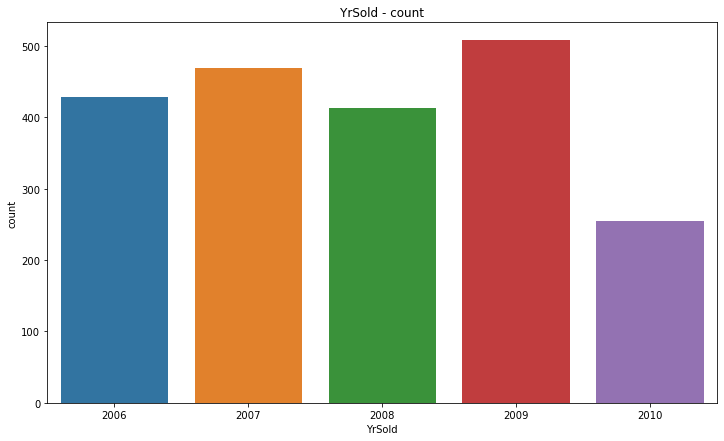

In [1194]:
sns.countplot(data.YrSold)
plt.title('YrSold - count')

In [1195]:
data.groupby("YrSold")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
YrSold,,,,,,,,
2006,428.0,177230.880841,67233.883293,35311.0,130000.0,161450.0,217927.5,340000.0
2007,469.0,178468.541578,67029.431786,39300.0,129000.0,164000.0,211000.0,340000.0
2008,413.0,178304.188862,62525.616601,40000.0,135500.0,172000.0,207000.0,340000.0
2009,508.0,176119.994094,68908.466721,34900.0,127500.0,162750.0,213062.5,340000.0
2010,255.0,178369.600000,70317.760934,55000.0,128000.0,157900.0,214900.0,340000.0


In [1196]:
mod_YS = ols('Property_Sale_Price ~ YrSold', data = data).fit()
sm.stats.anova_lm(mod_YS)

,df,sum_sq,mean_sq,F,PR(>F)
YrSold,1.0,5.601590e+07,5.601590e+07,0.012462,0.911124
Residual,2071.0,9.308778e+12,4.494823e+09,NaN,NaN


In [1197]:
tukey_YS = pairwise_tukeyhsd(data.Property_Sale_Price, data.YrSold, alpha = 0.05)
print(tukey_YS)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj    lower      upper    reject
------------------------------------------------------------
  2006   2007  1237.6607   0.9 -11005.8613 13481.1828  False
  2006   2008   1073.308   0.9 -11560.0714 13706.6875  False
  2006   2009 -1110.8867   0.9 -13128.0687 10906.2952  False
  2006   2010  1138.7192   0.9 -13350.2281 15627.6664  False
  2007   2008  -164.3527   0.9 -12523.5794  12194.874  False
  2007   2009 -2348.5475   0.9 -14077.1821  9380.0872  False
  2007   2010   -98.9416   0.9 -14349.4784 14151.5952  False
  2008   2009 -2184.1948   0.9 -14319.2396  9950.8501  False
  2008   2010    65.4111   0.9 -14521.4406 14652.2629  False
  2009   2010  2249.6059   0.9 -11806.9452  16306.157  False
------------------------------------------------------------


**Not Good Predictor**

# 

# 

# 77) SaleType

In [1198]:
data.SaleType.isnull().sum()

0

In [1199]:
data.SaleType.value_counts()

WD       1797
New       171
COD        68
ConLD      14
Oth         5
ConLw       5
ConLI       5
CWD         5
Con         3
Name: SaleType, dtype: int64

In [1200]:
data.SaleType.value_counts().sum()

2073

Text(0.5, 1.0, 'SaleType - count')

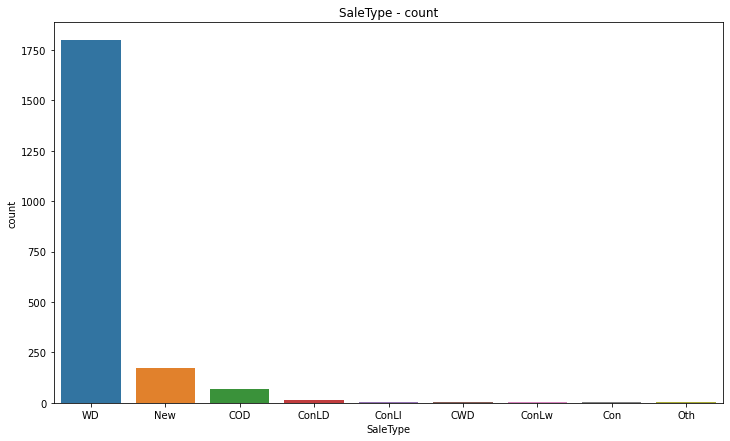

In [1201]:
sns.countplot(data.SaleType)
plt.title('SaleType - count')

In [1202]:
data.groupby("SaleType")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
SaleType,,,,,,,,
COD,68.0,155068.382353,52786.913875,60000.0,117500.0,139500.0,180250.0,287000.0
CWD,5.0,234260.000000,91654.148842,136000.0,158000.0,219500.0,328900.0,328900.0
Con,3.0,251466.666667,62815.709288,215200.0,215200.0,215200.0,269600.0,324000.0
ConLD,14.0,130002.000000,46876.602601,79900.0,85000.0,132500.0,143375.0,235128.0
ConLI,5.0,178000.000000,97634.522583,110000.0,115000.0,125000.0,200000.0,340000.0
ConLw,5.0,143700.000000,67291.901444,60000.0,95000.0,144000.0,207500.0,212000.0
New,171.0,248069.853801,69113.841065,113000.0,187125.0,239799.0,325462.0,340000.0
Oth,5.0,131910.000000,26022.163630,93500.0,116050.0,150000.0,150000.0,150000.0
WD,1797.0,172048.427935,63147.195319,34900.0,129000.0,159434.0,205000.0,340000.0


In [1203]:
mod_ST = ols('Property_Sale_Price ~ SaleType', data = data).fit()
sm.stats.anova_lm(mod_ST)

,df,sum_sq,mean_sq,F,PR(>F)
SaleType,8.0,1.019415e+12,1.274268e+11,31.728271,2.576475e-47
Residual,2064.0,8.289420e+12,4.016192e+09,NaN,NaN


In [1204]:
tukey_ST = pairwise_tukeyhsd(data.Property_Sale_Price, data.SaleType, alpha = 0.05)
print(tukey_ST)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower        upper    reject
-----------------------------------------------------------------
   COD    CWD   79191.6176 0.1493  -11987.9012 170371.1365  False
   COD    Con   96398.2843 0.1961  -19690.2733 212486.8419  False
   COD  ConLD  -25066.3824    0.9  -82817.9499  32685.1852  False
   COD  ConLI   22931.6176    0.9  -68247.9012 114111.1365  False
   COD  ConLw  -11368.3824    0.9 -102547.9012  79811.1365  False
   COD    New   93001.4714  0.001   64790.2582 121212.6847   True
   COD    Oth  -23158.3824    0.9 -114337.9012  68021.1365  False
   COD     WD   16980.0456 0.4297   -7330.0266  41290.1177  False
   CWD    Con   17206.6667    0.9  -126499.263 160912.5963  False
   CWD  ConLD    -104258.0 0.0428 -206776.7034  -1739.2966   True
   CWD  ConLI     -56260.0 0.8986 -180712.9858  68192.9858  False
   CWD  ConLw     -90560.0 0.3691 -215012.9858  33892.9858  False
   CWD    

In [1205]:
data["SaleType"].replace("ConLD", 'COD', inplace = True)
data["SaleType"].replace("ConLI", 'COD', inplace = True)
data["SaleType"].replace("ConLI", 'COD', inplace = True)
data["SaleType"].replace("Oth", 'COD', inplace = True)
data["SaleType"].replace("CWD", 'New', inplace = True)
data["SaleType"].replace("Con", 'New', inplace = True)

In [1206]:
data.SaleType.value_counts()

WD       1797
New       179
COD        92
ConLw       5
Name: SaleType, dtype: int64

In [1207]:
data.SaleType.value_counts().sum()

2073

In [1208]:
mod_ST = ols('Property_Sale_Price ~ SaleType', data = data).fit()
sm.stats.anova_lm(mod_ST)

,df,sum_sq,mean_sq,F,PR(>F)
SaleType,3.0,1.005686e+12,3.352285e+11,83.533113,5.163998e-51
Residual,2069.0,8.303149e+12,4.013122e+09,NaN,NaN


In [1209]:
tukey_ST = pairwise_tukeyhsd(data.Property_Sale_Price, data.SaleType, alpha = 0.05)
print(tukey_ST)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
   COD  ConLw  -7541.6087    0.9 -82336.3581  67253.1407  False
   COD    New  96499.4248  0.001  75605.0983 117393.7513   True
   COD     WD  20806.8192 0.0115   3396.2814  38217.3571   True
 ConLw    New 104041.0335 0.0017  30189.1537 177892.9133   True
 ConLw     WD  28348.4279 0.7243 -44594.3859 101291.2418  False
   New     WD -75692.6056  0.001 -88458.6713 -62926.5398   True
---------------------------------------------------------------


In [1210]:
data["SaleType"].replace("ConLw", 'COD', inplace = True)

In [1211]:
data.SaleType.value_counts()

WD     1797
New     179
COD      97
Name: SaleType, dtype: int64

In [1212]:
data.SaleType.value_counts().sum()

2073

In [1213]:
mod_ST = ols('Property_Sale_Price ~ SaleType', data = data).fit()
sm.stats.anova_lm(mod_ST)

,df,sum_sq,mean_sq,F,PR(>F)
SaleType,2.0,1.005416e+12,5.027079e+11,125.322537,4.209968e-52
Residual,2070.0,8.303418e+12,4.011313e+09,NaN,NaN


In [1214]:
tukey_ST = pairwise_tukeyhsd(data.Property_Sale_Price, data.SaleType, alpha = 0.05)
print(tukey_ST)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower       upper    reject
---------------------------------------------------------------
   COD    New  96888.1675  0.001  78159.5701  115616.765   True
   COD     WD   21195.562 0.0038   5711.2049   36679.919   True
   New     WD -75692.6056  0.001 -87335.3674 -64049.8438   True
---------------------------------------------------------------


Text(0.5, 1.0, 'SaleType - count')

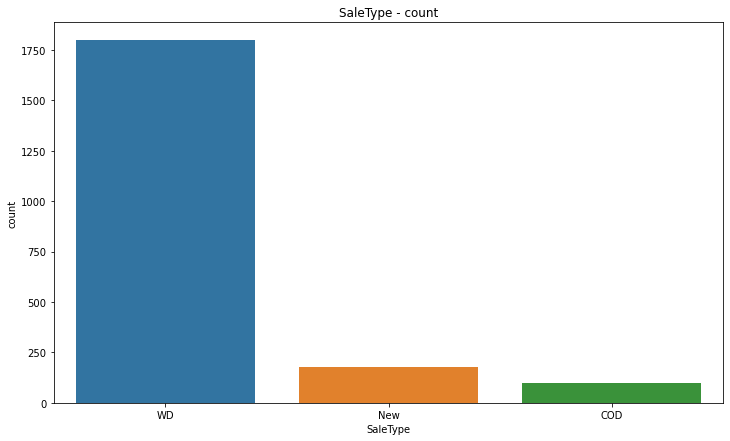

In [1215]:
sns.countplot(x = 'SaleType', data = data)
plt.title('SaleType - count')

Text(0.5, 1.0, 'Catplot Of SaleType vs Property_Sale_Price')

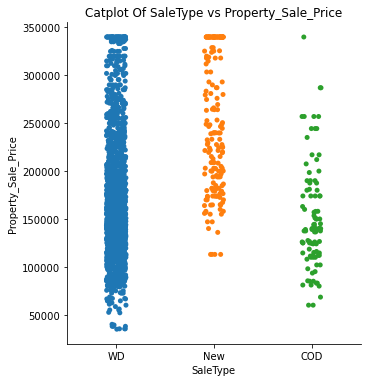

In [1216]:
sns.catplot(x = 'SaleType', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of SaleType vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of SaleType vs Property_Sale_Price')

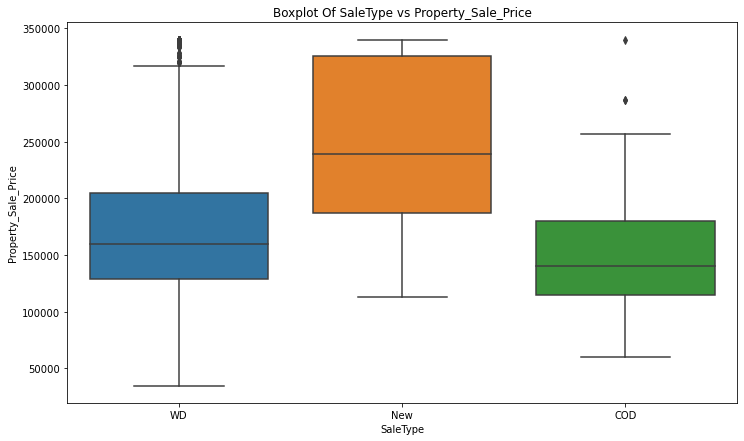

In [1217]:
sns.boxplot(x = 'SaleType', y = 'Property_Sale_Price', data = data)
plt.title('Boxplot Of SaleType vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 78) SaleCondition

In [1218]:
data.SaleCondition.isnull().sum()

0

In [1219]:
data.SaleCondition.value_counts()

Normal     1695
Partial     175
Abnorml     155
Family       24
Alloca       19
AdjLand       5
Name: SaleCondition, dtype: int64

In [1220]:
data.SaleCondition.value_counts().sum()

2073

Text(0.5, 1.0, 'SaleCondition - count')

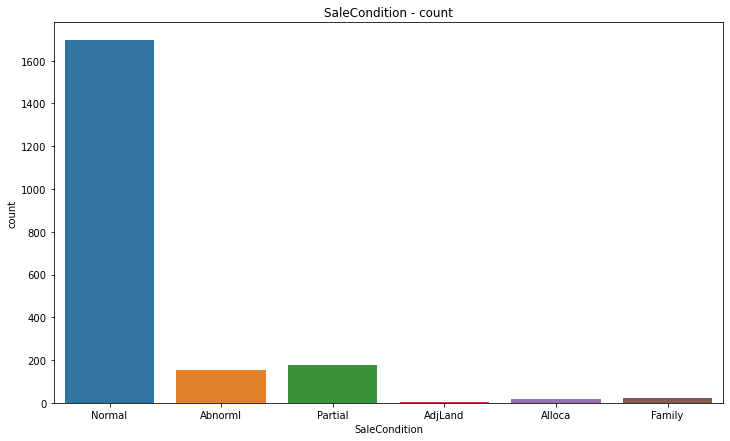

In [1221]:
sns.countplot(data.SaleCondition)
plt.title('SaleCondition - count')

In [1222]:
data.groupby("SaleCondition")["Property_Sale_Price"].describe()

,count,mean,std,min,25%,50%,75%,max
SaleCondition,,,,,,,,
Abnorml,155.0,143199.800000,63408.056530,34900.0,103388.0,130000.0,174000.0,340000.0
AdjLand,5.0,108800.000000,24931.405897,81000.0,82000.0,126000.0,127500.0,127500.0
Alloca,19.0,162420.263158,71102.422300,55993.0,118858.0,142953.0,189812.0,340000.0
Family,24.0,144500.000000,45475.028982,82500.0,108000.0,135500.0,161375.0,259000.0
Normal,1695.0,174529.422419,62519.407890,39300.0,130375.0,160000.0,207000.0,340000.0
Partial,175.0,245874.702857,70214.039839,113000.0,184875.0,235128.0,325300.0,340000.0


In [1223]:
mod_SC = ols('Property_Sale_Price ~ SaleCondition', data = data).fit()
sm.stats.anova_lm(mod_SC)

,df,sum_sq,mean_sq,F,PR(>F)
SaleCondition,5.0,1.069495e+12,2.138990e+11,53.660768,1.641988e-52
Residual,2067.0,8.239339e+12,3.986134e+09,NaN,NaN


In [1224]:
tukey_SC = pairwise_tukeyhsd(data.Property_Sale_Price, data.SaleCondition, alpha = 0.05)
print(tukey_SC)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1  group2   meandiff  p-adj     lower        upper    reject
------------------------------------------------------------------
Abnorml AdjLand    -34399.8 0.8163 -116225.2672  47425.6672  False
Abnorml  Alloca  19220.4632 0.7856  -24553.0424  62993.9687  False
Abnorml  Family      1300.2    0.9   -38203.193   40803.593  False
Abnorml  Normal  31329.6224  0.001   16217.8809   46441.364   True
Abnorml Partial 102674.9029  0.001   82811.6007 122538.2051   True
AdjLand  Alloca  53620.2632 0.5332   -36895.282 144135.8083  False
AdjLand  Family     35700.0 0.8445  -52829.4425 124229.4425  False
AdjLand  Normal  65729.4224 0.1844  -14926.0725 146384.9174  False
AdjLand Partial 137074.7029  0.001   55395.4833 218753.9224   True
 Alloca  Family -17920.2632    0.9  -73221.0308  37380.5045  False
 Alloca  Normal  12109.1593    0.9  -29436.2566  53654.5751  False
 Alloca Partial  83454.4397  0.001   39954.9268 126953.9526   

In [1225]:
data["SaleCondition"].replace('Family', 'Abnorml', inplace = True)
data["SaleCondition"].replace('Alloca', 'Normal', inplace = True)

In [1226]:
data.SaleCondition.value_counts()

Normal     1714
Abnorml     179
Partial     175
AdjLand       5
Name: SaleCondition, dtype: int64

In [1227]:
data.SaleCondition.value_counts().sum()

2073

In [1228]:
mod_SC = ols('Property_Sale_Price ~ SaleCondition', data = data).fit()
sm.stats.anova_lm(mod_SC)

,df,sum_sq,mean_sq,F,PR(>F)
SaleCondition,3.0,1.066705e+12,3.555683e+11,89.257366,2.580882e-54
Residual,2069.0,8.242129e+12,3.983629e+09,NaN,NaN


In [1229]:
tukey_SC = pairwise_tukeyhsd(data.Property_Sale_Price, data.SaleCondition, alpha = 0.05)
print(tukey_SC)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1  group2   meandiff  p-adj     lower       upper    reject
-----------------------------------------------------------------
Abnorml AdjLand -34574.1285 0.6071 -108154.142   39005.885  False
Abnorml  Normal  31021.0617  0.001  18274.1243  43767.9991   True
Abnorml Partial 102500.5744  0.001  85249.4042 119751.7446   True
AdjLand  Normal  65595.1902 0.0936  -7083.9861 138274.3665  False
AdjLand Partial 137074.7029  0.001   63471.842 210677.5637   True
 Normal Partial  71479.5127  0.001  58601.3468  84357.6785   True
-----------------------------------------------------------------


In [1230]:
data["SaleCondition"].replace('AdjLand', 'Abnorml', inplace = True)

In [1231]:
data.SaleCondition.value_counts()

Normal     1714
Abnorml     184
Partial     175
Name: SaleCondition, dtype: int64

In [1232]:
data.SaleCondition.value_counts().sum()

2073

In [1233]:
mod_SC = ols('Property_Sale_Price ~ SaleCondition', data = data).fit()
sm.stats.anova_lm(mod_SC)

,df,sum_sq,mean_sq,F,PR(>F)
SaleCondition,2.0,1.060890e+12,5.304452e+11,133.126701,4.084723e-55
Residual,2070.0,8.247944e+12,3.984514e+09,NaN,NaN


In [1234]:
tukey_SC = pairwise_tukeyhsd(data.Property_Sale_Price, data.SaleCondition, alpha = 0.05)
print(tukey_SC)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1  group2   meandiff  p-adj   lower       upper    reject
---------------------------------------------------------------
Abnorml  Normal  31960.5761 0.001 20475.3045  43445.8476   True
Abnorml Partial 103440.0887 0.001 87807.6486 119072.5288   True
 Normal Partial  71479.5127 0.001 59730.5633   83228.462   True
---------------------------------------------------------------


Text(0.5, 1.0, 'SaleCondition - count')

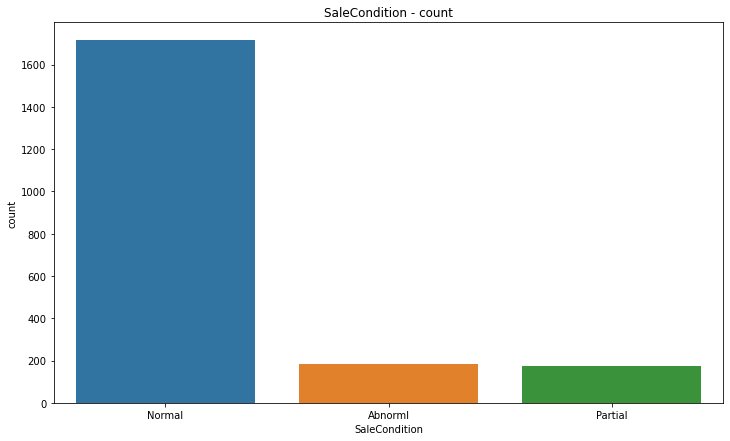

In [1235]:
sns.countplot(x = 'SaleCondition', data = data)
plt.title('SaleCondition - count')

Text(0.5, 1.0, 'Catplot Of SaleCondition vs Property_Sale_Price')

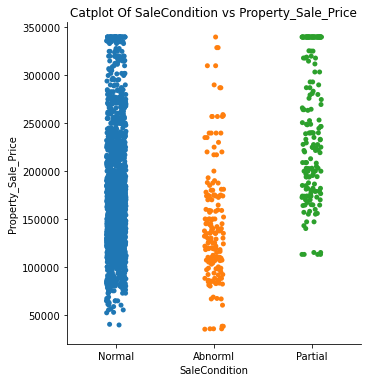

In [1236]:
sns.catplot(x = 'SaleCondition', y = 'Property_Sale_Price', data = data)
plt.title('Catplot Of SaleCondition vs Property_Sale_Price')

Text(0.5, 1.0, 'Boxplot Of SaleCondition vs Property_Sale_Price')

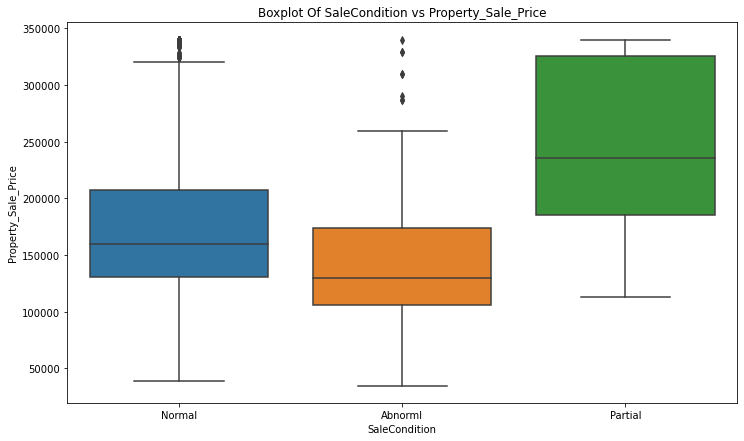

In [1237]:
sns.boxplot(x = 'SaleCondition', y = 'Property_Sale_Price', data = data)
plt.title('Boxplot Of SaleCondition vs Property_Sale_Price')

**Good Predictor**

# 

# 

# 

# 

# 

In [1238]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          2073 non-null   float64
 3   LotArea              2073 non-null   float64
 4   Road_Type            2073 non-null   object 
 5   Alley                2073 non-null   object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

# 

In [1239]:
data1 = data.copy()

In [1240]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          2073 non-null   float64
 3   LotArea              2073 non-null   float64
 4   Road_Type            2073 non-null   object 
 5   Alley                2073 non-null   object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

# 

# Good Predictor As per P-Value

**Dewll_Type**

**Zone_Class**

**Road_Type**

**Alley**

**Proparty_Shape**

**LandContour**

**LotConfig**

**Neighborhood**

**Condition1**

**Condition2**

**Dwelling_Type**

**HouseStyle**

**OverallQual**

**OverallCond**

**RoofStyle**

**RoofMatl**

**Exterior1st**

**Exterior2nd**

**MasVnrType**

**ExterQual**

**ExterCond**

**Foundation**

**BsmtQual**

**BsmtCond**

**BsmtExposure**

**BsmtFinType1**

**BsmtFinType2**

**TotalBsmtSF**

**Heating**

**HeatingQC**

**CentralAir**

**Electrical**

**FirstFlrSF**

**GrLivArea**

**BsmtFullBath**

**FullBath**

**HalfBath**

**BedroomAbvGr**

**KitchenAbvGr**

**KitchenQual**

**Functional**

**Fireplaces**

**FireplaceQu**

**GarageType***

**GarageFinish**

**GarageCars**

**GarageArea**

**GarageQual**

**GarageCond**

**PavedDrive**

**Fence**

**MiscFeature**

**SaleType**

**SaleCondition**

# 

# NOT Good Predictor As per P-Value 

**LotFrontage**

**LotArea**

**Utilities**

**LandSlope**

**YearBuilt**

**YearRemodAdd**

**MasVnrArea**

**BsmtFinSF1**

**BsmtFinSF2**

**BsmtUnfSF**

**SecondFlrSF**

**LowQualFinSF**

**BsmtHalfBath**

**TotRmsAbvGrd**

**GarageYrBlt**

**WoodDeckSF**

**OpenPorchSF**

**EnclosedPorch**

**ThrSsnPorch**

**ScreenPorch**

**PoolArea**

**PoolQC**

**MiscVal**

**MoSold**

**YrSold**

# 

# 

# 

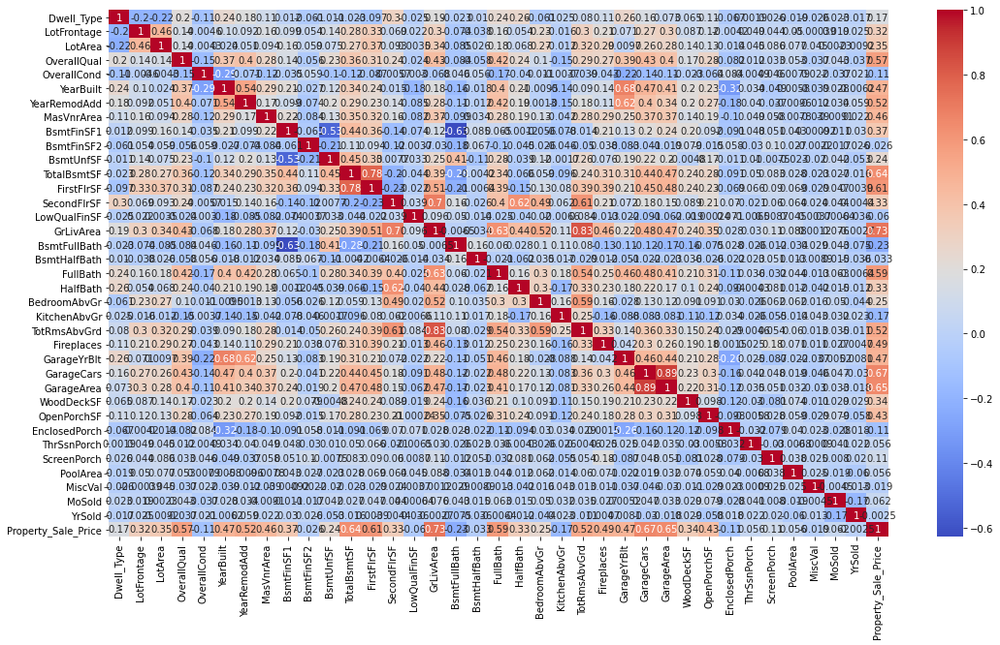

In [1241]:
# Heat Map OF Corrrlation

plt.figure(figsize=(18,10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.show()

In [1242]:
data.corr()

,Dwell_Type,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,ThrSsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Property_Sale_Price
Dwell_Type,1.000000,-0.197055,-0.221013,0.204063,-0.112947,0.244180,0.184536,0.107031,0.012007,-0.060803,...,0.065275,0.112024,-0.066921,0.001947,0.025754,-0.018590,-0.025827,0.022833,-0.017130,0.166766
LotFrontage,-0.197055,1.000000,0.459208,0.136993,-0.004603,0.104689,0.091662,0.161011,0.099035,0.054406,...,0.086593,0.121065,-0.004154,0.049341,0.043660,0.050256,-0.000393,0.019003,0.025141,0.320624
LotArea,-0.221013,0.459208,1.000000,0.138956,-0.004317,0.023751,0.050505,0.094470,0.157722,0.058947,...,0.135594,0.128169,-0.013629,0.044514,0.086360,0.076916,0.045142,0.002341,-0.009246,0.351790
OverallQual,0.204063,0.136993,0.138956,1.000000,-0.146012,0.372474,0.404121,0.278162,0.141918,-0.055794,...,0.165777,0.280570,-0.082193,0.012075,0.033267,0.053432,-0.037324,0.042652,-0.037480,0.567517
OverallCond,-0.112947,-0.004603,-0.004317,-0.146012,1.000000,-0.289472,-0.070829,-0.116898,-0.035057,0.058903,...,-0.023133,-0.064008,0.083594,-0.004907,0.046261,0.007892,0.021853,-0.036567,0.020797,-0.113095
YearBuilt,0.244180,0.104689,0.023751,0.372474,-0.289472,1.000000,0.536302,0.289041,0.208221,-0.027257,...,0.201018,0.231899,-0.322230,0.034056,-0.049196,0.005784,-0.038641,0.027915,-0.006166,0.474156
YearRemodAdd,0.184536,0.091662,0.050505,0.404121,-0.070829,0.536302,1.000000,0.172496,0.098668,-0.073927,...,0.204242,0.267031,-0.177739,0.039945,-0.036832,-0.009607,-0.011749,0.033514,0.058932,0.515421
MasVnrArea,0.107031,0.161011,0.094470,0.278162,-0.116898,0.289041,0.172496,1.000000,0.216680,-0.083535,...,0.135462,0.191367,-0.104142,0.048766,0.057674,-0.007787,-0.039190,-0.009081,0.021680,0.455032
BsmtFinSF1,0.012007,0.099035,0.157722,0.141918,-0.035057,0.208221,0.098668,0.216680,1.000000,-0.061171,...,0.204612,0.092423,-0.090561,0.047776,0.050709,0.042903,-0.000925,-0.010797,0.029505,0.365625
BsmtFinSF2,-0.060803,0.054406,0.058947,-0.055794,0.058903,-0.027257,-0.073927,-0.083535,-0.061171,1.000000,...,0.079243,-0.015166,0.058107,-0.030341,0.099569,0.027055,-0.002205,-0.016562,0.025510,-0.025886


# 

# 

# 

# 

# OLS Model With All Columns

In [1243]:
model1 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LotFrontage + LotArea + Road_Type + Alley + Property_Shape + LandContour + Utilities + LotConfig + LandSlope + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + OverallQual + OverallCond + YearBuilt + YearRemodAdd + RoofStyle + RoofMatl + Exterior1st + Exterior2nd + MasVnrType + MasVnrArea + ExterQual + ExterCond + Foundation + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFinSF1 + BsmtFinType2 + BsmtFinSF2 + BsmtUnfSF + TotalBsmtSF + Heating + HeatingQC + CentralAir + Electrical + FirstFlrSF + SecondFlrSF + LowQualFinSF + GrLivArea + BsmtFullBath + BsmtHalfBath + FullBath + HalfBath + BedroomAbvGr + KitchenAbvGr + KitchenQual + TotRmsAbvGrd + Functional + Fireplaces + FireplaceQu + GarageType + GarageYrBlt + GarageFinish + GarageCars + GarageArea + GarageQual + GarageCond + PavedDrive + WoodDeckSF + OpenPorchSF + EnclosedPorch + ThrSsnPorch + ScreenPorch + PoolArea + PoolQC + Fence + MiscFeature + MiscVal + MoSold + YrSold + SaleType + SaleCondition', data = data1).fit()
print(model1.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.925
Model:                             OLS   Adj. R-squared:                  0.921
Method:                  Least Squares   F-statistic:                     196.3
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:39:05   Log-Likelihood:                -23289.
No. Observations:                 2073   AIC:                         4.683e+04
Df Residuals:                     1949   BIC:                         4.753e+04
Df Model:                          123                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercep

# 

# 

# 

# OLS Model With Good Predictors

In [1244]:
model2 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + Road_Type + Alley + Property_Shape + LandContour + LotConfig + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + OverallQual + OverallCond + RoofStyle + RoofMatl + Exterior1st + Exterior2nd + MasVnrType + ExterQual + ExterCond + Foundation + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFinType2 + TotalBsmtSF + Heating + HeatingQC + CentralAir + Electrical + FirstFlrSF + GrLivArea + BsmtFullBath + FullBath + HalfBath + BedroomAbvGr + KitchenAbvGr + KitchenQual + Functional + Fireplaces + FireplaceQu + GarageType + GarageFinish + GarageCars + GarageArea + GarageQual + GarageCond + PavedDrive + Fence + MiscFeature + SaleType + SaleCondition', data = data1).fit()
print(model2.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.915
Model:                             OLS   Adj. R-squared:                  0.911
Method:                  Least Squares   F-statistic:                     222.9
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:39:06   Log-Likelihood:                -23428.
No. Observations:                 2073   AIC:                         4.705e+04
Df Residuals:                     1977   BIC:                         4.759e+04
Df Model:                           95                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercep

# 

# 

# 

# OLS Model With P < 0.05 Columns 

**Condition2**

In [1245]:
data1.Condition2.value_counts()

Norm     2054
Feedr      16
PosN        3
Name: Condition2, dtype: int64

In [1246]:
data1["Condition2"].replace('Norm', 'Feedr', inplace = True)

In [1247]:
data1.Condition2.value_counts()

Feedr    2070
PosN        3
Name: Condition2, dtype: int64

# 

**HouseStyle**

In [1248]:
data1.HouseStyle.value_counts()

1Story    1125
2Story     648
1.5Fin     300
Name: HouseStyle, dtype: int64

In [1249]:
data1["HouseStyle"].replace('1Story', '1.5Fin', inplace = True)

In [1250]:
data1.HouseStyle.value_counts()

1.5Fin    1425
2Story     648
Name: HouseStyle, dtype: int64

# 

**Exterior2nd**

In [1251]:
data1.Exterior2nd.value_counts()

VinylSd    864
HdBoard    581
MetalSd    576
AsbShng     52
Name: Exterior2nd, dtype: int64

In [1252]:
data1["Exterior2nd"].replace('HdBoard', 'AsbShng', inplace = True)

In [1253]:
data1.Exterior2nd.value_counts()

VinylSd    864
AsbShng    633
MetalSd    576
Name: Exterior2nd, dtype: int64

# 

**ExterQual**

In [1254]:
data1.ExterQual.value_counts()

TA    1272
Gd     706
Ex      76
Fa      19
Name: ExterQual, dtype: int64

In [1255]:
data1["ExterQual"].replace('Gd', 'Ex', inplace = True)
data1["ExterQual"].replace('Fa', 'Ex', inplace = True)

In [1256]:
data1.ExterQual.value_counts()

TA    1272
Ex     801
Name: ExterQual, dtype: int64

# 

**BsmtExposure**

In [1257]:
data1.BsmtExposure.value_counts()

No             1349
Av              482
Gd              181
No Basement      61
Name: BsmtExposure, dtype: int64

In [1258]:
data1["BsmtExposure"].replace('No Basement', 'Av', inplace = True)

In [1259]:
data1.BsmtExposure.value_counts()

No    1349
Av     543
Gd     181
Name: BsmtExposure, dtype: int64

# 

**BsmtFinType1**

In [1260]:
data1.BsmtFinType1.value_counts()

Unf            923
GLQ            599
BLQ            492
No basement     59
Name: BsmtFinType1, dtype: int64

In [1261]:
data1["BsmtFinType1"].replace('Unf', 'BLQ', inplace = True)
data1["BsmtFinType1"].replace('No basement', 'BLQ', inplace = True)

In [1262]:
data1.BsmtFinType1.value_counts()

BLQ    1474
GLQ     599
Name: BsmtFinType1, dtype: int64

# 

**HeatingQC**

In [1263]:
data1.HeatingQC.value_counts()

Ex    1045
TA     618
Gd     341
Fa      69
Name: HeatingQC, dtype: int64

In [1264]:
data1["HeatingQC"].replace('Gd', 'Ex', inplace = True)
data1["HeatingQC"].replace('Fa', 'Ex', inplace = True)

In [1265]:
data1.HeatingQC.value_counts()

Ex    1455
TA     618
Name: HeatingQC, dtype: int64

# 

**GarageType**

In [1266]:
data1.GarageType.value_counts()

Attchd       1252
Detchd        572
No Garage     125
BuiltIn       124
Name: GarageType, dtype: int64

In [1267]:
data1["GarageType"].replace('No Garage', 'Attchd', inplace = True)
data1["GarageType"].replace('BuiltIn', 'Attchd', inplace = True)

In [1268]:
data1.GarageType.value_counts()

Attchd    1501
Detchd     572
Name: GarageType, dtype: int64

# 

**GarageFinish**

In [1269]:
data1.GarageFinish.value_counts()

Unf          857
RFn          605
Fin          498
No Garage    113
Name: GarageFinish, dtype: int64

In [1270]:
data1["GarageFinish"].replace('Unf', 'Fin', inplace = True)

In [1271]:
data1.GarageFinish.value_counts()

Fin          1355
RFn           605
No Garage     113
Name: GarageFinish, dtype: int64

# 

**SaleType**

In [1272]:
data1.SaleType.value_counts()

WD     1797
New     179
COD      97
Name: SaleType, dtype: int64

In [1273]:
data1["SaleType"].replace('WD', 'COD', inplace = True)

In [1274]:
data1.SaleType.value_counts()

COD    1894
New     179
Name: SaleType, dtype: int64

# 

# 

In [1275]:
model3 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LandContour + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + OverallQual + OverallCond + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + TotalBsmtSF + HeatingQC + FirstFlrSF + GrLivArea + BsmtFullBath + HalfBath + KitchenAbvGr + KitchenQual + Functional + Fireplaces + GarageType + GarageFinish + GarageCars + GarageArea + GarageQual + SaleType + SaleCondition', data = data1).fit()
print(model3.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.911
Model:                             OLS   Adj. R-squared:                  0.908
Method:                  Least Squares   F-statistic:                     396.1
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:39:07   Log-Likelihood:                -23474.
No. Observations:                 2073   AIC:                         4.705e+04
Df Residuals:                     2020   BIC:                         4.735e+04
Df Model:                           52                                         
Covariance Type:             nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept   

# 

# 

# Final OLS Model

In [1276]:
model4 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LandContour + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + OverallQual + OverallCond + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + TotalBsmtSF + GrLivArea + BsmtFullBath + HalfBath + KitchenAbvGr + KitchenQual + Functional + Fireplaces + GarageType + GarageFinish + GarageCars + GarageArea + GarageQual + SaleType + SaleCondition', data = data1).fit()
print(model4.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.911
Model:                             OLS   Adj. R-squared:                  0.908
Method:                  Least Squares   F-statistic:                     411.8
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:39:08   Log-Likelihood:                -23475.
No. Observations:                 2073   AIC:                         4.705e+04
Df Residuals:                     2022   BIC:                         4.734e+04
Df Model:                           50                                         
Covariance Type:             nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept   

# 

# 

# Linear Regression Assumptions (Health Check)

In [1277]:
data2 = data1[['Dwell_Type', 'Zone_Class', 'LandContour', 'Neighborhood', 'Condition1', 'Condition2', 'Dwelling_Type',
                   'HouseStyle', 'OverallQual', 'OverallCond', 'Exterior2nd', 'ExterQual', 'BsmtQual', 'BsmtCond',
                   'BsmtExposure', 'BsmtFinType1', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 'HalfBath', 'KitchenAbvGr',
                   'KitchenQual', 'Functional', 'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageArea',
                   'GarageQual', 'SaleType', 'SaleCondition', 'Property_Sale_Price']]
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LandContour          2073 non-null   object 
 3   Neighborhood         2073 non-null   object 
 4   Condition1           2073 non-null   object 
 5   Condition2           2073 non-null   object 
 6   Dwelling_Type        2073 non-null   object 
 7   HouseStyle           2073 non-null   object 
 8   OverallQual          2073 non-null   int64  
 9   OverallCond          2073 non-null   int64  
 10  Exterior2nd          2073 non-null   object 
 11  ExterQual            2073 non-null   object 
 12  BsmtQual             2073 non-null   object 
 13  BsmtCond             2073 non-null   object 
 14  BsmtExposure         2073 non-null   object 
 15  BsmtFinType1         2073 non-null   o

# 

In [1278]:
# these are predicted values, called y hat also

predict = model4.predict()
predict.shape

(2073,)

In [1279]:
# Value Count Of Target Variable

data2.Property_Sale_Price.value_counts().sum()

2073

In [1280]:
# Residuals = Actual(y)  - Predictor(y hat)

residuals = data2.Property_Sale_Price - predict
residuals

0        5826.228002
1      -13113.740206
2        2294.810506
3      -58950.510440
4      -38190.119881
            ...     
2068   -12261.757277
2069    15995.987459
2070   -13219.679821
2071   -35558.097996
2072   -38606.555075
Name: Property_Sale_Price, Length: 2073, dtype: float64

In [1281]:
# Now We have a new column in our data

data2['predict'] = predict

In [1282]:
# Now We have an another new column in our data

data2['residuals'] = residuals

In [1283]:
# Now We Create Observation Number

obs = np.arange(2073) 
obs 

obsno = pd.DataFrame(obs) # convert array into a data frame 

data2['obsno'] = obsno # craete a new variable/column 'obsno' in yr data

In [1284]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LandContour          2073 non-null   object 
 3   Neighborhood         2073 non-null   object 
 4   Condition1           2073 non-null   object 
 5   Condition2           2073 non-null   object 
 6   Dwelling_Type        2073 non-null   object 
 7   HouseStyle           2073 non-null   object 
 8   OverallQual          2073 non-null   int64  
 9   OverallCond          2073 non-null   int64  
 10  Exterior2nd          2073 non-null   object 
 11  ExterQual            2073 non-null   object 
 12  BsmtQual             2073 non-null   object 
 13  BsmtCond             2073 non-null   object 
 14  BsmtExposure         2073 non-null   object 
 15  BsmtFinType1         2073 non-null   o

# 

# 

# 1 _Normality

**make histogram of residuals**

**And check whether its approximately
bell-shaped, symmetrical**

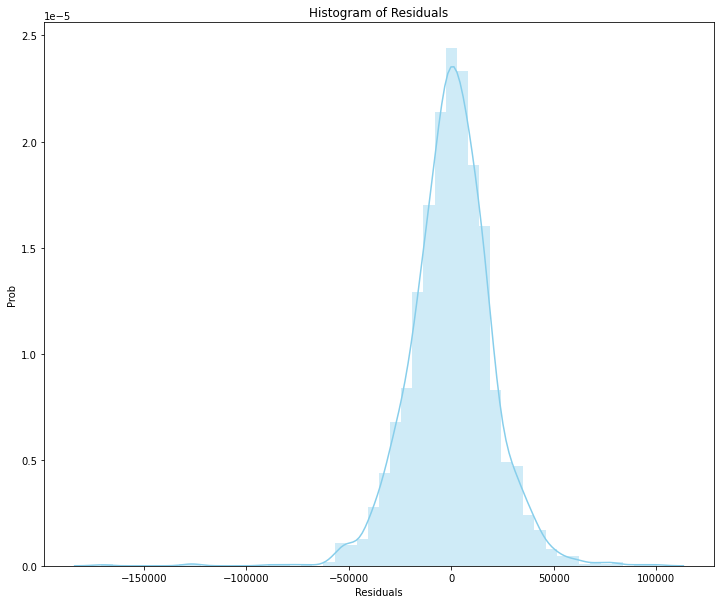

In [1285]:
plt.figure(figsize=(12,10))
sns.distplot(data2.residuals, color='skyblue')
plt.title('Histogram of Residuals')
plt.ylabel('Prob')
plt.xlabel('Residuals')
plt.show()

# 

# 

In [1286]:
import math
data2['residuals'] = np.sqrt(data2.residuals)

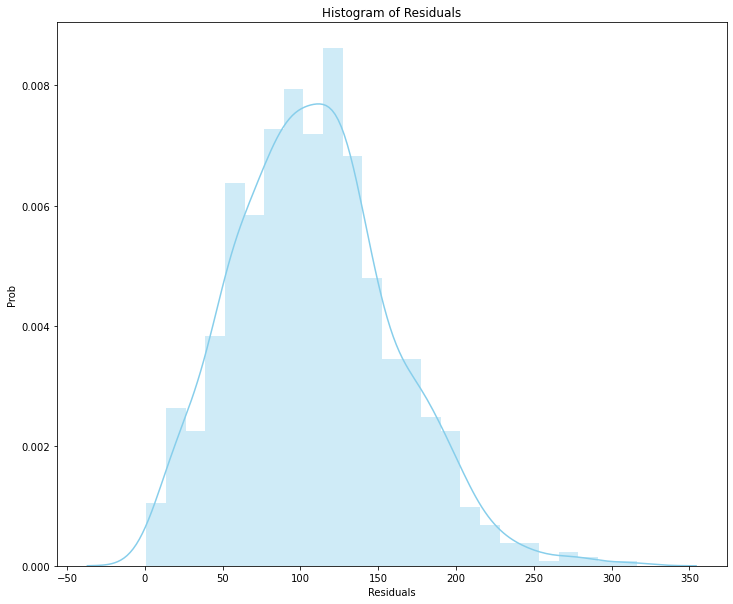

In [1287]:
plt.figure(figsize=(12,10))
sns.distplot(data2.residuals, color='skyblue')
plt.title('Histogram of Residuals')
plt.ylabel('Prob')
plt.xlabel('Residuals')
plt.show()

# 

# 

# 

#  2_Linearity

**Make scatter plots,**

**x = each continuous predictor
one by one**

**y = response variable**

**see whether a linear relationship is visible?**

In [1288]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LandContour          2073 non-null   object 
 3   Neighborhood         2073 non-null   object 
 4   Condition1           2073 non-null   object 
 5   Condition2           2073 non-null   object 
 6   Dwelling_Type        2073 non-null   object 
 7   HouseStyle           2073 non-null   object 
 8   OverallQual          2073 non-null   int64  
 9   OverallCond          2073 non-null   int64  
 10  Exterior2nd          2073 non-null   object 
 11  ExterQual            2073 non-null   object 
 12  BsmtQual             2073 non-null   object 
 13  BsmtCond             2073 non-null   object 
 14  BsmtExposure         2073 non-null   object 
 15  BsmtFinType1         2073 non-null   o

In [1289]:
numerical_data2 = data2.select_dtypes(include=np.number)
print(len(numerical_data2.columns))
numerical_data2.columns

15


Index(['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea',
       'BsmtFullBath', 'HalfBath', 'KitchenAbvGr', 'Fireplaces', 'GarageCars',
       'GarageArea', 'Property_Sale_Price', 'predict', 'residuals', 'obsno'],
      dtype='object')

In [1290]:
categorical_data2 = data2.select_dtypes(include = 'O')
print(len(categorical_data2.columns))
categorical_data2.columns

20


Index(['Zone_Class', 'LandContour', 'Neighborhood', 'Condition1', 'Condition2',
       'Dwelling_Type', 'HouseStyle', 'Exterior2nd', 'ExterQual', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'KitchenQual', 'Functional',
       'GarageType', 'GarageFinish', 'GarageQual', 'SaleType',
       'SaleCondition'],
      dtype='object')

# 

In [1291]:
### With Good Predictors

a = ['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 'HalfBath', 'KitchenAbvGr', 
     'Fireplaces', 'GarageCars', 'GarageArea', 'Property_Sale_Price', 'predict', 'residuals', 'obsno']

In [1292]:
data2_pp = data2[a]

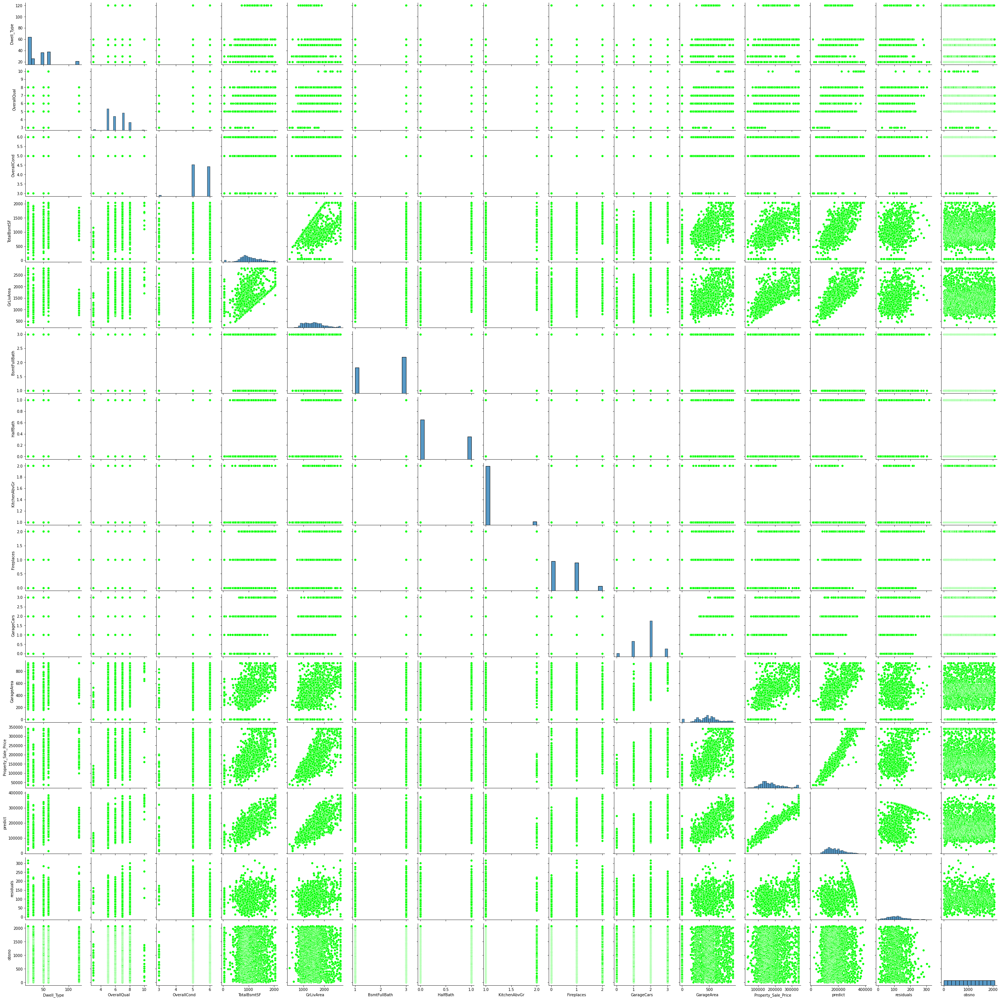

In [1293]:
sns.pairplot(data2_pp ,palette = sns.color_palette('Set3_r'), markers = ['>'], plot_kws = {'facecolors':'#00FF00'})

# 

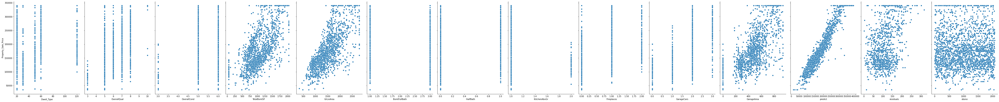

In [1294]:
# visualize the relationship between the features and the response using scatterplots

sns.pairplot(data2, x_vars = ['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 
                              'HalfBath', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'GarageArea', 'predict', 'residuals',
                              'obsno'], 
             y_vars = 'Property_Sale_Price', size = 7, aspect = 0.7)

# 

# 

# 

# 3_Independence of observation
**Make scatter plot,**

**x = obsno**

**y = residuals**

**if, no geometric pattern is visible,
assumption of INDEPENDENCE OF ERROR is holding good and 
not violated**

Text(0.5, 1.0, 'Scatterplot of obsno vs residuals')

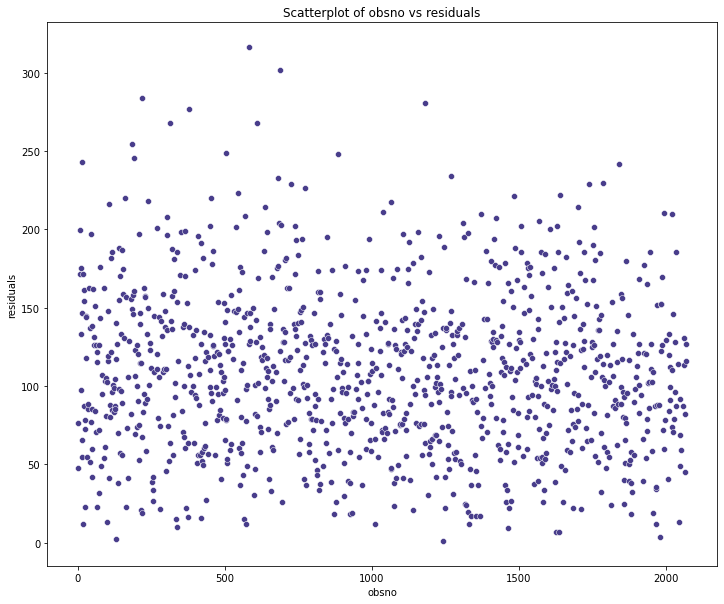

In [1295]:
plt.figure(figsize=(12,10))
sns.scatterplot(x = data2.obsno, y = data2.residuals, palette='spring_r', color='darkslateblue', markers='+')
plt.title('Scatterplot of obsno vs residuals')

# 

# 

# 

# 4_Constant Error Variance [homoscadasticity]

**Make scatter plot,**

**x = predict**

**y = residuals**

**if, no geometric pattern is visible,
assumption of homoscadasticity is holding good and 
not violated**


Text(0.5, 1.0, 'Scatterplot of predict vs residuals')

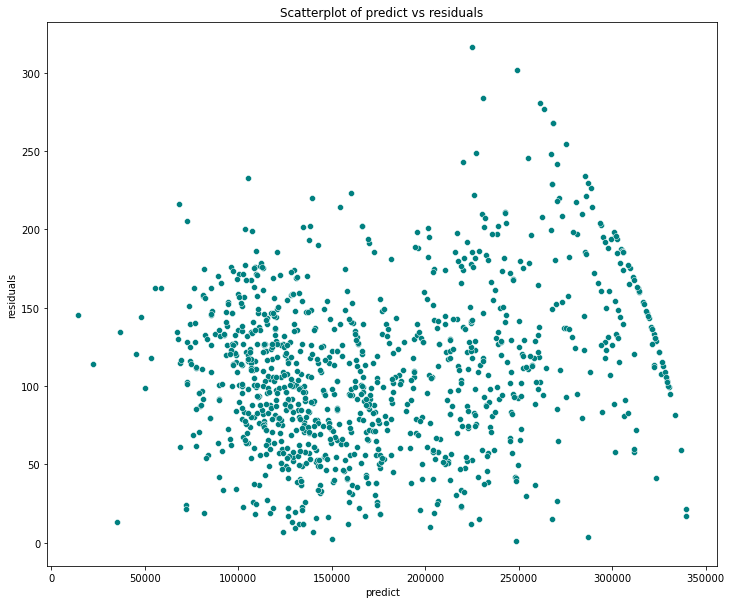

In [1296]:
plt.figure(figsize=(12,10))
sns.scatterplot(x = data2.predict, y = data2.residuals, palette='spring', color='teal')
plt.title('Scatterplot of predict vs residuals')

# 

# 

# 

# 

# 5_VIF

In [1297]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LandContour          2073 non-null   object 
 3   Neighborhood         2073 non-null   object 
 4   Condition1           2073 non-null   object 
 5   Condition2           2073 non-null   object 
 6   Dwelling_Type        2073 non-null   object 
 7   HouseStyle           2073 non-null   object 
 8   OverallQual          2073 non-null   int64  
 9   OverallCond          2073 non-null   int64  
 10  Exterior2nd          2073 non-null   object 
 11  ExterQual            2073 non-null   object 
 12  BsmtQual             2073 non-null   object 
 13  BsmtCond             2073 non-null   object 
 14  BsmtExposure         2073 non-null   object 
 15  BsmtFinType1         2073 non-null   o

In [1298]:
x = data2[['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 'HalfBath', 
            'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'GarageArea']]

In [1299]:
x.columns

Index(['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea',
       'BsmtFullBath', 'HalfBath', 'KitchenAbvGr', 'Fireplaces', 'GarageCars',
       'GarageArea'],
      dtype='object')

In [1300]:
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns

In [1301]:
# calculating VIF for each feature

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
  
print(vif_data)

         feature        VIF
0     Dwell_Type   4.087129
1    OverallQual  35.242275
2    OverallCond  35.294751
3    TotalBsmtSF  13.048126
4      GrLivArea  24.222567
5   BsmtFullBath   6.411239
6       HalfBath   2.436959
7   KitchenAbvGr  23.739868
8     Fireplaces   2.695333
9     GarageCars  36.031353
10    GarageArea  32.552027


# 

# 

# 

# 6_Durbin Watson

In [1302]:
# import numpy and statsmodels for durbin watson

import numpy as np
from statsmodels.stats.stattools import durbin_watson

gfg = durbin_watson(model4.resid)


print("Durbin Watson Value :", round(gfg, 3))

Durbin Watson Value : 2.028


# 

# 

# 

# Final OLS Model (Opt)

In [1303]:
model5 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LandContour + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFullBath + HalfBath + KitchenQual + Functional + Fireplaces + GarageType + GarageFinish + GarageQual + SaleType + SaleCondition', data = data2).fit()
print(model5.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.810
Model:                             OLS   Adj. R-squared:                  0.806
Method:                  Least Squares   F-statistic:                     201.1
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:40:32   Log-Likelihood:                -24257.
No. Observations:                 2073   AIC:                         4.860e+04
Df Residuals:                     2029   BIC:                         4.885e+04
Df Model:                           43                                         
Covariance Type:             nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept   

# 

# 

# 

**Zone_Class**

In [1304]:
data2.Zone_Class.value_counts()

RL         1611
RM          346
FV          102
C (all)      14
Name: Zone_Class, dtype: int64

In [1305]:
data2["Zone_Class"].replace('RM', 'C (all)', inplace = True)
data2["Zone_Class"].replace('FV', 'C (all)', inplace = True)

In [1306]:
data2.Zone_Class.value_counts()

RL         1611
C (all)     462
Name: Zone_Class, dtype: int64

# 

**Condition1**

In [1307]:
data2.Condition1.value_counts()

Norm     1833
Feedr     191
PosN       49
Name: Condition1, dtype: int64

In [1308]:
data2["Condition1"].replace('Norm', 'Feedr', inplace = True)

In [1309]:
data2.Condition1.value_counts()

Feedr    2024
PosN       49
Name: Condition1, dtype: int64

# 

**Exterior2nd**

In [1310]:
data2.Exterior2nd.value_counts()

VinylSd    864
AsbShng    633
MetalSd    576
Name: Exterior2nd, dtype: int64

In [1311]:
data2["Exterior2nd"].replace('MetalSd', 'AsbShng', inplace = True)

In [1312]:
data2.Exterior2nd.value_counts()

AsbShng    1209
VinylSd     864
Name: Exterior2nd, dtype: int64

# 

# 

In [1313]:
model6 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + Neighborhood + Condition1 + Dwelling_Type + HouseStyle + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFullBath + HalfBath + KitchenQual + Fireplaces + GarageType + GarageQual + SaleType + SaleCondition', data = data2).fit()
print(model6.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.808
Model:                             OLS   Adj. R-squared:                  0.805
Method:                  Least Squares   F-statistic:                     260.2
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:40:32   Log-Likelihood:                -24267.
No. Observations:                 2073   AIC:                         4.860e+04
Df Residuals:                     2039   BIC:                         4.879e+04
Df Model:                           33                                         
Covariance Type:             nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept     

# 

# 

# MSE

In [1314]:
from sklearn.metrics import mean_squared_error

MSE = mean_squared_error(data2.Property_Sale_Price ,data2.predict)
print("Mean Squared Error (MSE) :", round(MSE, 3))

Mean Squared Error (MSE) : 401580594.24


# 

# RMSE

In [1315]:
RMSE = np.sqrt(MSE)
print("Root Mean Squared Error (RMSE) :", round(RMSE, 3))

Root Mean Squared Error (RMSE) : 20039.476


# 

# 

# 

# 

# 

# As Per Vinod Sir's Script

In [1316]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          2073 non-null   float64
 3   LotArea              2073 non-null   float64
 4   Road_Type            2073 non-null   object 
 5   Alley                2073 non-null   object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

In [1317]:
data3 = data.copy()

In [1318]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          2073 non-null   float64
 3   LotArea              2073 non-null   float64
 4   Road_Type            2073 non-null   object 
 5   Alley                2073 non-null   object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

# 

In [1319]:
# Split DAta into train and test in approx 80:20 ratio

trn = data3.iloc[0 : 1660, ]
trn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1660 entries, 0 to 1659
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           1660 non-null   int64  
 1   Zone_Class           1660 non-null   object 
 2   LotFrontage          1660 non-null   float64
 3   LotArea              1660 non-null   float64
 4   Road_Type            1660 non-null   object 
 5   Alley                1660 non-null   object 
 6   Property_Shape       1660 non-null   object 
 7   LandContour          1660 non-null   object 
 8   Utilities            1660 non-null   object 
 9   LotConfig            1660 non-null   object 
 10  LandSlope            1660 non-null   object 
 11  Neighborhood         1660 non-null   object 
 12  Condition1           1660 non-null   object 
 13  Condition2           1660 non-null   object 
 14  Dwelling_Type        1660 non-null   object 
 15  HouseStyle           1660 non-null   o

In [1320]:
test = data3.iloc[1660: , ]
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 1660 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           413 non-null    int64  
 1   Zone_Class           413 non-null    object 
 2   LotFrontage          413 non-null    float64
 3   LotArea              413 non-null    float64
 4   Road_Type            413 non-null    object 
 5   Alley                413 non-null    object 
 6   Property_Shape       413 non-null    object 
 7   LandContour          413 non-null    object 
 8   Utilities            413 non-null    object 
 9   LotConfig            413 non-null    object 
 10  LandSlope            413 non-null    object 
 11  Neighborhood         413 non-null    object 
 12  Condition1           413 non-null    object 
 13  Condition2           413 non-null    object 
 14  Dwelling_Type        413 non-null    object 
 15  HouseStyle           413 non-null   

# 

# 

# 

# OLS Model With All Columns

In [1321]:
model_1 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LotFrontage + LotArea + Road_Type + Alley + Property_Shape + LandContour + Utilities + LotConfig + LandSlope + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + OverallQual + OverallCond + YearBuilt + YearRemodAdd + RoofStyle + RoofMatl + Exterior1st + Exterior2nd + MasVnrType + MasVnrArea + ExterQual + ExterCond + Foundation + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFinSF1 + BsmtFinType2 + BsmtFinSF2 + BsmtUnfSF + TotalBsmtSF + Heating + HeatingQC + CentralAir + Electrical + FirstFlrSF + SecondFlrSF + LowQualFinSF + GrLivArea + BsmtFullBath + BsmtHalfBath + FullBath + HalfBath + BedroomAbvGr + KitchenAbvGr + KitchenQual + TotRmsAbvGrd + Functional + Fireplaces + FireplaceQu + GarageType + GarageYrBlt + GarageFinish + GarageCars + GarageArea + GarageQual + GarageCond + PavedDrive + WoodDeckSF + OpenPorchSF + EnclosedPorch + ThrSsnPorch + ScreenPorch + PoolArea + PoolQC + Fence + MiscFeature + MiscVal + MoSold + YrSold + SaleType + SaleCondition', data = trn).fit()
print(model_1.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.923
Model:                             OLS   Adj. R-squared:                  0.917
Method:                  Least Squares   F-statistic:                     150.1
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:40:36   Log-Likelihood:                -18676.
No. Observations:                 1660   AIC:                         3.760e+04
Df Residuals:                     1536   BIC:                         3.827e+04
Df Model:                          123                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercep

# 

# 

# 

# OLS Model With Good predictor Columns

In [1322]:
model_2 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + Road_Type + Alley + Property_Shape + LandContour + LotConfig + Neighborhood + Condition1 + Condition2 + Dwelling_Type + HouseStyle + OverallQual + OverallCond + RoofStyle + RoofMatl + Exterior1st + Exterior2nd + MasVnrType + ExterQual + ExterCond + Foundation + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFinType2 + TotalBsmtSF + Heating + HeatingQC + CentralAir + Electrical + FirstFlrSF + GrLivArea + BsmtFullBath + FullBath + HalfBath + BedroomAbvGr + KitchenAbvGr + KitchenQual + Functional + Fireplaces + FireplaceQu + GarageType + GarageFinish + GarageCars + GarageArea + GarageQual + GarageCond + PavedDrive + Fence + MiscFeature + SaleType + SaleCondition', data = trn).fit()
print(model_2.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.912
Model:                             OLS   Adj. R-squared:                  0.907
Method:                  Least Squares   F-statistic:                     170.5
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:40:36   Log-Likelihood:                -18789.
No. Observations:                 1660   AIC:                         3.777e+04
Df Residuals:                     1564   BIC:                         3.829e+04
Df Model:                           95                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercep

# 

# 

# 

# OLS Model With P < 0.05 Columns 

**Condition2**

In [1323]:
trn["Condition2"].value_counts()

Norm     1643
Feedr      14
PosN        3
Name: Condition2, dtype: int64

In [1324]:
trn["Condition2"].replace('Norm', 'Feedr', inplace = True)

In [1325]:
trn["Condition2"].value_counts()

Feedr    1657
PosN        3
Name: Condition2, dtype: int64

# 

In [1326]:
test["Condition2"].value_counts()

Norm     411
Feedr      2
Name: Condition2, dtype: int64

In [1327]:
test["Condition2"].replace('Norm', 'Feedr', inplace = True)

In [1328]:
test["Condition2"].value_counts()

Feedr    413
Name: Condition2, dtype: int64

# 

# 

**Exterior2nd**

In [1329]:
trn["Exterior2nd"].value_counts()

VinylSd    685
MetalSd    470
HdBoard    463
AsbShng     42
Name: Exterior2nd, dtype: int64

In [1330]:
trn["Exterior2nd"].replace('HdBoard', 'AsbShng', inplace = True)

In [1331]:
trn["Exterior2nd"].value_counts()

VinylSd    685
AsbShng    505
MetalSd    470
Name: Exterior2nd, dtype: int64

# 

In [1332]:
test["Exterior2nd"].value_counts()

VinylSd    179
HdBoard    118
MetalSd    106
AsbShng     10
Name: Exterior2nd, dtype: int64

In [1333]:
test["Exterior2nd"].replace('HdBoard', 'AsbShng', inplace = True)

In [1334]:
test["Exterior2nd"].value_counts()

VinylSd    179
AsbShng    128
MetalSd    106
Name: Exterior2nd, dtype: int64

# 

# 

**ExterQual**

In [1335]:
trn["ExterQual"].value_counts()

TA    1029
Gd     555
Ex      59
Fa      17
Name: ExterQual, dtype: int64

In [1336]:
trn["ExterQual"].replace('Gd', 'Ex', inplace = True)
trn["ExterQual"].replace('Fa', 'Ex', inplace = True)

In [1337]:
trn["ExterQual"].value_counts()

TA    1029
Ex     631
Name: ExterQual, dtype: int64

# 

In [1338]:
test["ExterQual"].value_counts()

TA    243
Gd    151
Ex     17
Fa      2
Name: ExterQual, dtype: int64

In [1339]:
test["ExterQual"].replace('Gd', 'Ex', inplace = True)
test["ExterQual"].replace('Fa', 'Ex', inplace = True)

In [1340]:
test["ExterQual"].value_counts()

TA    243
Ex    170
Name: ExterQual, dtype: int64

# 

# 

**BsmtCond**

In [1341]:
trn["BsmtCond"].value_counts()

TA             1491
No basement      93
Gd               76
Name: BsmtCond, dtype: int64

In [1342]:
trn["BsmtCond"].replace('TA','Gd', inplace = True)

In [1343]:
trn["BsmtCond"].value_counts()

Gd             1567
No basement      93
Name: BsmtCond, dtype: int64

# 

In [1344]:
test["BsmtCond"].value_counts()

TA             360
No basement     29
Gd              24
Name: BsmtCond, dtype: int64

In [1345]:
test["BsmtCond"].replace('TA','Gd', inplace = True)

In [1346]:
test["BsmtCond"].value_counts()

Gd             384
No basement     29
Name: BsmtCond, dtype: int64

# 

# 

**BsmtExposure**

In [1347]:
trn["BsmtExposure"].value_counts()

No             1095
Av              378
Gd              144
No Basement      43
Name: BsmtExposure, dtype: int64

In [1348]:
trn["BsmtExposure"].replace('No Basement', 'Av', inplace = True)

In [1349]:
trn["BsmtExposure"].value_counts()

No    1095
Av     421
Gd     144
Name: BsmtExposure, dtype: int64

# 

In [1350]:
test["BsmtExposure"].value_counts()

No             254
Av             104
Gd              37
No Basement     18
Name: BsmtExposure, dtype: int64

In [1351]:
test["BsmtExposure"].replace('No Basement', 'Av', inplace = True)

In [1352]:
test["BsmtExposure"].value_counts()

No    254
Av    122
Gd     37
Name: BsmtExposure, dtype: int64

# 

# 

**BsmtFinType1**

In [1353]:
trn["BsmtFinType1"].value_counts()

Unf            750
GLQ            472
BLQ            396
No basement     42
Name: BsmtFinType1, dtype: int64

In [1354]:
trn["BsmtFinType1"].replace('Unf', 'BLQ', inplace = True)
trn["BsmtFinType1"].replace('No basement', 'BLQ', inplace = True)

In [1355]:
trn["BsmtFinType1"].value_counts()

BLQ    1188
GLQ     472
Name: BsmtFinType1, dtype: int64

# 

In [1356]:
test["BsmtFinType1"].value_counts()

Unf            173
GLQ            127
BLQ             96
No basement     17
Name: BsmtFinType1, dtype: int64

In [1357]:
test["BsmtFinType1"].replace('Unf', 'BLQ', inplace = True)
test["BsmtFinType1"].replace('No basement', 'BLQ', inplace = True)

In [1358]:
test["BsmtFinType1"].value_counts()

BLQ    286
GLQ    127
Name: BsmtFinType1, dtype: int64

# 

# 

**HeatingQC**

In [1359]:
trn["HeatingQC"].value_counts()

Ex    837
TA    488
Gd    275
Fa     60
Name: HeatingQC, dtype: int64

In [1360]:
trn["HeatingQC"].replace('Gd', 'Ex', inplace = True)
trn["HeatingQC"].replace('Fa', 'Ex', inplace = True)

In [1361]:
trn["HeatingQC"].value_counts()

Ex    1172
TA     488
Name: HeatingQC, dtype: int64

# 

In [1362]:
test["HeatingQC"].value_counts()

Ex    208
TA    130
Gd     66
Fa      9
Name: HeatingQC, dtype: int64

In [1363]:
test["HeatingQC"].replace('Gd', 'Ex', inplace = True)
test["HeatingQC"].replace('Fa', 'Ex', inplace = True)

In [1364]:
test["HeatingQC"].value_counts()

Ex    283
TA    130
Name: HeatingQC, dtype: int64

# 

# 

**GarageType**

In [1365]:
trn["GarageType"].value_counts()

Attchd       989
Detchd       465
No Garage    103
BuiltIn      103
Name: GarageType, dtype: int64

In [1366]:
trn["GarageType"].replace('No Garage', 'Attchd', inplace = True)
trn["GarageType"].replace('BuiltIn', 'Attchd', inplace = True)

In [1367]:
trn["GarageType"].value_counts()

Attchd    1195
Detchd     465
Name: GarageType, dtype: int64

# 

In [1368]:
test["GarageType"].value_counts()

Attchd       263
Detchd       107
No Garage     22
BuiltIn       21
Name: GarageType, dtype: int64

In [1369]:
test["GarageType"].replace('No Garage', 'Attchd', inplace = True)
test["GarageType"].replace('BuiltIn', 'Attchd', inplace = True)

In [1370]:
test["GarageType"].value_counts()

Attchd    306
Detchd    107
Name: GarageType, dtype: int64

# 

# 

**GarageFinish**

In [1371]:
trn["GarageFinish"].value_counts()

Unf          690
RFn          479
Fin          399
No Garage     92
Name: GarageFinish, dtype: int64

In [1372]:
trn["GarageFinish"].replace('Unf', 'Fin', inplace = True)

In [1373]:
trn["GarageFinish"].value_counts()

Fin          1089
RFn           479
No Garage      92
Name: GarageFinish, dtype: int64

# 

In [1374]:
test["GarageFinish"].value_counts()

Unf          167
RFn          126
Fin           99
No Garage     21
Name: GarageFinish, dtype: int64

In [1375]:
test["GarageFinish"].replace('Unf', 'Fin', inplace = True)

In [1376]:
test["GarageFinish"].value_counts()

Fin          266
RFn          126
No Garage     21
Name: GarageFinish, dtype: int64

# 

# 

**SaleType**

In [1377]:
trn["SaleType"].value_counts()

WD     1439
New     143
COD      78
Name: SaleType, dtype: int64

In [1378]:
trn["SaleType"].replace('WD', 'COD', inplace = True)

In [1379]:
trn["SaleType"].value_counts()

COD    1517
New     143
Name: SaleType, dtype: int64

# 

In [1380]:
test["SaleType"].value_counts()

WD     358
New     36
COD     19
Name: SaleType, dtype: int64

In [1381]:
test["SaleType"].replace('WD', 'COD', inplace = True)

In [1382]:
test["SaleType"].value_counts()

COD    377
New     36
Name: SaleType, dtype: int64

# 

# 

**SaleCondition**

In [1383]:
trn["SaleCondition"].value_counts()

Normal     1375
Abnorml     144
Partial     141
Name: SaleCondition, dtype: int64

In [1384]:
trn["SaleCondition"].replace('Partial', 'Abnorml', inplace = True)

In [1385]:
trn["SaleCondition"].value_counts()

Normal     1375
Abnorml     285
Name: SaleCondition, dtype: int64

# 

In [1386]:
test["SaleCondition"].value_counts()

Normal     339
Abnorml     40
Partial     34
Name: SaleCondition, dtype: int64

In [1387]:
test["SaleCondition"].replace('Partial', 'Abnorml', inplace = True)

In [1388]:
test["SaleCondition"].value_counts()

Normal     339
Abnorml     74
Name: SaleCondition, dtype: int64

# 

# 

# 

# 

In [1389]:
model_3 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LandContour + Neighborhood + Condition1 + Condition2 + Dwelling_Type + OverallQual + OverallCond + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + TotalBsmtSF + GrLivArea + BsmtFullBath + HalfBath + KitchenAbvGr + KitchenQual + Functional + Fireplaces + GarageType + GarageFinish + GarageCars + GarageArea + GarageQual + SaleType + SaleCondition', data = trn).fit()
print(model_3.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.907
Model:                             OLS   Adj. R-squared:                  0.905
Method:                  Least Squares   F-statistic:                     336.4
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:40:38   Log-Likelihood:                -18830.
No. Observations:                 1660   AIC:                         3.776e+04
Df Residuals:                     1612   BIC:                         3.802e+04
Df Model:                           47                                         
Covariance Type:             nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept   

# 

# 

In [1390]:
model_4 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LandContour + Neighborhood + Condition1 + Condition2 + Dwelling_Type + OverallQual + OverallCond + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + TotalBsmtSF + GrLivArea + BsmtFullBath + KitchenAbvGr + KitchenQual + Functional + Fireplaces + GarageType + GarageFinish + GarageCars + GarageArea + GarageQual + SaleType + SaleCondition', data = trn).fit()
print(model_4.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.907
Model:                             OLS   Adj. R-squared:                  0.905
Method:                  Least Squares   F-statistic:                     343.2
Date:                 Wed, 29 Dec 2021   Prob (F-statistic):               0.00
Time:                         09:40:39   Log-Likelihood:                -18832.
No. Observations:                 1660   AIC:                         3.776e+04
Df Residuals:                     1613   BIC:                         3.801e+04
Df Model:                           46                                         
Covariance Type:             nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept   

# 

# 

# 

# Final OLS Model

In [1391]:
trn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1660 entries, 0 to 1659
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           1660 non-null   int64  
 1   Zone_Class           1660 non-null   object 
 2   LotFrontage          1660 non-null   float64
 3   LotArea              1660 non-null   float64
 4   Road_Type            1660 non-null   object 
 5   Alley                1660 non-null   object 
 6   Property_Shape       1660 non-null   object 
 7   LandContour          1660 non-null   object 
 8   Utilities            1660 non-null   object 
 9   LotConfig            1660 non-null   object 
 10  LandSlope            1660 non-null   object 
 11  Neighborhood         1660 non-null   object 
 12  Condition1           1660 non-null   object 
 13  Condition2           1660 non-null   object 
 14  Dwelling_Type        1660 non-null   object 
 15  HouseStyle           1660 non-null   o

# 

In [1392]:
trn1 = trn[['Dwell_Type', 'Zone_Class', 'LandContour', 'Neighborhood', 'Condition1', 'Condition2', 'Dwelling_Type',
                   'OverallQual', 'OverallCond', 'Exterior2nd', 'ExterQual', 'BsmtQual', 'BsmtCond',
                   'BsmtExposure', 'BsmtFinType1', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 'KitchenAbvGr',
                   'KitchenQual', 'Functional', 'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageArea',
                   'GarageQual', 'SaleType', 'SaleCondition', 'Property_Sale_Price']]
trn1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1660 entries, 0 to 1659
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           1660 non-null   int64  
 1   Zone_Class           1660 non-null   object 
 2   LandContour          1660 non-null   object 
 3   Neighborhood         1660 non-null   object 
 4   Condition1           1660 non-null   object 
 5   Condition2           1660 non-null   object 
 6   Dwelling_Type        1660 non-null   object 
 7   OverallQual          1660 non-null   int64  
 8   OverallCond          1660 non-null   int64  
 9   Exterior2nd          1660 non-null   object 
 10  ExterQual            1660 non-null   object 
 11  BsmtQual             1660 non-null   object 
 12  BsmtCond             1660 non-null   object 
 13  BsmtExposure         1660 non-null   object 
 14  BsmtFinType1         1660 non-null   object 
 15  TotalBsmtSF          1660 non-null   f

In [1393]:
test1 = test[['Dwell_Type', 'Zone_Class', 'LandContour', 'Neighborhood', 'Condition1', 'Condition2', 'Dwelling_Type',
                   'OverallQual', 'OverallCond', 'Exterior2nd', 'ExterQual', 'BsmtQual', 'BsmtCond',
                   'BsmtExposure', 'BsmtFinType1', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 'KitchenAbvGr',
                   'KitchenQual', 'Functional', 'Fireplaces', 'GarageType', 'GarageFinish', 'GarageCars', 'GarageArea',
                   'GarageQual', 'SaleType', 'SaleCondition', 'Property_Sale_Price']]
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 1660 to 2072
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           413 non-null    int64  
 1   Zone_Class           413 non-null    object 
 2   LandContour          413 non-null    object 
 3   Neighborhood         413 non-null    object 
 4   Condition1           413 non-null    object 
 5   Condition2           413 non-null    object 
 6   Dwelling_Type        413 non-null    object 
 7   OverallQual          413 non-null    int64  
 8   OverallCond          413 non-null    int64  
 9   Exterior2nd          413 non-null    object 
 10  ExterQual            413 non-null    object 
 11  BsmtQual             413 non-null    object 
 12  BsmtCond             413 non-null    object 
 13  BsmtExposure         413 non-null    object 
 14  BsmtFinType1         413 non-null    object 
 15  TotalBsmtSF          413 non-null   

# 

**Test data in two parts**

In [1394]:
x_test = test1.loc[:, test1.columns != 'Property_Sale_Price']
x_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413 entries, 1660 to 2072
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Dwell_Type     413 non-null    int64  
 1   Zone_Class     413 non-null    object 
 2   LandContour    413 non-null    object 
 3   Neighborhood   413 non-null    object 
 4   Condition1     413 non-null    object 
 5   Condition2     413 non-null    object 
 6   Dwelling_Type  413 non-null    object 
 7   OverallQual    413 non-null    int64  
 8   OverallCond    413 non-null    int64  
 9   Exterior2nd    413 non-null    object 
 10  ExterQual      413 non-null    object 
 11  BsmtQual       413 non-null    object 
 12  BsmtCond       413 non-null    object 
 13  BsmtExposure   413 non-null    object 
 14  BsmtFinType1   413 non-null    object 
 15  TotalBsmtSF    413 non-null    float64
 16  GrLivArea      413 non-null    float64
 17  BsmtFullBath   413 non-null    int64  
 18  Kitche

# 

In [1395]:
y_test = test1.loc[:, test1.columns == 'Property_Sale_Price']
y_test

,Property_Sale_Price
1660,179600.0
1661,129000.0
1662,157900.0
1663,240000.0
1664,112000.0
...,...
2068,214000.0
2069,150000.0
2070,143000.0
2071,137500.0


**Predictions on test data**

In [1396]:
pred_1 = model_4.predict(x_test)
pred_1

1660    203460.097617
1661    137260.940691
1662    133646.468191
1663    237256.503205
1664    104467.404194
            ...      
2068    228354.245199
2069    130844.618524
2070    159772.247672
2071    175297.396341
2072    167438.123668
Length: 413, dtype: float64

# 

**Residuals**

In [1397]:
resd_1 = y_test.iloc[:, 0] - pred_1
resd_1

1660   -23860.097617
1661    -8260.940691
1662    24253.531809
1663     2743.496795
1664     7532.595806
            ...     
2068   -14354.245199
2069    19155.381476
2070   -16772.247672
2071   -37797.396341
2072   -42538.123668
Length: 413, dtype: float64

In [1398]:
x_test['pred_1'] = pred_1

In [1399]:
x_test['resd_1'] = resd_1

In [1400]:
x_test

,Dwell_Type,Zone_Class,LandContour,Neighborhood,Condition1,Condition2,Dwelling_Type,OverallQual,OverallCond,Exterior2nd,...,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,SaleType,SaleCondition,pred_1,resd_1
1660,20,RL,Lvl,CollgCr,Norm,Feedr,TwnhsE,8,6,VinylSd,...,0,Attchd,RFn,2,626.0,TA,COD,Normal,203460.097617,-23860.097617
1661,50,RL,Lvl,NAmes,Norm,Feedr,TwnhsE,8,6,VinylSd,...,0,Detchd,Fin,1,240.0,TA,COD,Normal,137260.940691,-8260.940691
1662,20,RL,Lvl,NAmes,Norm,Feedr,TwnhsE,5,6,AsbShng,...,0,Attchd,Fin,1,312.0,TA,COD,Normal,133646.468191,24253.531809
1663,60,RL,Lvl,CollgCr,Norm,Feedr,TwnhsE,7,5,VinylSd,...,1,Attchd,RFn,2,556.0,TA,COD,Normal,237256.503205,2743.496795
1664,50,RL,Lvl,Edwards,Norm,Feedr,TwnhsE,8,6,AsbShng,...,0,Detchd,Fin,1,384.0,No Garage,COD,Normal,104467.404194,7532.595806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2068,60,RL,Lvl,CollgCr,PosN,Feedr,TwnhsE,8,6,VinylSd,...,1,Attchd,RFn,2,390.0,TA,COD,Normal,228354.245199,-14354.245199
2069,50,RL,Lvl,Edwards,Norm,Feedr,Duplex,6,5,MetalSd,...,0,Attchd,No Garage,0,0.0,No Garage,COD,Abnorml,130844.618524,19155.381476
2070,50,RL,HLS,NAmes,Norm,Feedr,Duplex,5,6,AsbShng,...,0,Attchd,Fin,2,576.0,TA,COD,Normal,159772.247672,-16772.247672
2071,20,RL,Lvl,Somerst,Norm,Feedr,TwnhsE,7,6,AsbShng,...,1,Detchd,RFn,2,525.0,TA,COD,Abnorml,175297.396341,-37797.396341


# 

# 

# 1 _Normality

**make histogram of residuals**

**And check whether its approximately
bell-shaped, symmetrical**

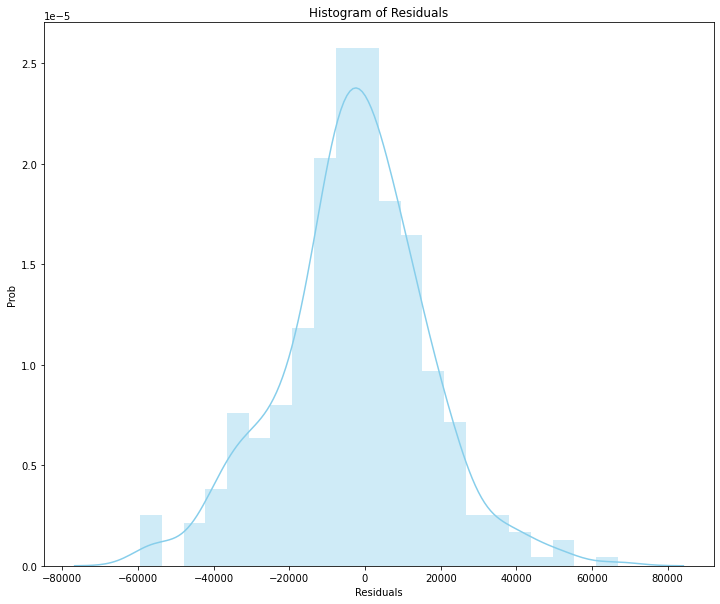

In [1401]:
plt.figure(figsize=(12,10))
sns.distplot(x_test.resd_1, color='skyblue')
plt.title('Histogram of Residuals')
plt.ylabel('Prob')
plt.xlabel('Residuals')
plt.show()

# 

#  2_Linearity

**Make scatter plots,**

**x = each continuous predictor
one by one**

**y = response variable**

**see whether a linear relationship is visible?**

In [1402]:
trn1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1660 entries, 0 to 1659
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           1660 non-null   int64  
 1   Zone_Class           1660 non-null   object 
 2   LandContour          1660 non-null   object 
 3   Neighborhood         1660 non-null   object 
 4   Condition1           1660 non-null   object 
 5   Condition2           1660 non-null   object 
 6   Dwelling_Type        1660 non-null   object 
 7   OverallQual          1660 non-null   int64  
 8   OverallCond          1660 non-null   int64  
 9   Exterior2nd          1660 non-null   object 
 10  ExterQual            1660 non-null   object 
 11  BsmtQual             1660 non-null   object 
 12  BsmtCond             1660 non-null   object 
 13  BsmtExposure         1660 non-null   object 
 14  BsmtFinType1         1660 non-null   object 
 15  TotalBsmtSF          1660 non-null   f

In [1403]:
numerical_trn1 = trn1.select_dtypes(include=np.number)
print(len(numerical_trn1.columns))
numerical_trn1.columns

11


Index(['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea',
       'BsmtFullBath', 'KitchenAbvGr', 'Fireplaces', 'GarageCars',
       'GarageArea', 'Property_Sale_Price'],
      dtype='object')

In [1404]:
categorical_trn1 = trn1.select_dtypes(include = 'O')
print(len(categorical_trn1.columns))
categorical_trn1.columns

19


Index(['Zone_Class', 'LandContour', 'Neighborhood', 'Condition1', 'Condition2',
       'Dwelling_Type', 'Exterior2nd', 'ExterQual', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'KitchenQual', 'Functional',
       'GarageType', 'GarageFinish', 'GarageQual', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [1405]:
### With Good Predictors

a = ['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 'KitchenAbvGr', 
     'Fireplaces', 'GarageCars', 'GarageArea', 'Property_Sale_Price']

In [1406]:
trn1_pp = trn1[a]

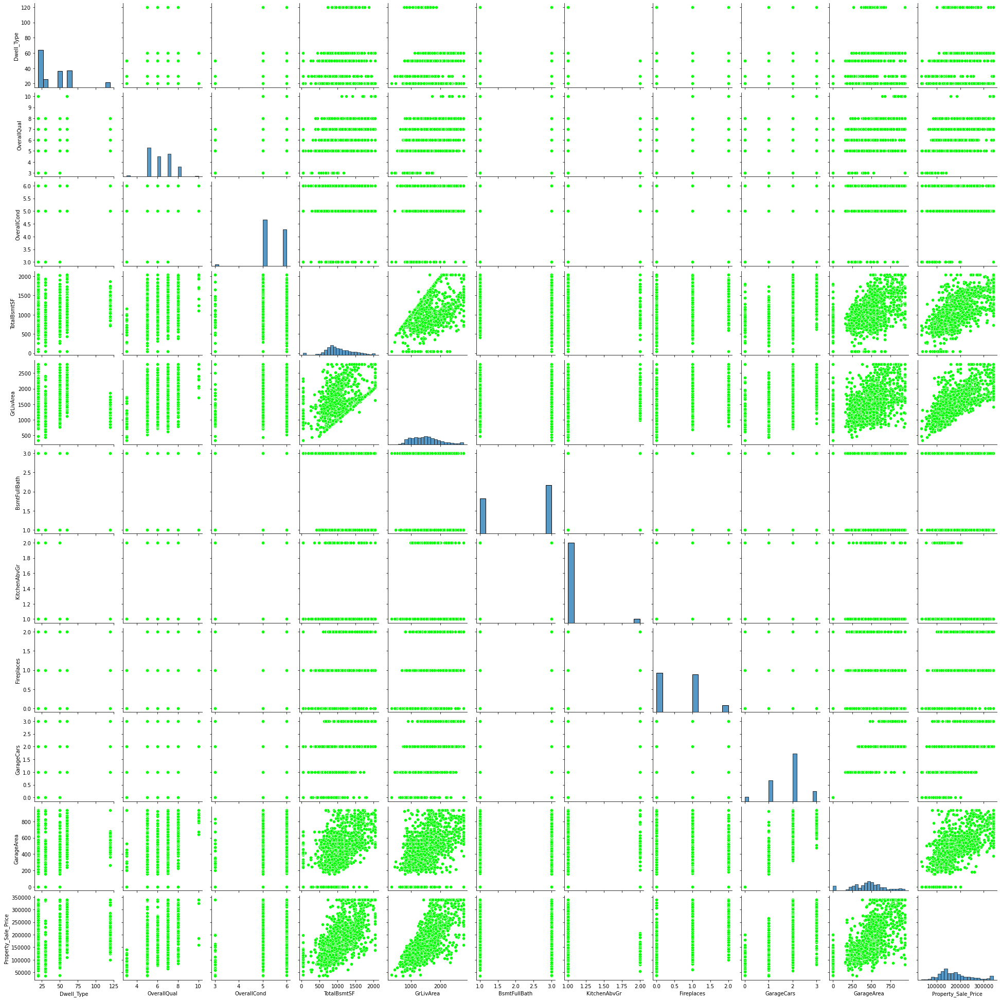

In [1407]:
sns.pairplot(trn1_pp ,palette = sns.color_palette('Set3_r'), markers = ['>'], plot_kws = {'facecolors':'#00FF00'})

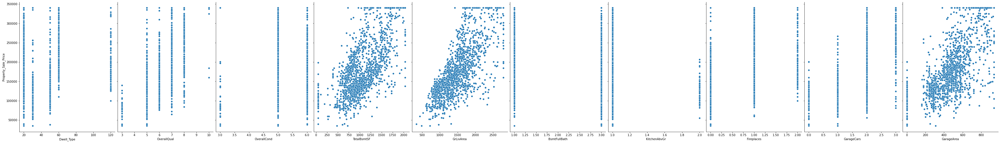

In [1408]:
# visualize the relationship between the features and the response using scatterplots

sns.pairplot(trn1, x_vars = ['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath',
                             'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'GarageArea'],
             y_vars = 'Property_Sale_Price', size=7, aspect=0.7)

# 

# 3_Independence of observation
**Make scatter plot,**

**x = obsno**

**y = residuals**

**if, no geometric pattern is visible,
assumption of INDEPENDENCE OF ERROR is holding good and 
not violated**

In [1409]:
# Now We Create Observation Number

obs = np.arange(413) 
obs 

x_test['obsno'] = obs # craete a new variable/column 'obsno' in yr data

Text(0.5, 1.0, 'Scatterplot of obsno vs residuals')

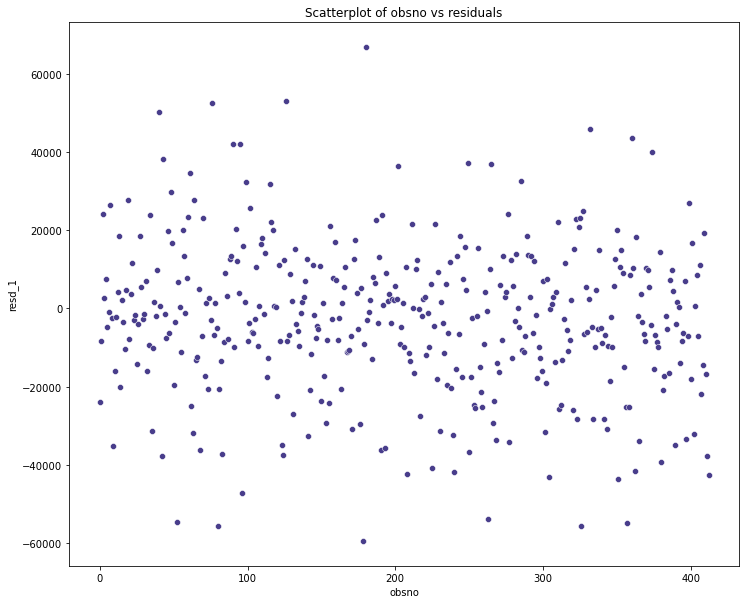

In [1410]:
plt.figure(figsize=(12,10))
sns.scatterplot(x = x_test.obsno, y = x_test.resd_1, palette='spring_r', color='darkslateblue', markers='+')
plt.title('Scatterplot of obsno vs residuals')

# 

# 4_Constant Error Variance [homoscadasticity]

**Make scatter plot,**

**x = predict**

**y = residuals**

**if, no geometric pattern is visible,
assumption of homoscadasticity is holding good and 
not violated**

Text(0.5, 1.0, 'Scatterplot of predict vs residuals')

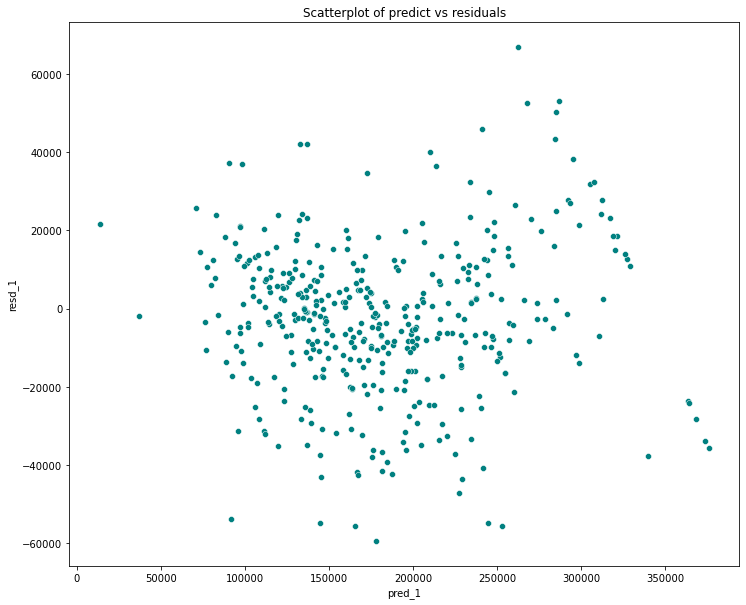

In [1411]:
plt.figure(figsize=(12,10))
sns.scatterplot(x = x_test.pred_1, y = x_test.resd_1, palette='spring', color='teal')
plt.title('Scatterplot of predict vs residuals')

# 

# 5_VIF

In [1412]:
trn1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1660 entries, 0 to 1659
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           1660 non-null   int64  
 1   Zone_Class           1660 non-null   object 
 2   LandContour          1660 non-null   object 
 3   Neighborhood         1660 non-null   object 
 4   Condition1           1660 non-null   object 
 5   Condition2           1660 non-null   object 
 6   Dwelling_Type        1660 non-null   object 
 7   OverallQual          1660 non-null   int64  
 8   OverallCond          1660 non-null   int64  
 9   Exterior2nd          1660 non-null   object 
 10  ExterQual            1660 non-null   object 
 11  BsmtQual             1660 non-null   object 
 12  BsmtCond             1660 non-null   object 
 13  BsmtExposure         1660 non-null   object 
 14  BsmtFinType1         1660 non-null   object 
 15  TotalBsmtSF          1660 non-null   f

In [1413]:
x = trn1[['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea', 'BsmtFullBath', 
            'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'GarageArea']]

In [1414]:
x.columns

Index(['Dwell_Type', 'OverallQual', 'OverallCond', 'TotalBsmtSF', 'GrLivArea',
       'BsmtFullBath', 'KitchenAbvGr', 'Fireplaces', 'GarageCars',
       'GarageArea'],
      dtype='object')

In [1415]:
vif_trn = pd.DataFrame()
vif_trn["feature"] = x.columns

In [1416]:
# calculating VIF for each feature

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_trn["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
  
print(vif_trn)

        feature        VIF
0    Dwell_Type   3.970763
1   OverallQual  40.692564
2   OverallCond  34.397226
3   TotalBsmtSF  12.557470
4     GrLivArea  19.820662
5  BsmtFullBath   6.432195
6  KitchenAbvGr  22.913320
7    Fireplaces   2.687330
8    GarageCars  36.854471
9    GarageArea  33.028765


In [ ]:
model_5 = smf.ols('Property_Sale_Price ~ Dwell_Type + Zone_Class + LandContour + Neighborhood + Condition1 + Condition2 + Dwelling_Type + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + BsmtFullBath + KitchenQual + Functional + Fireplaces + GarageType + GarageFinish + GarageQual + SaleType + SaleCondition', data = trn).fit()
print(model_5.summary())

# 

# 

**Condition1**

In [ ]:
trn['Condition1'].value_counts()

In [ ]:
trn["Condition1"].replace('Norm', 'Feedr', inplace = True)

In [ ]:
trn['Condition1'].value_counts()

# 

# 

**Exterior2nd**

In [ ]:
trn['Exterior2nd'].value_counts()

In [ ]:
trn["Exterior2nd"].replace('MetalSd', 'AsbShng', inplace = True)

In [ ]:
trn['Exterior2nd'].value_counts()

# 

# 

**BsmtExposure**

In [ ]:
trn['BsmtExposure'].value_counts()

In [ ]:
trn["BsmtExposure"].replace('No', 'Av', inplace = True)

In [ ]:
trn['BsmtExposure'].value_counts()

# 

# 

**GarageFinish**

In [ ]:
trn['GarageFinish'].value_counts()

In [ ]:
trn["GarageFinish"].replace('RFn', 'Fin', inplace = True)

In [ ]:
trn['GarageFinish'].value_counts()

# 

# 

In [ ]:
model_6 = smf.ols('Property_Sale_Price ~ Dwell_Type + Neighborhood + Condition1 + Exterior2nd + ExterQual + BsmtQual + BsmtCond + BsmtExposure + BsmtFinType1 + KitchenQual + Fireplaces + GarageType + GarageFinish + GarageQual + SaleType + SaleCondition', data = trn).fit()
print(model_6.summary())

# 

In [ ]:
x = trn1[['Dwell_Type', 'Fireplaces']]

In [ ]:
x.columns

In [ ]:
vif_trn1 = pd.DataFrame()
vif_trn1["feature"] = x.columns

In [ ]:
# calculating VIF for each feature

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_trn1["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
  
print(vif_trn1)

# 

# 6_Durbin Watson

In [ ]:
# import numpy and statsmodels for durbin watson

import numpy as np
from statsmodels.stats.stattools import durbin_watson

gfg = durbin_watson(model_6.resid)


print("Durbin Watson Value :", round(gfg, 3))

# 

# RMSE: the final verdict!

In [ ]:
se_1 = resd_1.pow(2)
se_1

In [ ]:
sse_1 = se_1.sum()
sse_1

In [ ]:
msse_1 = sse_1/len(se_1)
msse_1

In [ ]:
import math

math.sqrt(msse_1)

# 

# Plot

In [ ]:
obsno = np.arange(413) 


fig, ax = plt.subplots()
ax.plot(obsno, y_test, 'o', label='Data')
ax.plot(obsno, pred_1, 'r-', label='Predicted')
ax.legend(loc='best')